# DeepLabCut Toolbox
https://github.com/AlexEMG/DeepLabCut

Nath\*, Mathis\* et al. *Using DeepLabCut for markerless pose estimation during behavior across species*, (under revision).

This notebook demonstrates the necessary steps to use DeepLabCut for your own project.
This shows the most simple code to do so, but many of the functions have additional features, so please check out the overview & the protocol paper!

This notebook illustrates how to:
- create a project
- extract training frames
- label the frames
- plot the labeled images
- create a training set
- train a network
- evaluate a network
- analyze a novel video
- create an automatically labeled video 
- plot the trajectories

*Note*: Refine a network based after the network was trained on just a few labeled images is illustrated in "Demo-labeledexample-MouseReaching.ipynb". This demo also contains an already labeled data set and is perhaps the best starting point for brand new users.

## Create a new project

It is always good idea to keep the projects seperate. This function creates a new project with subdirectories and a basic configuration file in the user defined directory otherwise the project is created in the current working directory.

You can always add new videos to the project at any stage of the project. 

In [11]:
pwd

'V:\\Code\\Souris\\DLC_Projects\\FreeWhisking\\HF_FreeWhisking_LeftSide-Vincent-2019-06-03'

In [1]:
import deeplabcut

#### Define projects parameters

In [2]:
task='HF_FreeWhisking_LeftSide' # Enter the name of your experiment Task
experimenter='Vincent' # Enter the name of the experimenter
video=['D:\\Vincent\\vIRt32\\vIRt32_0424\\vIRt32_0424_5184_Analysis\\vIRt32_0424_5184.mp4'] # Enter the paths of your videos you want to grab frames from.

#### Configure path and add videos

In [3]:
path_config_file=deeplabcut.create_new_project(task,experimenter,video, working_directory='V:\\Code\\Souris\\DLC_Projects\\FreeWhisking\\',copy_videos=True) #change the working directory to where you want the folders created.
# The function returns the path, where your project is. 

Created "V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\videos"
Created "V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\labeled-data"
Created "V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\training-datasets"
Created "V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\dlc-models"
Copying the videos
V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\videos\vIRt32_0424_5184.mp4
Generated "V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\config.yaml"

A new project with name HF_FreeWhisking_LeftSide-Vincent-2019-06-03 is created at V:\Code\Souris\DLC_Projects\FreeWhisking and a configurable file (config.yaml) is stored there. Change the parameters in this file to adapt to your project's needs.
 Once you have changed the configuration file, use the function 'extract_frames' t

In [6]:
deeplabcut.add_new_videos('V:\\Code\\Souris\\DLC_Projects\\FreeWhisking\\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\\config.yaml',['D:\\Vincent\\vIRt34\\vIRt34_0515\\vIRt34_0515_4988.mp4','D:\\Vincent\\vIRt33\\vIRt33_0424\\vIRt33_0424_4940_Analysis\\vIRt33_0424_4940.mp4'],copy_videos=True)

Copying the videos
Copying the videos
New video was added to the project! Use the function 'extract_frames' to select frames for labeling.


In [2]:
#You could also enter this manually (e.g. if the project is already created and you want to pick up, where you stopped...)
# Enter the path of the config file that was just created from the above step (check the folder)
# path_config_file = 'V:\\Code\\Souris\\DLC_Projects\\FreeWhisking\\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\\config.yaml'

## Extract frames from videos 
A key point for a successful feature detector is to select diverse frames, which are typical for the behavior you study that should be labeled.

This function selects N frames either uniformly sampled from a particular video (or folder) (algo=='uniform'). Note: this might not yield diverse frames, if the behavior is sparsely distributed (consider using kmeans), and/or select frames manually etc.

Also make sure to get select data from different (behavioral) sessions and different animals if those vary substantially (to train an invariant feature detector).

Individual images should not be too big (i.e. < 850 x 850 pixel). Although this can be taken care of later as well, it is advisable to crop the frames, to remove unnecessary parts of the frame as much as possible.

Always check the output of cropping. If you are happy with the results proceed to labeling.

V:\ProgramData\Anaconda3\envs\dlc-windowsGPU\lib\site-packages\deeplabcut\generate_training_dataset\frame_extraction.py:100: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  cfg = yaml.load(ymlfile)


Config file read successfully.
Do you want to extract (perhaps additional) frames for video: V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\videos\vIRt32_0424_5184.mp4 ?
yes/noy


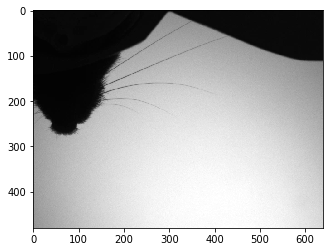

Extracting frames based on uniform ...
Uniformly extracting of frames from 0.0  seconds to 14064.4  seconds.
Do you want to extract (perhaps additional) frames for video: V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\videos\vIRt34_0515_4988.mp4 ?
yes/noy


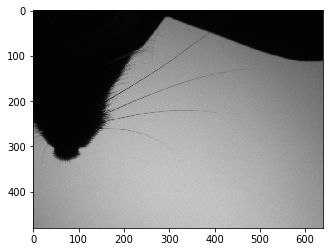

Extracting frames based on uniform ...
Uniformly extracting of frames from 0.0  seconds to 20793.16  seconds.
Do you want to extract (perhaps additional) frames for video: V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\videos\vIRt33_0424_4940.mp4 ?
yes/noy


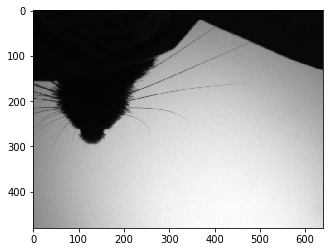

Extracting frames based on uniform ...
Uniformly extracting of frames from 0.0  seconds to 12212.52  seconds.

Frames were selected.
You can now label the frames using the function 'label_frames' (if you extracted enough frames for all videos).


In [7]:
%matplotlib inline

deeplabcut.extract_frames(path_config_file,'automatic','uniform',crop=True) #there are other ways to grab frames, such as by clustering 'kmeans'; please see the paper. 

## Label the extracted frames
Only videos in the config file can be used to extract the frames. Extracted labels for each video are stored in the project directory under the subdirectory **'labeled-data'**. Each subdirectory is named after the name of the video. The toolbox has a labeling toolbox which could be used for labeling. 

In [15]:
# to do it manually through DLC's GUI: 
%gui wx
deeplabcut.label_frames(path_config_file)

IndexError: index 0 is out of bounds for axis 0 with size 0

You can now check the labels, using 'check_labels' before proceeding. Then, you can use the function 'create_training_dataset' to create the training dataset.


In [12]:
# if labels have been generated through another process into csv, convert to h5
deeplabcut.convertcsv2h5(path_config_file)

Do you want to convert the csv file in folder: V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\labeled-data\vIRt32_0424_5184 ?
yes/noy
['Whisker1_Base', 'Whisker1_Midpoint', 'Whisker1_Tip', 'Whisker2_Base', 'Whisker2_Midpoint', 'Whisker2_Tip', 'Whisker3_Base', 'Whisker3_Midpoint', 'Whisker3_Tip']
['Whisker1_Base', 'Whisker1_Midpoint', 'Whisker1_Tip', 'Whisker2_Base', 'Whisker2_Midpoint', 'Whisker2_Tip', 'Whisker3_Base', 'Whisker3_Midpoint', 'Whisker3_Tip']
Do you want to convert the csv file in folder: V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\labeled-data\vIRt34_0515_4988 ?
yes/noy
['Whisker1_Base', 'Whisker1_Midpoint', 'Whisker1_Tip', 'Whisker2_Base', 'Whisker2_Midpoint', 'Whisker2_Tip', 'Whisker3_Base', 'Whisker3_Midpoint', 'Whisker3_Tip']
['Whisker1_Base', 'Whisker1_Midpoint', 'Whisker1_Tip', 'Whisker2_Base', 'Whisker2_Midpoint', 'Whisker2_Tip', 'Whisker3_Base', 'Whisker3_Midpoint', 'Whisker3_Tip']
Do y

**Check the labels**

Checking if the labels were created and stored correctly is beneficial for training, since labeling is one of the most critical parts for creating the training dataset. The DeepLabCut toolbox provides a function `check\_labels'  to do so. It is used as follows:

In [14]:
deeplabcut.check_labels(path_config_file) #this creates a subdirectory with the frames + your labels

Creating images with labels by Vincent.
They are stored in the following folder: V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\labeled-data\vIRt32_0424_5184_labeled.
They are stored in the following folder: V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\labeled-data\vIRt34_0515_4988_labeled.
They are stored in the following folder: V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\labeled-data\vIRt33_0424_4940_labeled.
If all the labels are ok, then use the function 'create_training_dataset' to create the training dataset!


If the labels need adjusted, you can use the refinement GUI to move them around. This can be done now after training (see below)

## Create a training dataset
This function generates the training data information for DeepCut (which requires a mat file) based on the pandas dataframes that hold label information. The user can set the fraction of the training set size (from all labeled image in the hd5 file) in the config.yaml file. While creating the dataset, the user can create multiple shuffles. 

After running this script the training dataset is created and saved in the project directory under the subdirectory **'training-datasets'**

This function also creates new subdirectories under **dlc-models** and appends the project config.yaml file with the correct path to the training and testing pose configuration file. These files hold the parameters for training the network. Such an example file is provided with the toolbox and named as **pose_cfg.yaml**.

Now it is the time to start training the network!

In [15]:
deeplabcut.create_training_dataset(path_config_file)

V:\ProgramData\Anaconda3\envs\dlc-windowsGPU\lib\site-packages\deeplabcut\generate_training_dataset\trainingsetmanipulation.py:328: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  docs.append(yaml.load(raw_doc))


The training dataset is successfully created. Use the function 'train_network' to start training. Happy training!


## Start training - If you want to use a CPU, continue. 
### If you want to use your GPU, you need to exit here and either work from the Docker container, your own TensorFlow installation in an Anaconda env

This function trains the network for a specific shuffle of the training dataset. 

In [5]:
deeplabcut.train_network(path_config_file)

V:\ProgramData\Anaconda3\envs\dlc-windowsGPU\lib\site-packages\deeplabcut\pose_estimation_tensorflow\config.py:43: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  yaml_cfg = edict(yaml.load(f))
Config:
{'all_joints': [[0], [1], [2], [3], [4], [5], [6], [7], [8]],
 'all_joints_names': ['Whisker1_Base',
                      'Whisker1_Midpoint',
                      'Whisker1_Tip',
                      'Whisker2_Base',
                      'Whisker2_Midpoint',
                      'Whisker2_Tip',
                      'Whisker3_Base',
                      'Whisker3_Midpoint',
                      'Whisker3_Tip'],
 'batch_size': 1,
 'bottomheight': 400,
 'crop': True,
 'crop_pad': 0,
 'cropratio': 0.4,
 'dataset': 'training-datasets\\iteration-1\\UnaugmentedDataSet_HF_FreeWhisking_LeftSideJun3\\HF_FreeWhisking_LeftSide_Vincent95shuffle1.mat',
 'dataset_type': 'default'

INFO:tensorflow:Restoring parameters from V:\ProgramData\Anaconda3\envs\dlc-windowsGPU\lib\site-packages\deeplabcut\pose_estimation_tensorflow\models\pretrained\resnet_v1_50.ckpt


Restoring parameters from V:\ProgramData\Anaconda3\envs\dlc-windowsGPU\lib\site-packages\deeplabcut\pose_estimation_tensorflow\models\pretrained\resnet_v1_50.ckpt


Training parameter:
{'stride': 8.0, 'weigh_part_predictions': False, 'weigh_negatives': False, 'fg_fraction': 0.25, 'weigh_only_present_joints': False, 'mean_pixel': [123.68, 116.779, 103.939], 'shuffle': True, 'snapshot_prefix': 'V:\\Code\\Souris\\DLC_Projects\\FreeWhisking\\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\\dlc-models\\iteration-1\\HF_FreeWhisking_LeftSideJun3-trainset95shuffle1\\train\\snapshot', 'log_dir': 'log', 'global_scale': 0.8, 'location_refinement': True, 'locref_stdev': 7.2801, 'locref_loss_weight': 0.05, 'locref_huber_loss': True, 'optimizer': 'sgd', 'intermediate_supervision': False, 'intermediate_supervision_layer': 12, 'regularize': False, 'weight_decay': 0.0001, 'mirror': False, 'crop_pad': 0, 'scoremap_dir': 'test', 'dataset_type': 'default', 'use_gt_segm': False, 'batch_size': 1, 'video': False, 'video_batch': False, 'crop': True, 'cropratio': 0.4, 'minsize': 100, 'leftwidth': 400, 'rightwidth': 400, 'topheight': 400, 'bottomheight': 400, 'all_joints': [[0

iteration: 1000 loss: 0.0280 lr: 0.005
iteration: 2000 loss: 0.0150 lr: 0.005
iteration: 3000 loss: 0.0122 lr: 0.005
iteration: 4000 loss: 0.0111 lr: 0.005
iteration: 5000 loss: 0.0101 lr: 0.005
iteration: 6000 loss: 0.0095 lr: 0.005
iteration: 7000 loss: 0.0088 lr: 0.005
iteration: 8000 loss: 0.0085 lr: 0.005
iteration: 9000 loss: 0.0081 lr: 0.005
iteration: 10000 loss: 0.0077 lr: 0.005
iteration: 11000 loss: 0.0101 lr: 0.02
iteration: 12000 loss: 0.0091 lr: 0.02
iteration: 13000 loss: 0.0079 lr: 0.02
iteration: 14000 loss: 0.0076 lr: 0.02
iteration: 15000 loss: 0.0075 lr: 0.02
iteration: 16000 loss: 0.0070 lr: 0.02
iteration: 17000 loss: 0.0071 lr: 0.02
iteration: 18000 loss: 0.0065 lr: 0.02
iteration: 19000 loss: 0.0064 lr: 0.02
iteration: 20000 loss: 0.0062 lr: 0.02
iteration: 21000 loss: 0.0060 lr: 0.02
iteration: 22000 loss: 0.0060 lr: 0.02
iteration: 23000 loss: 0.0060 lr: 0.02
iteration: 24000 loss: 0.0056 lr: 0.02
iteration: 25000 loss: 0.0056 lr: 0.02
iteration: 26000 loss: 0

iteration: 208000 loss: 0.0026 lr: 0.02
iteration: 209000 loss: 0.0027 lr: 0.02
iteration: 210000 loss: 0.0026 lr: 0.02
iteration: 211000 loss: 0.0027 lr: 0.02
iteration: 212000 loss: 0.0026 lr: 0.02
iteration: 213000 loss: 0.0026 lr: 0.02
iteration: 214000 loss: 0.0027 lr: 0.02
iteration: 215000 loss: 0.0026 lr: 0.02
iteration: 216000 loss: 0.0026 lr: 0.02
iteration: 217000 loss: 0.0027 lr: 0.02
iteration: 218000 loss: 0.0027 lr: 0.02
iteration: 219000 loss: 0.0026 lr: 0.02
iteration: 220000 loss: 0.0026 lr: 0.02
iteration: 221000 loss: 0.0026 lr: 0.02
iteration: 222000 loss: 0.0025 lr: 0.02
iteration: 223000 loss: 0.0027 lr: 0.02
iteration: 224000 loss: 0.0027 lr: 0.02
iteration: 225000 loss: 0.0026 lr: 0.02
iteration: 226000 loss: 0.0026 lr: 0.02
iteration: 227000 loss: 0.0026 lr: 0.02
iteration: 228000 loss: 0.0025 lr: 0.02
iteration: 229000 loss: 0.0025 lr: 0.02
iteration: 230000 loss: 0.0025 lr: 0.02
iteration: 231000 loss: 0.0025 lr: 0.02
iteration: 232000 loss: 0.0025 lr: 0.02


iteration: 412000 loss: 0.0019 lr: 0.02
iteration: 413000 loss: 0.0019 lr: 0.02
iteration: 414000 loss: 0.0019 lr: 0.02
iteration: 415000 loss: 0.0018 lr: 0.02
iteration: 416000 loss: 0.0018 lr: 0.02
iteration: 417000 loss: 0.0018 lr: 0.02
iteration: 418000 loss: 0.0018 lr: 0.02
iteration: 419000 loss: 0.0018 lr: 0.02
iteration: 420000 loss: 0.0018 lr: 0.02
iteration: 421000 loss: 0.0018 lr: 0.02
iteration: 422000 loss: 0.0019 lr: 0.02
iteration: 423000 loss: 0.0018 lr: 0.02
iteration: 424000 loss: 0.0018 lr: 0.02
iteration: 425000 loss: 0.0019 lr: 0.02
iteration: 426000 loss: 0.0018 lr: 0.02
iteration: 427000 loss: 0.0018 lr: 0.02
iteration: 428000 loss: 0.0018 lr: 0.02
iteration: 429000 loss: 0.0018 lr: 0.02
iteration: 430000 loss: 0.0018 lr: 0.02
iteration: 431000 loss: 0.0016 lr: 0.002
iteration: 432000 loss: 0.0015 lr: 0.002
iteration: 433000 loss: 0.0015 lr: 0.002
iteration: 434000 loss: 0.0014 lr: 0.002
iteration: 435000 loss: 0.0015 lr: 0.002
iteration: 436000 loss: 0.0015 lr: 

iteration: 612000 loss: 0.0013 lr: 0.002
iteration: 613000 loss: 0.0013 lr: 0.002
iteration: 614000 loss: 0.0013 lr: 0.002
iteration: 615000 loss: 0.0013 lr: 0.002
iteration: 616000 loss: 0.0013 lr: 0.002
iteration: 617000 loss: 0.0012 lr: 0.002
iteration: 618000 loss: 0.0013 lr: 0.002
iteration: 619000 loss: 0.0012 lr: 0.002
iteration: 620000 loss: 0.0013 lr: 0.002
iteration: 621000 loss: 0.0013 lr: 0.002
iteration: 622000 loss: 0.0013 lr: 0.002
iteration: 623000 loss: 0.0013 lr: 0.002
iteration: 624000 loss: 0.0012 lr: 0.002
iteration: 625000 loss: 0.0013 lr: 0.002
iteration: 626000 loss: 0.0012 lr: 0.002
iteration: 627000 loss: 0.0013 lr: 0.002
iteration: 628000 loss: 0.0013 lr: 0.002
iteration: 629000 loss: 0.0012 lr: 0.002
iteration: 630000 loss: 0.0013 lr: 0.002
iteration: 631000 loss: 0.0013 lr: 0.002
iteration: 632000 loss: 0.0012 lr: 0.002
iteration: 633000 loss: 0.0013 lr: 0.002
iteration: 634000 loss: 0.0013 lr: 0.002
iteration: 635000 loss: 0.0013 lr: 0.002
iteration: 63600

iteration: 811000 loss: 0.0012 lr: 0.001
iteration: 812000 loss: 0.0012 lr: 0.001
iteration: 813000 loss: 0.0012 lr: 0.001
iteration: 814000 loss: 0.0012 lr: 0.001
iteration: 815000 loss: 0.0012 lr: 0.001
iteration: 816000 loss: 0.0012 lr: 0.001
iteration: 817000 loss: 0.0012 lr: 0.001
iteration: 818000 loss: 0.0012 lr: 0.001
iteration: 819000 loss: 0.0011 lr: 0.001
iteration: 820000 loss: 0.0012 lr: 0.001
iteration: 821000 loss: 0.0012 lr: 0.001
iteration: 822000 loss: 0.0012 lr: 0.001
iteration: 823000 loss: 0.0012 lr: 0.001
iteration: 824000 loss: 0.0012 lr: 0.001
iteration: 825000 loss: 0.0012 lr: 0.001
iteration: 826000 loss: 0.0012 lr: 0.001
iteration: 827000 loss: 0.0012 lr: 0.001
iteration: 828000 loss: 0.0012 lr: 0.001
iteration: 829000 loss: 0.0012 lr: 0.001
iteration: 830000 loss: 0.0012 lr: 0.001
iteration: 831000 loss: 0.0012 lr: 0.001
iteration: 832000 loss: 0.0012 lr: 0.001
iteration: 833000 loss: 0.0012 lr: 0.001
iteration: 834000 loss: 0.0012 lr: 0.001
iteration: 83500

iteration: 1010000 loss: 0.0012 lr: 0.001
iteration: 1011000 loss: 0.0011 lr: 0.001
iteration: 1012000 loss: 0.0012 lr: 0.001
iteration: 1013000 loss: 0.0012 lr: 0.001
iteration: 1014000 loss: 0.0012 lr: 0.001
iteration: 1015000 loss: 0.0012 lr: 0.001
iteration: 1016000 loss: 0.0012 lr: 0.001
iteration: 1017000 loss: 0.0012 lr: 0.001
iteration: 1018000 loss: 0.0011 lr: 0.001
iteration: 1019000 loss: 0.0012 lr: 0.001
iteration: 1020000 loss: 0.0011 lr: 0.001
iteration: 1021000 loss: 0.0011 lr: 0.001
iteration: 1022000 loss: 0.0011 lr: 0.001
iteration: 1023000 loss: 0.0011 lr: 0.001
iteration: 1024000 loss: 0.0012 lr: 0.001
iteration: 1025000 loss: 0.0012 lr: 0.001
iteration: 1026000 loss: 0.0011 lr: 0.001
iteration: 1027000 loss: 0.0012 lr: 0.001
iteration: 1028000 loss: 0.0012 lr: 0.001
iteration: 1029000 loss: 0.0012 lr: 0.001
iteration: 1030000 loss: 0.0012 lr: 0.001
Exception in thread Thread-6:
Traceback (most recent call last):
  File "V:\ProgramData\Anaconda3\envs\dlc-windowsGPU\

The network is now trained and ready to evaluate. Use the function 'evaluate_network' to evaluate the network.


## Start evaluating
This funtion evaluates a trained model for a specific shuffle/shuffles at a particular state or all the states on the data set (images)
and stores the results as .csv file in a subdirectory under **evaluation-results**

In [6]:
deeplabcut.evaluate_network(path_config_file)

V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03/evaluation-results/  already exists!


V:\ProgramData\Anaconda3\envs\dlc-windowsGPU\lib\site-packages\deeplabcut\pose_estimation_tensorflow\config.py:43: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  yaml_cfg = edict(yaml.load(f))
Config:
{'all_joints': [[0], [1], [2], [3], [4], [5], [6], [7], [8]],
 'all_joints_names': ['Whisker1_Base',
                      'Whisker1_Midpoint',
                      'Whisker1_Tip',
                      'Whisker2_Base',
                      'Whisker2_Midpoint',
                      'Whisker2_Tip',
                      'Whisker3_Base',
                      'Whisker3_Midpoint',
                      'Whisker3_Tip'],
 'batch_size': 1,
 'bottomheight': 400,
 'crop': True,
 'crop_pad': 0,
 'cropratio': 0.4,
 'dataset': 'training-datasets\\iteration-1\\UnaugmentedDataSet_HF_FreeWhisking_LeftSideJun3\\HF_FreeWhisking_LeftSide_Vincent95shuffle1.mat',
 'dataset_type': 'default'

Running  DeepCut_resnet50_HF_FreeWhisking_LeftSideJun3shuffle1_1030000  with # of trainingiterations: 1030000
INFO:tensorflow:Restoring parameters from V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\dlc-models\iteration-1\HF_FreeWhisking_LeftSideJun3-trainset95shuffle1\train\snapshot-1030000


Restoring parameters from V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\dlc-models\iteration-1\HF_FreeWhisking_LeftSideJun3-trainset95shuffle1\train\snapshot-1030000


Analyzing data...


500it [00:22, 22.31it/s]


Done and results stored for snapshot:  snapshot-1030000
Results for 1030000  training iterations: 95 1 train error: 1.49 pixels. Test error: 3.19  pixels.
With pcutoff of 0.1  train error: 1.49 pixels. Test error: 3.19 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
The network is evaluated and the results are stored in the subdirectory 'evaluation_results'.
If it generalizes well, choose the best model for prediction and update the config file with the appropriate index for the 'snapshotindex'.
Use the function 'analyze_video' to make predictions on new videos.
Otherwise consider retraining the network (see DeepLabCut workflow Fig 2)


In [10]:
cd V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03

V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03


## Start Analyzing videos
This function analyzes the new video. The user can choose the best model from the evaluation results and specify the correct snapshot index for the variable **snapshotindex** in the **config.yaml** file. Otherwise, by default the most recent snapshot is used to analyse the video.

The results are stored in hd5 file in the same directory where the video resides. 

In [10]:
videofile_path = ['D:\\Vincent\\vIRt32\\vIRt32_0419\\vIRt32_0419_4964_Analysis\\vIRt32_0419_4964.mp4'] #['videos\\vIRt32_0410_4910.mp4','videos\\vIRt32_0419_5129.mp4'] #Enter the list of videos to analyze.
deeplabcut.analyze_videos(path_config_file,videofile_path)

V:\ProgramData\Anaconda3\envs\dlc-windowsGPU\lib\site-packages\deeplabcut\pose_estimation_tensorflow\config.py:43: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  yaml_cfg = edict(yaml.load(f))
Config:
{'all_joints': [[0], [1], [2], [3], [4], [5], [6], [7], [8]],
 'all_joints_names': ['Whisker1_Base',
                      'Whisker1_Midpoint',
                      'Whisker1_Tip',
                      'Whisker2_Base',
                      'Whisker2_Midpoint',
                      'Whisker2_Tip',
                      'Whisker3_Base',
                      'Whisker3_Midpoint',
                      'Whisker3_Tip'],
 'batch_size': 4,
 'bottomheight': 400,
 'crop': True,
 'crop_pad': 0,
 'cropratio': 0.4,
 'dataset': 'training-datasets\\iteration-1\\UnaugmentedDataSet_HF_FreeWhisking_LeftSideJun3\\HF_FreeWhisking_LeftSide_Vincent95shuffle1.mat',
 'dataset_type': 'default'

Using snapshot-1030000 for model V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\dlc-models\iteration-1\HF_FreeWhisking_LeftSideJun3-trainset95shuffle1
INFO:tensorflow:Restoring parameters from V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\dlc-models\iteration-1\HF_FreeWhisking_LeftSideJun3-trainset95shuffle1\train\snapshot-1030000


Restoring parameters from V:\Code\Souris\DLC_Projects\FreeWhisking\HF_FreeWhisking_LeftSide-Vincent-2019-06-03\dlc-models\iteration-1\HF_FreeWhisking_LeftSideJun3-trainset95shuffle1\train\snapshot-1030000


Starting to analyze %  D:\Vincent\vIRt32\vIRt32_0419\vIRt32_0419_4964_Analysis\vIRt32_0419_4964.mp4
Loading  D:\Vincent\vIRt32\vIRt32_0419\vIRt32_0419_4964_Analysis\vIRt32_0419_4964.mp4
Duration of video [s]:  12340.44 , recorded with  25.0 fps!
Overall # of frames:  308511  found with (before cropping) frame dimensions:  640 480
Starting to extract posture


311585it [2:28:46, 34.84it/s]                                                                                          

Detected frames:  308511


Saving results in D:\Vincent\vIRt32\vIRt32_0419\vIRt32_0419_4964_Analysis...
The videos are analyzed. Now your research can truly start! 
 You can create labeled videos with 'create_labeled_video'.
If the tracking is not satisfactory for some videos, consider expanding the training set. You can use the function 'extract_outlier_frames' to extract any outlier frames!


## Extract outlier frames [optional step]
This is an optional step and is used only when the evaluation results are poor i.e. the labels are incorrectly predicted. In such a case, the user can use the following function to extract frames where the labels are incorrectly predicted. Make sure to provide the correct value of the "iterations" as it will be used to create the unique directory where the extracted frames will be saved.

network parameters: DeepCut_resnet50_HF_FreeWhisking_LeftSideJun3shuffle1_850000
Method  jump  found  103979  putative outlier frames.
Do you want to proceed with extracting  100  of those?
If this list is very large, perhaps consider changing the paramters (start, stop, epsilon, comparisonbodyparts) or use a different method.
yes/noy
Loading video...
Duration of video [s]:  12752.92 , recorded @  25.0 fps!
Overall # of frames:  318823 with (cropped) frame dimensions: 
Kmeans-quantization based extracting of frames from 0.0  seconds to 12752.92  seconds.
Extracting and downsampling... 103979  frames from the video.


103979it [1:50:49, 15.64it/s]


Kmeans clustering ... (this might take a while)
Let's select frames indices: [6550, 124697, 272137, 296319, 26433, 135529, 30140, 93532, 300859, 76542, 200904, 165798, 27045, 222214, 257679, 116955, 133281, 215199, 131653, 185831, 316764, 193210, 249128, 273180, 301710, 150584, 11239, 10256, 23915, 146264, 169187, 67234, 176383, 44433, 101839, 87356, 31167, 144166, 306617, 233996, 119034, 57078, 297126, 262025, 32532, 133737, 25352, 197018, 207827, 234014, 123626, 88742, 157468, 308104, 117877, 246868, 154277, 88823, 43692, 10210, 294506, 261579, 221104, 204655, 135682, 212047, 88869, 165623, 36584, 282451, 108382, 133822, 105327, 95465, 106219, 124671, 91647, 204171, 248412, 179907, 259518, 196260, 229149, 27910, 291572, 91211, 196485, 90123, 95797, 127411, 239048, 159025, 296338, 307201, 282102, 184501, 133742, 292374, 200069, 129310]


<IPython.core.display.Javascript object>


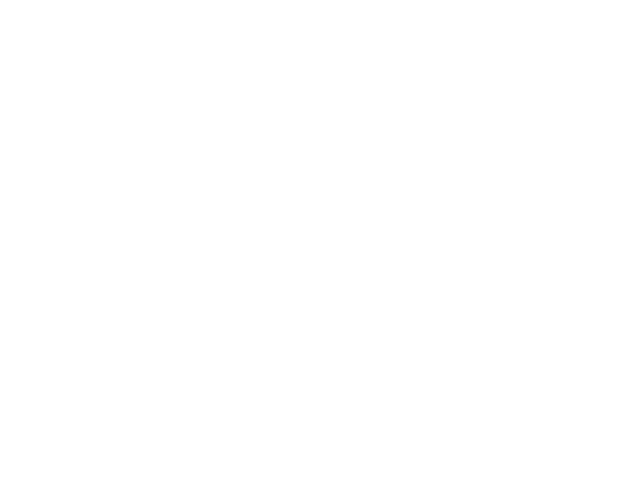

<IPython.core.display.Javascript object>


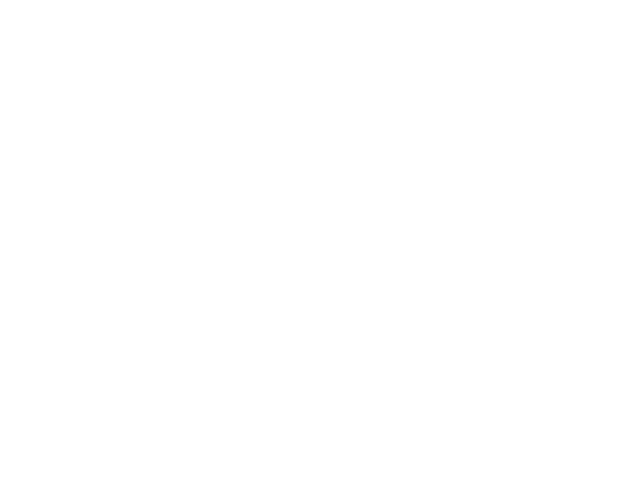

<IPython.core.display.Javascript object>


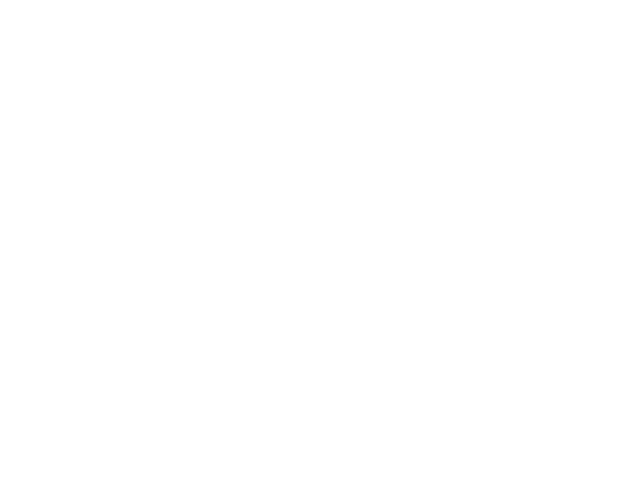

<IPython.core.display.Javascript object>


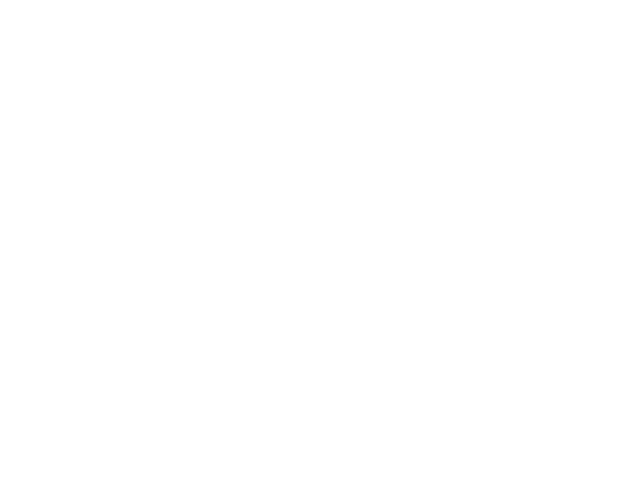

<IPython.core.display.Javascript object>


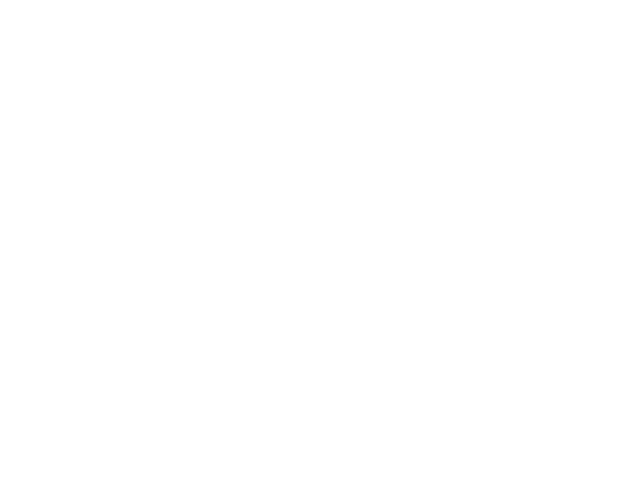

<IPython.core.display.Javascript object>


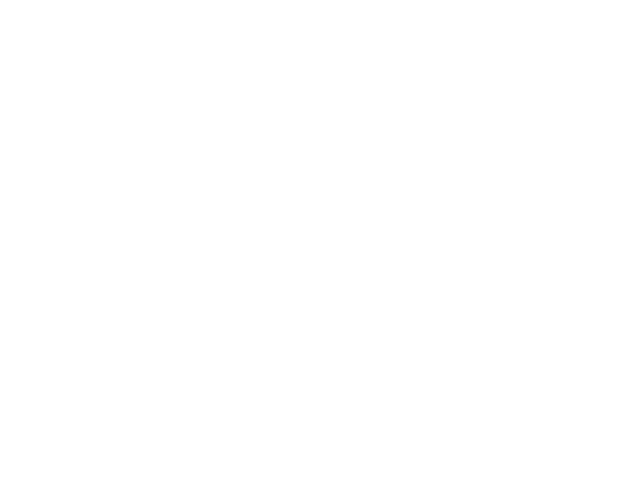

<IPython.core.display.Javascript object>


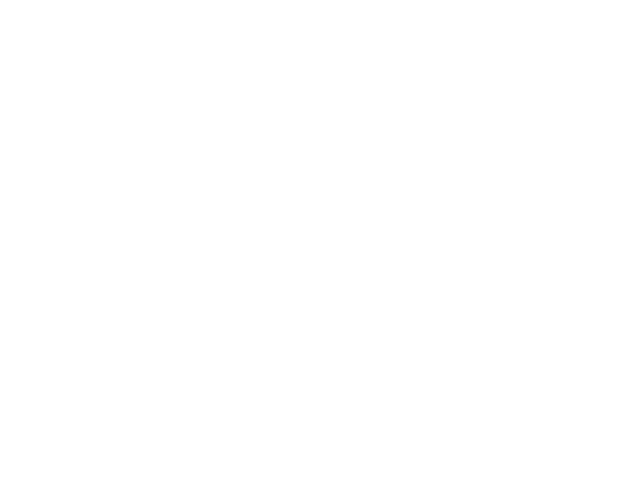

<IPython.core.display.Javascript object>


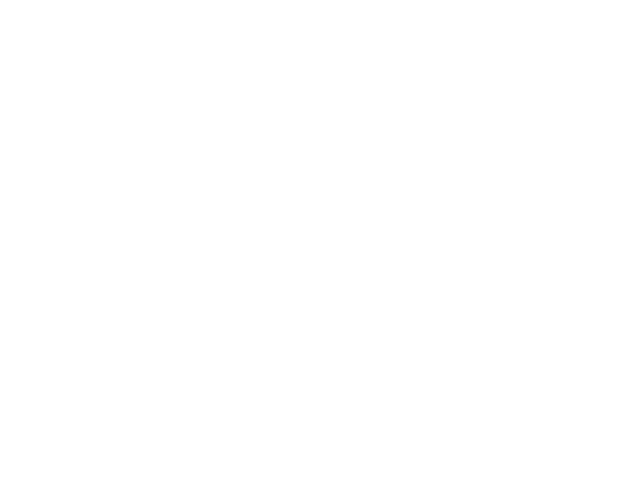

<IPython.core.display.Javascript object>


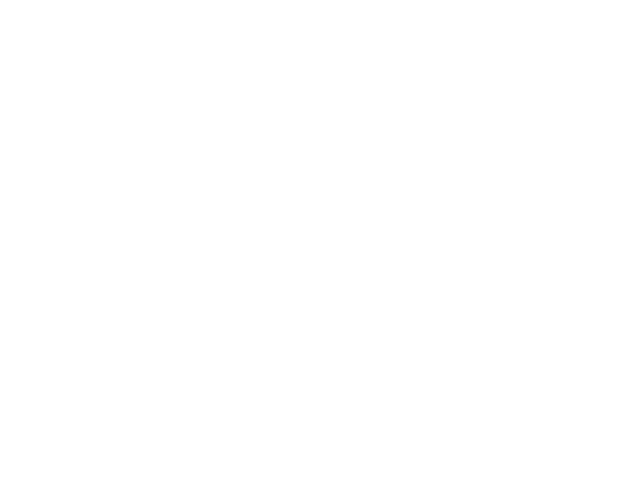

<IPython.core.display.Javascript object>


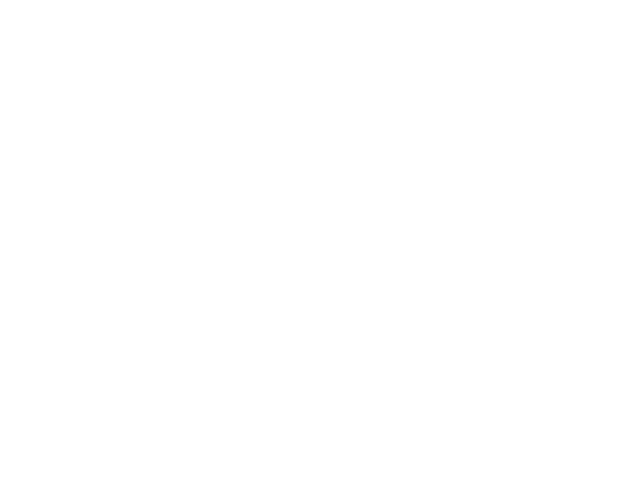

<IPython.core.display.Javascript object>


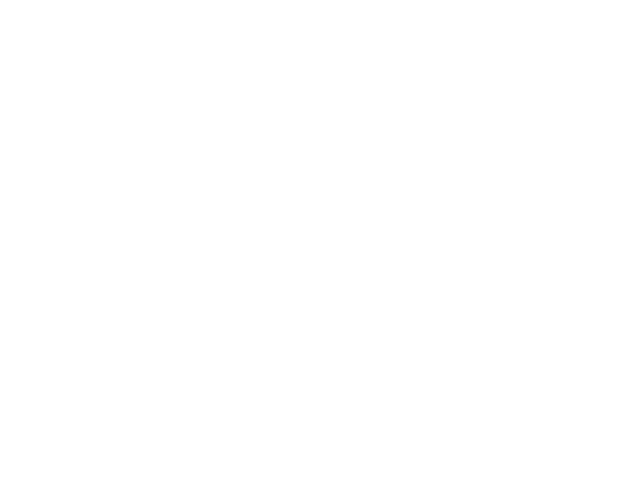

<IPython.core.display.Javascript object>


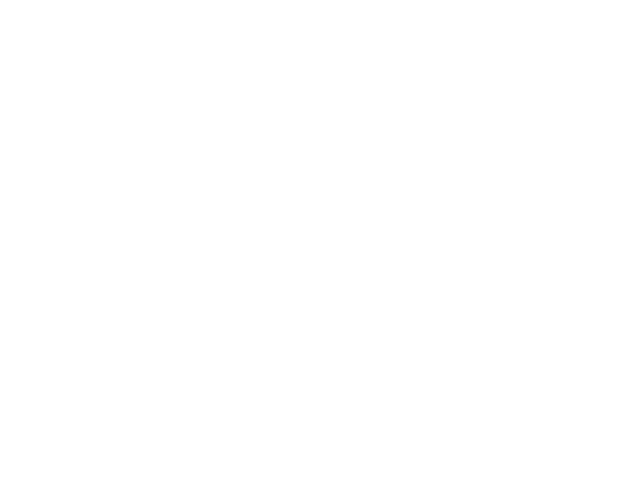

<IPython.core.display.Javascript object>


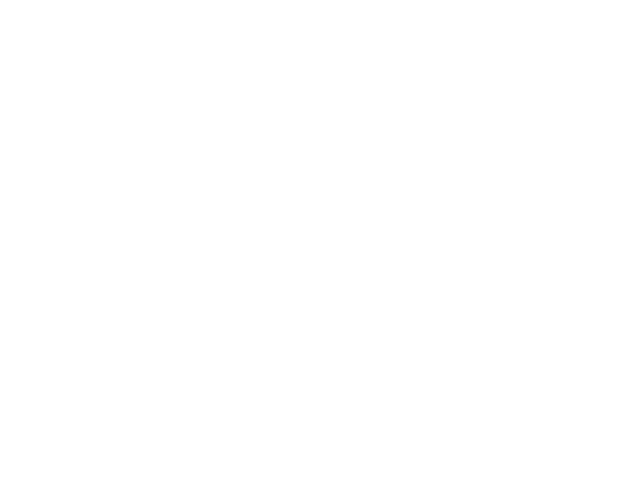

<IPython.core.display.Javascript object>


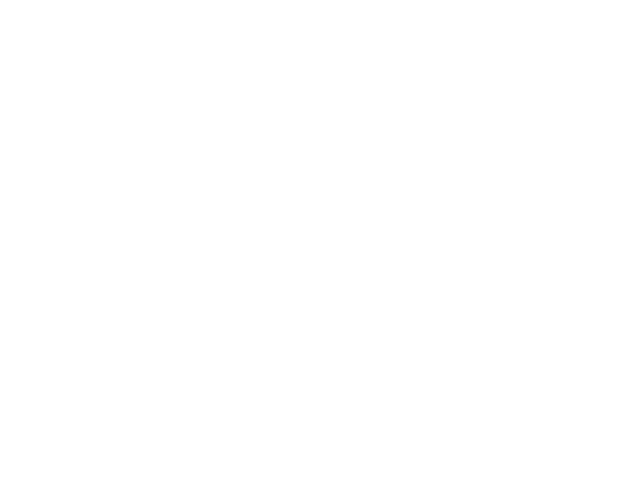

<IPython.core.display.Javascript object>


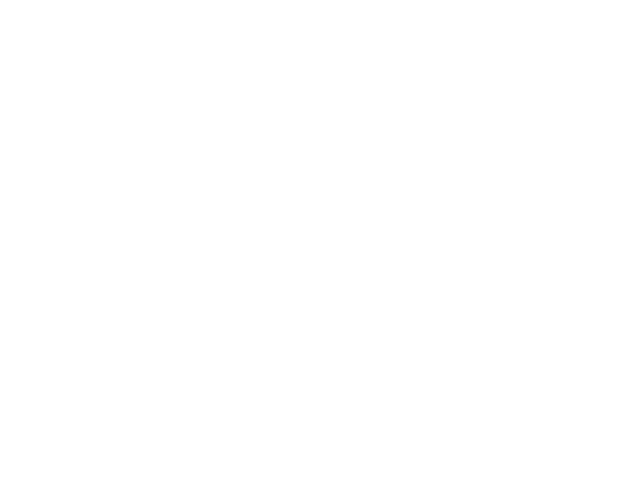

<IPython.core.display.Javascript object>


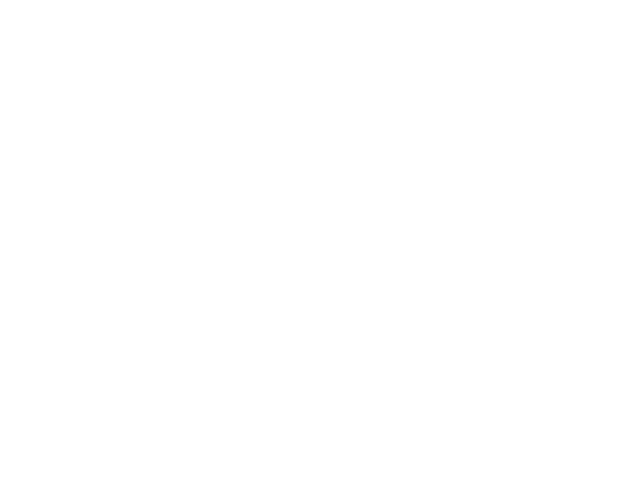

<IPython.core.display.Javascript object>


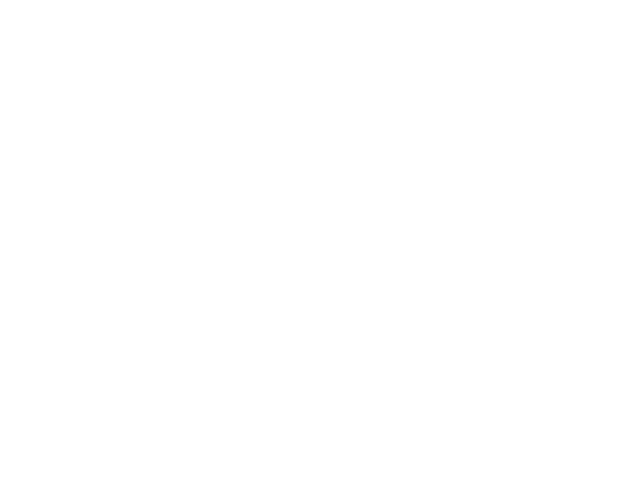

<IPython.core.display.Javascript object>


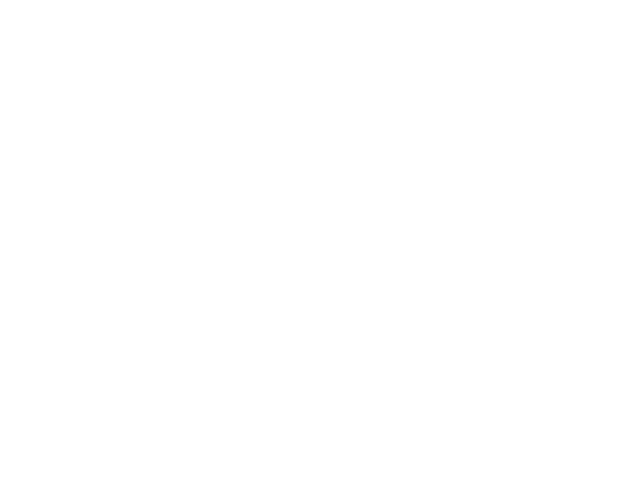

<IPython.core.display.Javascript object>


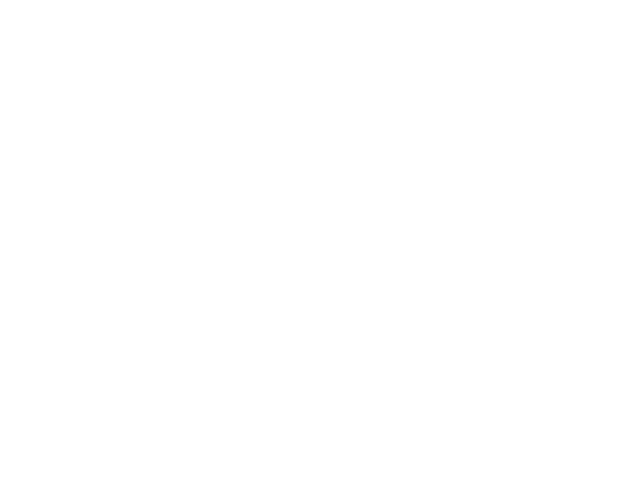

<IPython.core.display.Javascript object>


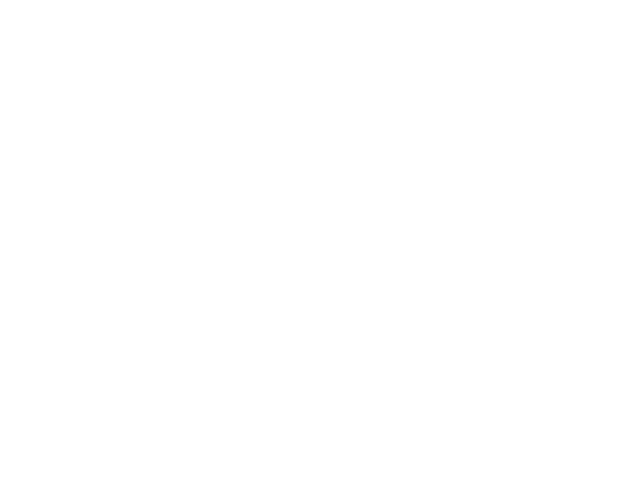

<IPython.core.display.Javascript object>


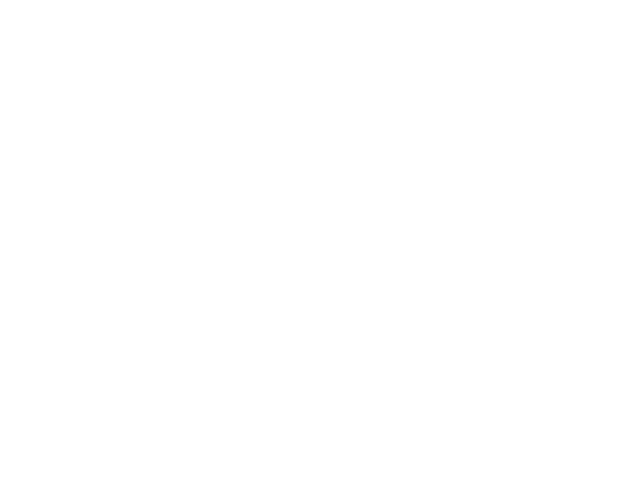

<IPython.core.display.Javascript object>


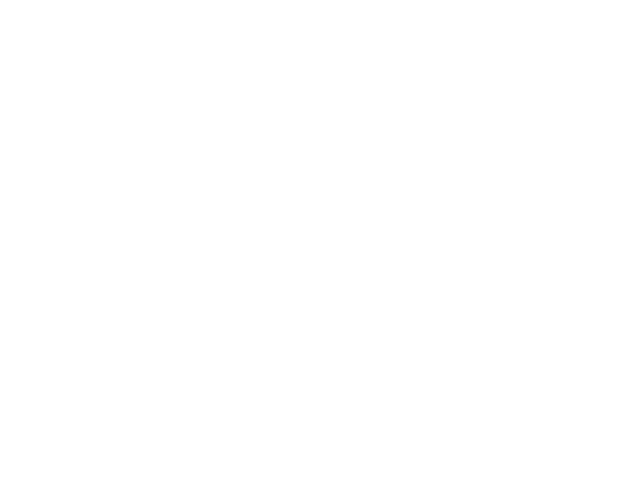

<IPython.core.display.Javascript object>


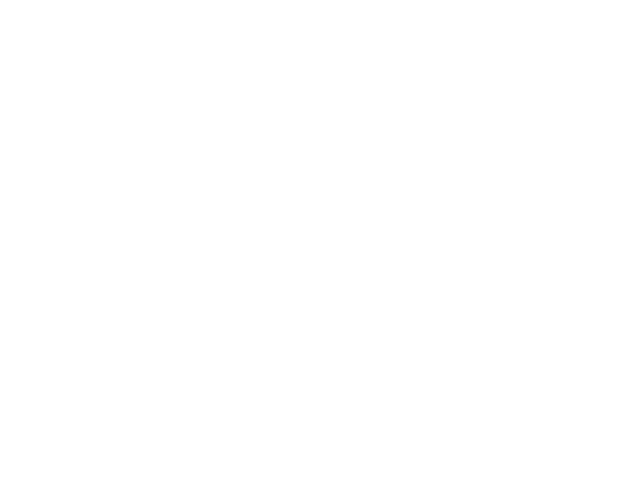

<IPython.core.display.Javascript object>


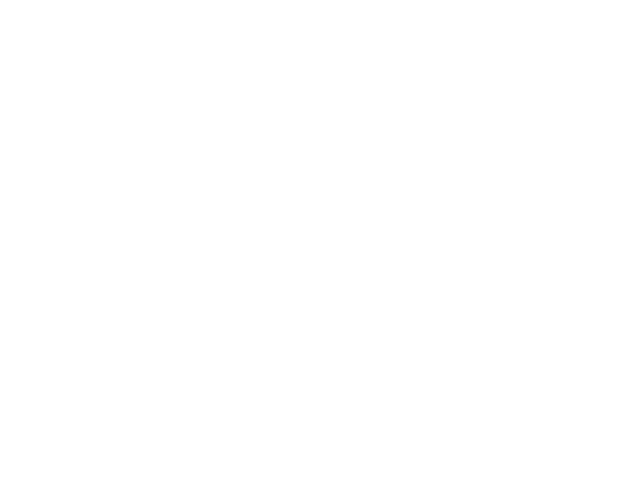

<IPython.core.display.Javascript object>


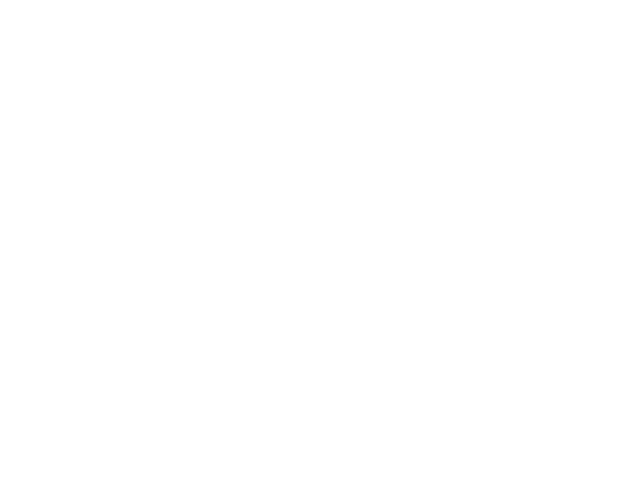

<IPython.core.display.Javascript object>


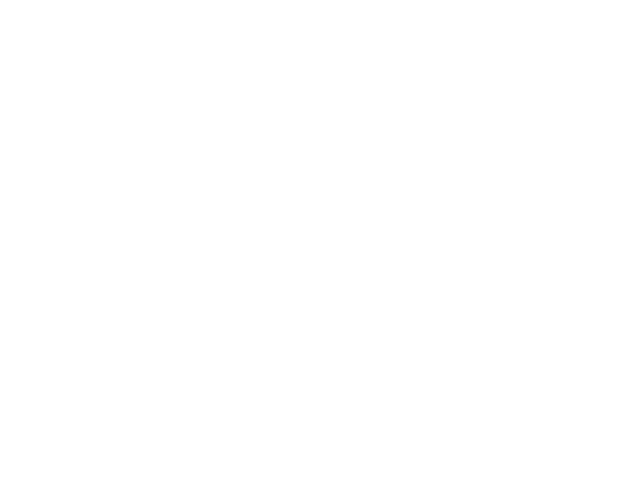

<IPython.core.display.Javascript object>


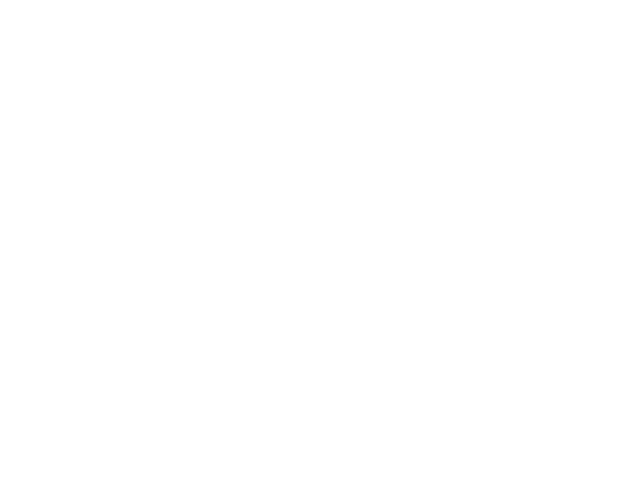

<IPython.core.display.Javascript object>


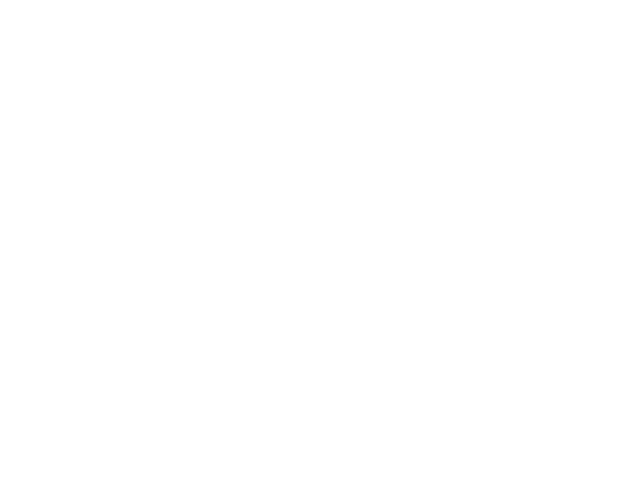

<IPython.core.display.Javascript object>


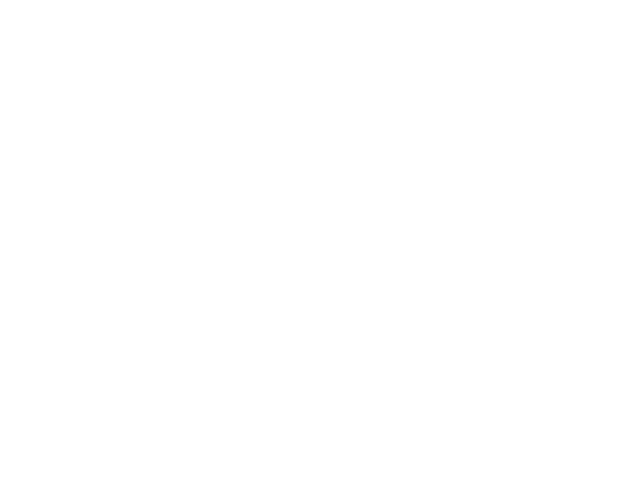

<IPython.core.display.Javascript object>


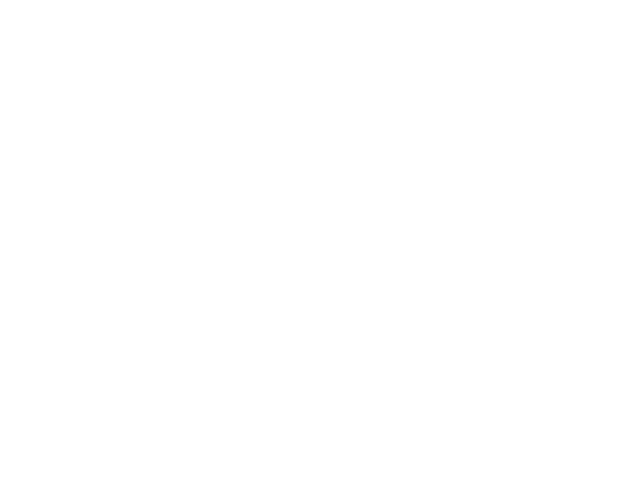

<IPython.core.display.Javascript object>


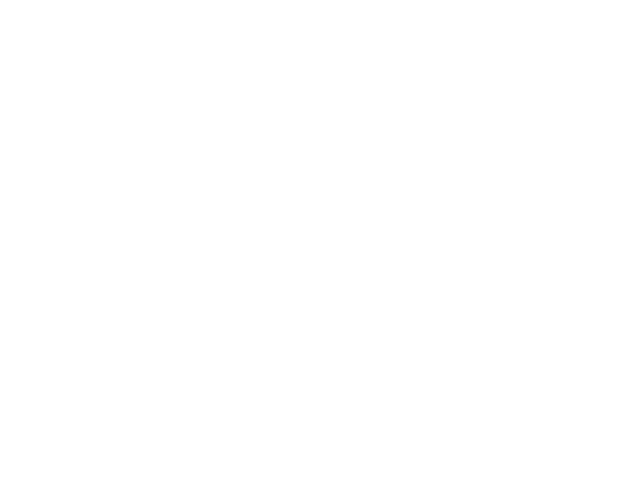

<IPython.core.display.Javascript object>


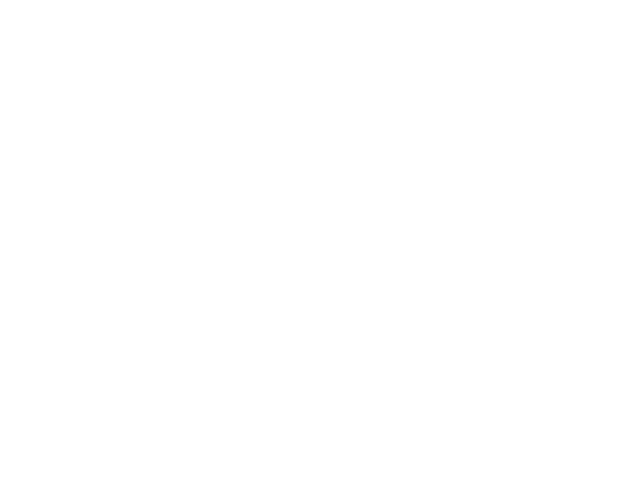

<IPython.core.display.Javascript object>


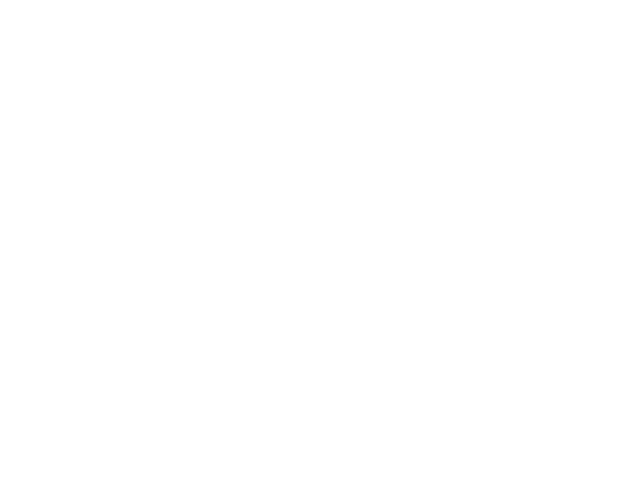

<IPython.core.display.Javascript object>


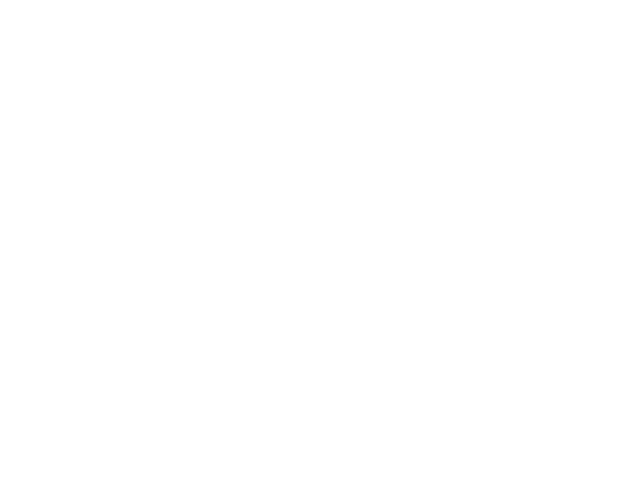

<IPython.core.display.Javascript object>


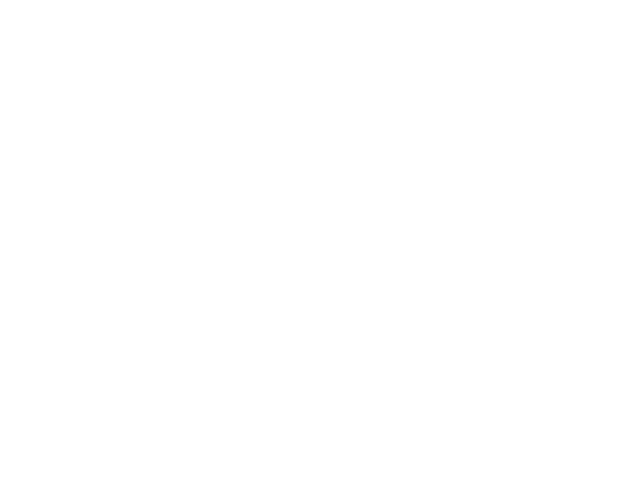

<IPython.core.display.Javascript object>


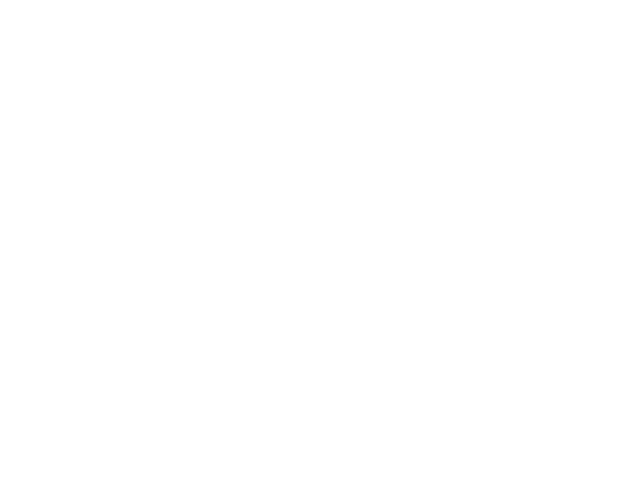

<IPython.core.display.Javascript object>


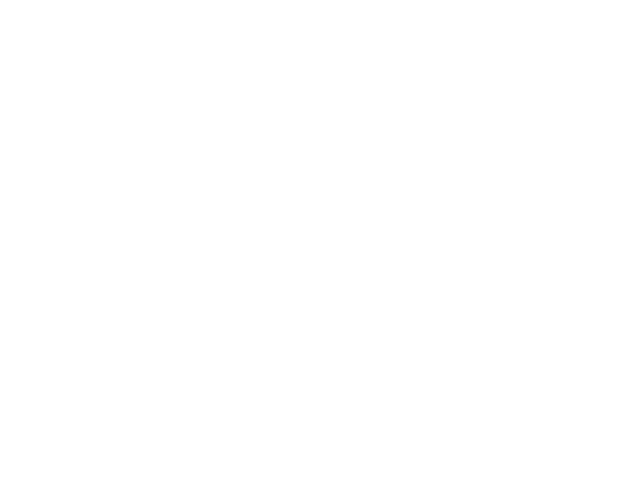

<IPython.core.display.Javascript object>


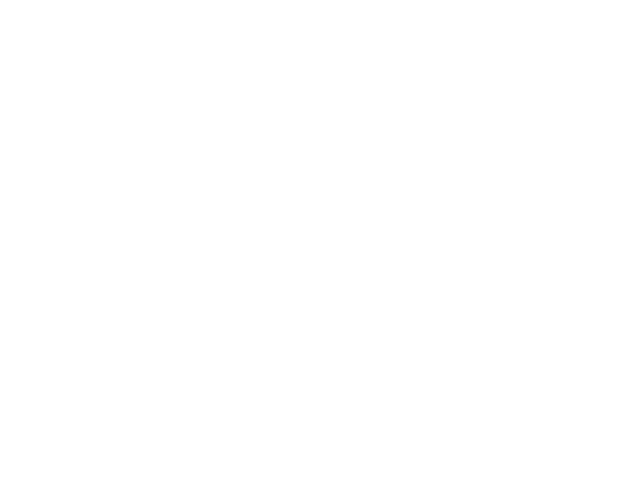

<IPython.core.display.Javascript object>


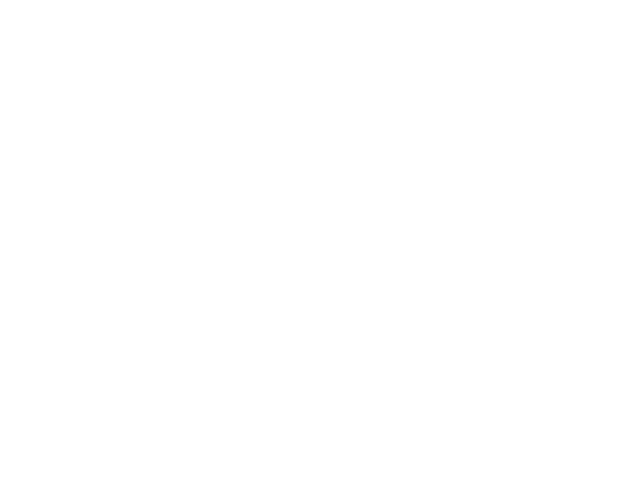

<IPython.core.display.Javascript object>


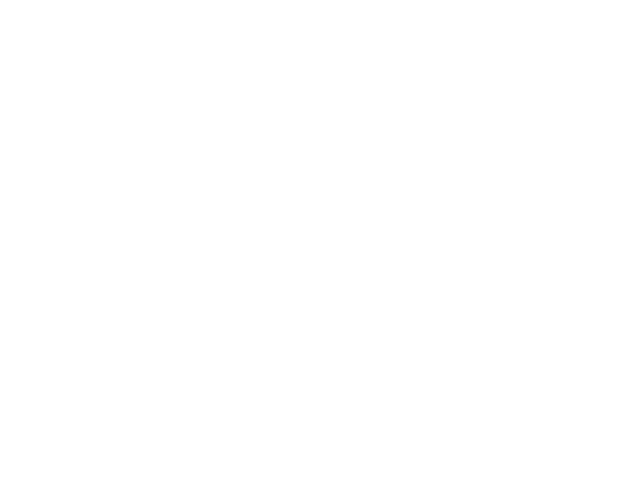

<IPython.core.display.Javascript object>


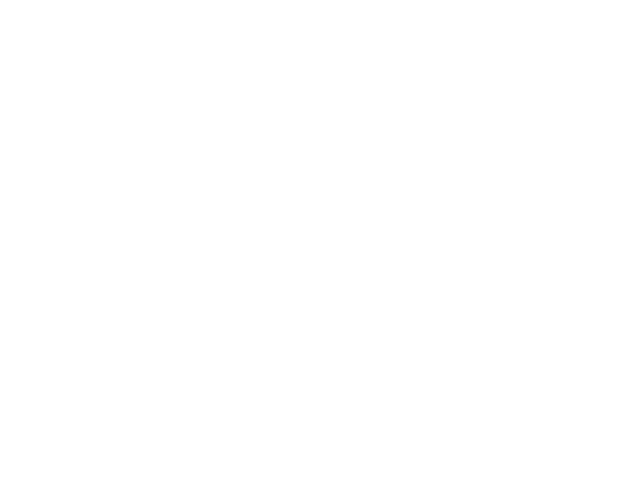

<IPython.core.display.Javascript object>


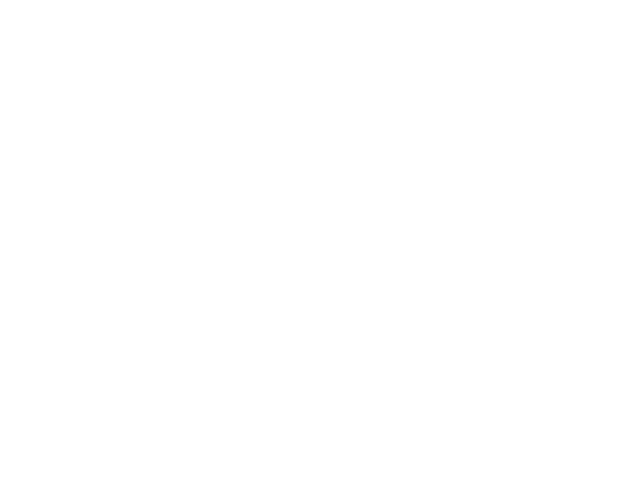

<IPython.core.display.Javascript object>


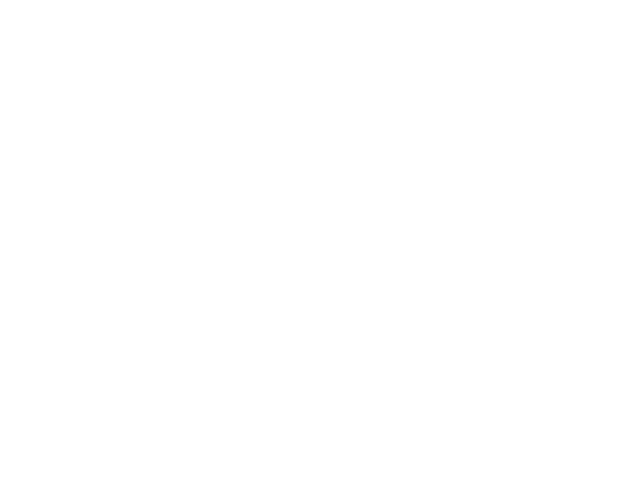

<IPython.core.display.Javascript object>


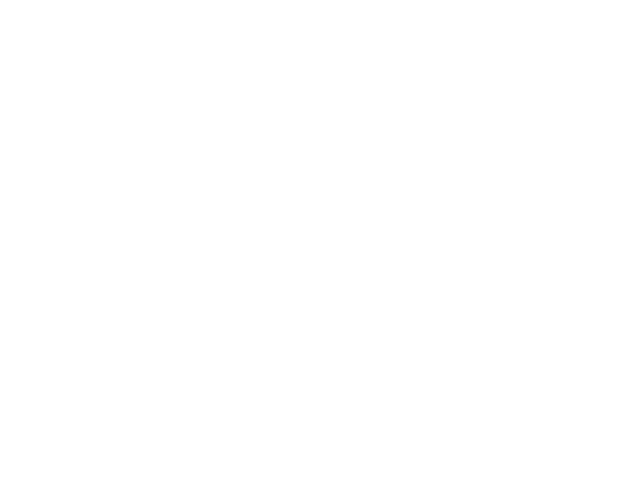

<IPython.core.display.Javascript object>


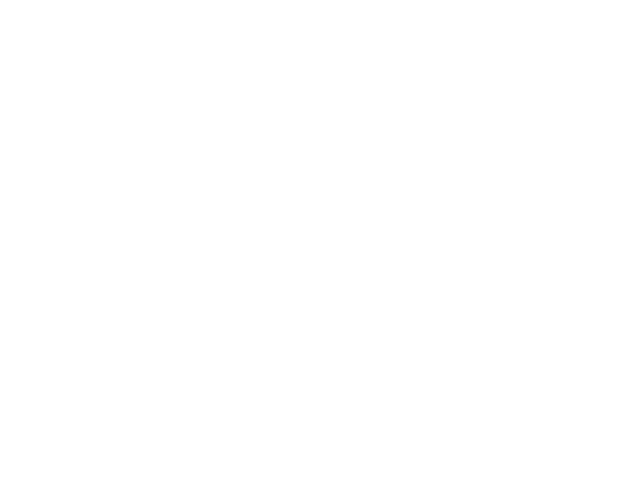

<IPython.core.display.Javascript object>


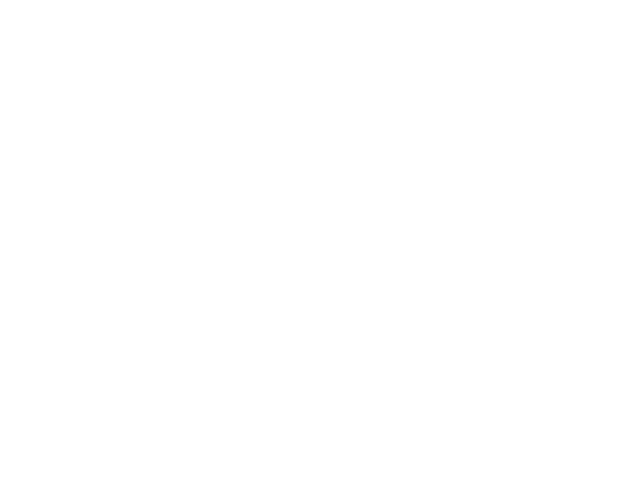

<IPython.core.display.Javascript object>


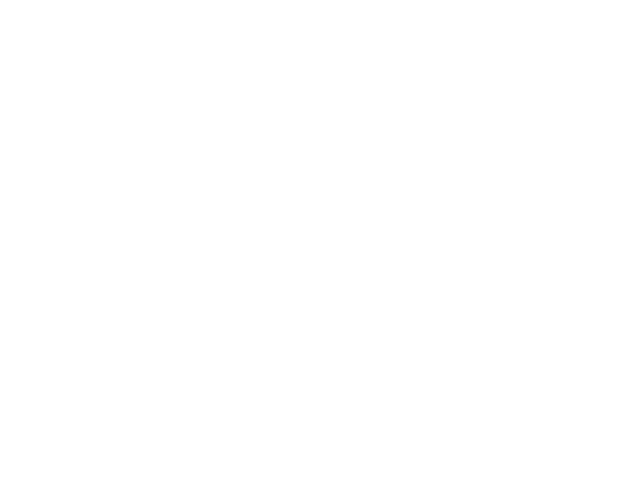

<IPython.core.display.Javascript object>


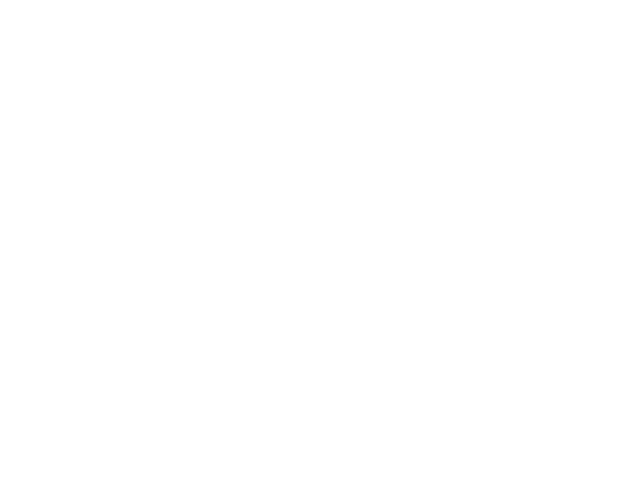

<IPython.core.display.Javascript object>


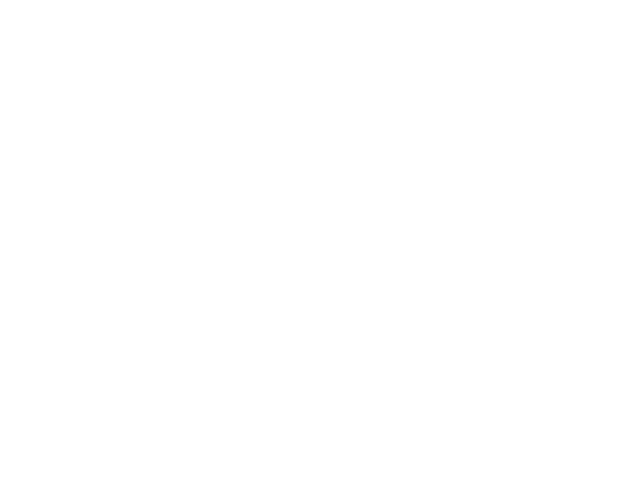

<IPython.core.display.Javascript object>


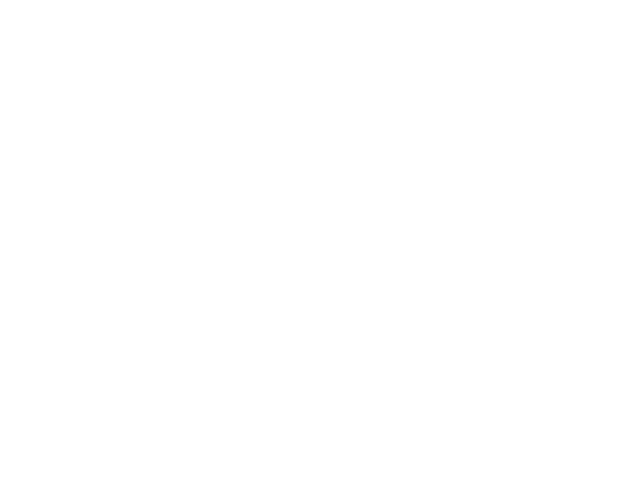

<IPython.core.display.Javascript object>


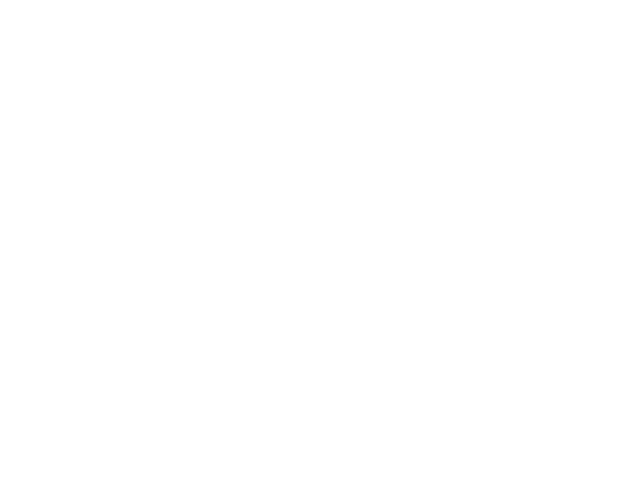

<IPython.core.display.Javascript object>


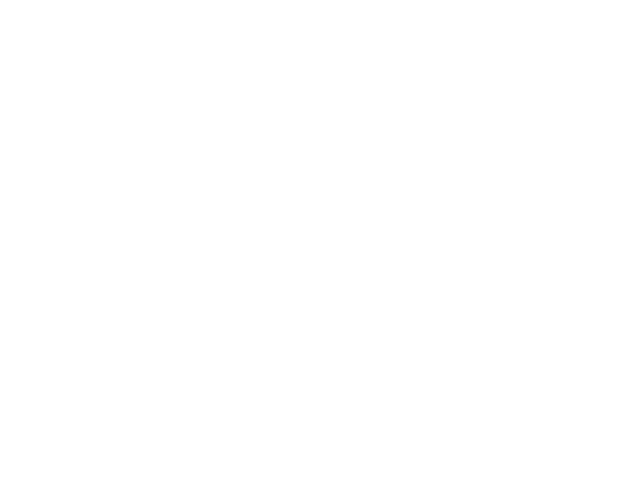

<IPython.core.display.Javascript object>


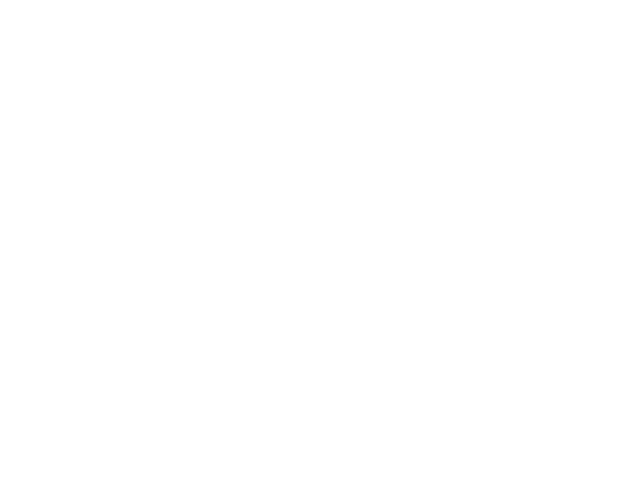

<IPython.core.display.Javascript object>


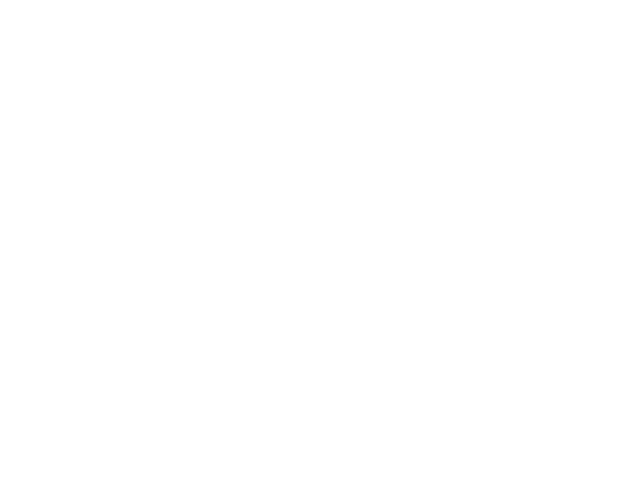

<IPython.core.display.Javascript object>


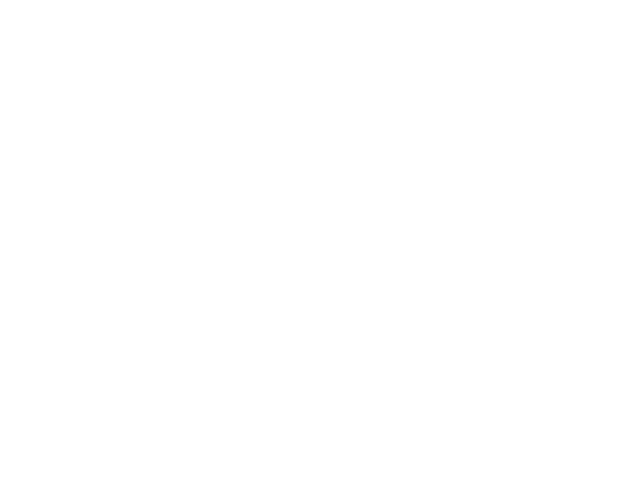

<IPython.core.display.Javascript object>


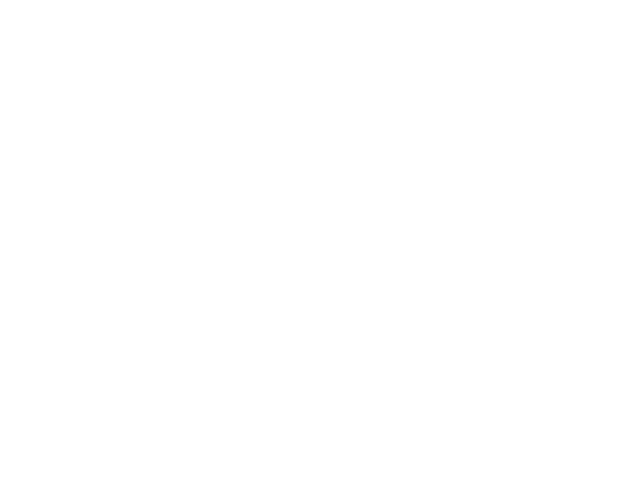

<IPython.core.display.Javascript object>


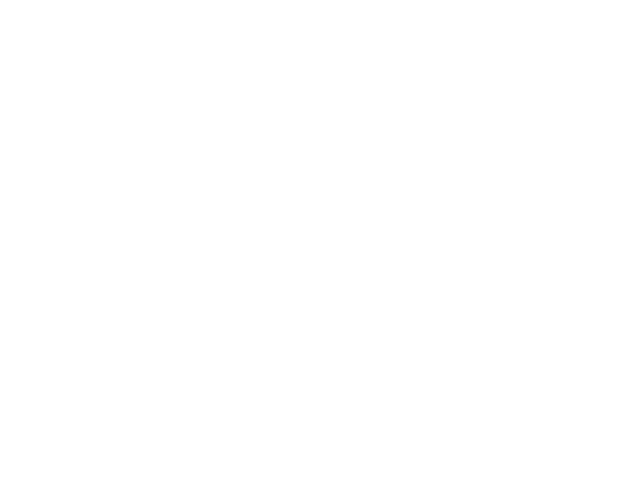

<IPython.core.display.Javascript object>


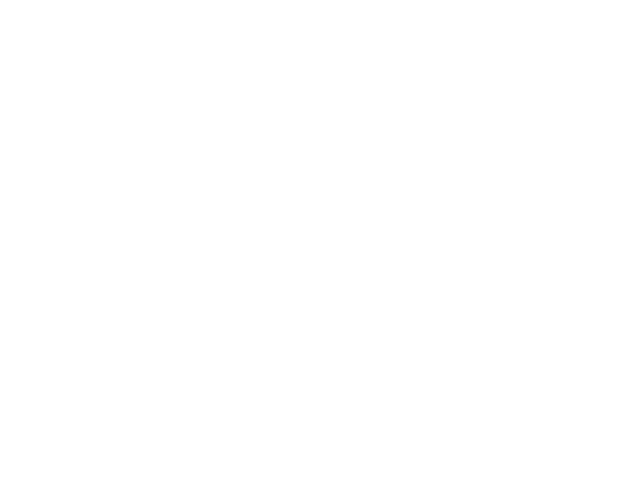

<IPython.core.display.Javascript object>


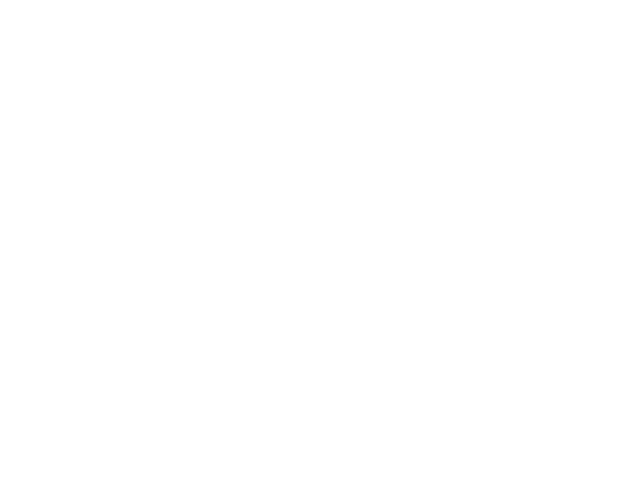

<IPython.core.display.Javascript object>


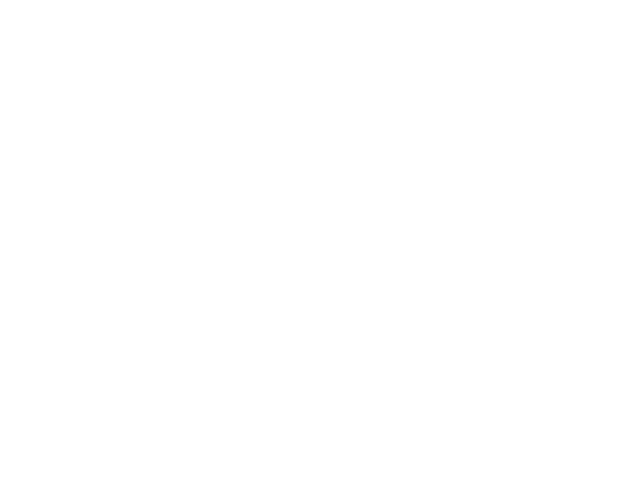

<IPython.core.display.Javascript object>


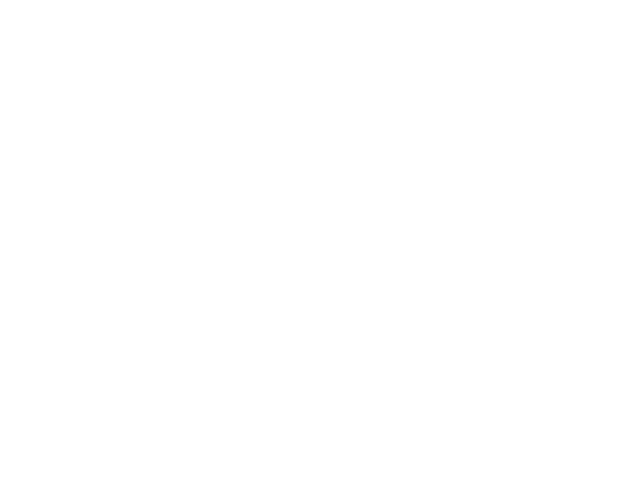

<IPython.core.display.Javascript object>


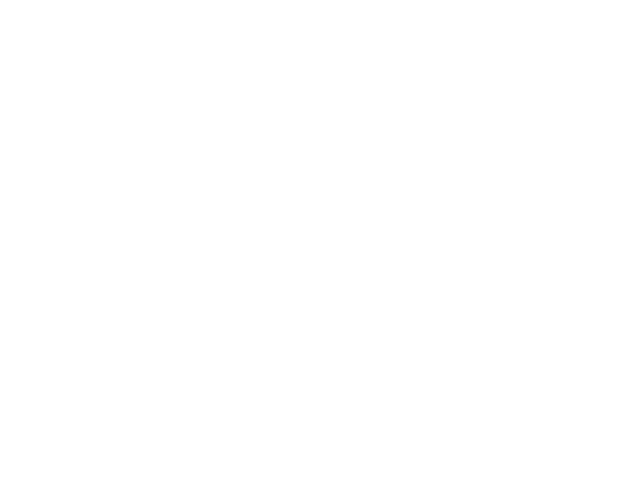

<IPython.core.display.Javascript object>


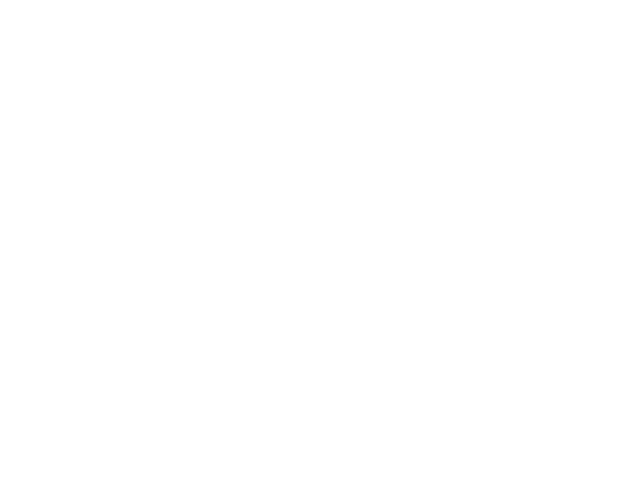

<IPython.core.display.Javascript object>


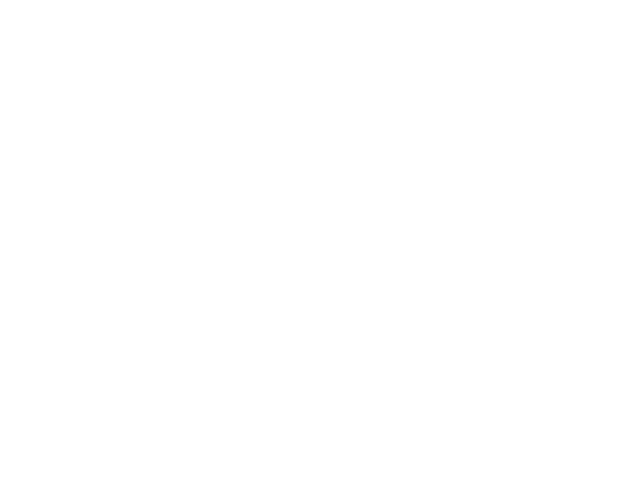

<IPython.core.display.Javascript object>


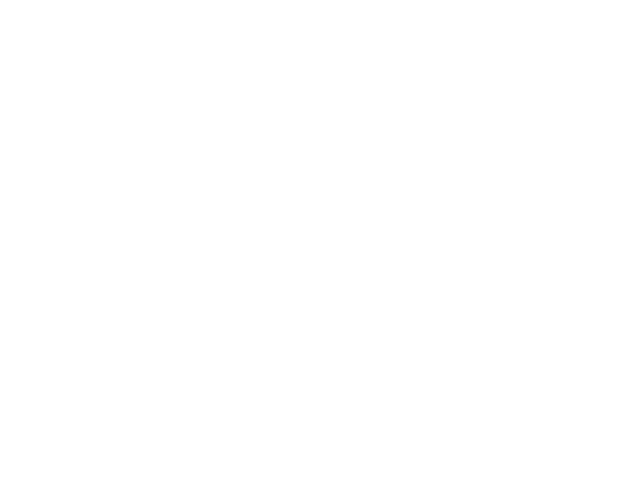

<IPython.core.display.Javascript object>


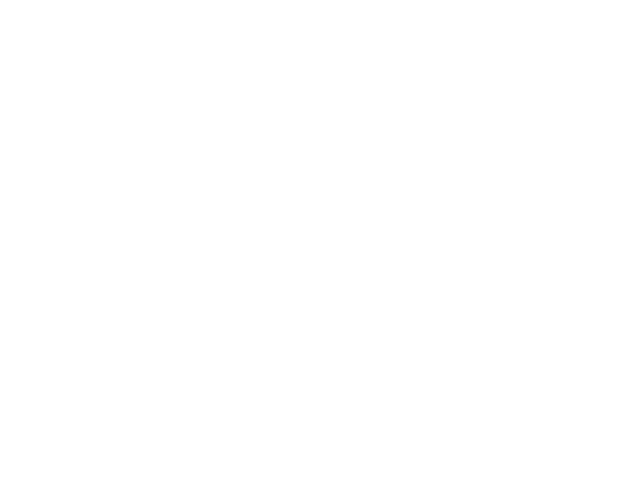

<IPython.core.display.Javascript object>


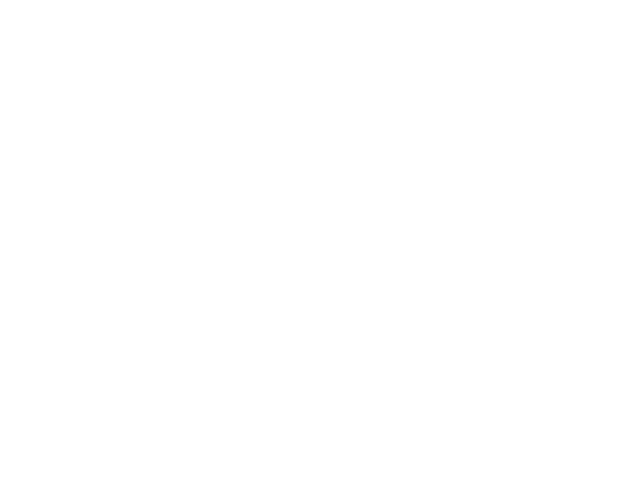

<IPython.core.display.Javascript object>


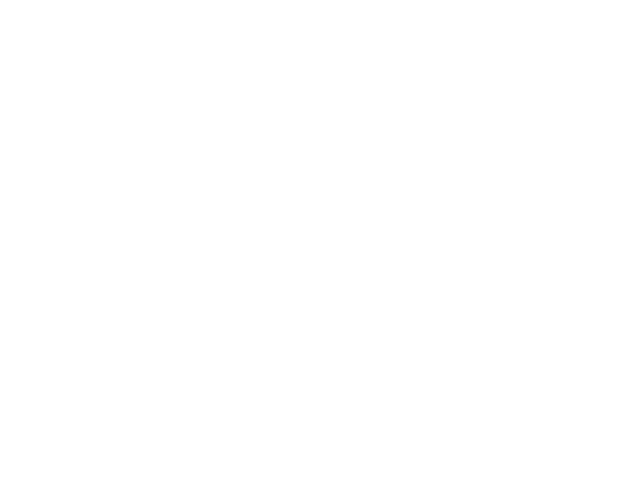

<IPython.core.display.Javascript object>


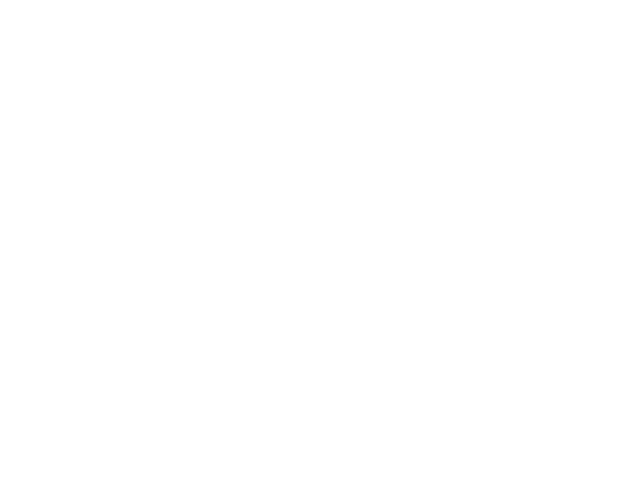

<IPython.core.display.Javascript object>


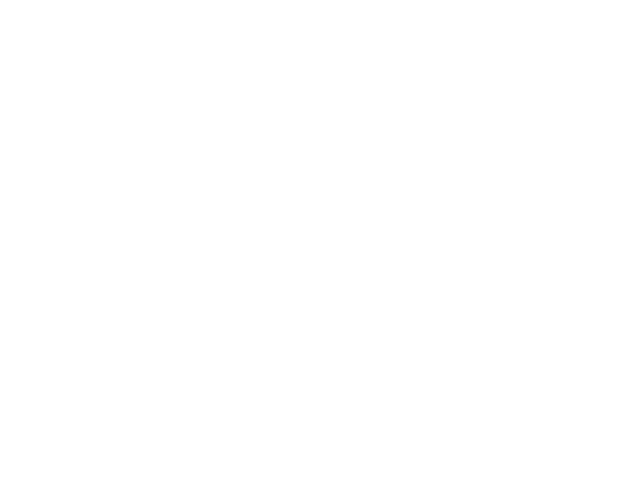

<IPython.core.display.Javascript object>


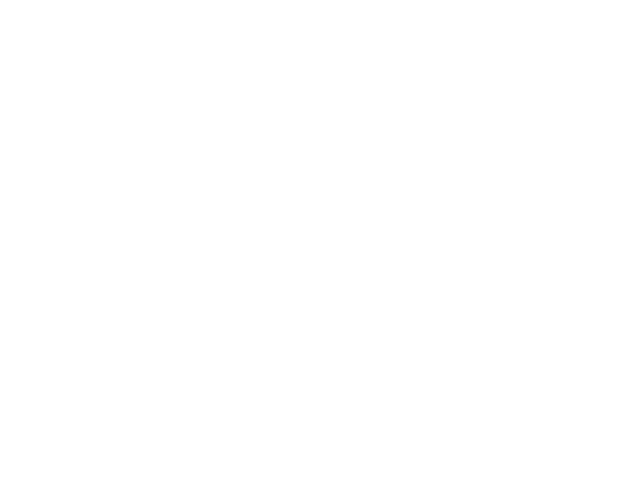

<IPython.core.display.Javascript object>


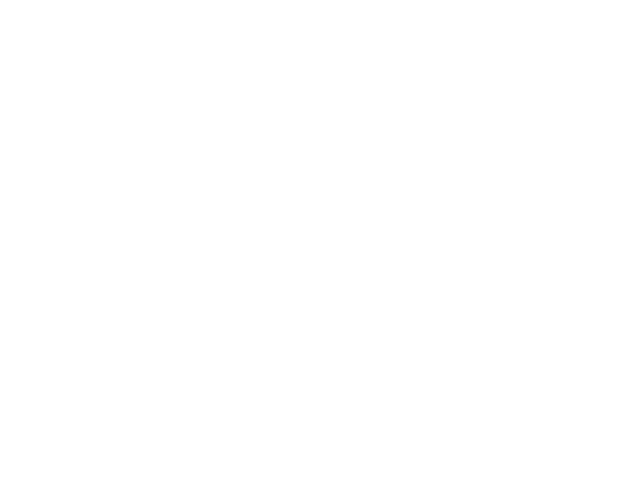

<IPython.core.display.Javascript object>


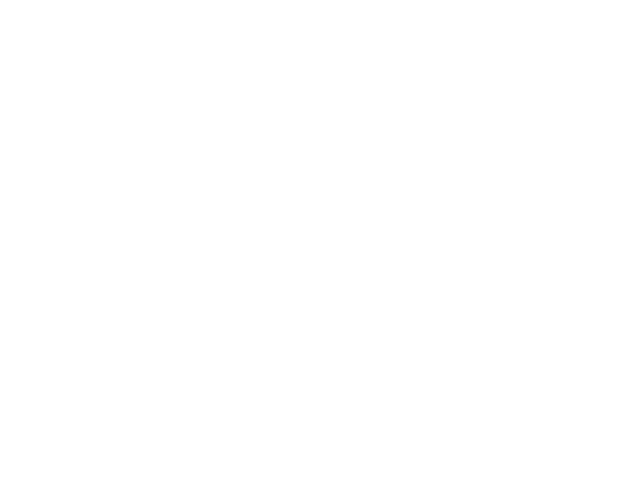

<IPython.core.display.Javascript object>


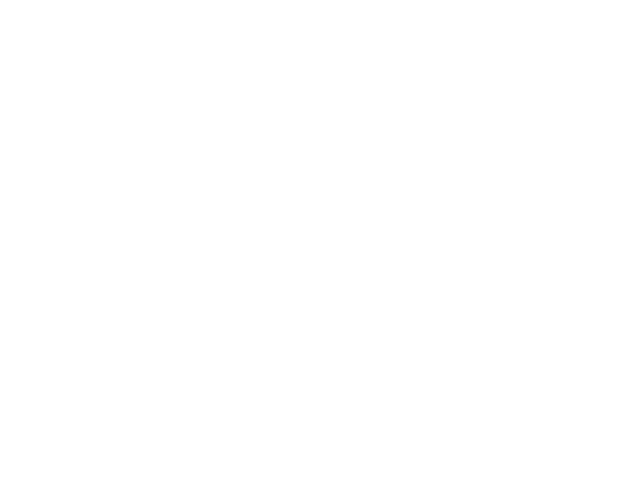

<IPython.core.display.Javascript object>


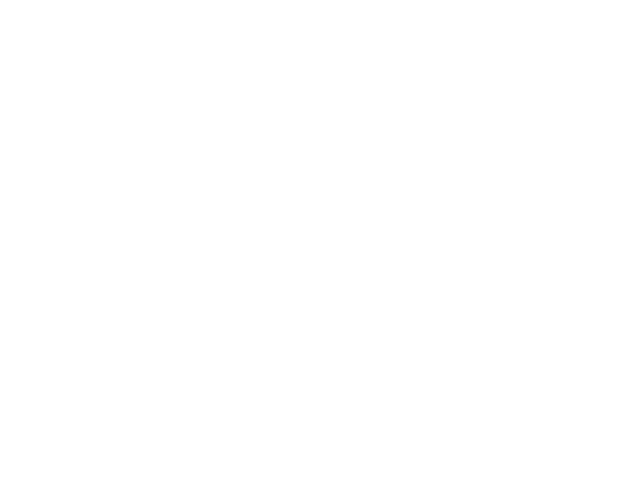

<IPython.core.display.Javascript object>


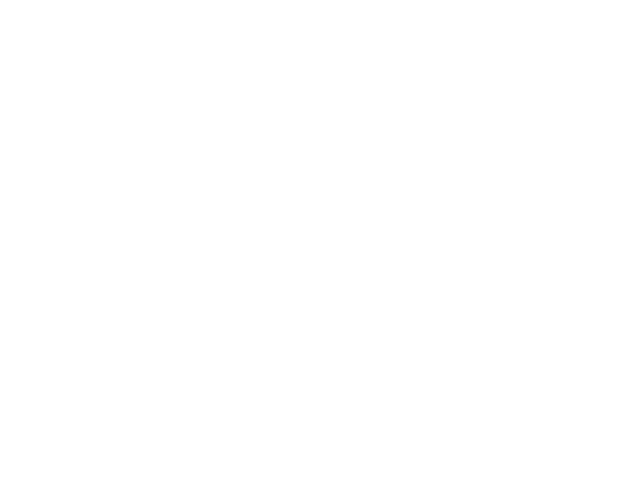

<IPython.core.display.Javascript object>


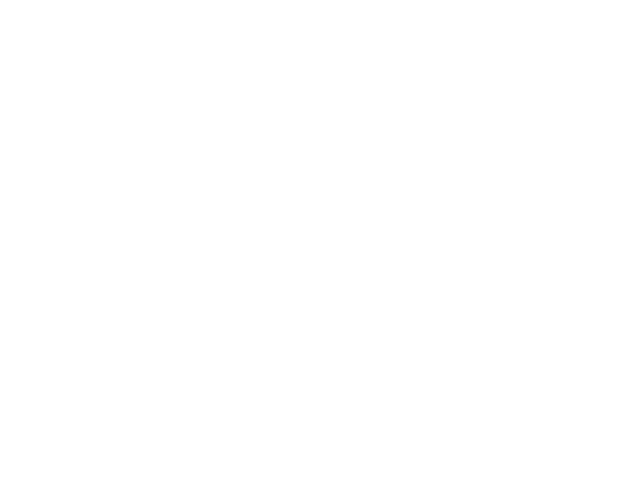

<IPython.core.display.Javascript object>


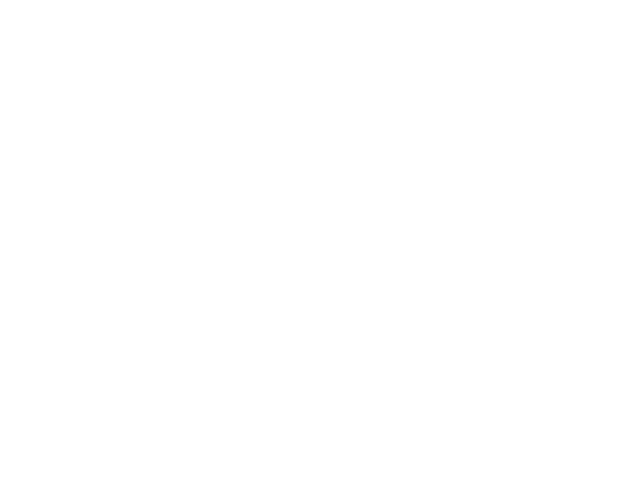

<IPython.core.display.Javascript object>


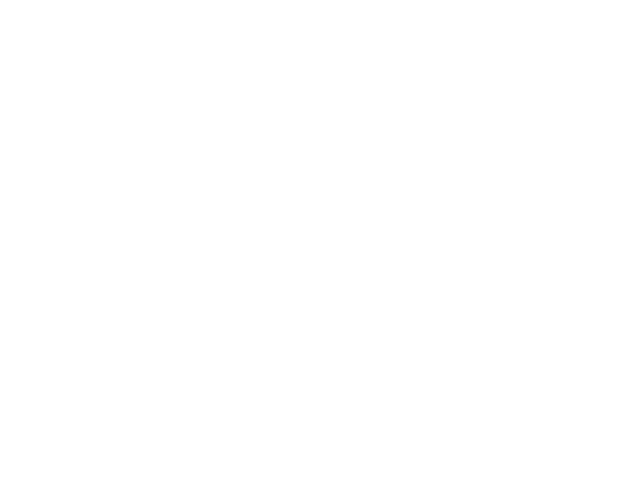

<IPython.core.display.Javascript object>


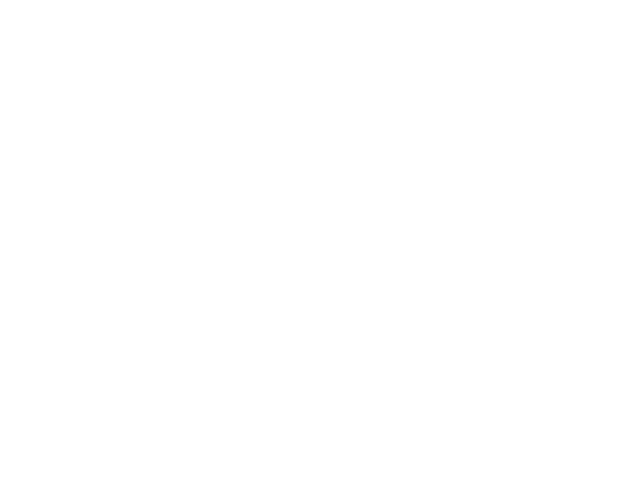

<IPython.core.display.Javascript object>


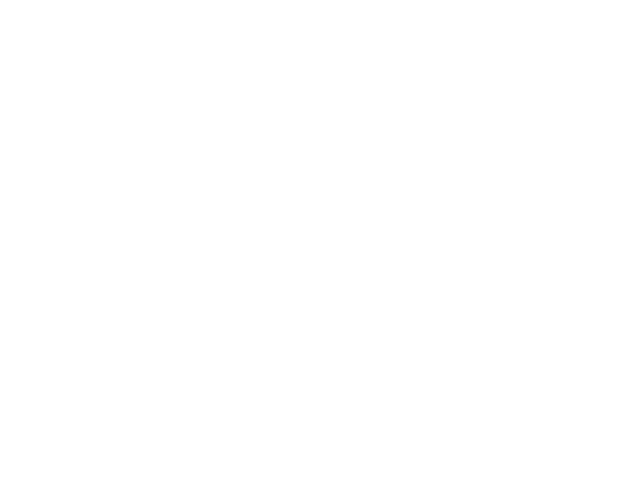

<IPython.core.display.Javascript object>


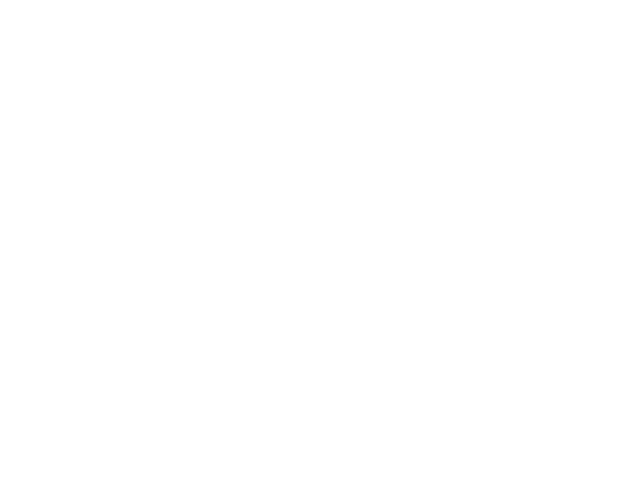

<IPython.core.display.Javascript object>


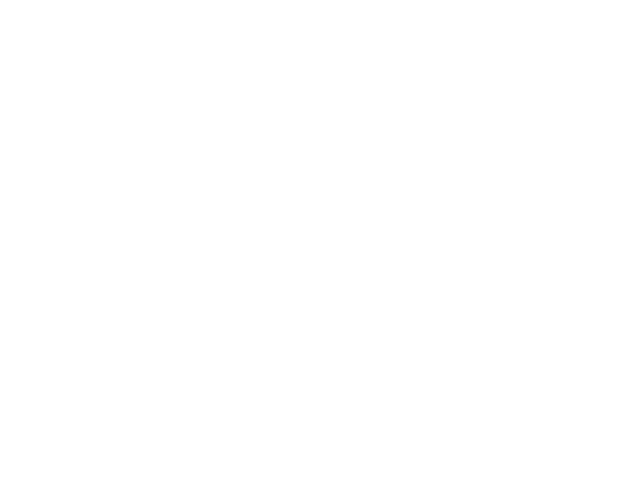

<IPython.core.display.Javascript object>


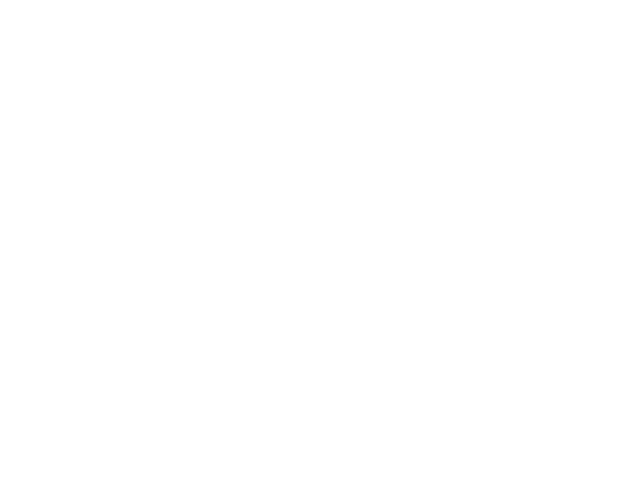

<IPython.core.display.Javascript object>


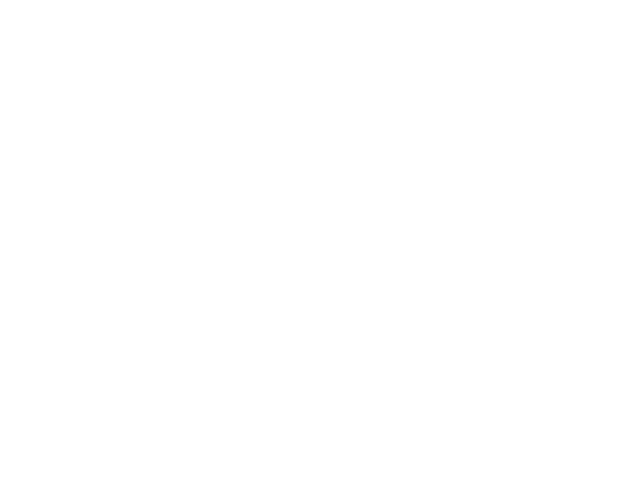

<IPython.core.display.Javascript object>


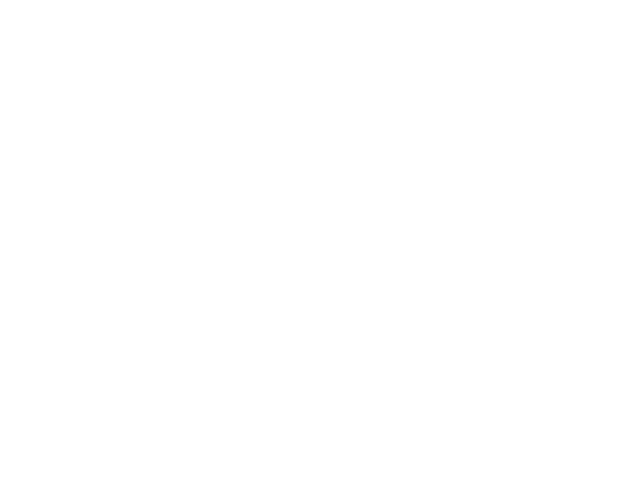

<IPython.core.display.Javascript object>


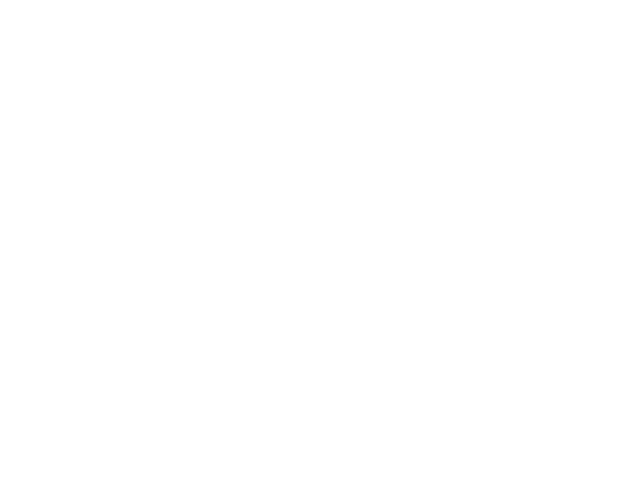

<IPython.core.display.Javascript object>


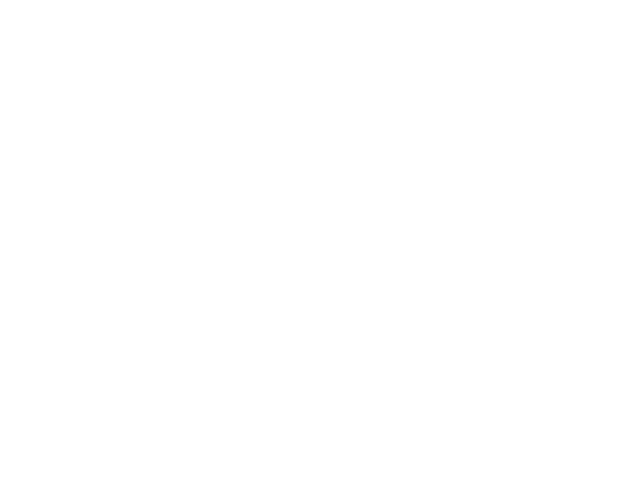

<IPython.core.display.Javascript object>


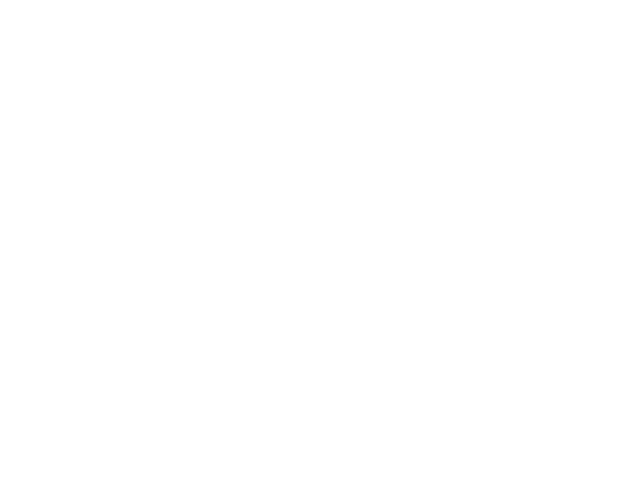

<IPython.core.display.Javascript object>


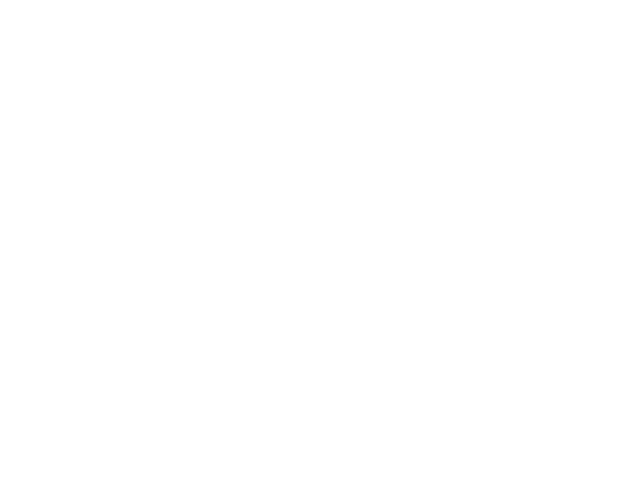

<IPython.core.display.Javascript object>


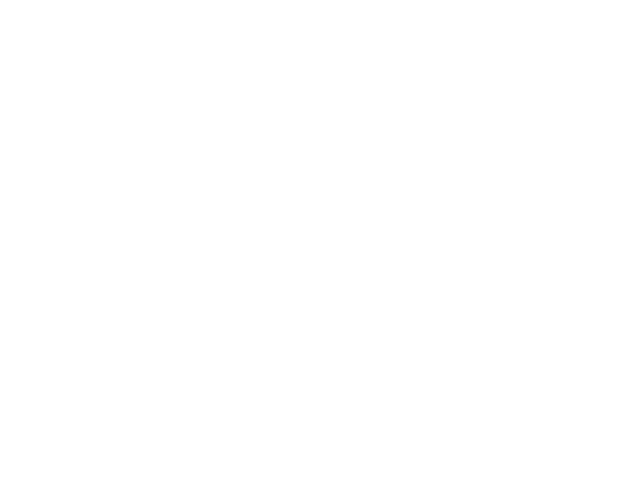

<IPython.core.display.Javascript object>


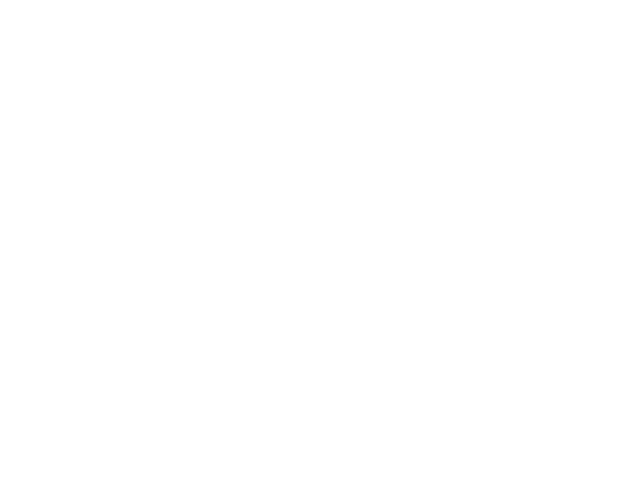

<IPython.core.display.Javascript object>


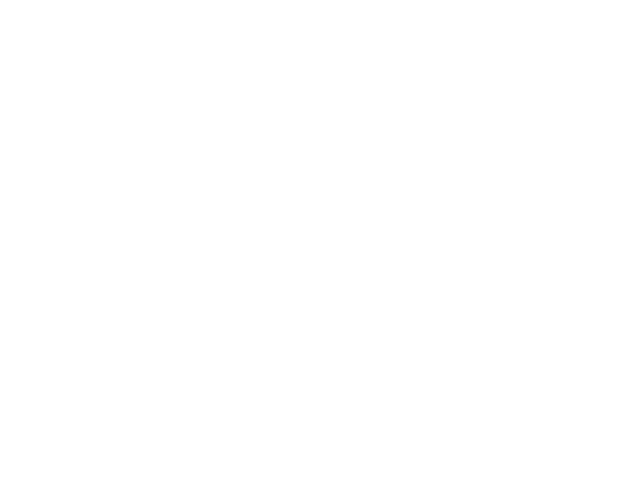

<IPython.core.display.Javascript object>


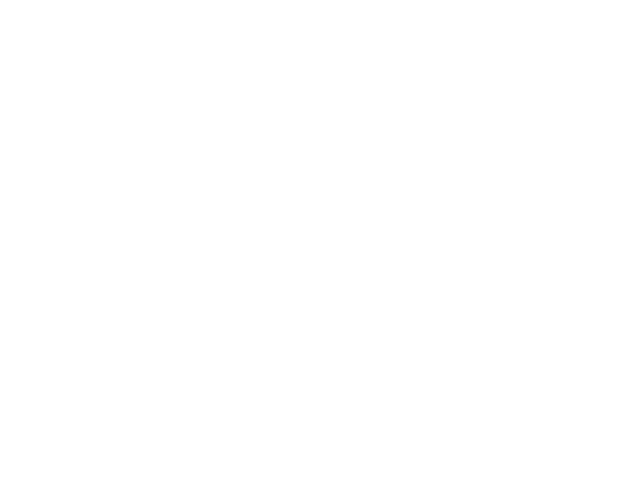

<IPython.core.display.Javascript object>


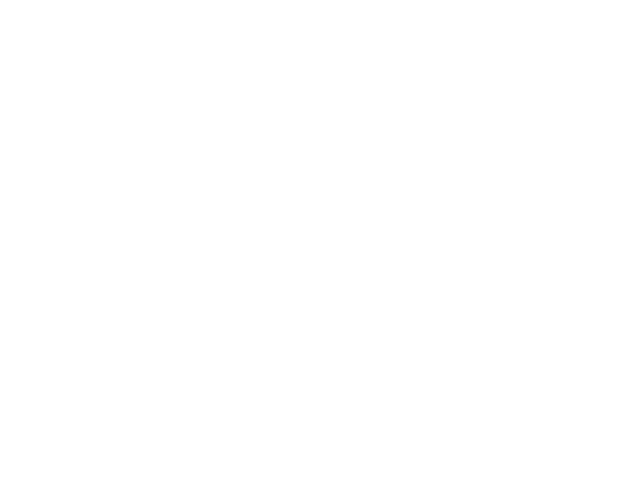

<IPython.core.display.Javascript object>


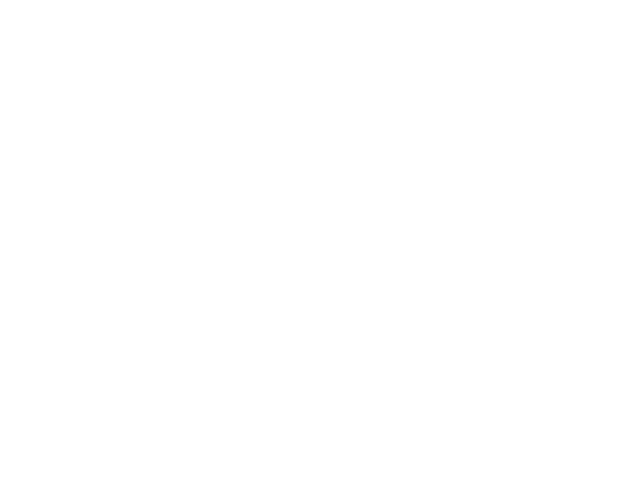

<IPython.core.display.Javascript object>


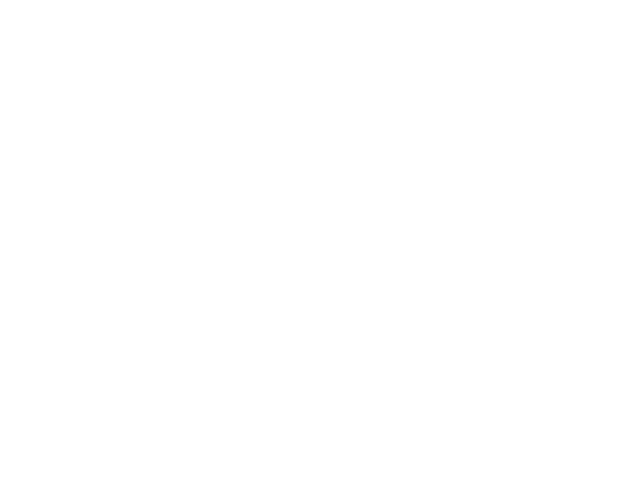

<IPython.core.display.Javascript object>


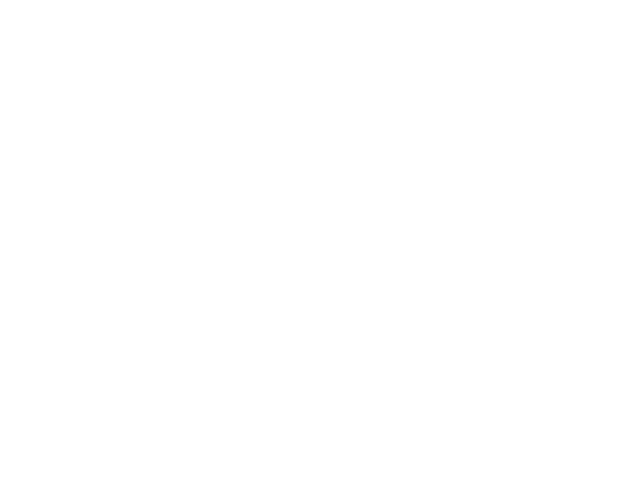

<IPython.core.display.Javascript object>


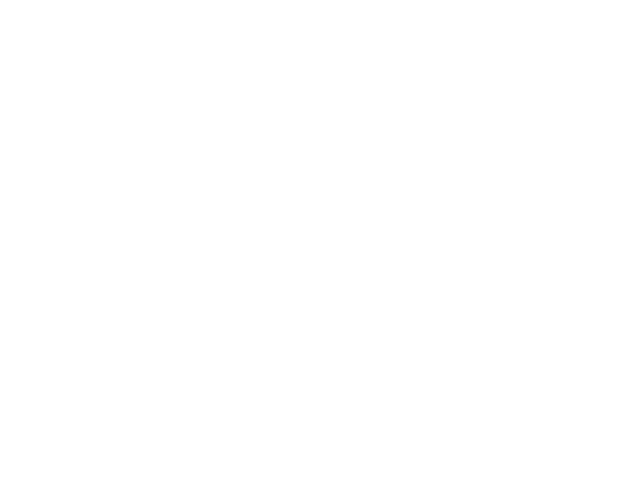

<IPython.core.display.Javascript object>


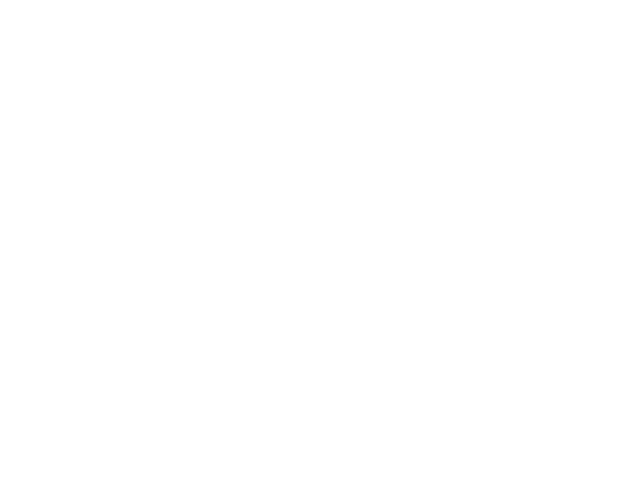

<IPython.core.display.Javascript object>


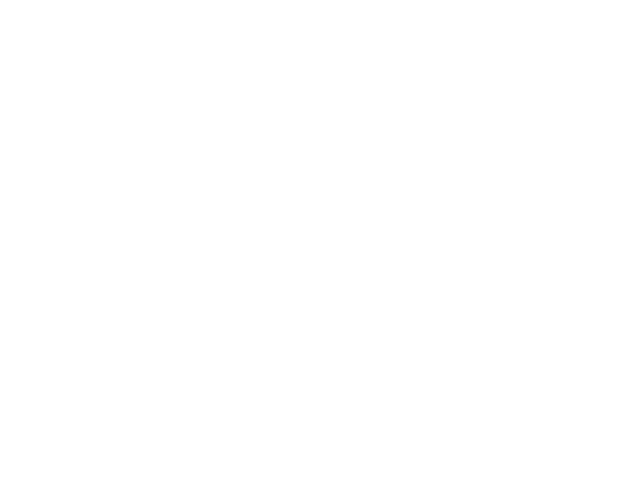

<IPython.core.display.Javascript object>


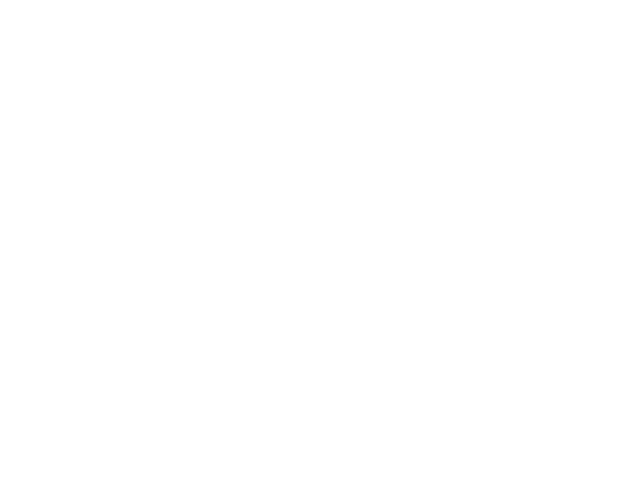

<IPython.core.display.Javascript object>


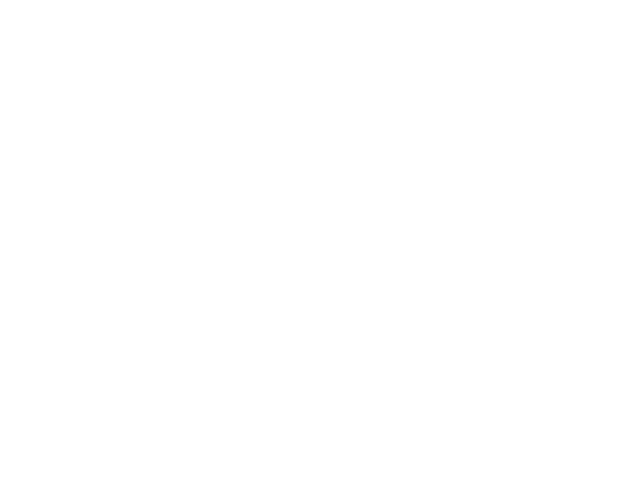

<IPython.core.display.Javascript object>


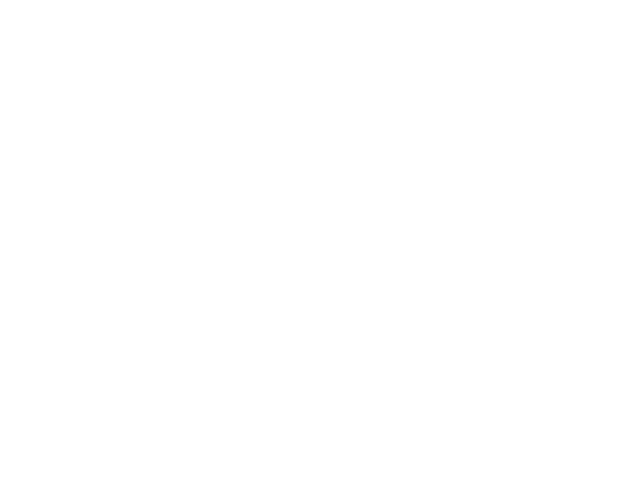

<IPython.core.display.Javascript object>


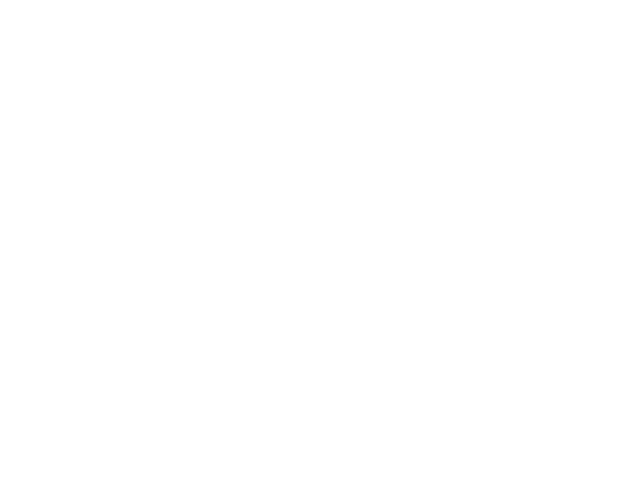

<IPython.core.display.Javascript object>


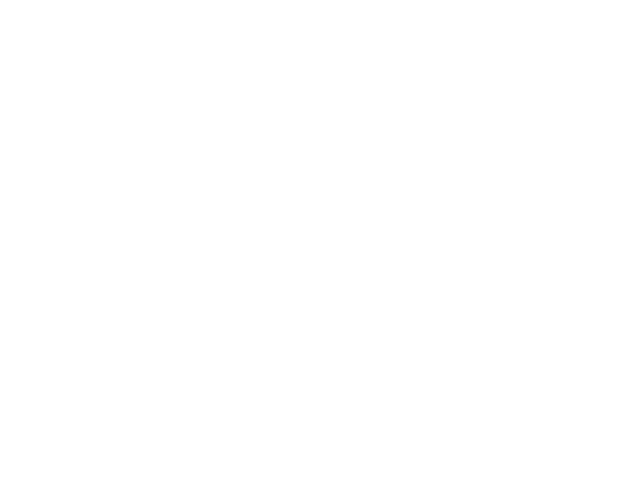

<IPython.core.display.Javascript object>


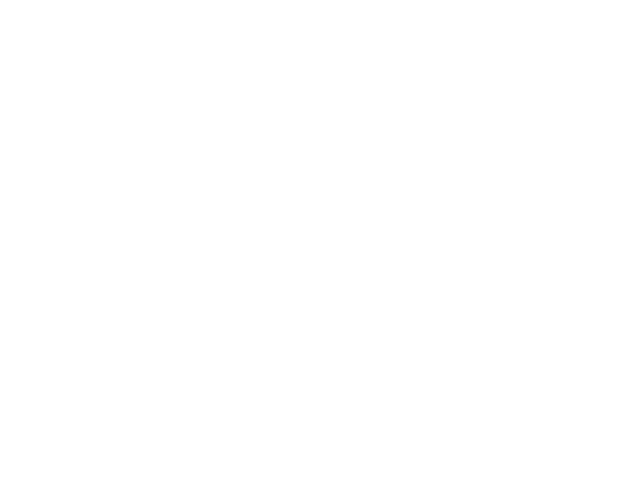

<IPython.core.display.Javascript object>


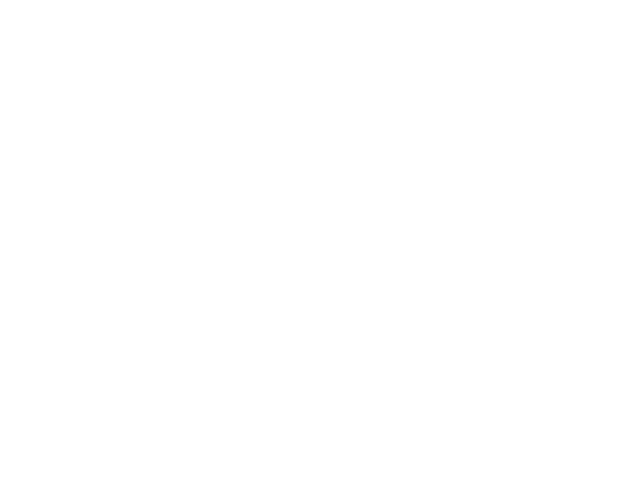

<IPython.core.display.Javascript object>


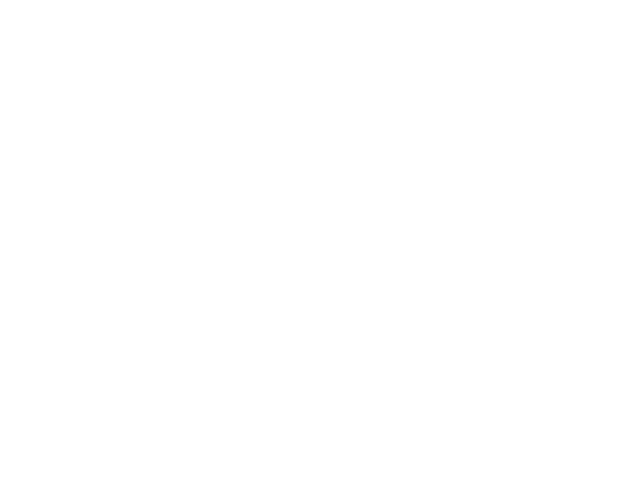

<IPython.core.display.Javascript object>


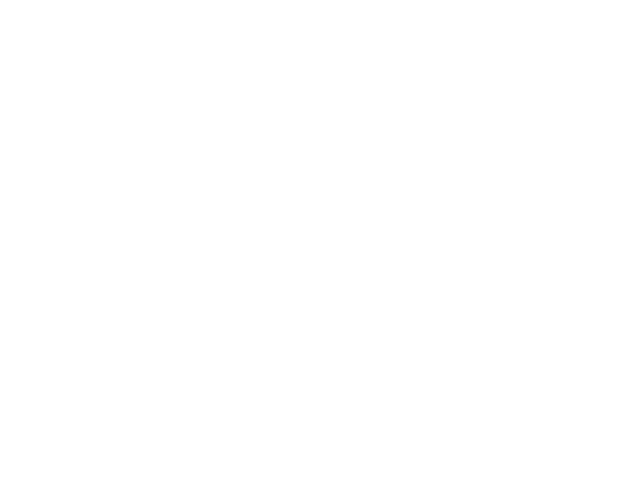

<IPython.core.display.Javascript object>


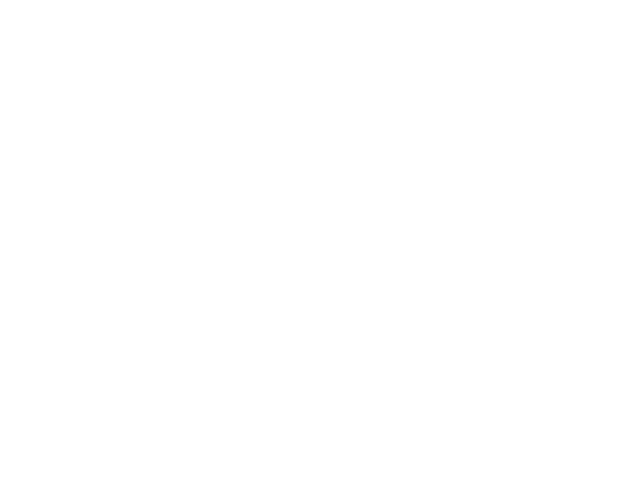

<IPython.core.display.Javascript object>


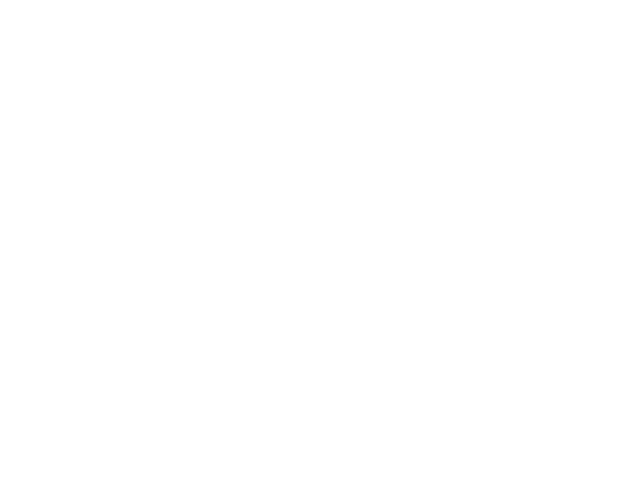

<IPython.core.display.Javascript object>


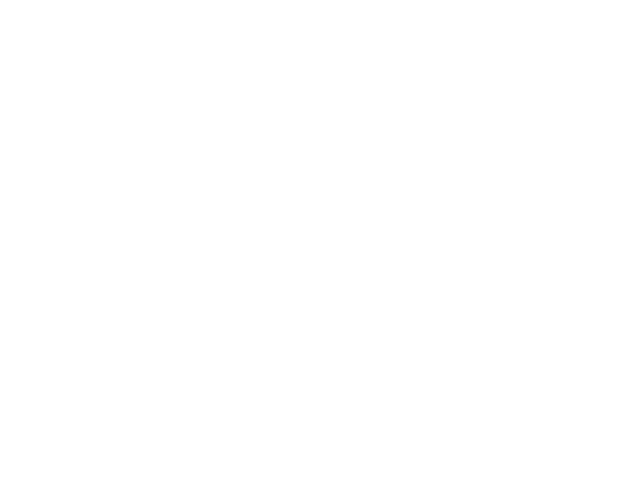

<IPython.core.display.Javascript object>


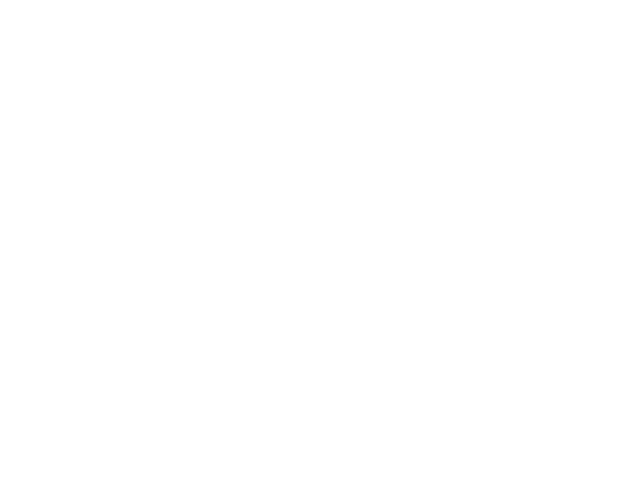

<IPython.core.display.Javascript object>


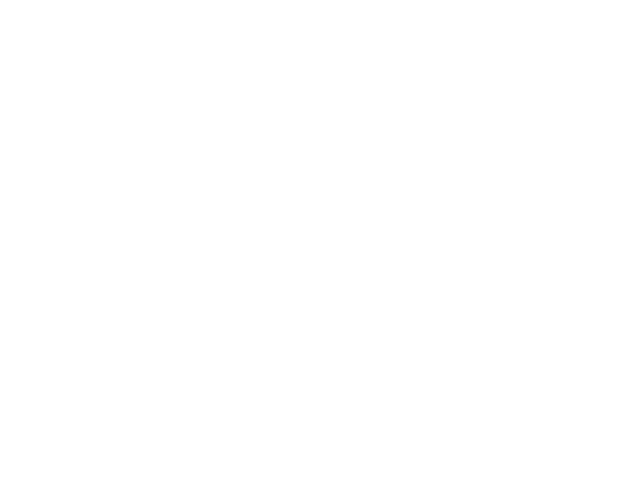

<IPython.core.display.Javascript object>


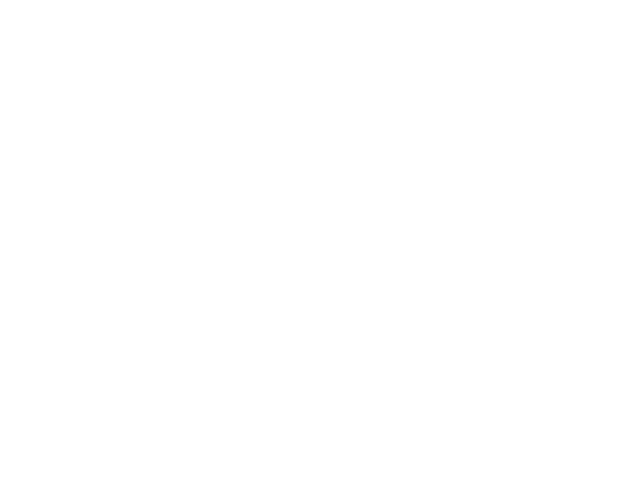

<IPython.core.display.Javascript object>


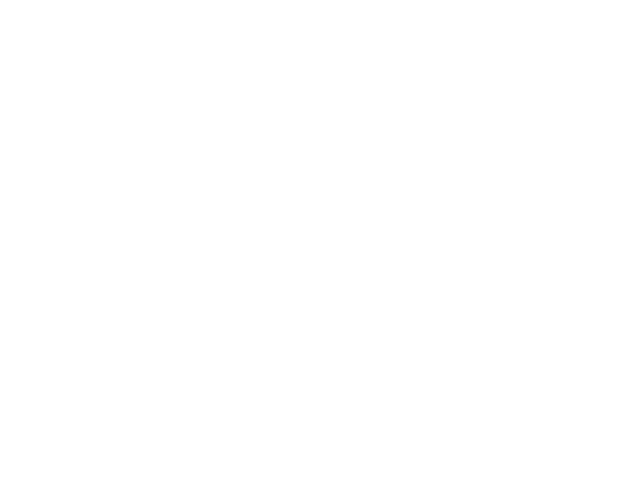

<IPython.core.display.Javascript object>


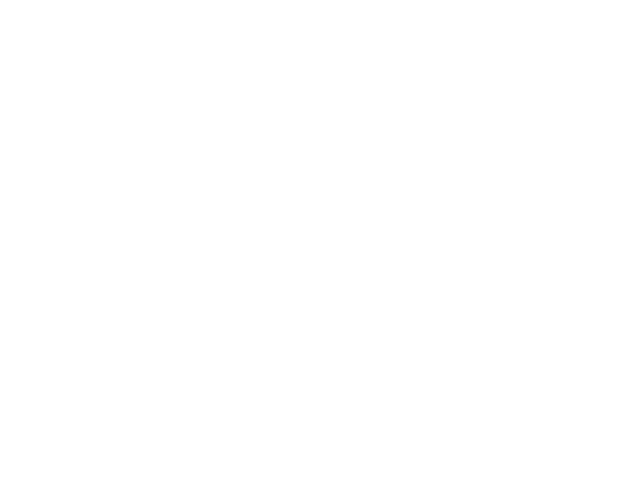

<IPython.core.display.Javascript object>


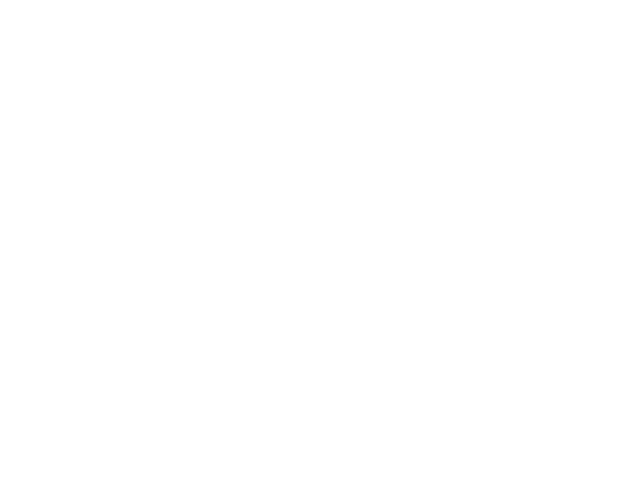

<IPython.core.display.Javascript object>


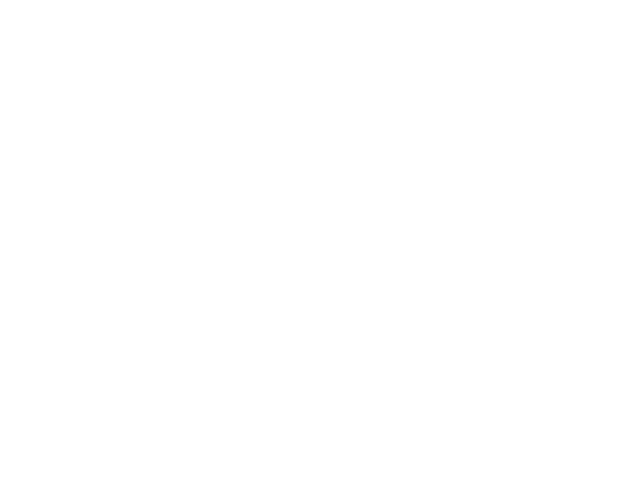

<IPython.core.display.Javascript object>


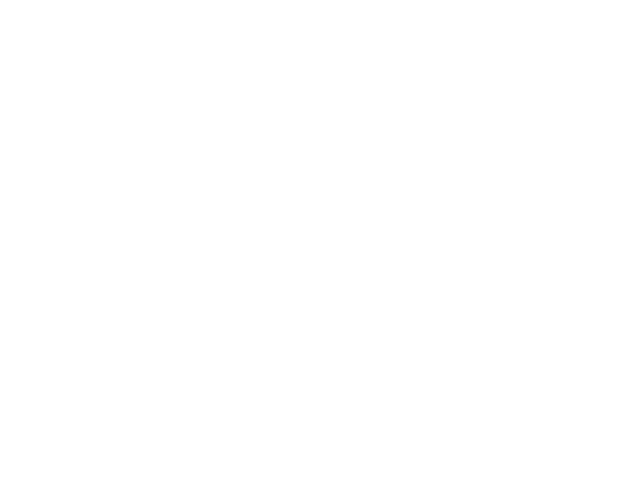

<IPython.core.display.Javascript object>


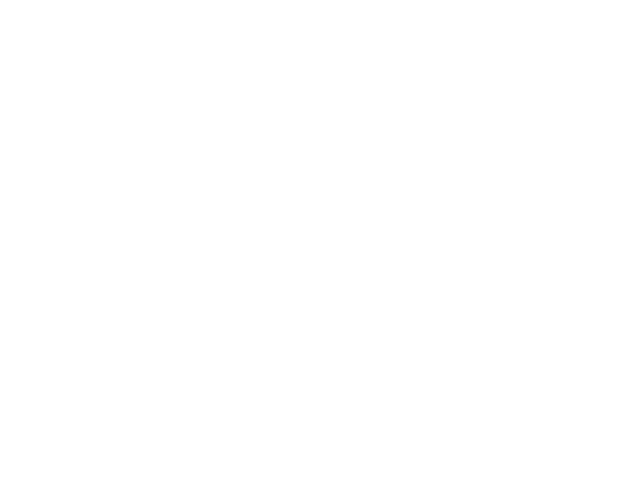

<IPython.core.display.Javascript object>


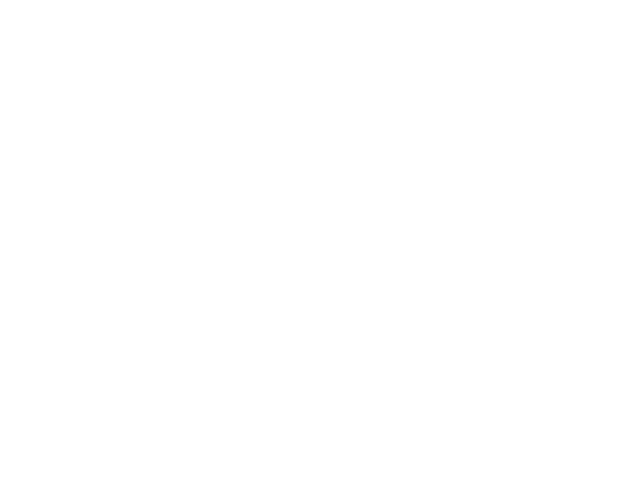

<IPython.core.display.Javascript object>


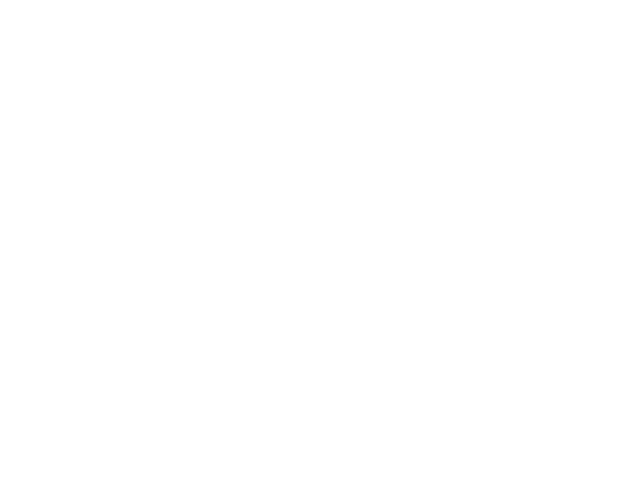

<IPython.core.display.Javascript object>


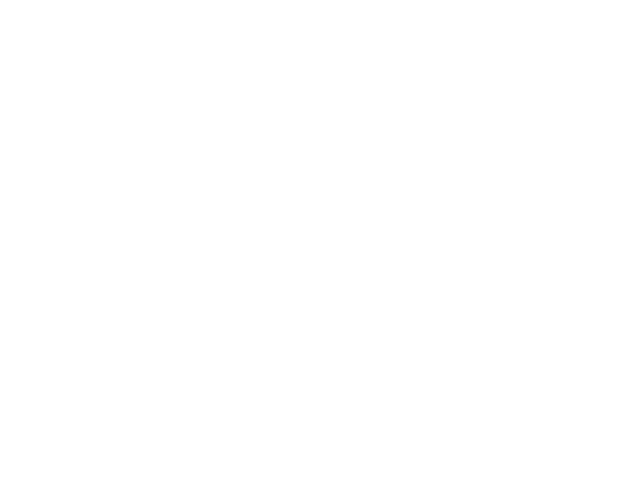

<IPython.core.display.Javascript object>


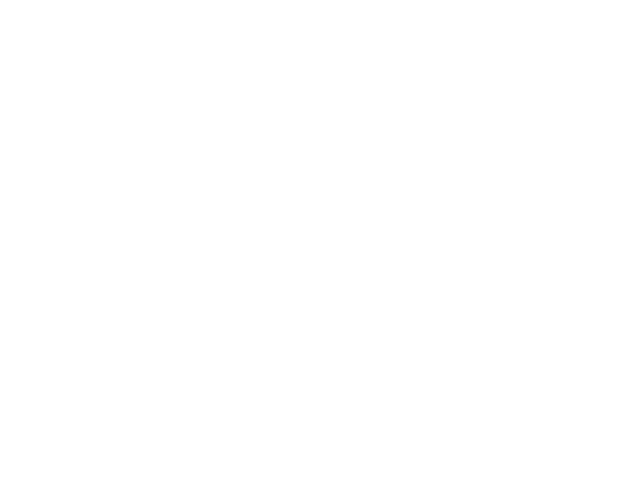

<IPython.core.display.Javascript object>


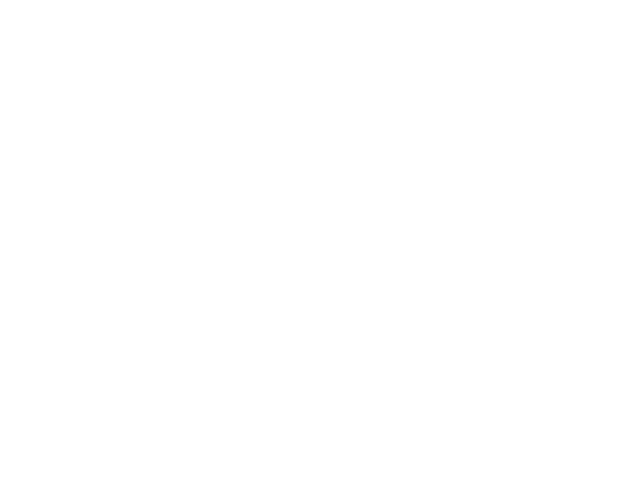

<IPython.core.display.Javascript object>


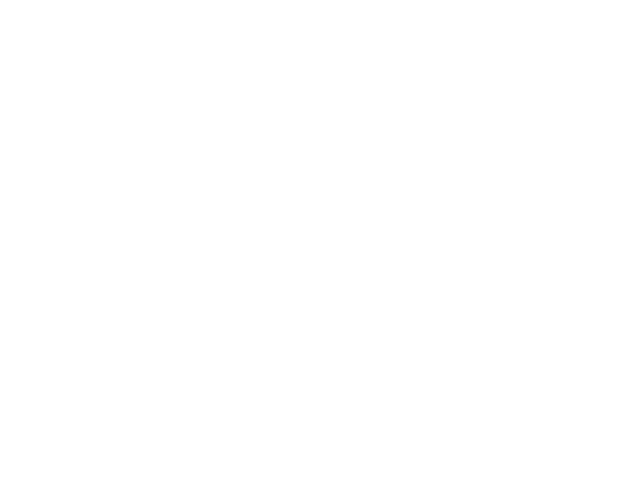

<IPython.core.display.Javascript object>


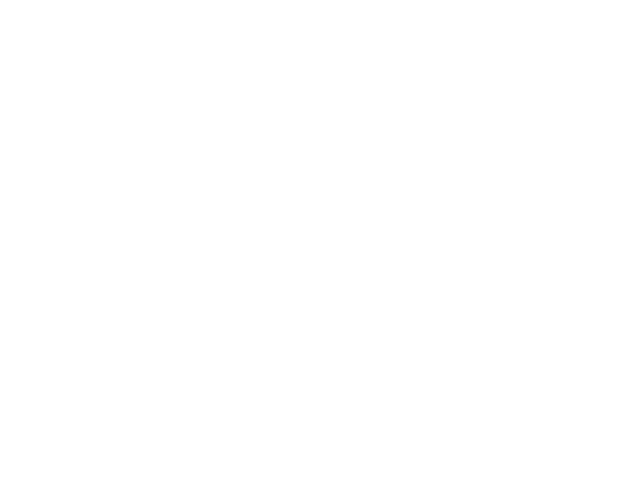

<IPython.core.display.Javascript object>


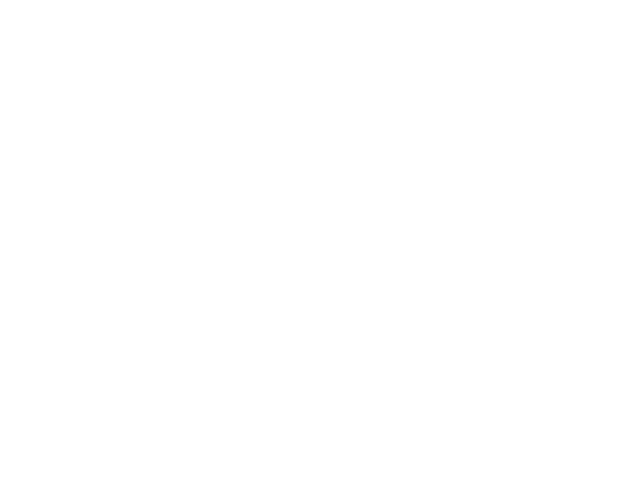

<IPython.core.display.Javascript object>


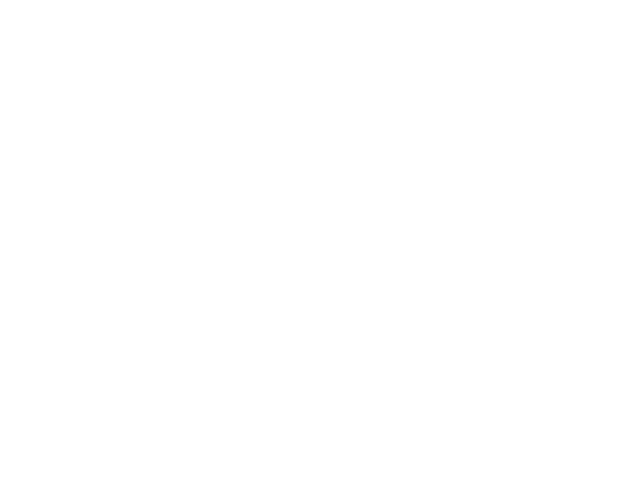

<IPython.core.display.Javascript object>


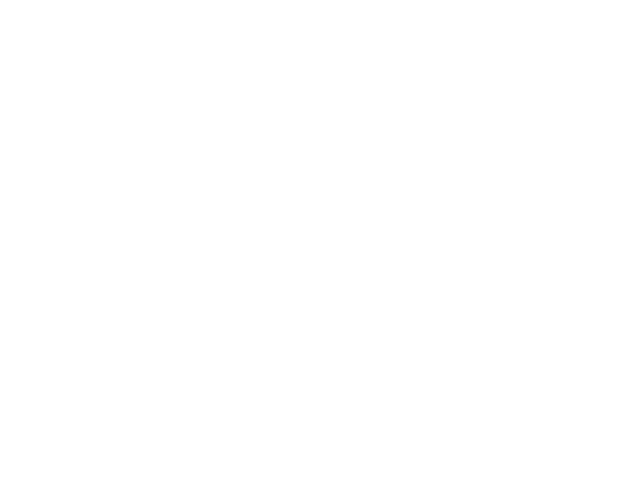

<IPython.core.display.Javascript object>


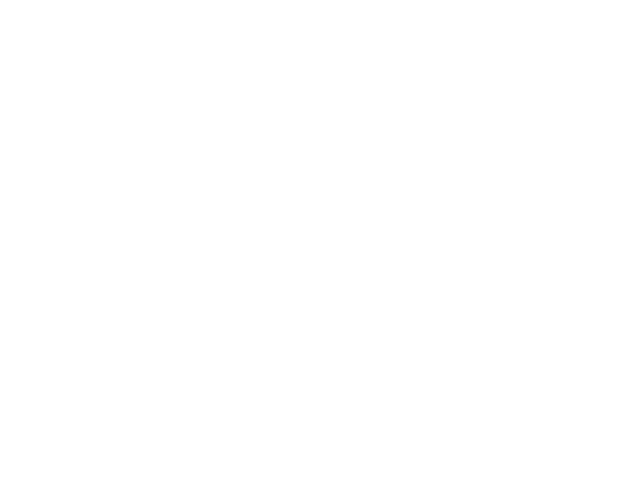

<IPython.core.display.Javascript object>


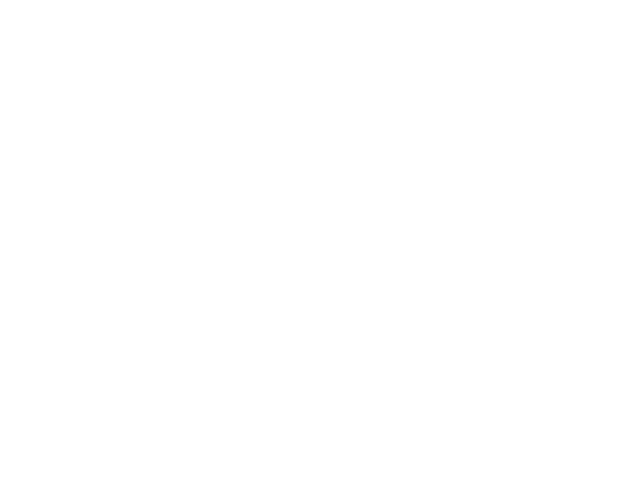

<IPython.core.display.Javascript object>


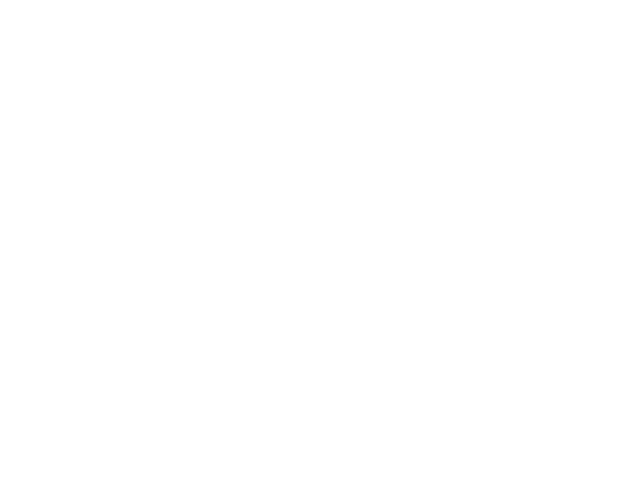

<IPython.core.display.Javascript object>


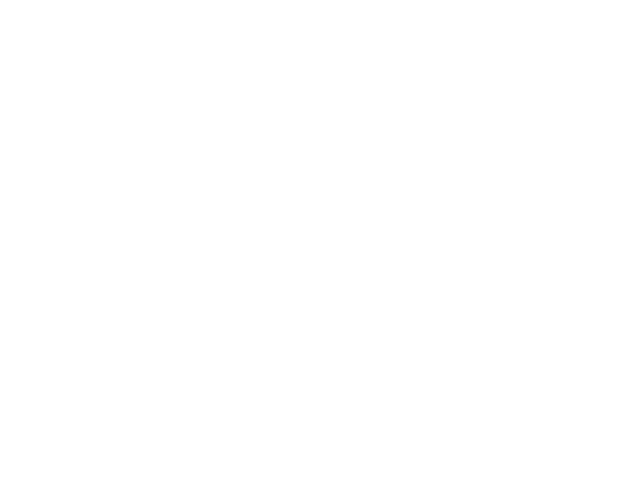

<IPython.core.display.Javascript object>


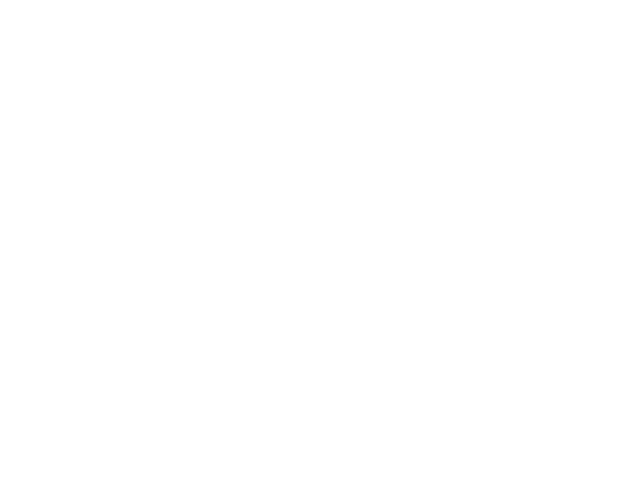

<IPython.core.display.Javascript object>


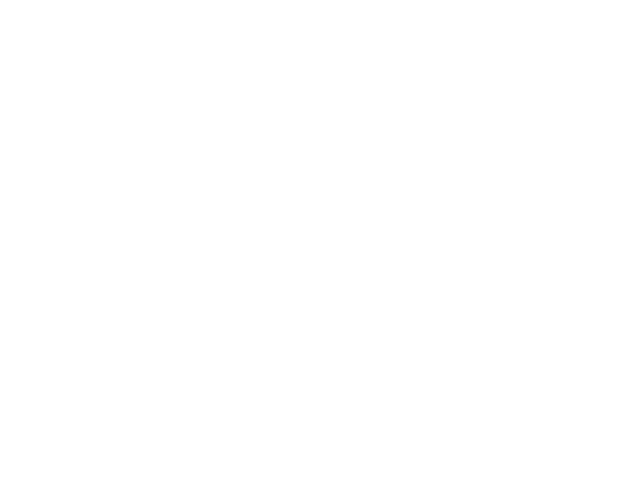

<IPython.core.display.Javascript object>


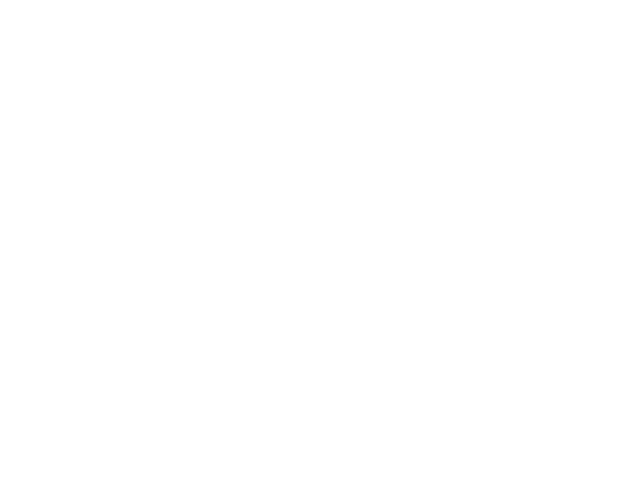

<IPython.core.display.Javascript object>


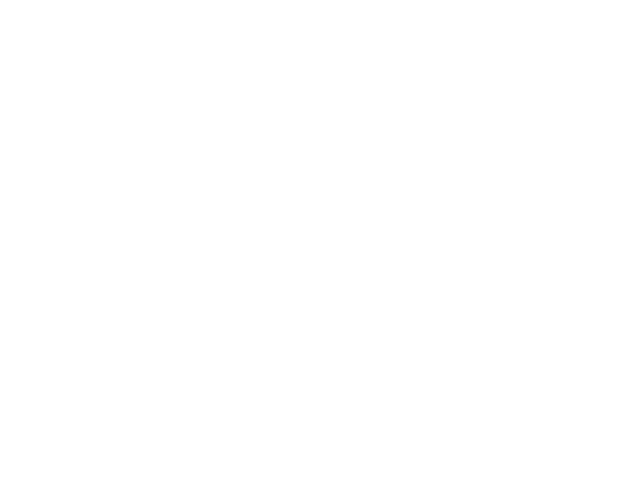

<IPython.core.display.Javascript object>


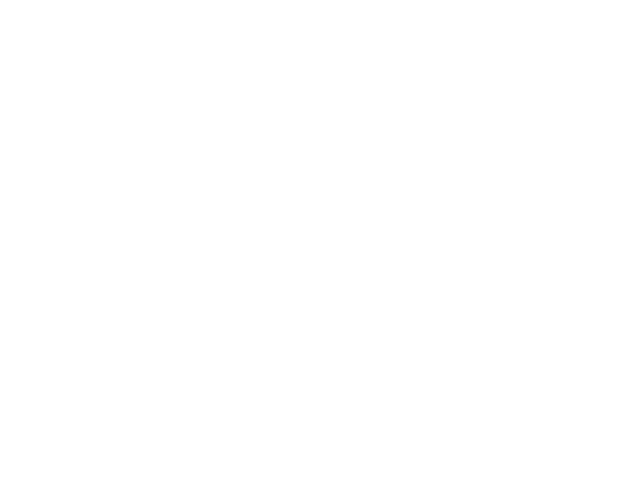

<IPython.core.display.Javascript object>


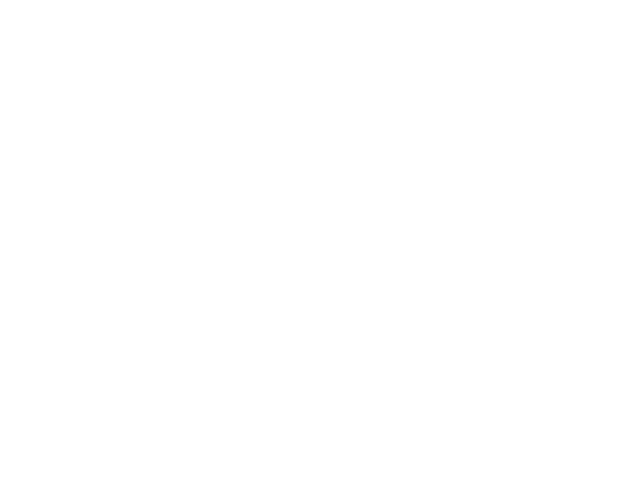

<IPython.core.display.Javascript object>


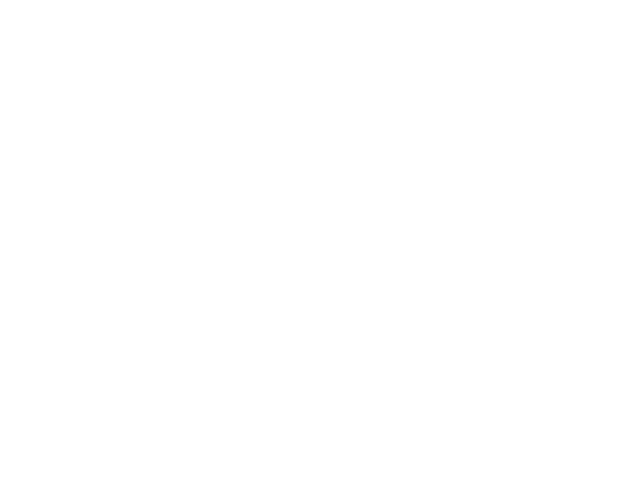

<IPython.core.display.Javascript object>


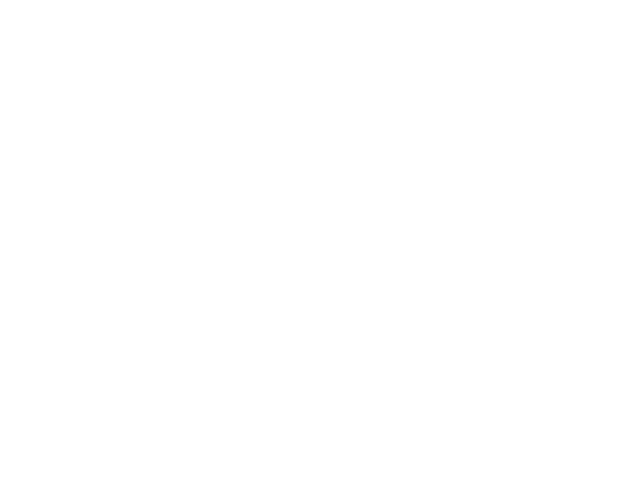

<IPython.core.display.Javascript object>


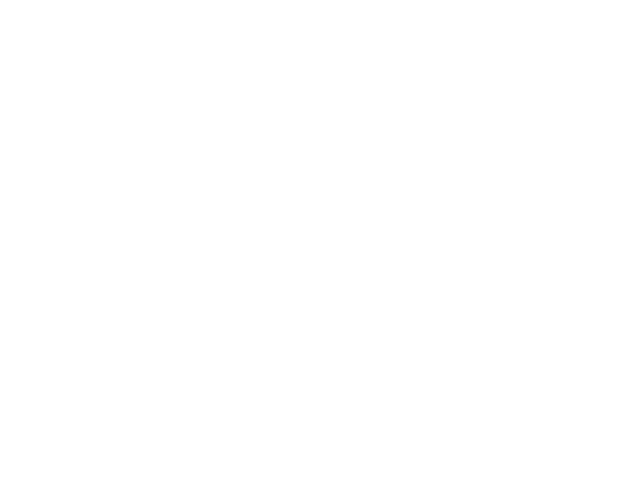

<IPython.core.display.Javascript object>


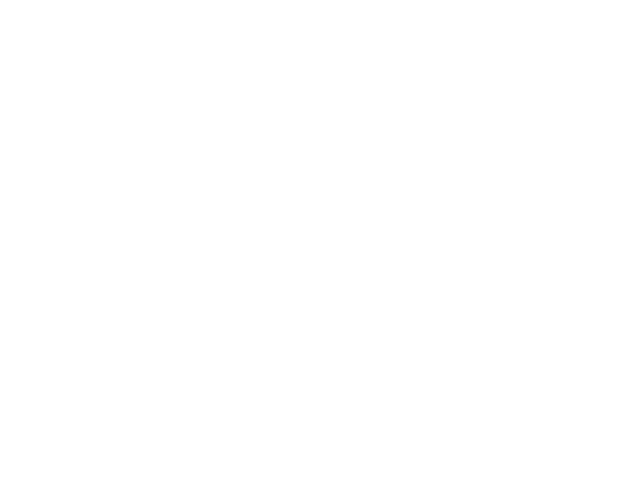

<IPython.core.display.Javascript object>


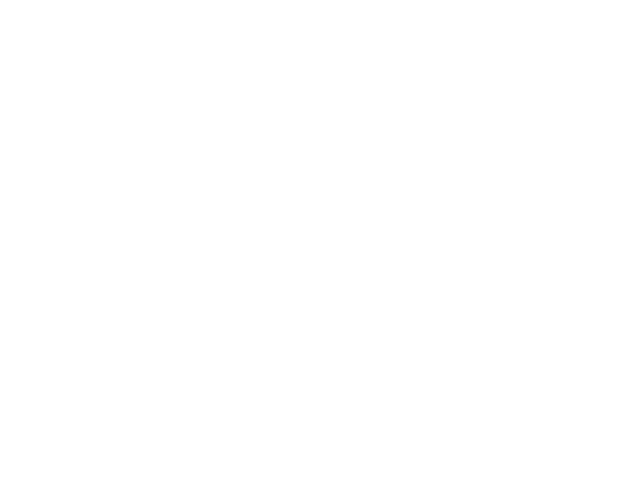

<IPython.core.display.Javascript object>


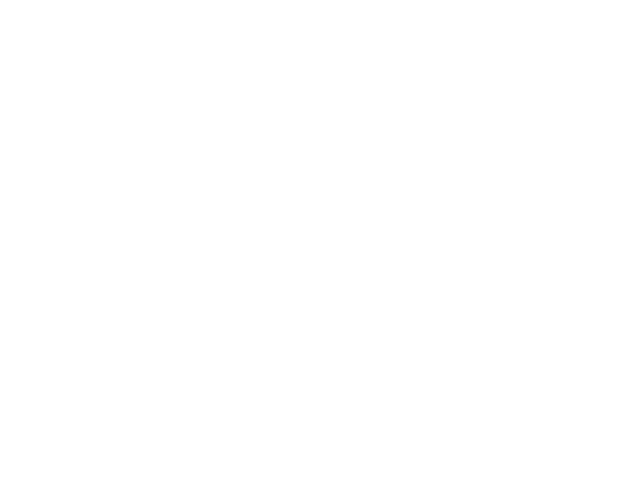

<IPython.core.display.Javascript object>


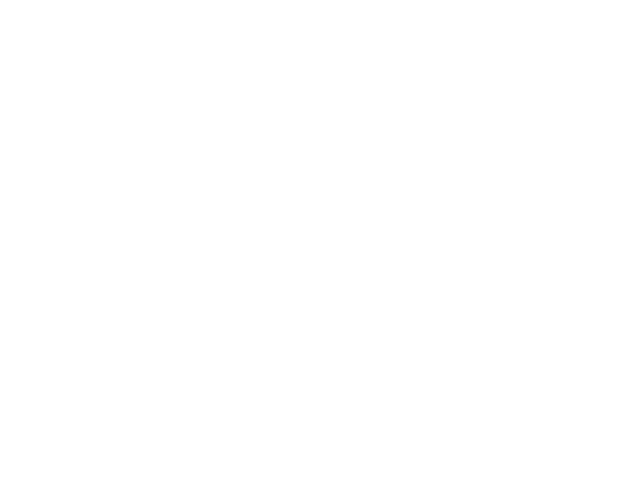

<IPython.core.display.Javascript object>


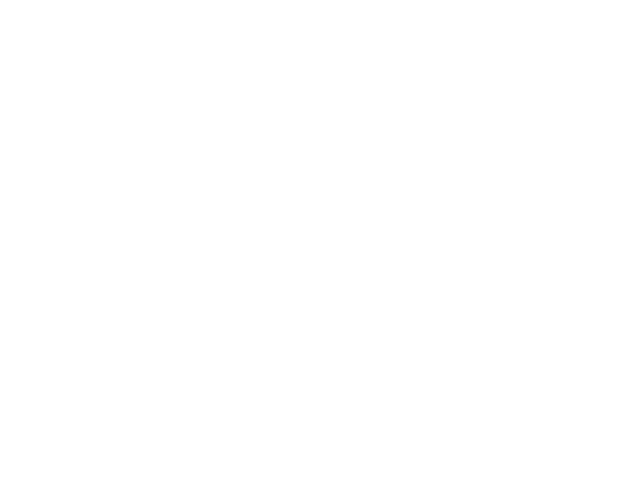

<IPython.core.display.Javascript object>


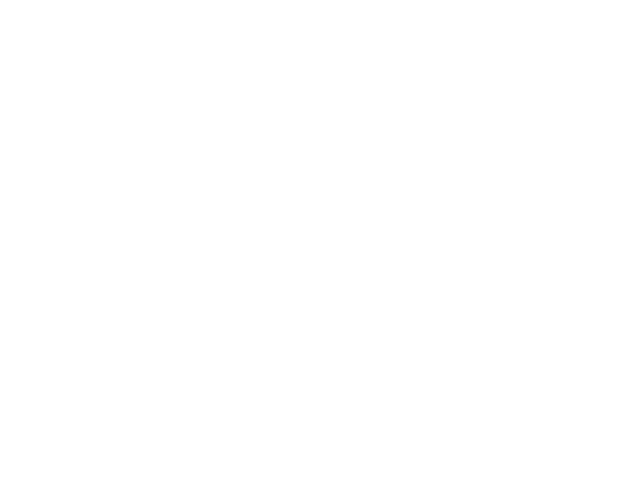

<IPython.core.display.Javascript object>


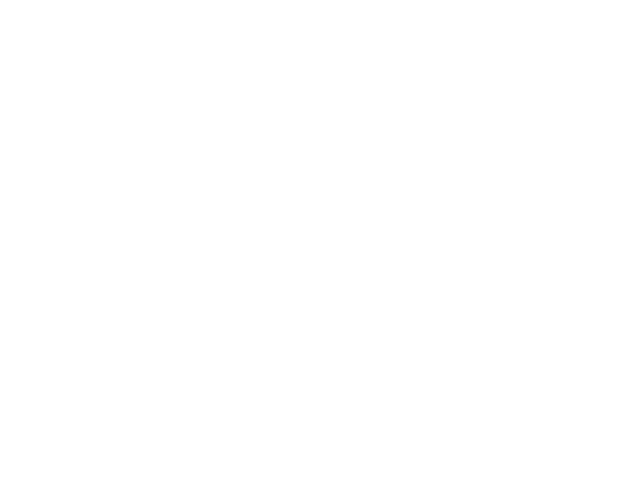

<IPython.core.display.Javascript object>


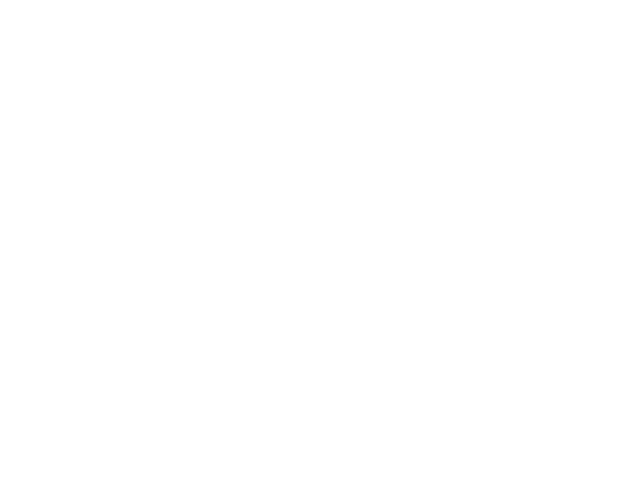

<IPython.core.display.Javascript object>


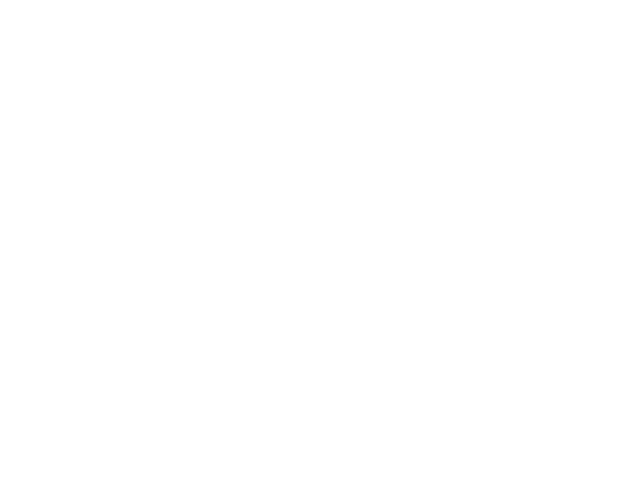

<IPython.core.display.Javascript object>


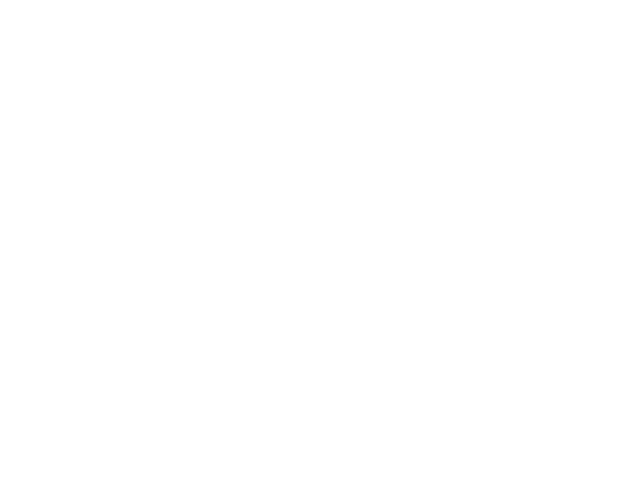

<IPython.core.display.Javascript object>


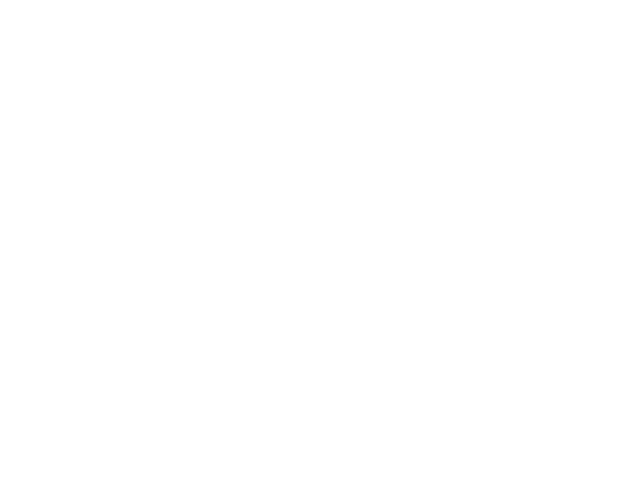

<IPython.core.display.Javascript object>


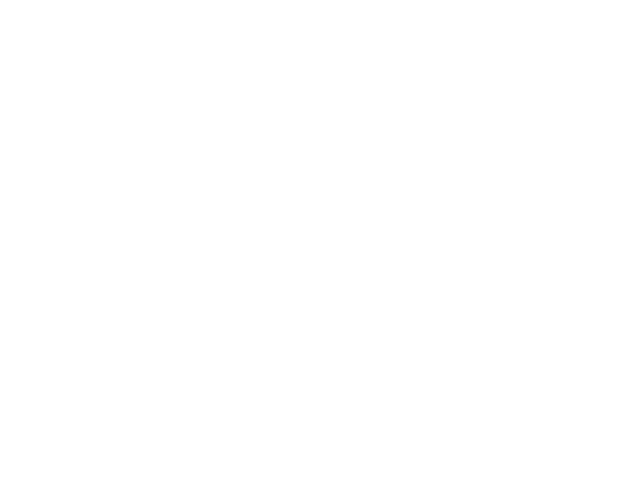

<IPython.core.display.Javascript object>


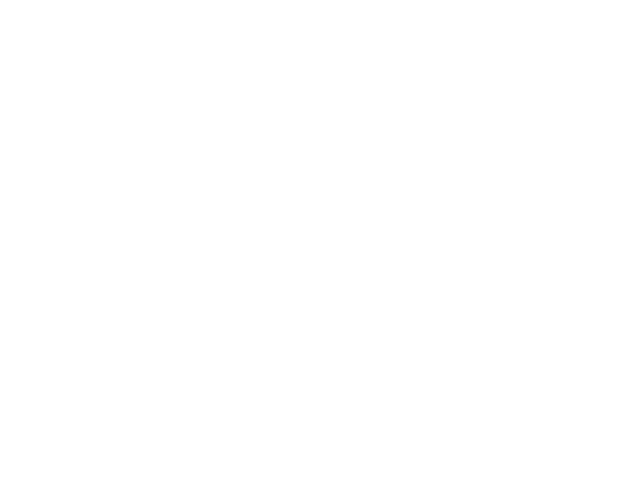

<IPython.core.display.Javascript object>


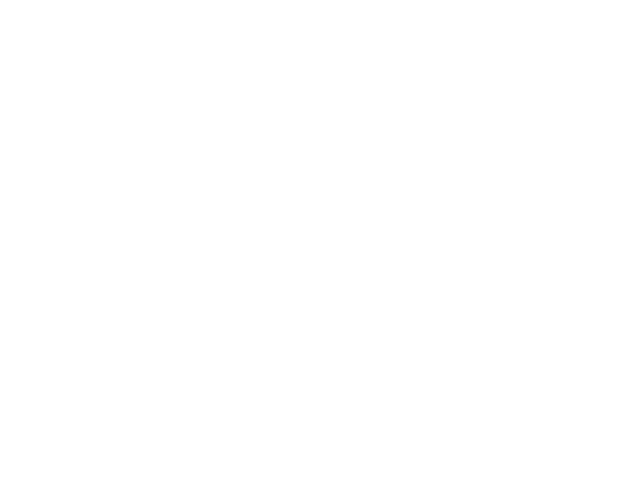

<IPython.core.display.Javascript object>


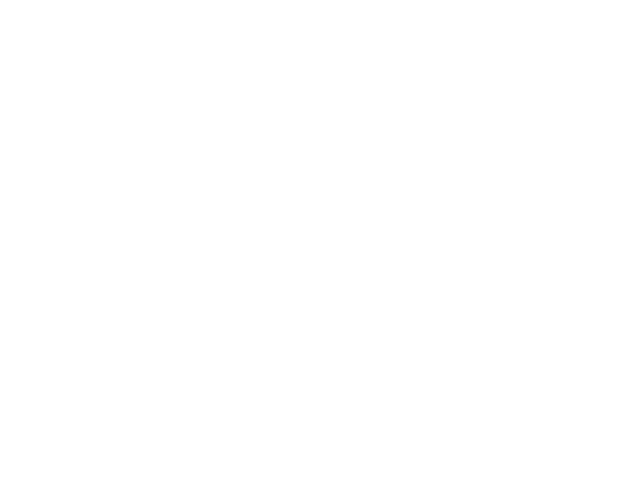

<IPython.core.display.Javascript object>


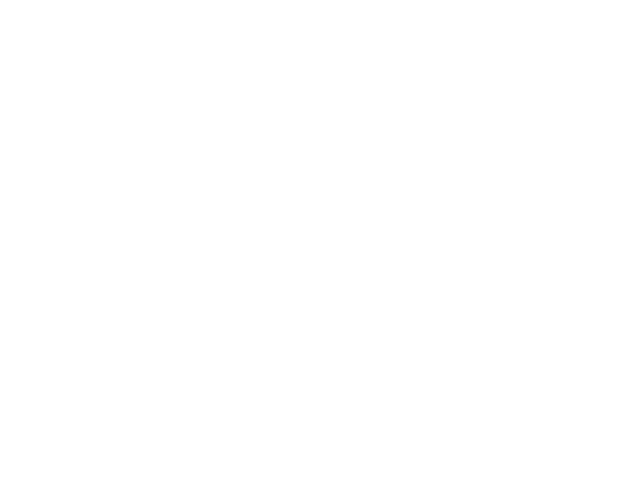

<IPython.core.display.Javascript object>


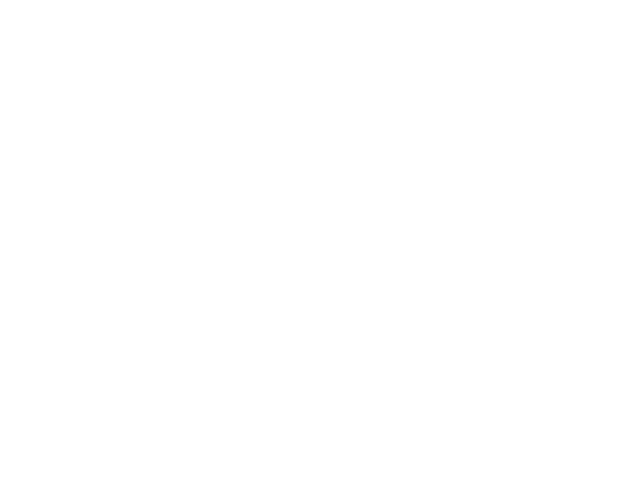

<IPython.core.display.Javascript object>


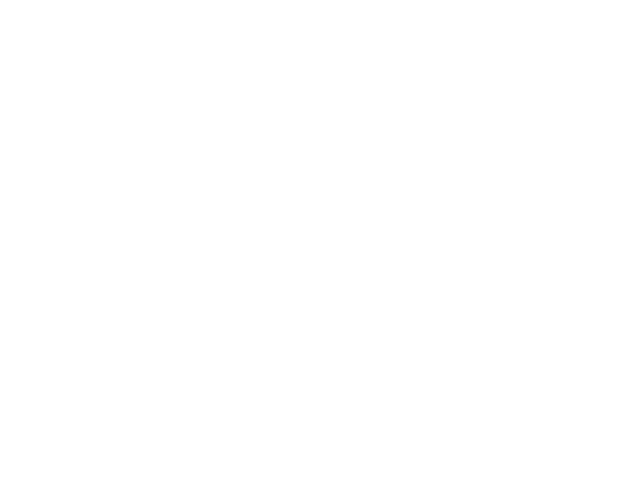

<IPython.core.display.Javascript object>


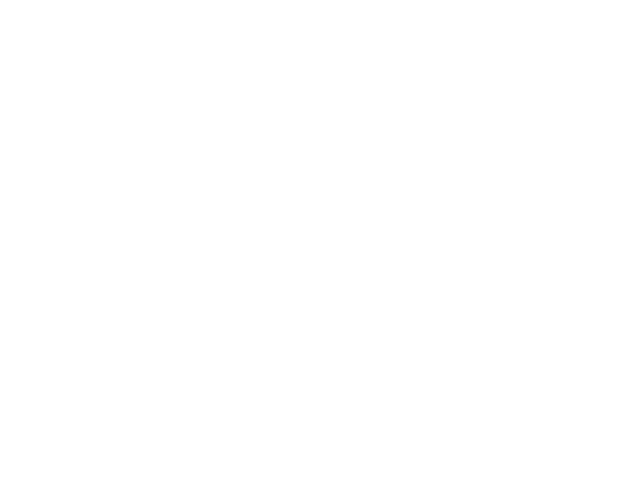

<IPython.core.display.Javascript object>


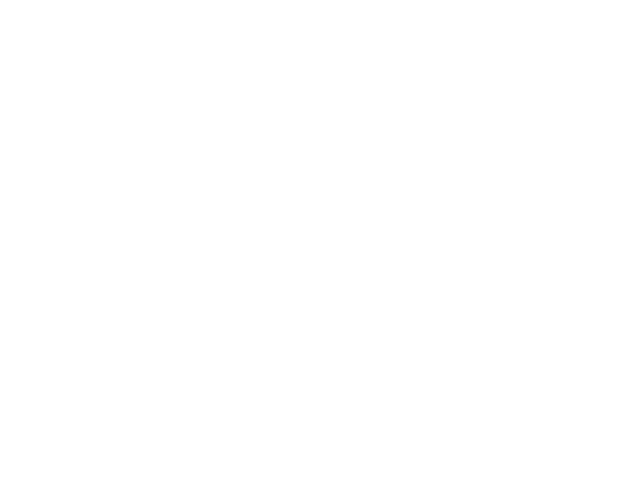

<IPython.core.display.Javascript object>


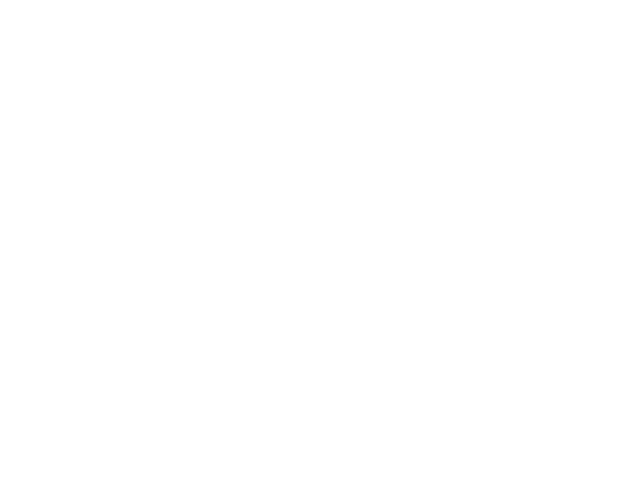

<IPython.core.display.Javascript object>


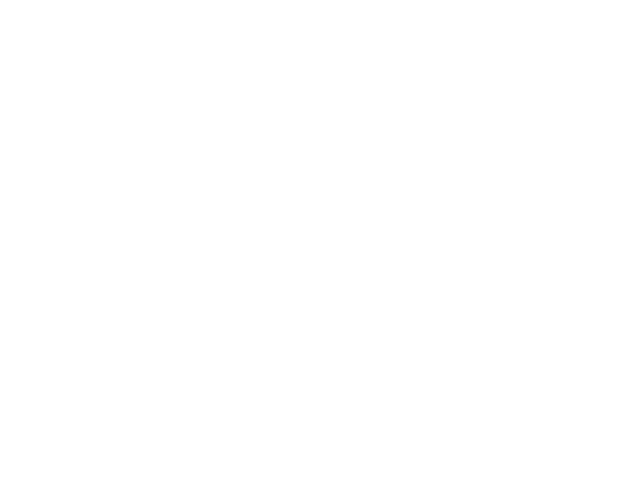

<IPython.core.display.Javascript object>


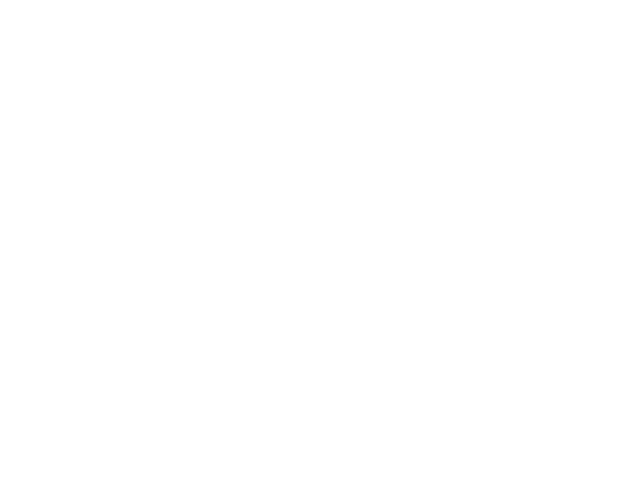

<IPython.core.display.Javascript object>


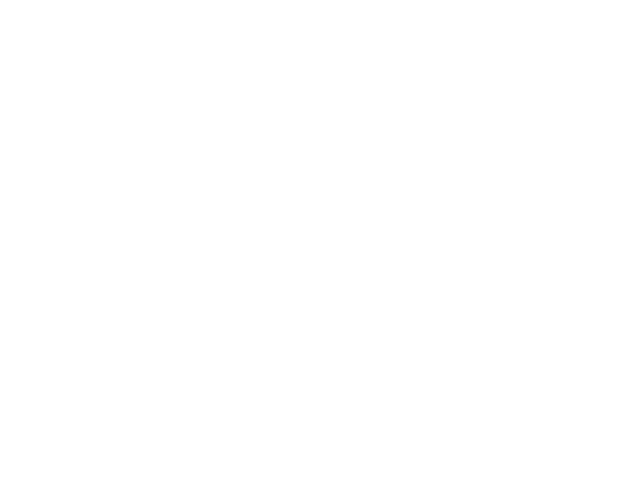

<IPython.core.display.Javascript object>


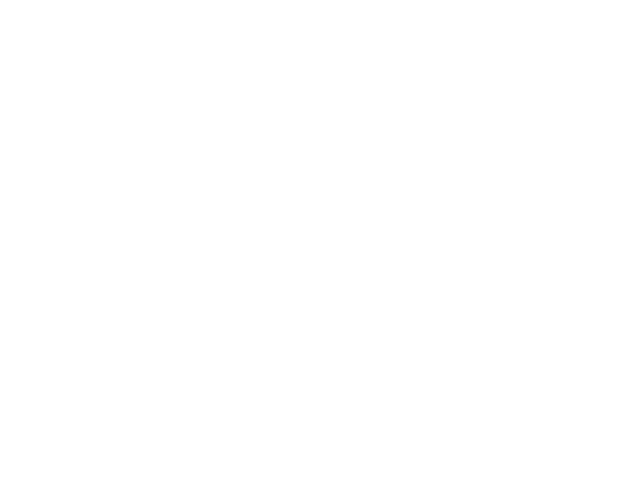

<IPython.core.display.Javascript object>


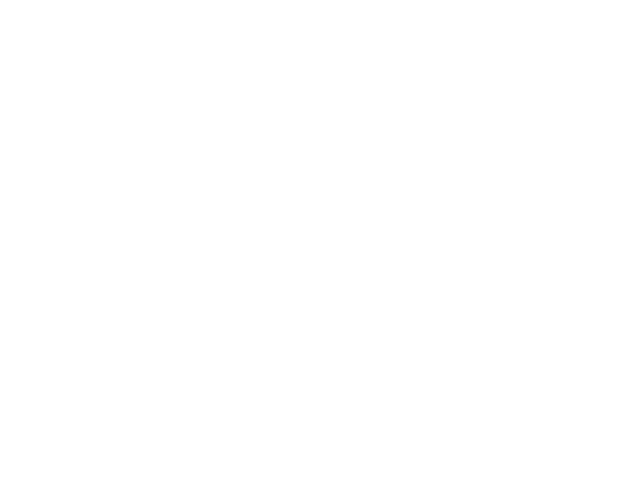

<IPython.core.display.Javascript object>


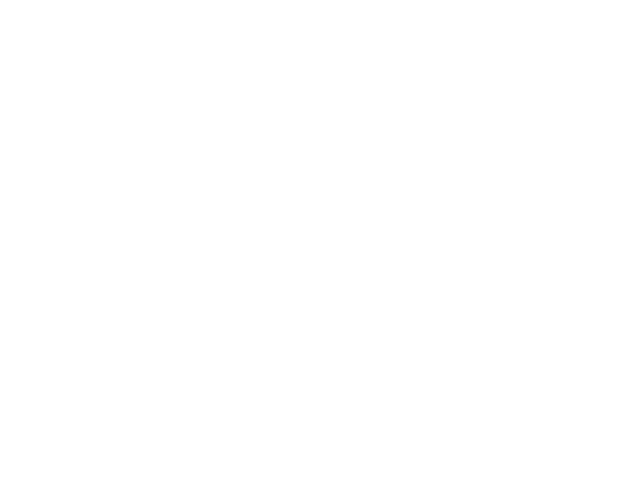

<IPython.core.display.Javascript object>


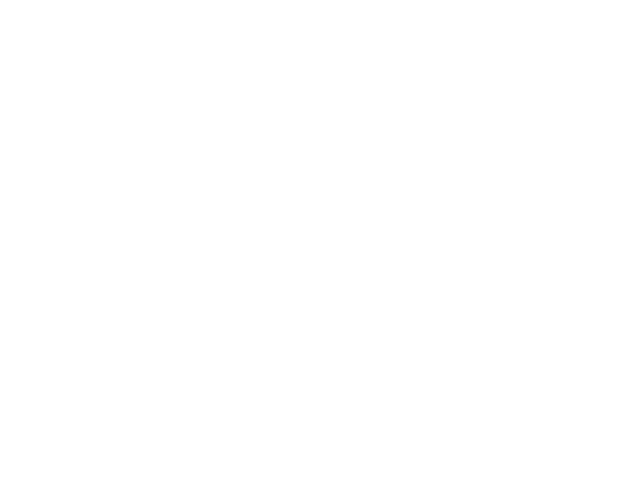

<IPython.core.display.Javascript object>


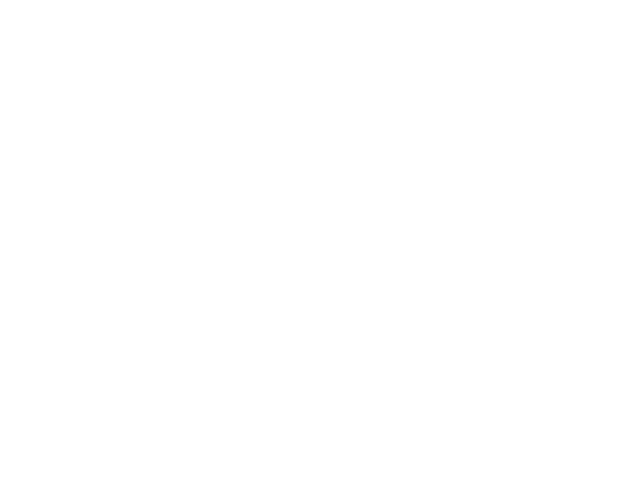

<IPython.core.display.Javascript object>


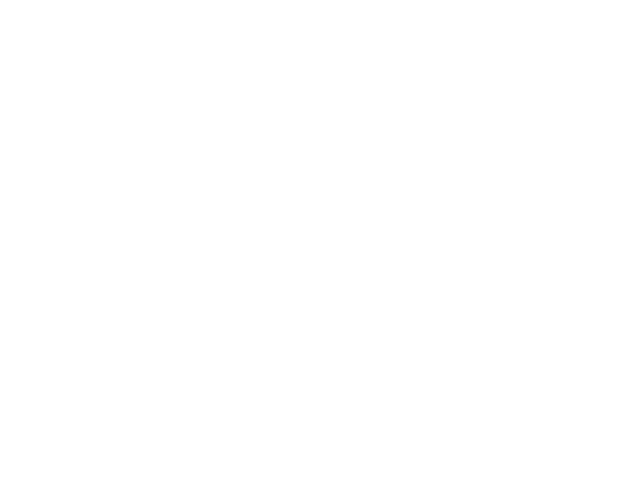

<IPython.core.display.Javascript object>


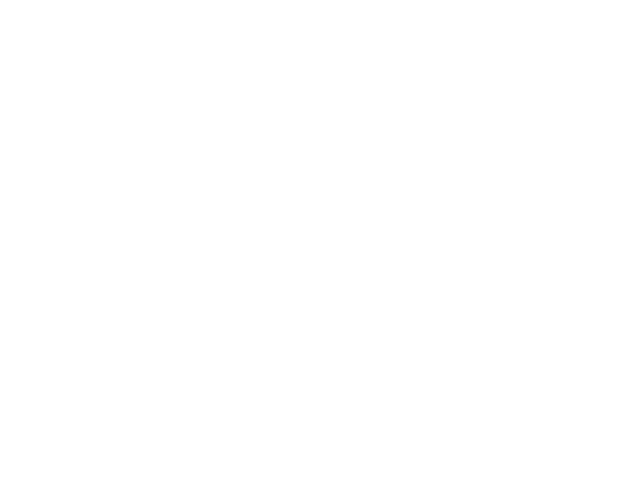

<IPython.core.display.Javascript object>


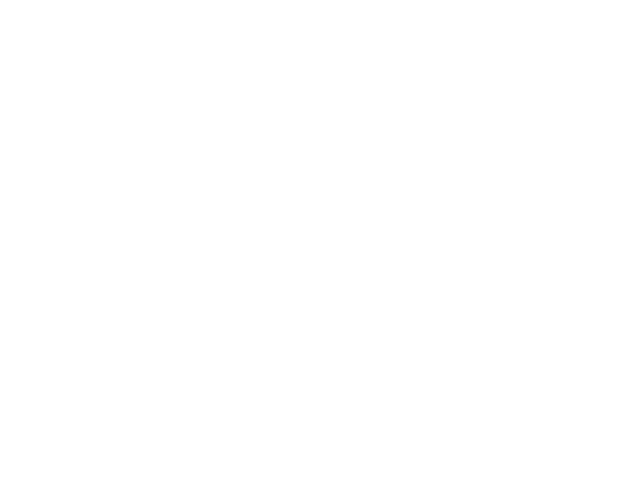

<IPython.core.display.Javascript object>


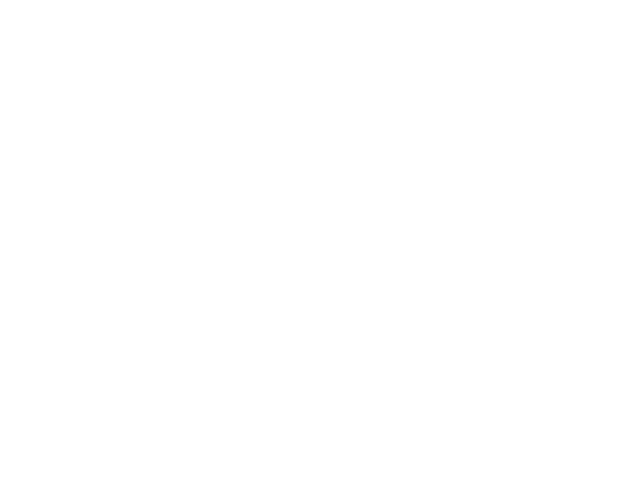

<IPython.core.display.Javascript object>


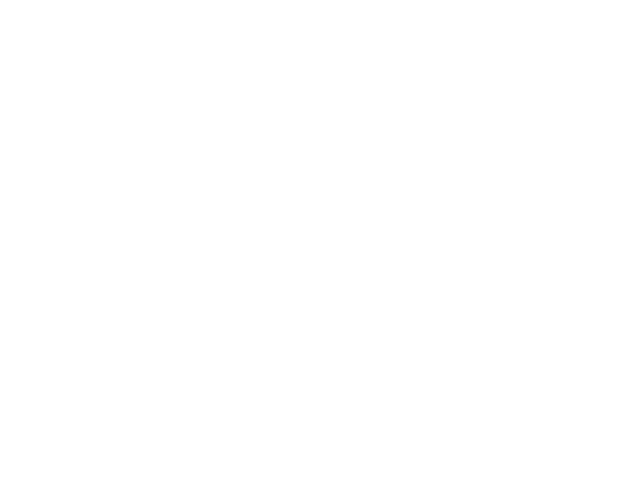

<IPython.core.display.Javascript object>


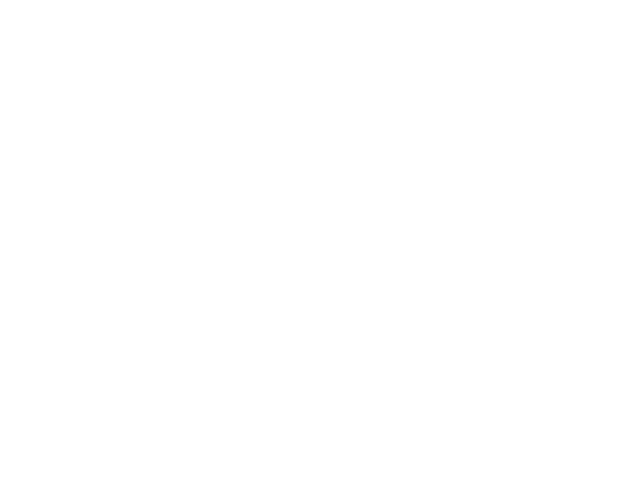

<IPython.core.display.Javascript object>


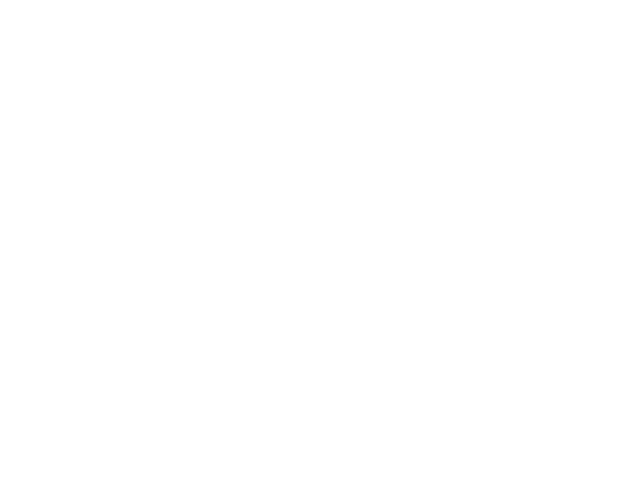

<IPython.core.display.Javascript object>


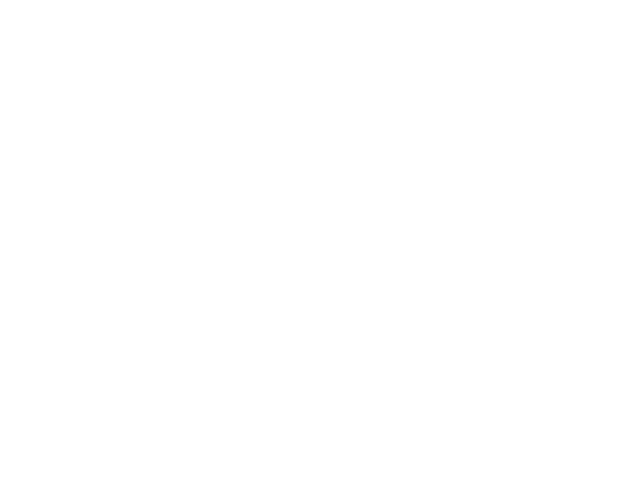

<IPython.core.display.Javascript object>


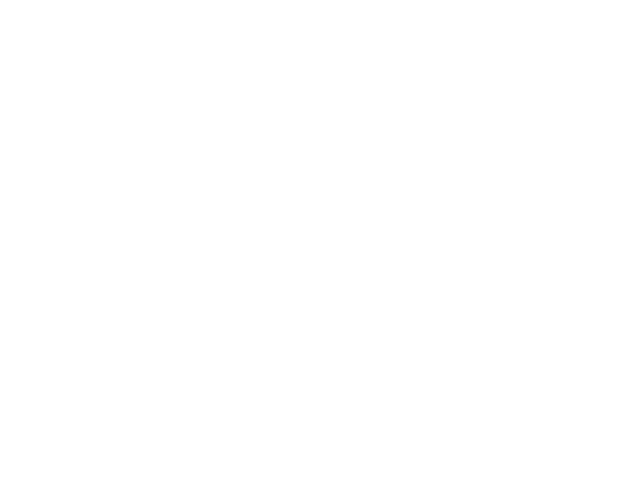

<IPython.core.display.Javascript object>


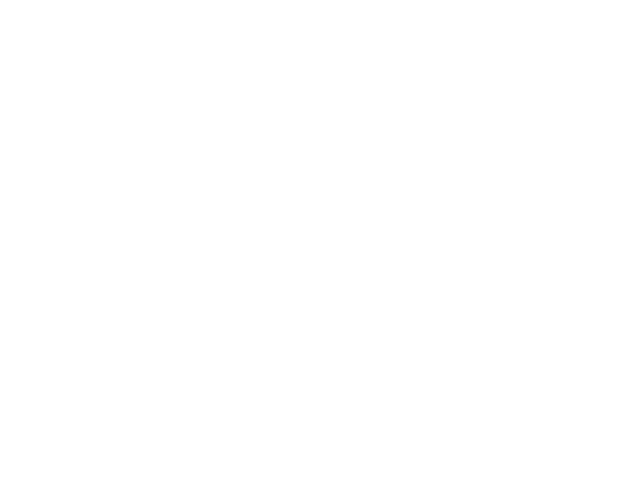

<IPython.core.display.Javascript object>


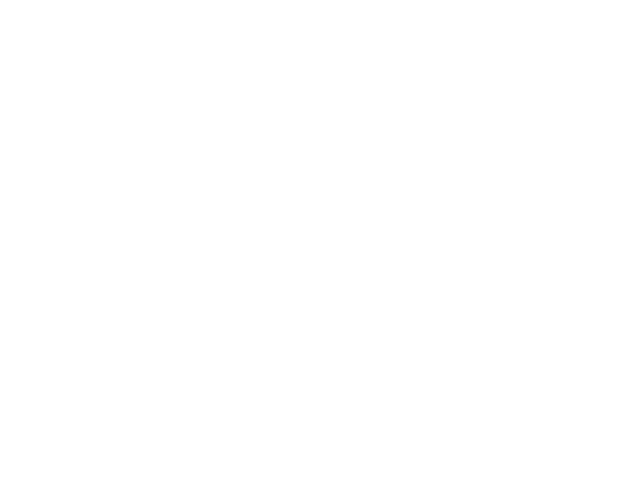

<IPython.core.display.Javascript object>


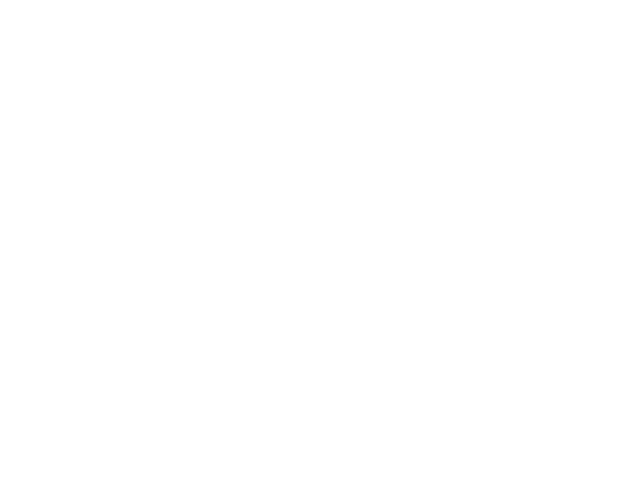

<IPython.core.display.Javascript object>


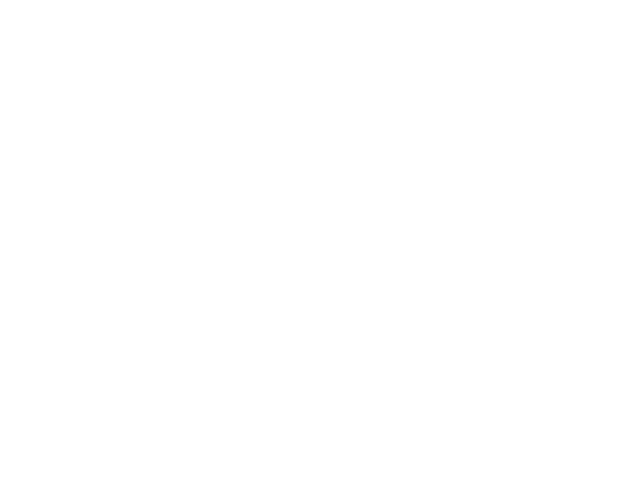

<IPython.core.display.Javascript object>


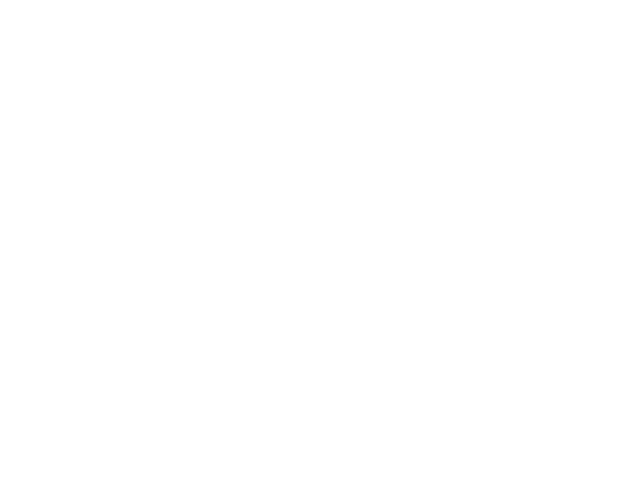

<IPython.core.display.Javascript object>


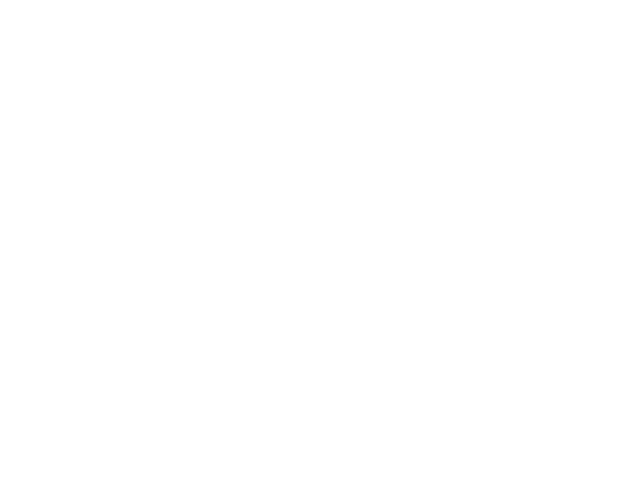

<IPython.core.display.Javascript object>


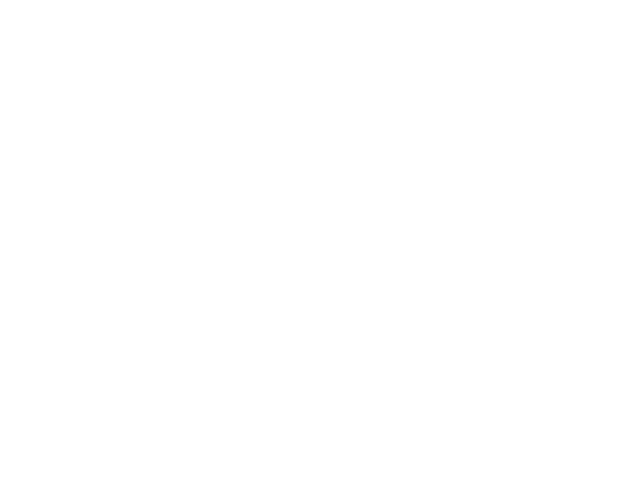

<IPython.core.display.Javascript object>


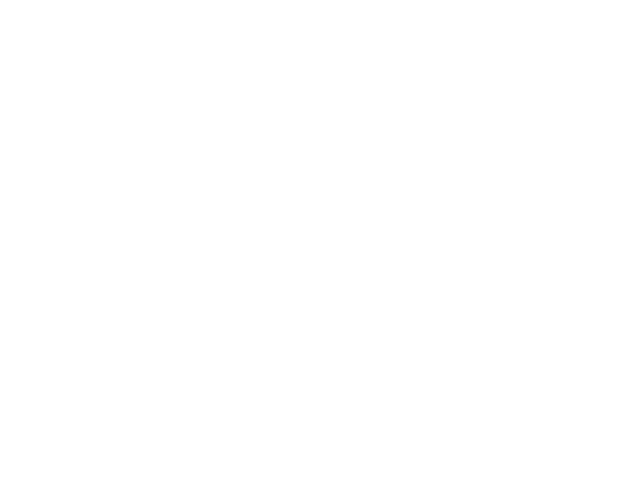

<IPython.core.display.Javascript object>


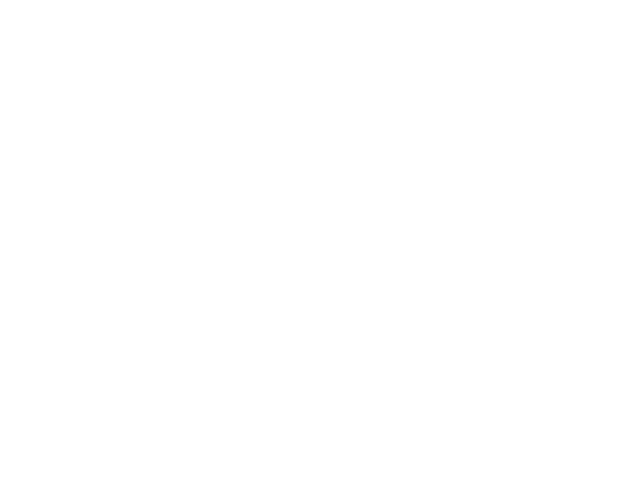

<IPython.core.display.Javascript object>


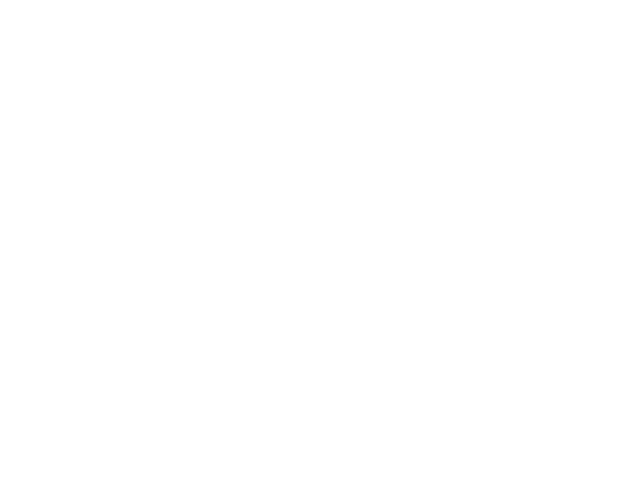

<IPython.core.display.Javascript object>


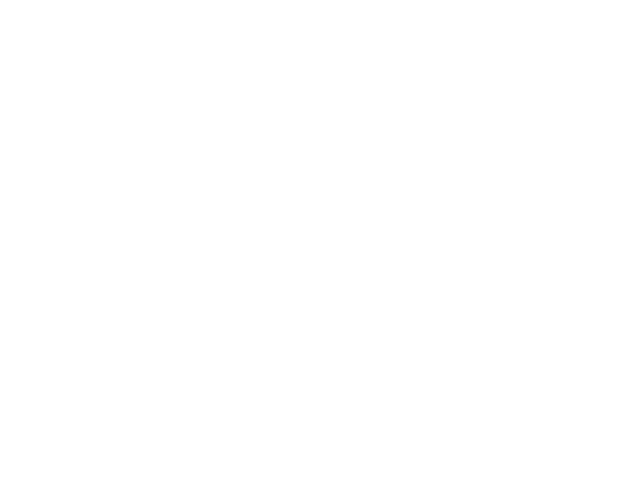

<IPython.core.display.Javascript object>


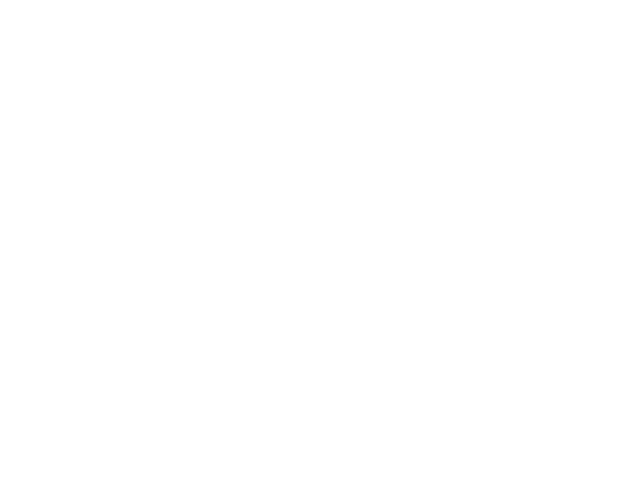

<IPython.core.display.Javascript object>


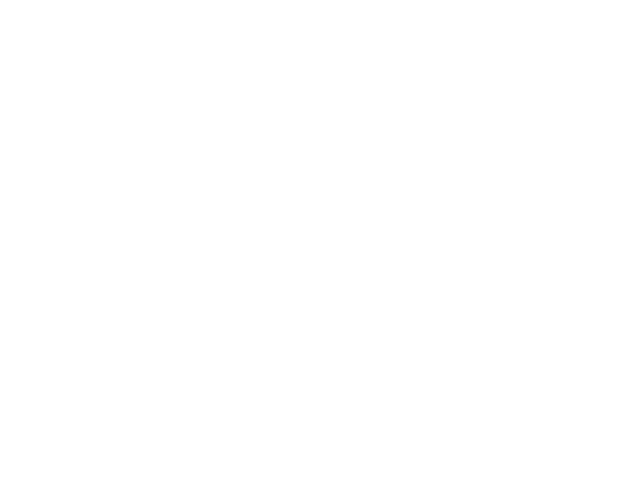

<IPython.core.display.Javascript object>


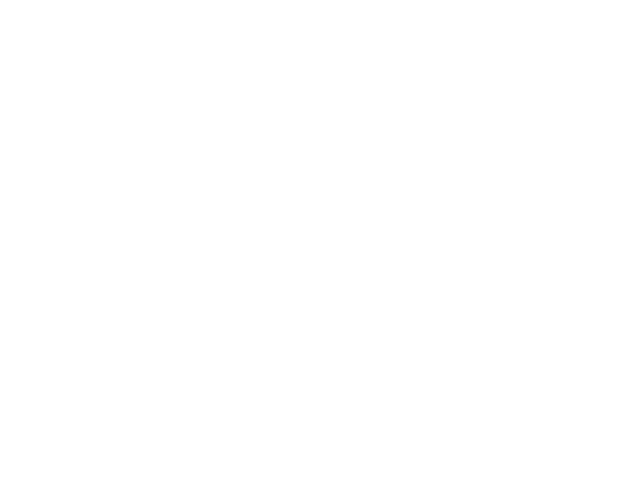

<IPython.core.display.Javascript object>


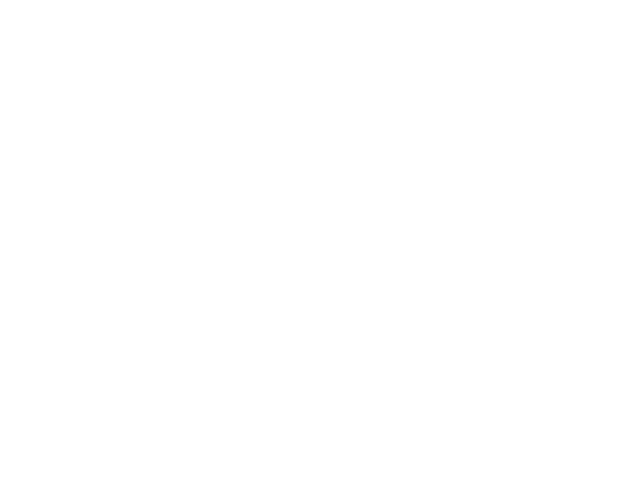

<IPython.core.display.Javascript object>


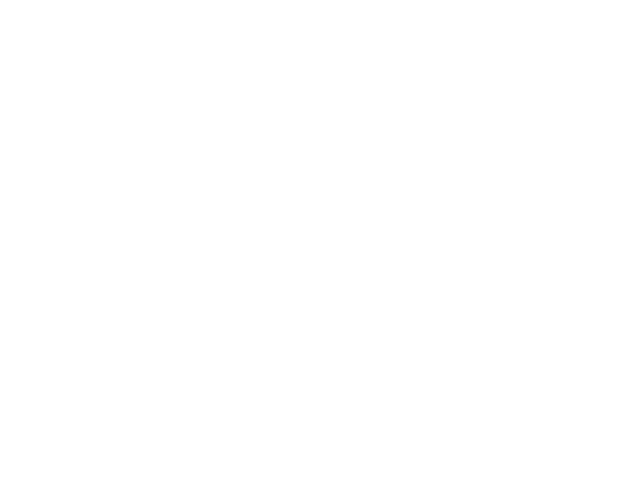

<IPython.core.display.Javascript object>


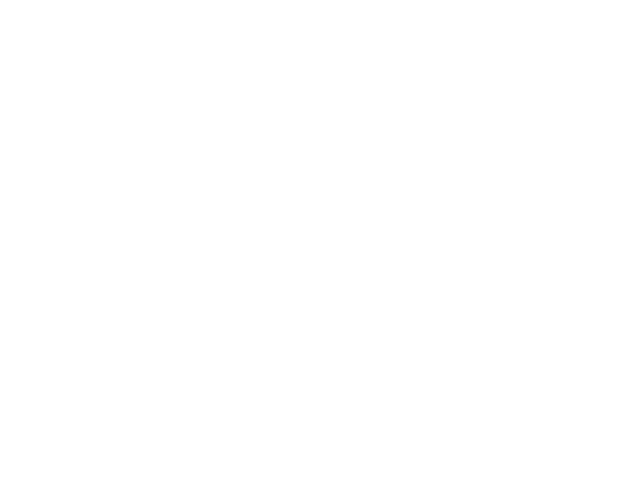

New video was added to the project! Use the function 'extract_frames' to select frames for labeling.
The outlier frames are extracted. They are stored in the subdirectory labeled-data\vIRt32_0410_4910.
Once you extracted frames for all videos, use 'refine_labels' to manually correct the labels.
Method  jump  found  102327  putative outlier frames.
Do you want to proceed with extracting  100  of those?
If this list is very large, perhaps consider changing the paramters (start, stop, epsilon, comparisonbodyparts) or use a different method.
yes/noy
Loading video...
Duration of video [s]:  15019.76 , recorded @  25.0 fps!
Overall # of frames:  375494 with (cropped) frame dimensions: 
Kmeans-quantization based extracting of frames from 0.0  seconds to 15019.76  seconds.
Extracting and downsampling... 102327  frames from the video.


102327it [1:54:53, 18.38it/s]


Kmeans clustering ... (this might take a while)
Let's select frames indices: [16573, 135204, 159610, 266953, 101209, 225144, 175039, 225541, 317000, 258728, 303560, 24096, 203518, 20684, 108812, 141790, 77364, 12784, 60374, 274845, 257315, 15180, 116387, 8736, 295986, 236515, 17801, 7832, 9693, 73565, 25433, 169058, 114998, 226734, 309483, 93342, 295356, 303015, 330481, 283590, 197558, 356973, 60378, 374731, 65274, 55649, 349801, 35183, 1179, 33280, 94460, 267013, 40411, 367067, 277200, 142984, 271360, 312350, 97111, 67916, 153599, 351920, 339609, 248201, 296912, 345236, 370455, 343655, 101409, 28896, 177421, 30558, 22898, 166655, 184277, 339998, 267113, 202462, 114175, 248347, 94550, 254974, 279517, 27137, 139234, 130290, 275505, 357033, 196650, 243686, 127934, 67674, 22919, 62214, 295337, 95073, 90693, 256970, 141912, 214441]


<IPython.core.display.Javascript object>


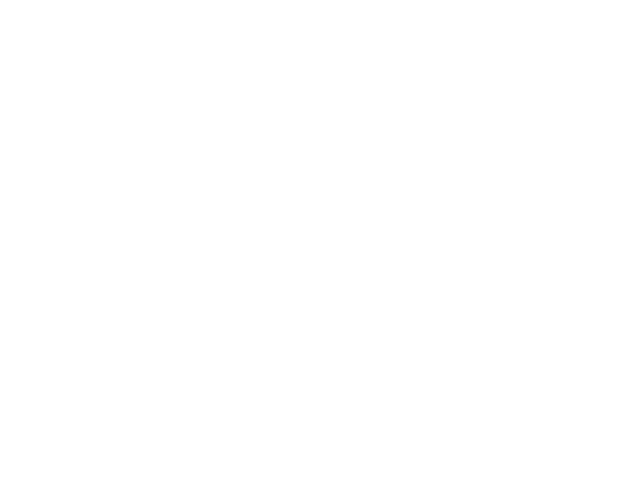

<IPython.core.display.Javascript object>


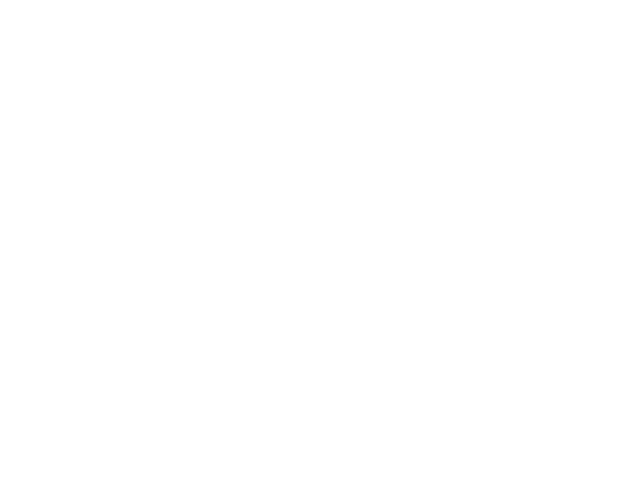

<IPython.core.display.Javascript object>


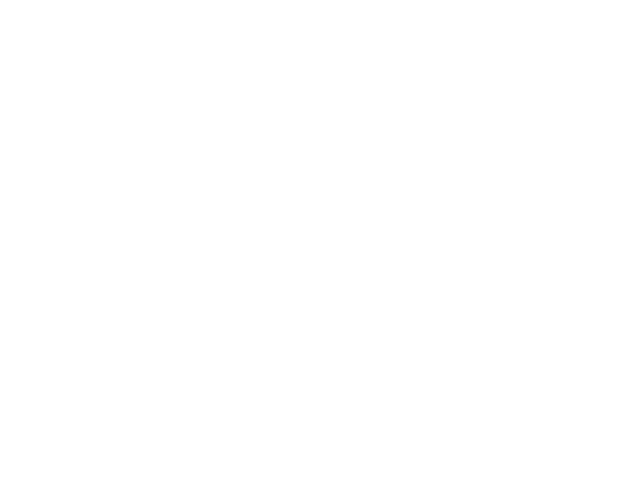

<IPython.core.display.Javascript object>


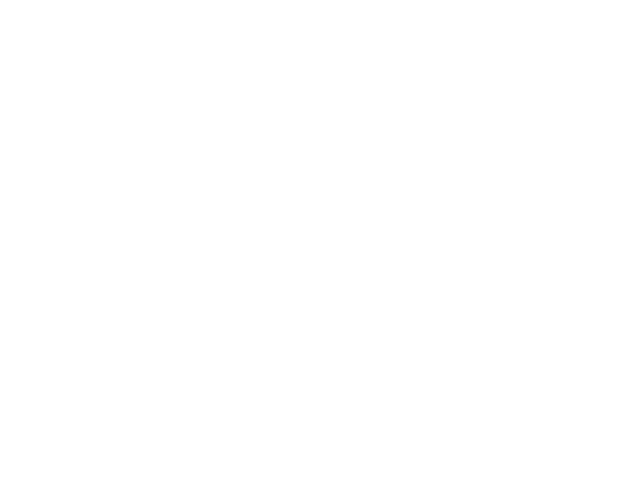

<IPython.core.display.Javascript object>


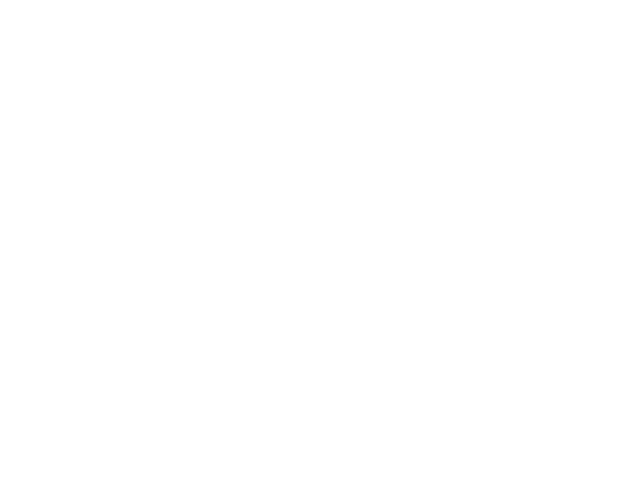

<IPython.core.display.Javascript object>


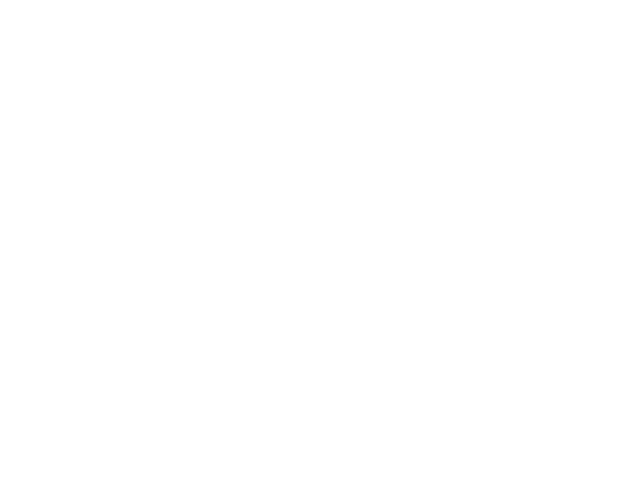

<IPython.core.display.Javascript object>


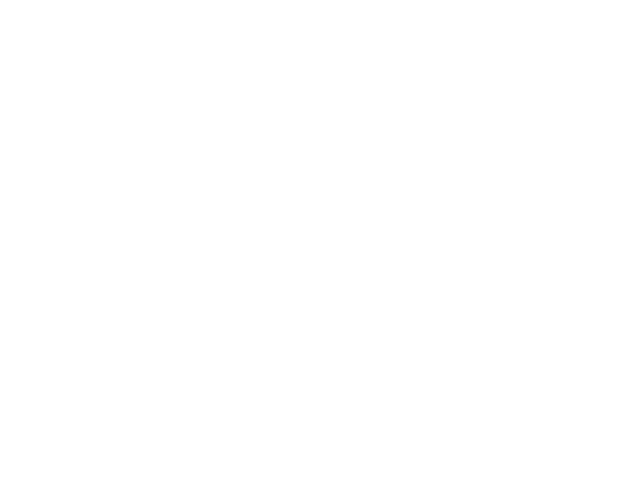

<IPython.core.display.Javascript object>


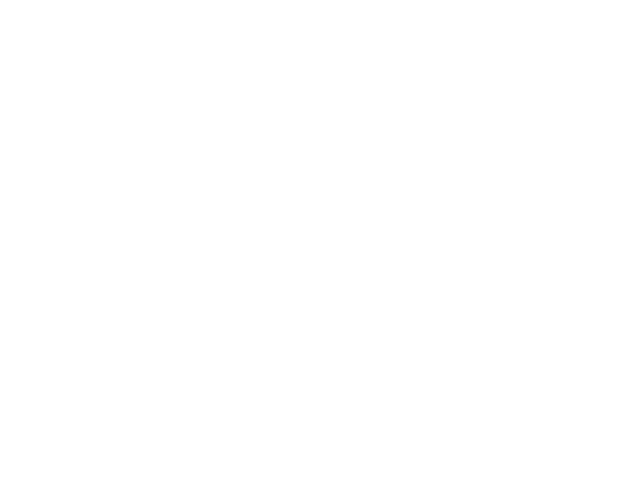

<IPython.core.display.Javascript object>


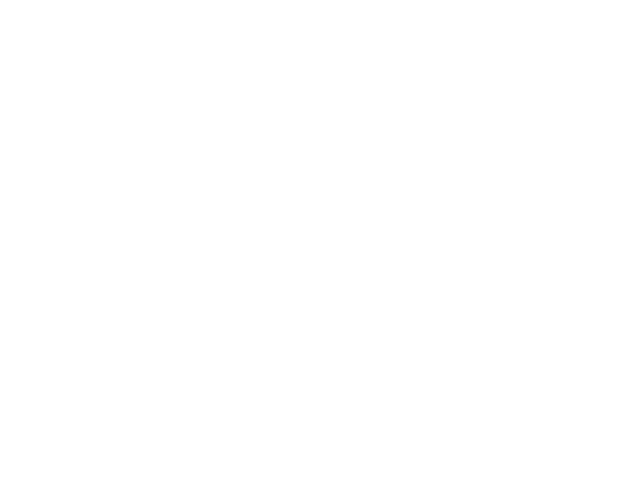

<IPython.core.display.Javascript object>


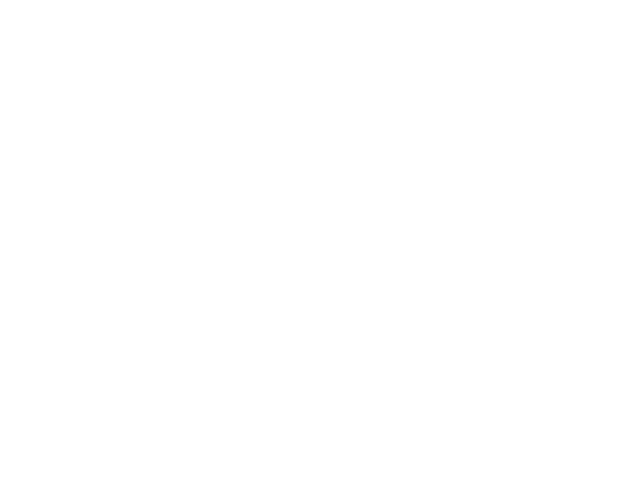

<IPython.core.display.Javascript object>


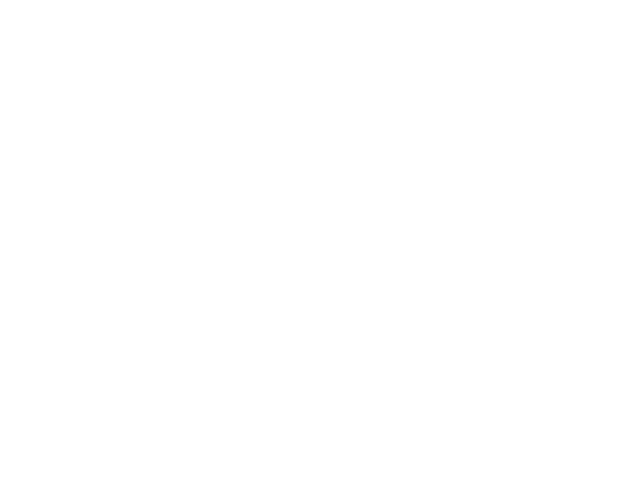

<IPython.core.display.Javascript object>


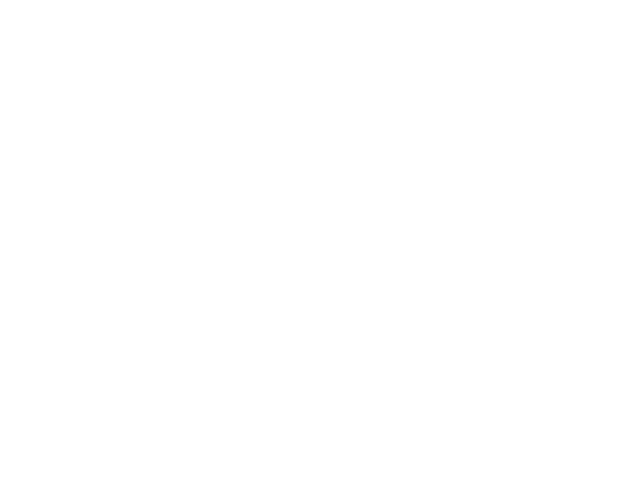

<IPython.core.display.Javascript object>


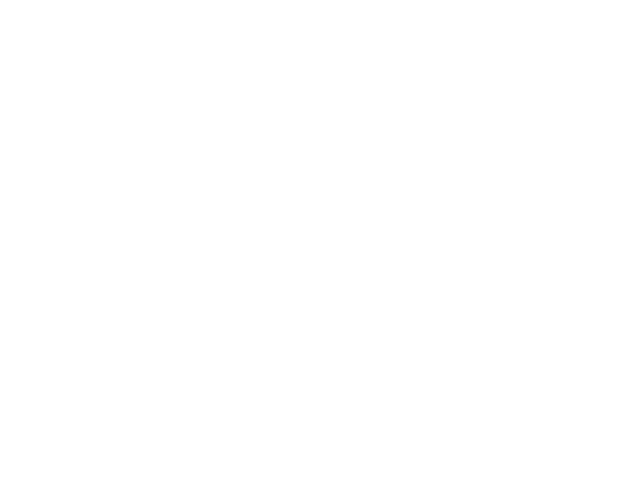

<IPython.core.display.Javascript object>


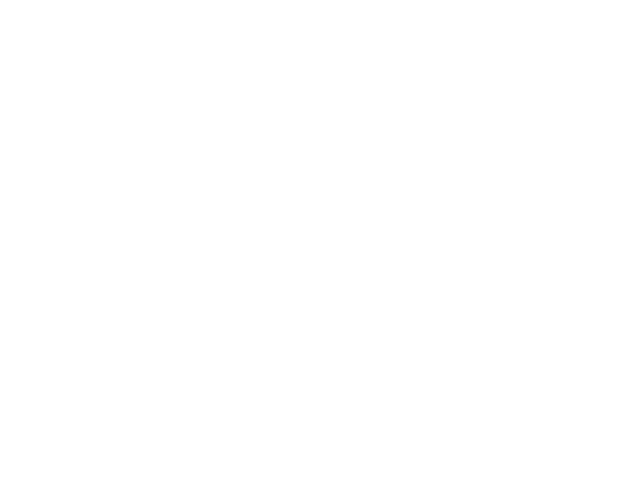

<IPython.core.display.Javascript object>


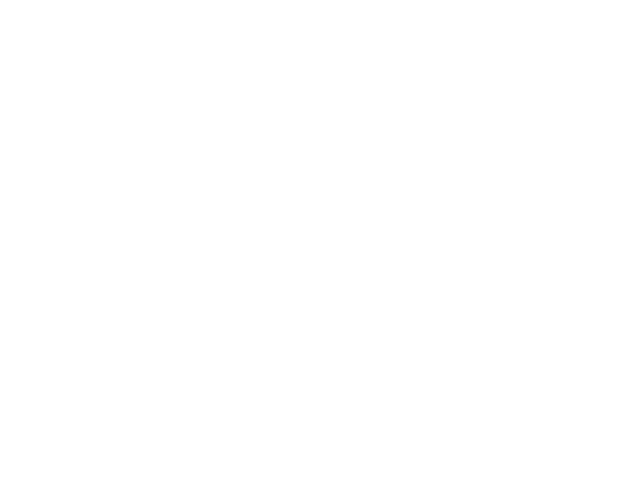

<IPython.core.display.Javascript object>


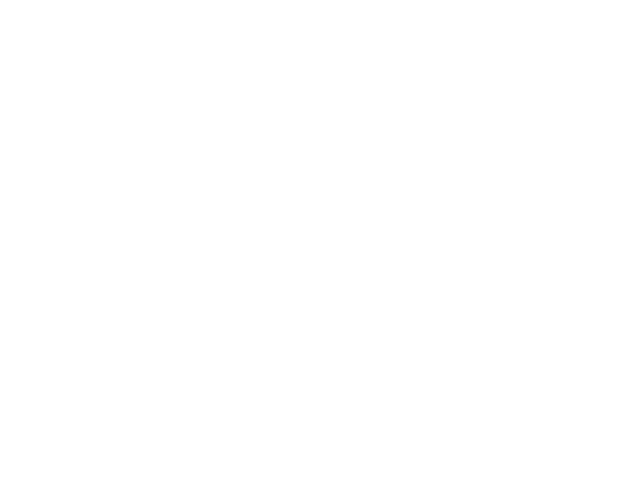

<IPython.core.display.Javascript object>


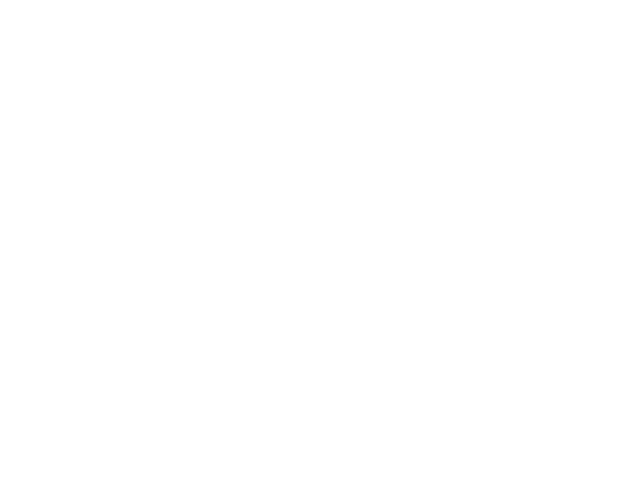

<IPython.core.display.Javascript object>


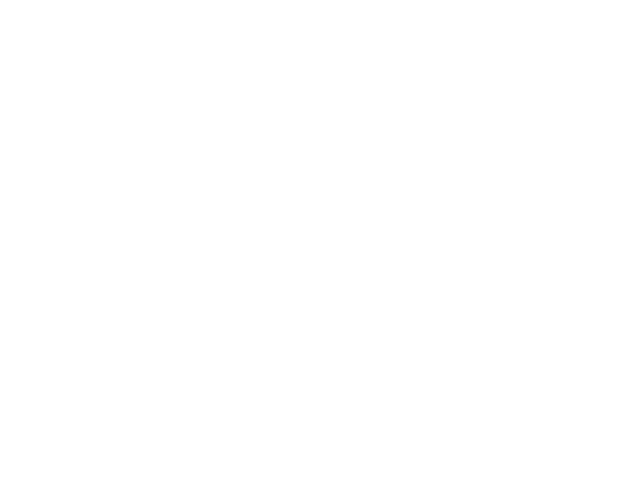

<IPython.core.display.Javascript object>


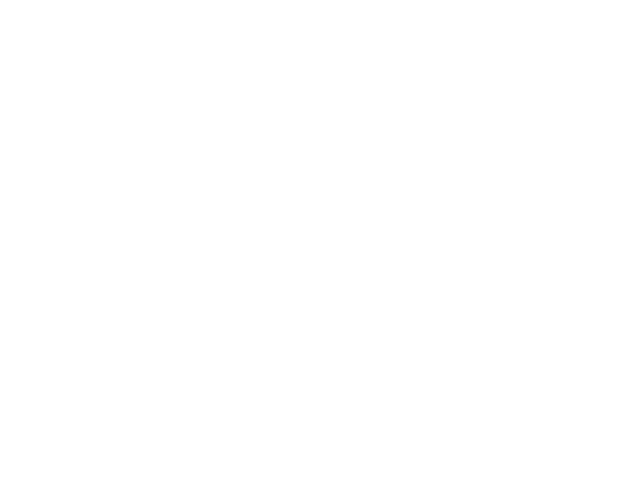

<IPython.core.display.Javascript object>


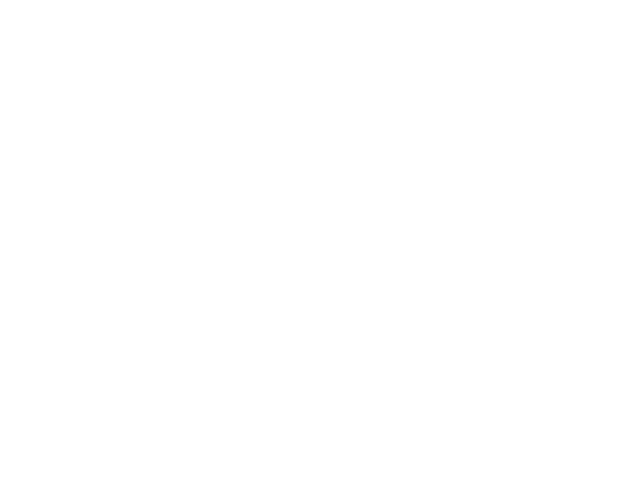

<IPython.core.display.Javascript object>


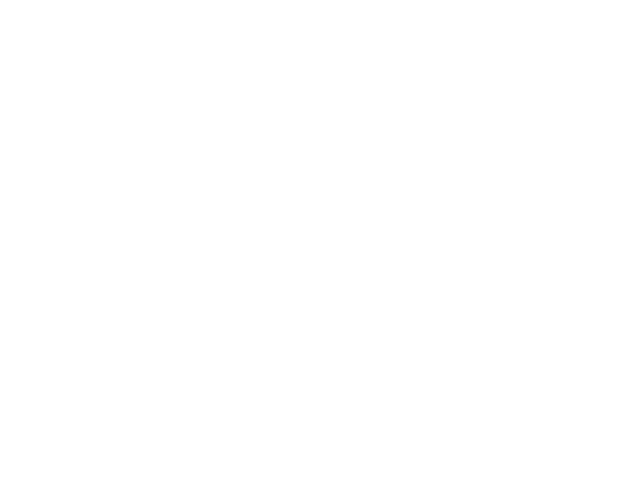

<IPython.core.display.Javascript object>


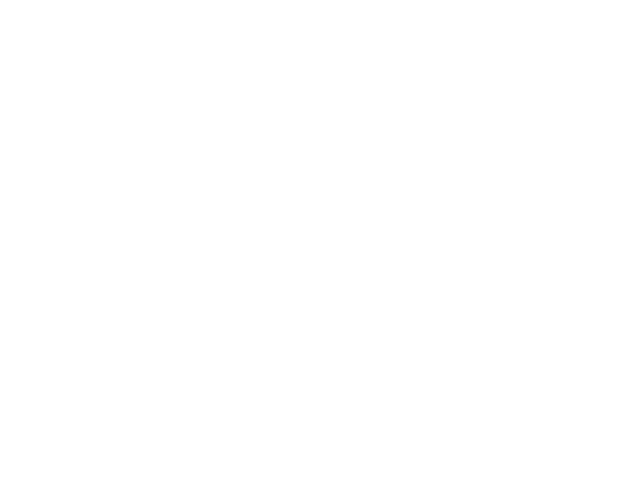

<IPython.core.display.Javascript object>


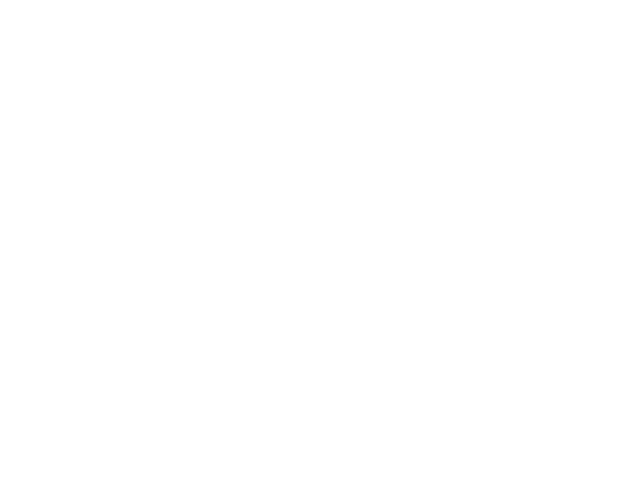

<IPython.core.display.Javascript object>


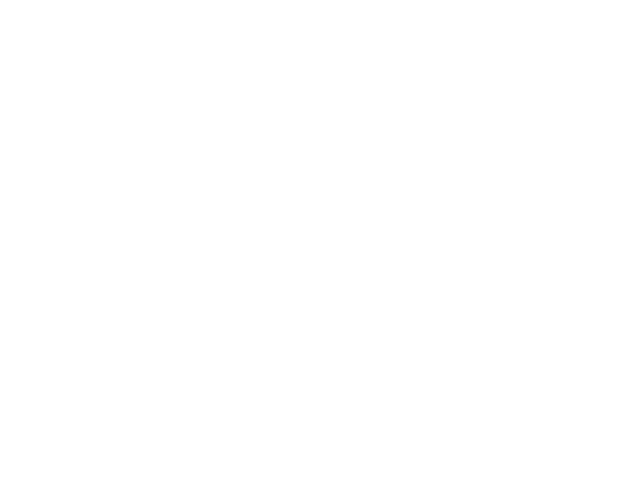

<IPython.core.display.Javascript object>


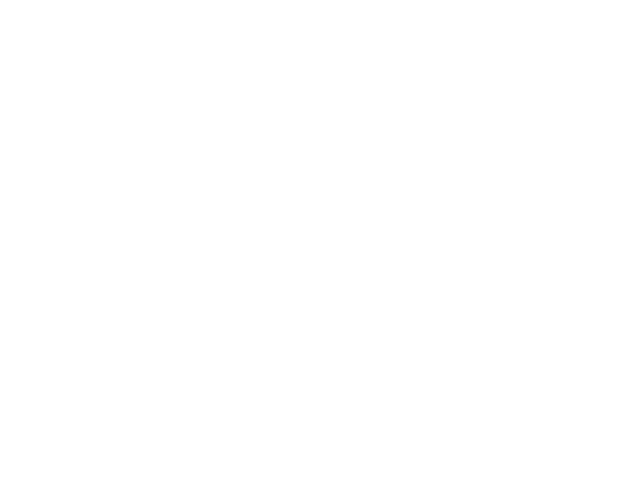

<IPython.core.display.Javascript object>


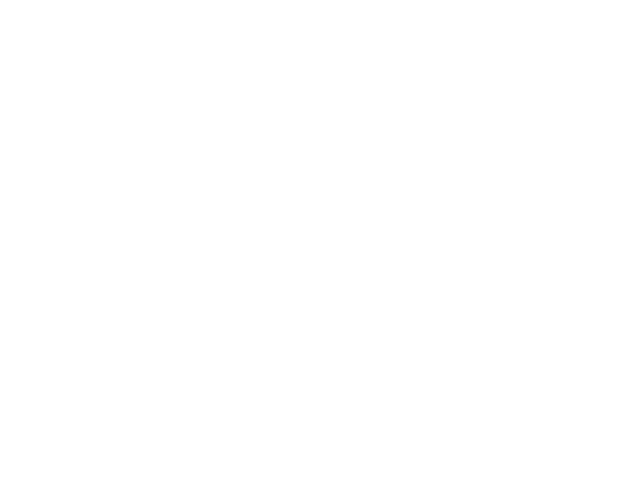

<IPython.core.display.Javascript object>


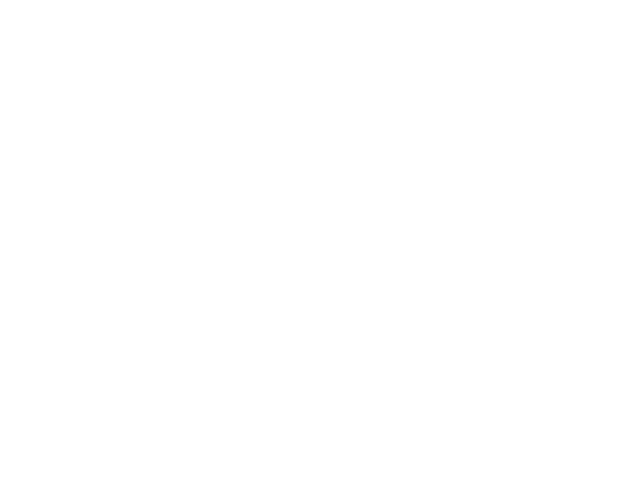

<IPython.core.display.Javascript object>


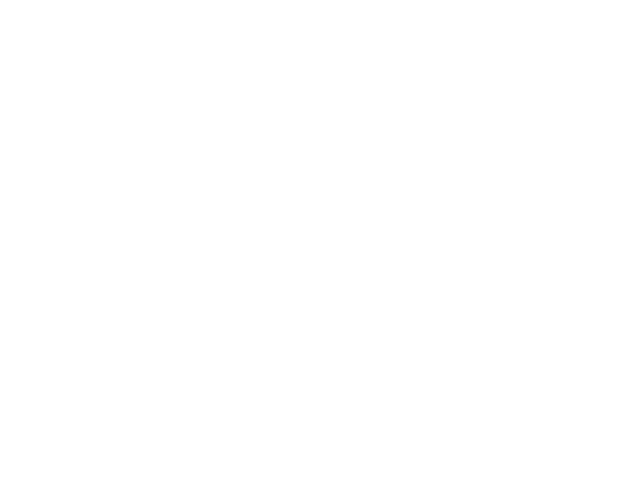

<IPython.core.display.Javascript object>


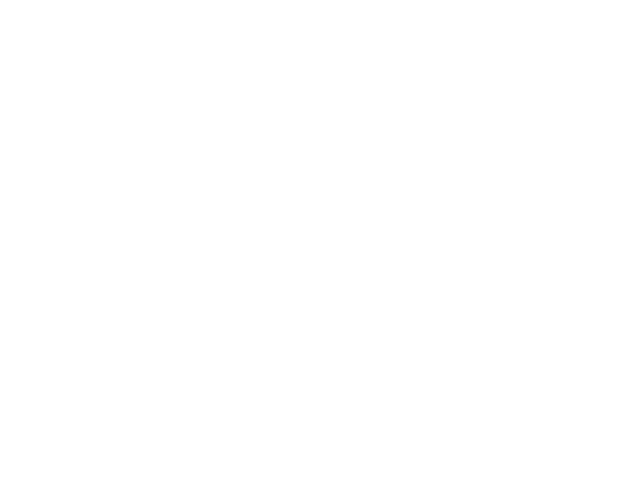

<IPython.core.display.Javascript object>


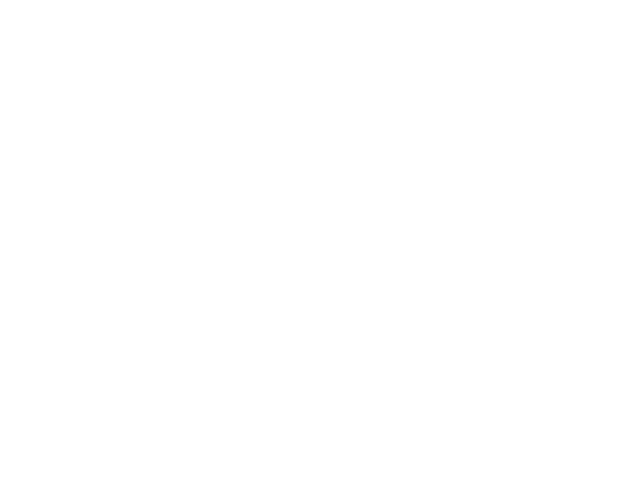

<IPython.core.display.Javascript object>


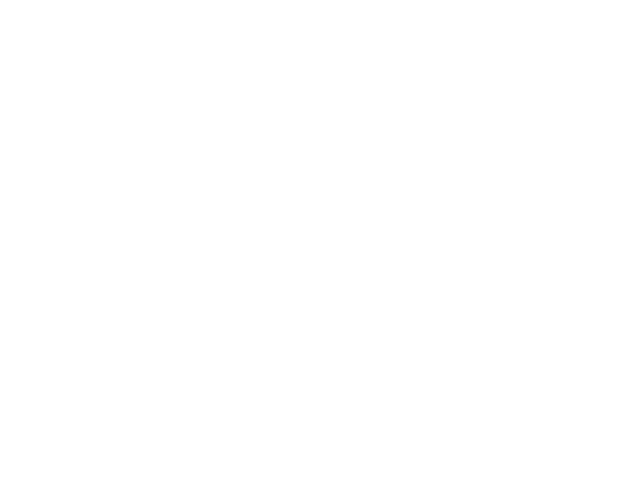

<IPython.core.display.Javascript object>


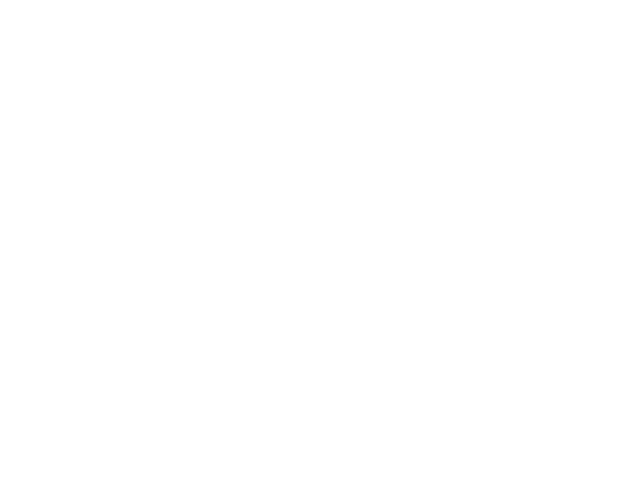

<IPython.core.display.Javascript object>


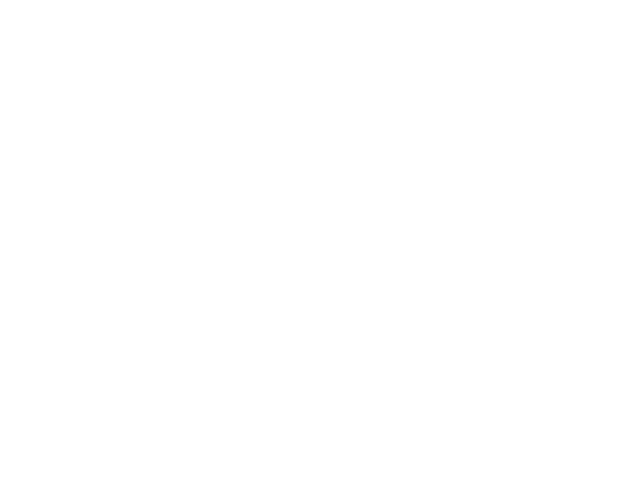

<IPython.core.display.Javascript object>


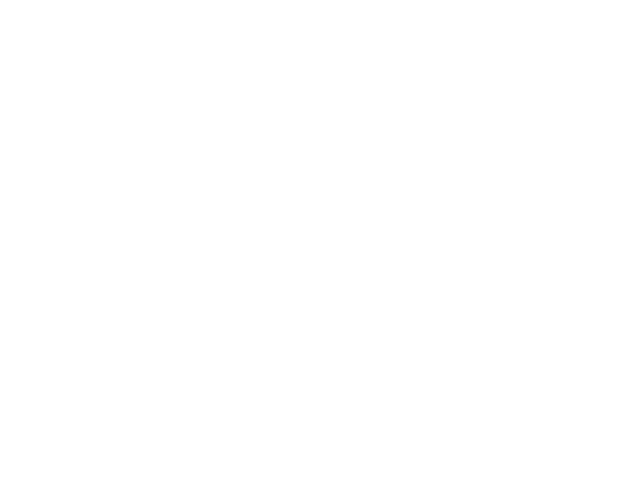

<IPython.core.display.Javascript object>


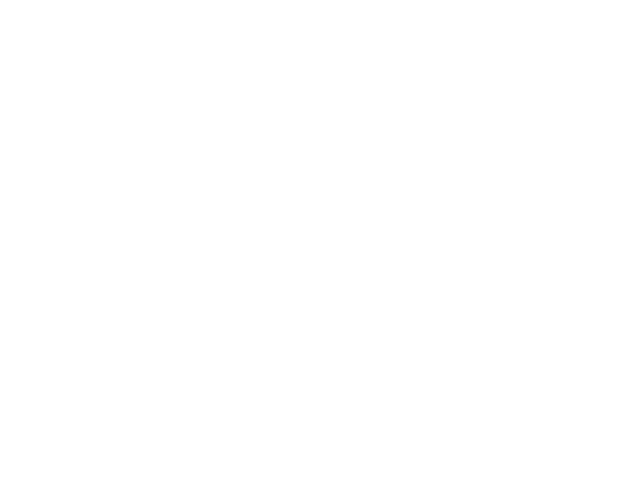

<IPython.core.display.Javascript object>


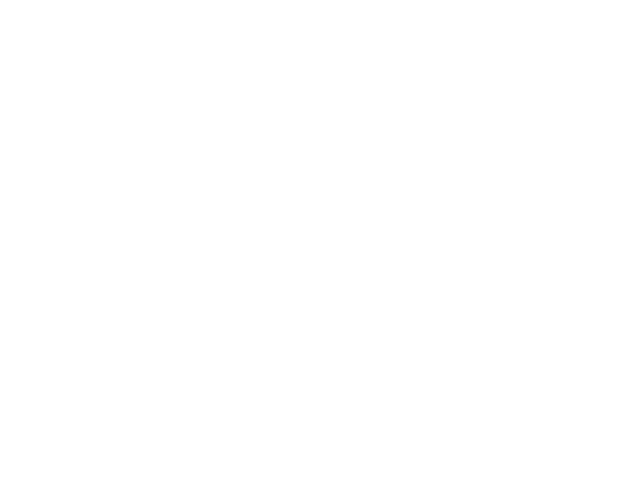

<IPython.core.display.Javascript object>


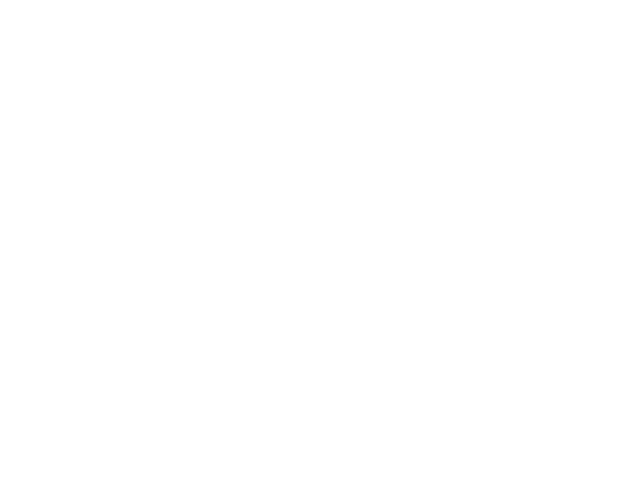

<IPython.core.display.Javascript object>


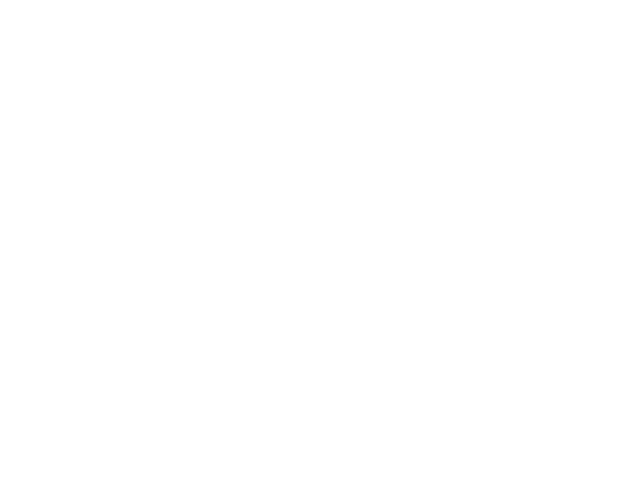

<IPython.core.display.Javascript object>


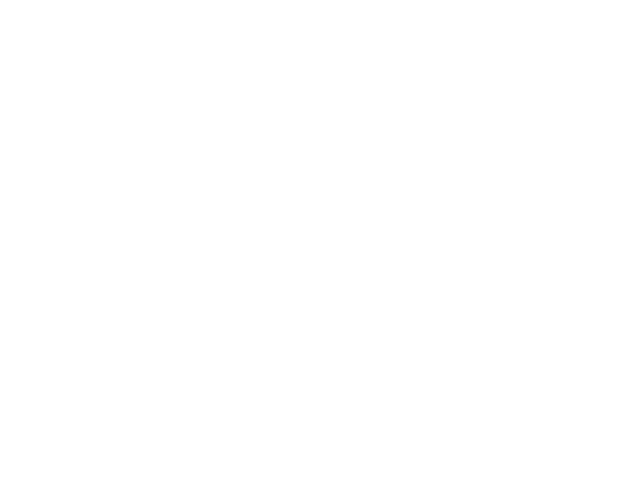

<IPython.core.display.Javascript object>


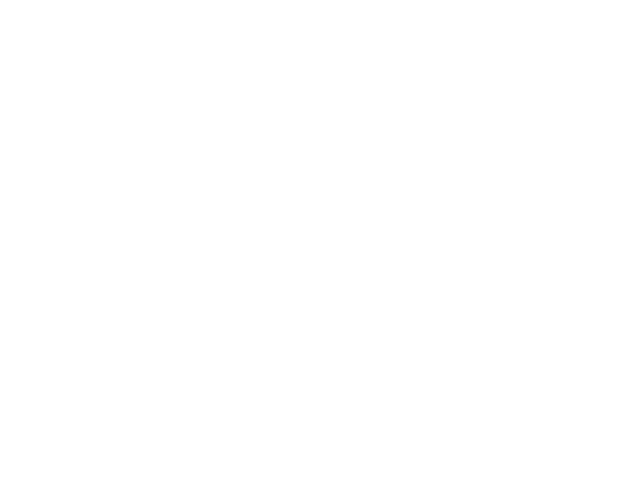

<IPython.core.display.Javascript object>


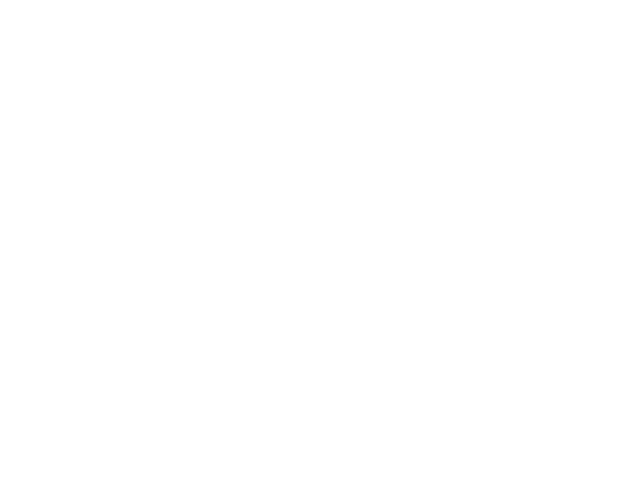

<IPython.core.display.Javascript object>


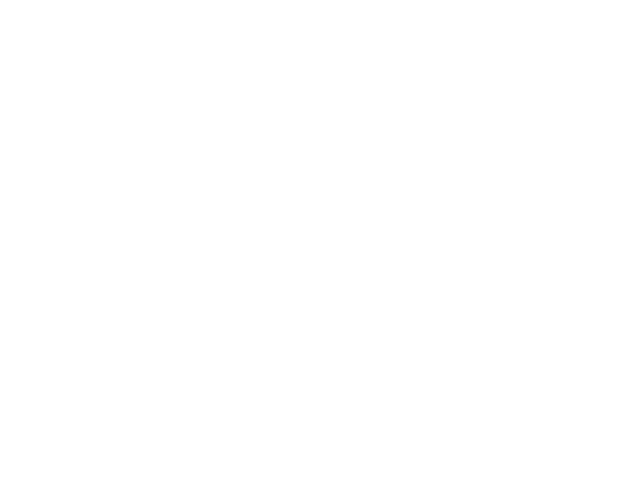

<IPython.core.display.Javascript object>


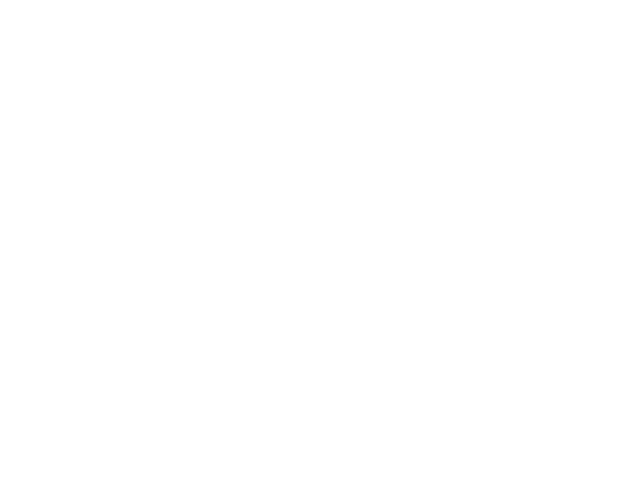

<IPython.core.display.Javascript object>


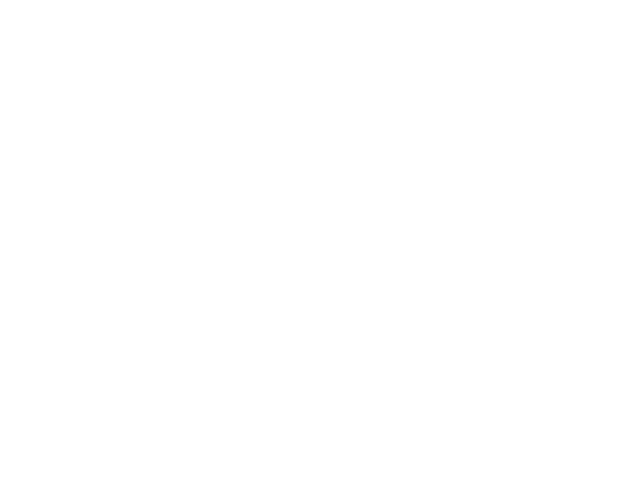

<IPython.core.display.Javascript object>


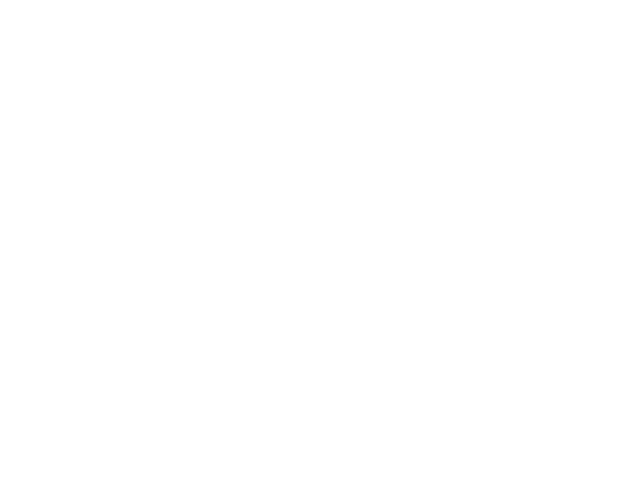

<IPython.core.display.Javascript object>


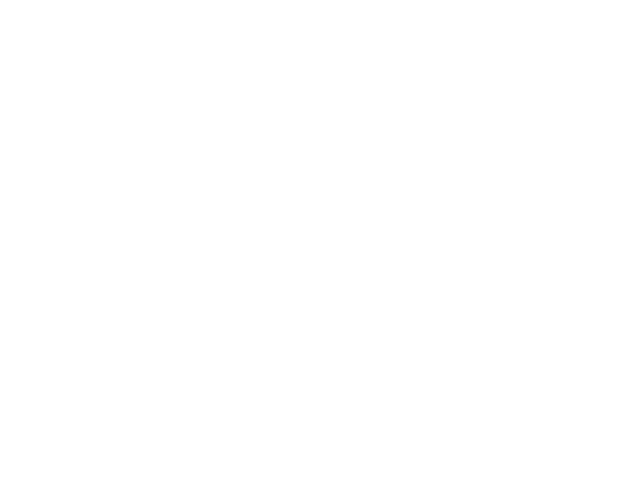

<IPython.core.display.Javascript object>


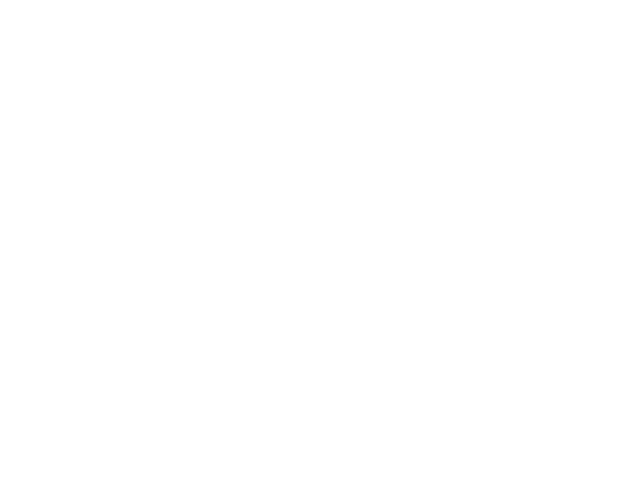

<IPython.core.display.Javascript object>


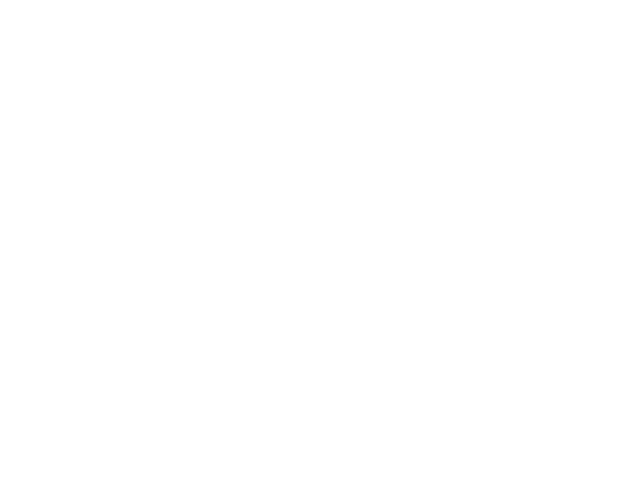

<IPython.core.display.Javascript object>


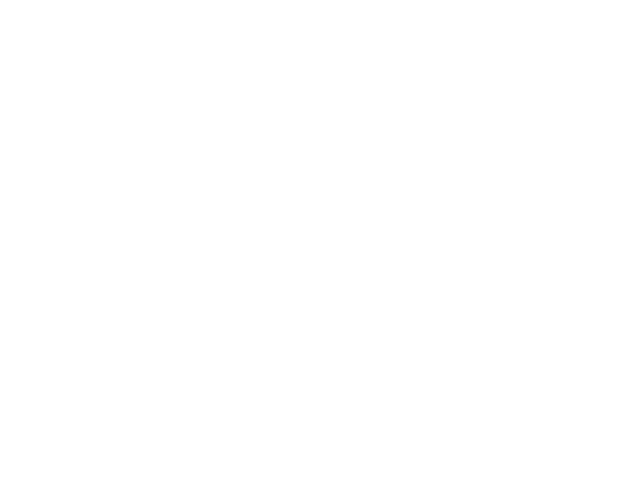

<IPython.core.display.Javascript object>


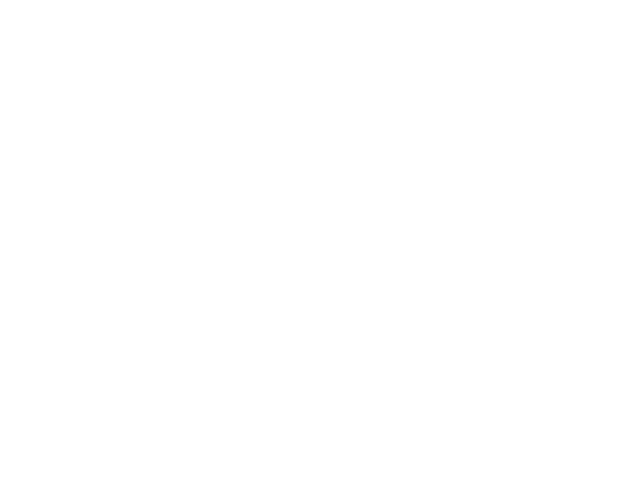

<IPython.core.display.Javascript object>


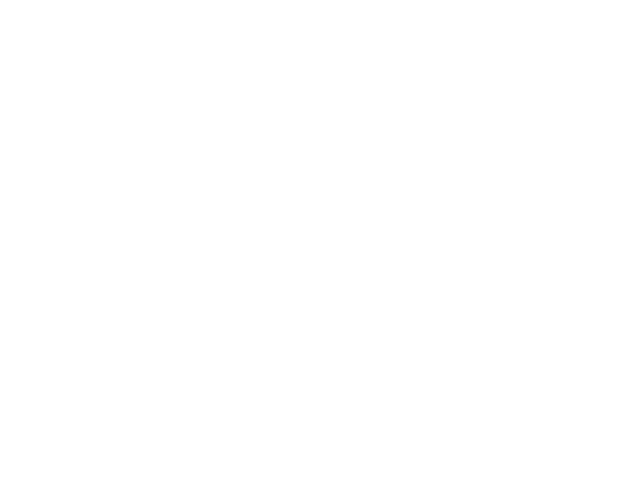

<IPython.core.display.Javascript object>


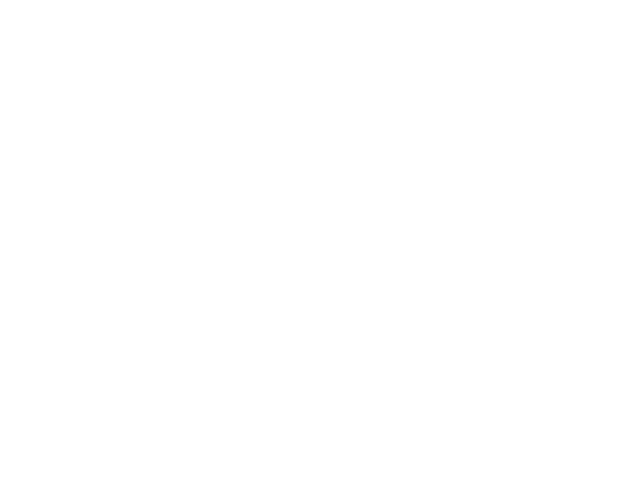

<IPython.core.display.Javascript object>


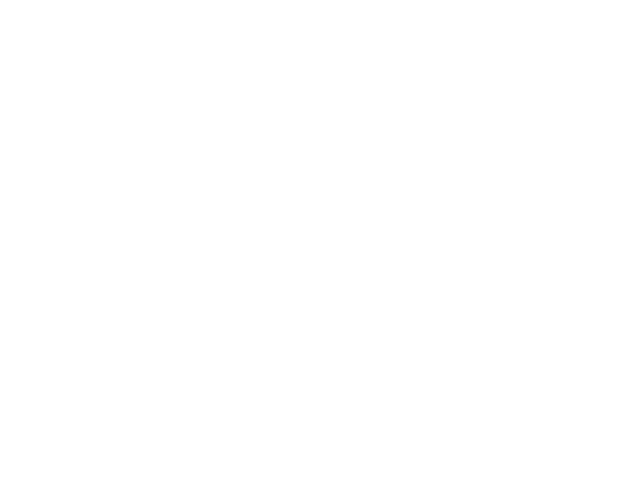

<IPython.core.display.Javascript object>


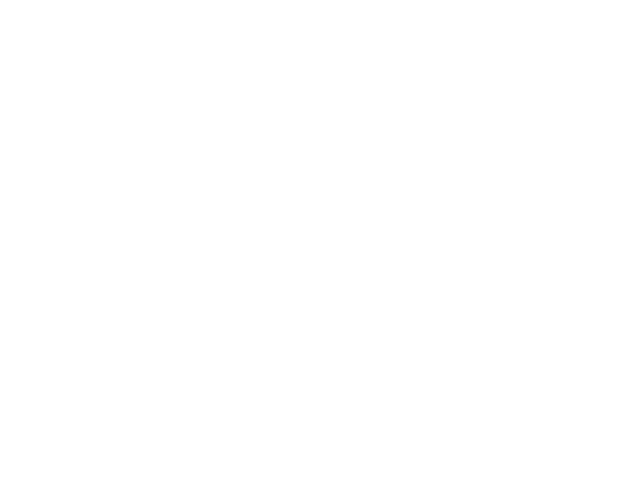

<IPython.core.display.Javascript object>


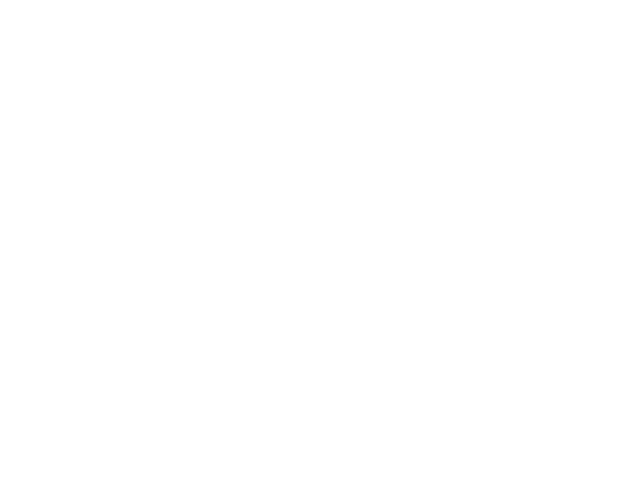

<IPython.core.display.Javascript object>


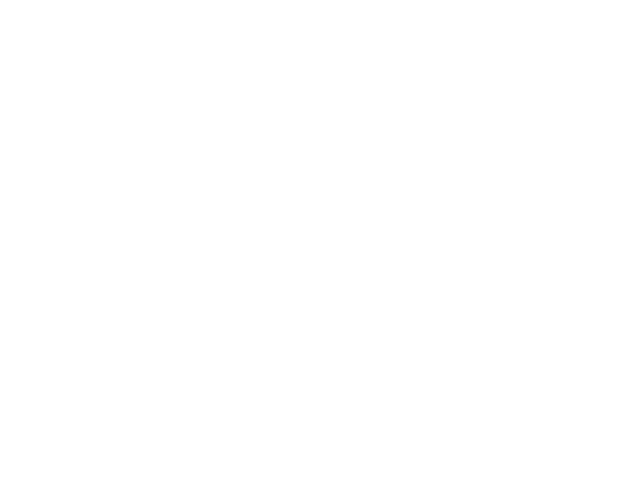

<IPython.core.display.Javascript object>


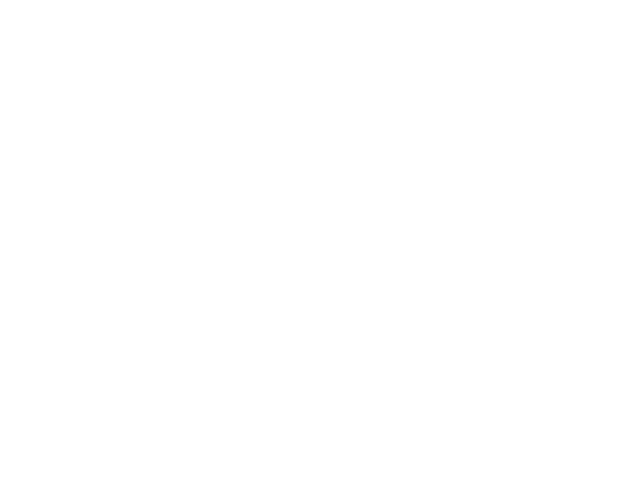

<IPython.core.display.Javascript object>


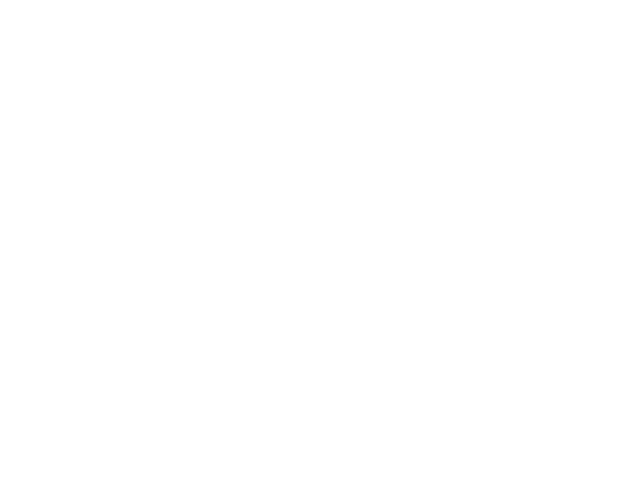

<IPython.core.display.Javascript object>


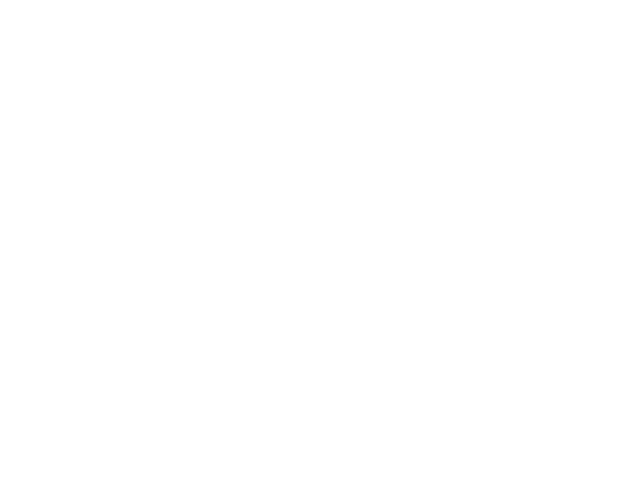

<IPython.core.display.Javascript object>


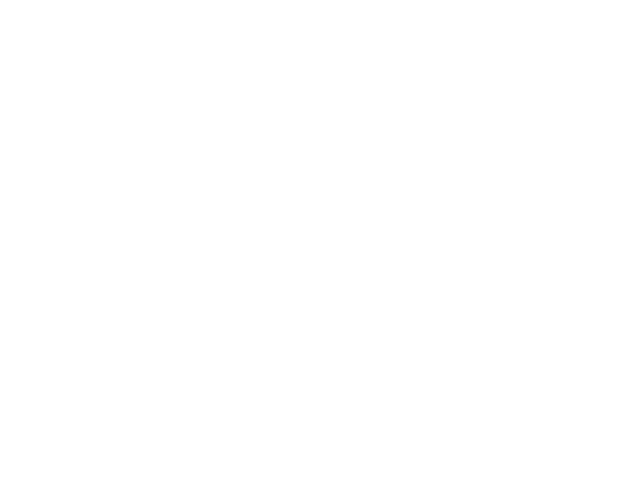

<IPython.core.display.Javascript object>


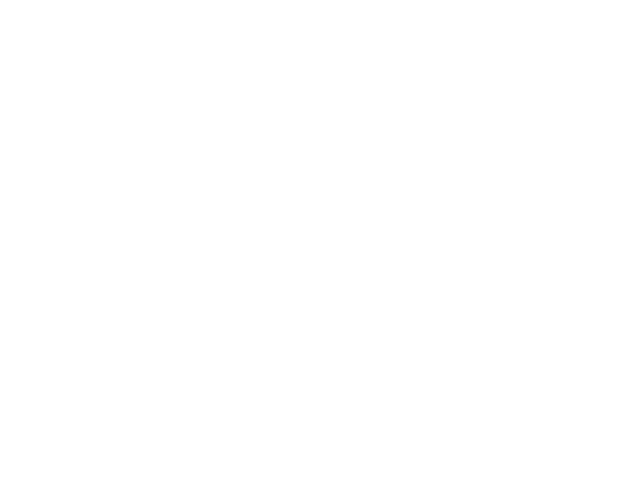

<IPython.core.display.Javascript object>


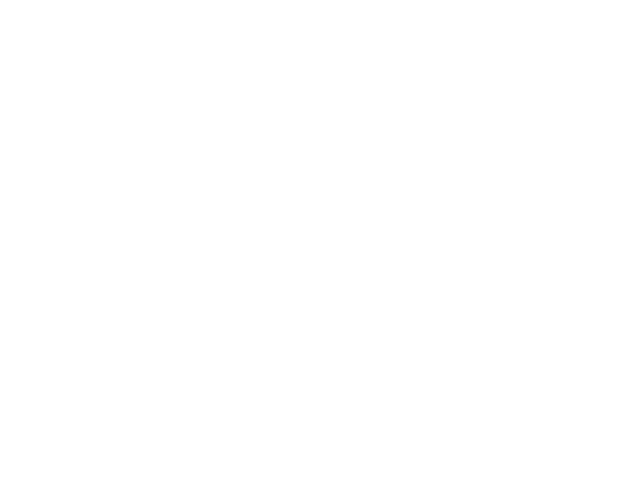

<IPython.core.display.Javascript object>


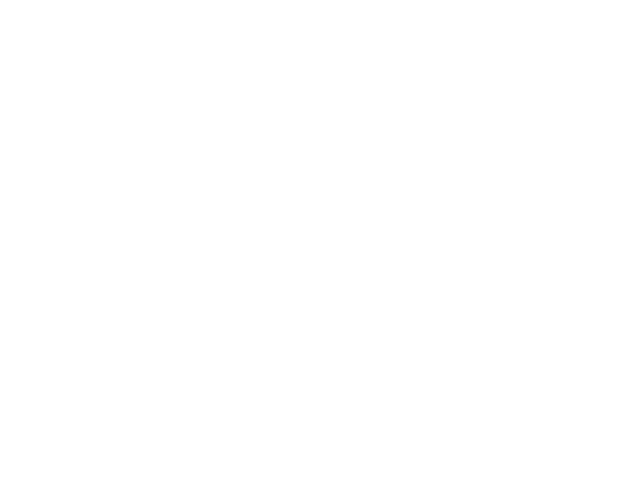

<IPython.core.display.Javascript object>


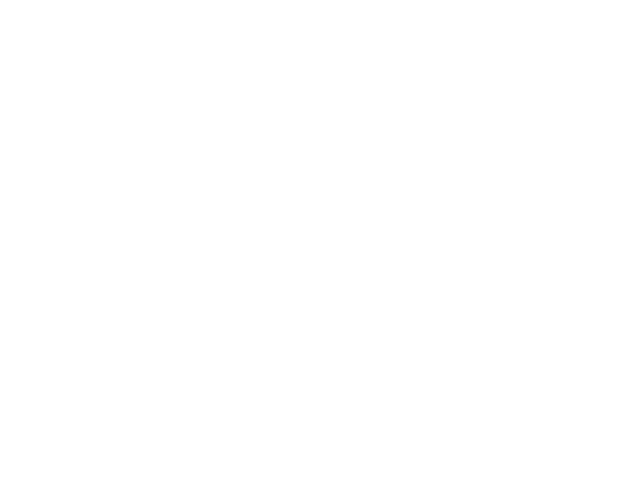

<IPython.core.display.Javascript object>


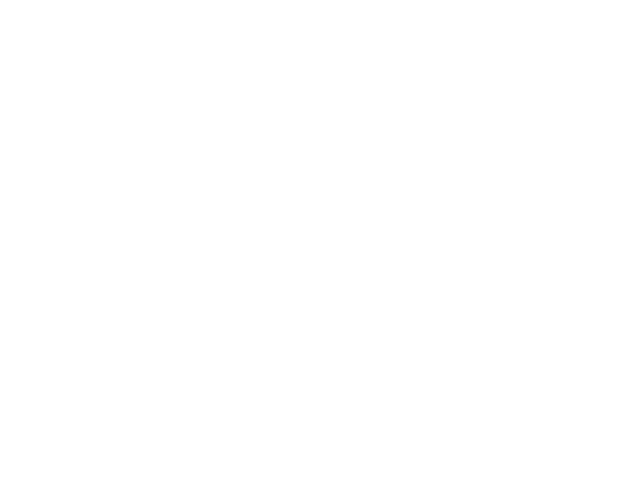

<IPython.core.display.Javascript object>


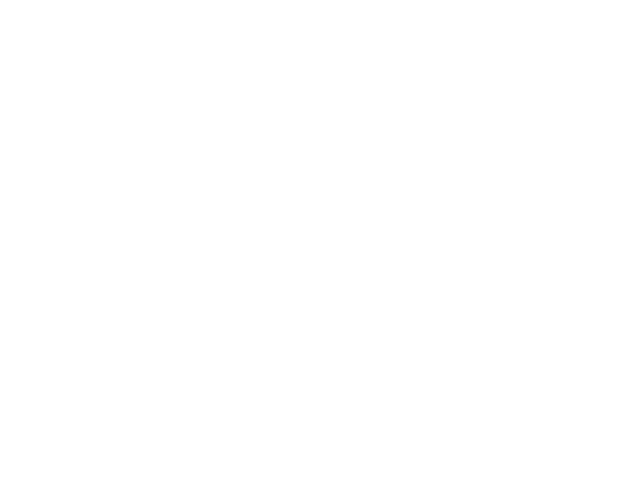

<IPython.core.display.Javascript object>


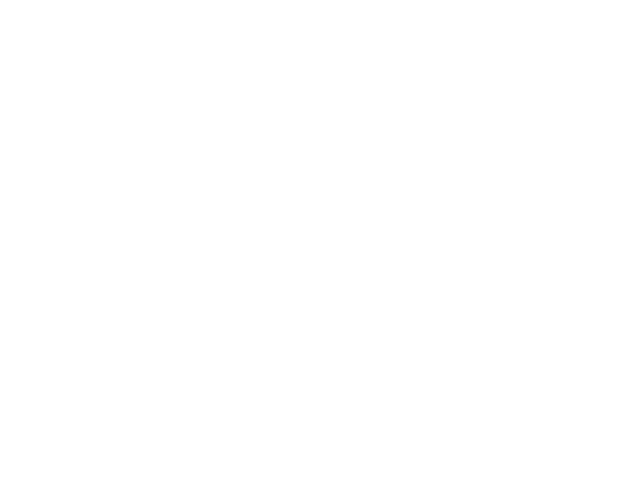

<IPython.core.display.Javascript object>


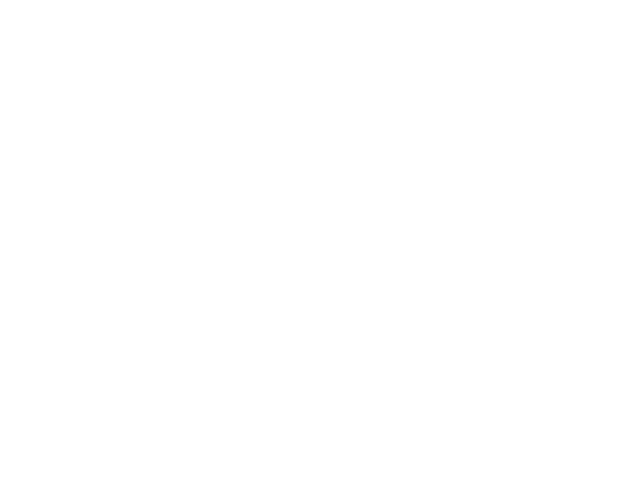

<IPython.core.display.Javascript object>


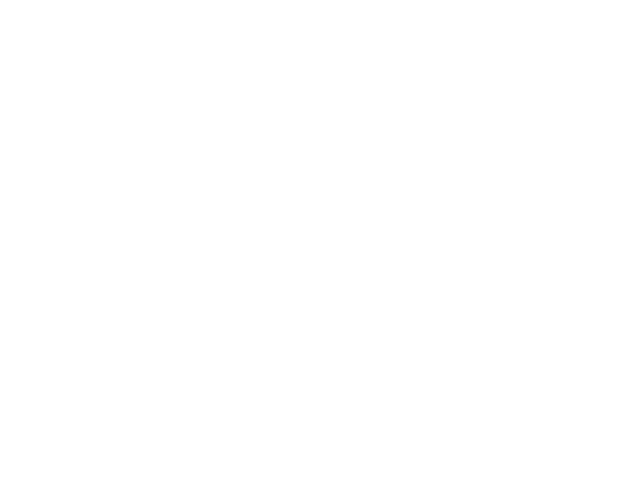

<IPython.core.display.Javascript object>


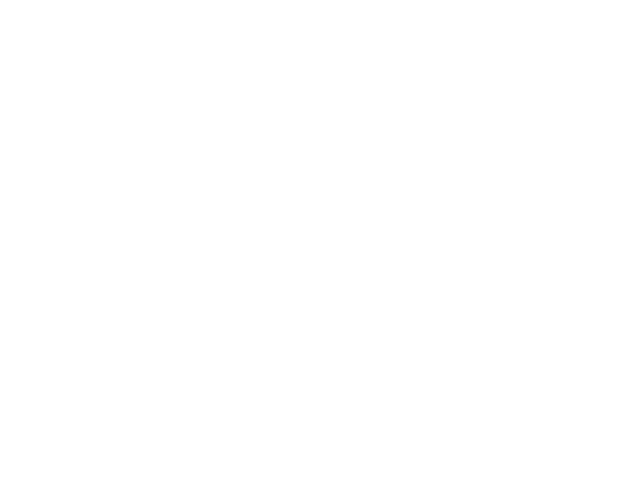

<IPython.core.display.Javascript object>


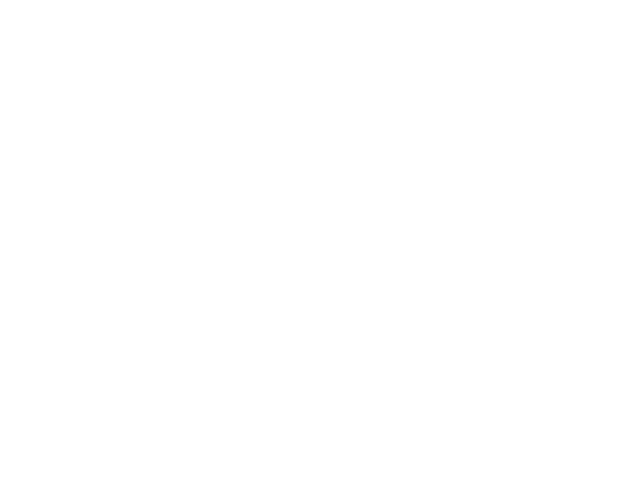

<IPython.core.display.Javascript object>


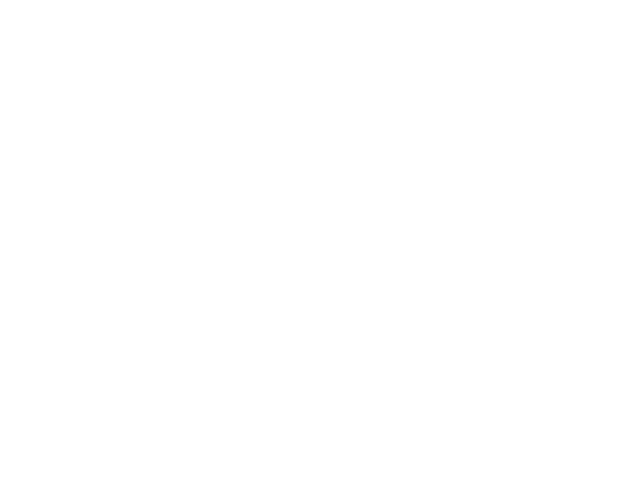

<IPython.core.display.Javascript object>


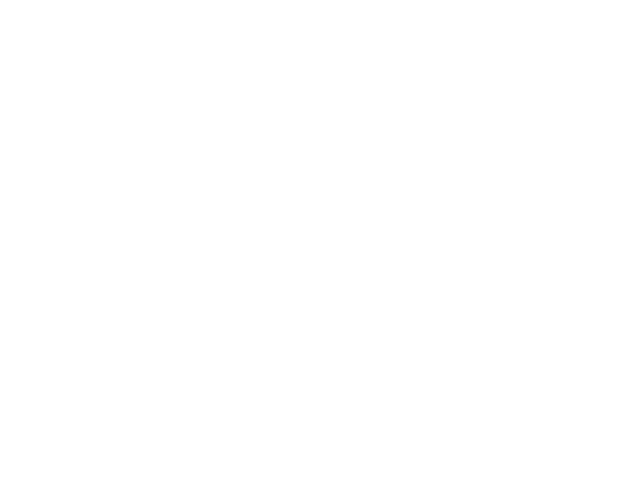

<IPython.core.display.Javascript object>


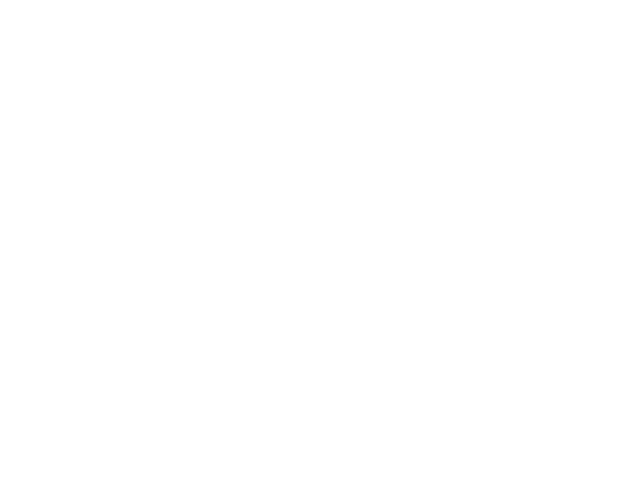

<IPython.core.display.Javascript object>


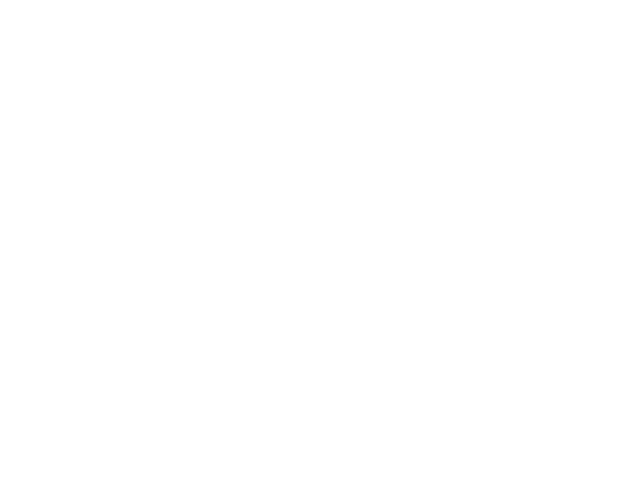

<IPython.core.display.Javascript object>


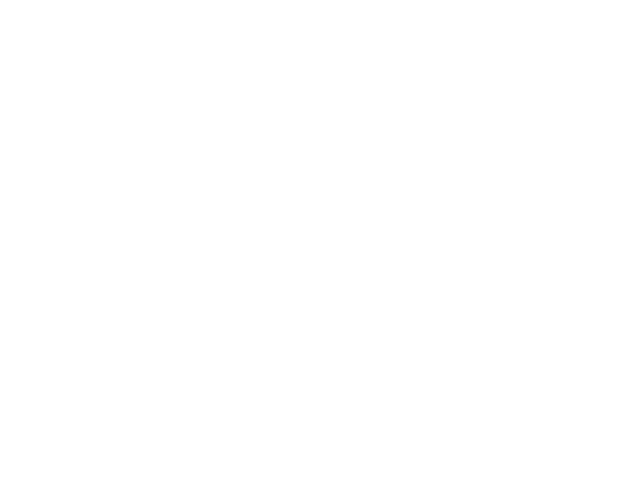

<IPython.core.display.Javascript object>


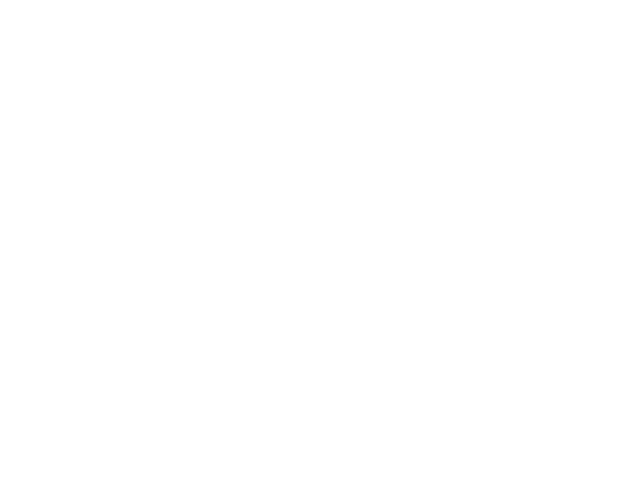

<IPython.core.display.Javascript object>


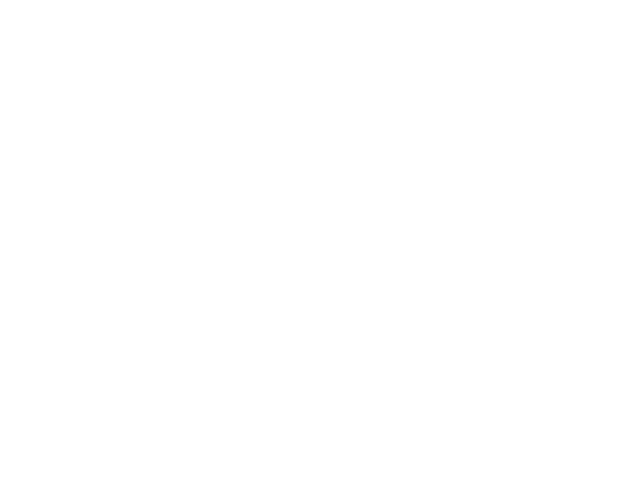

<IPython.core.display.Javascript object>


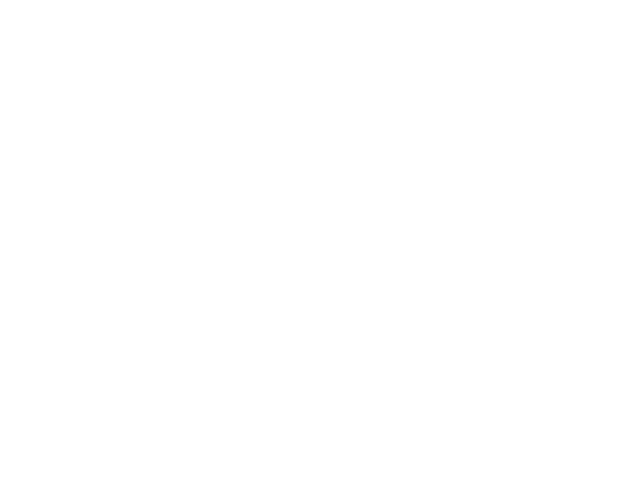

<IPython.core.display.Javascript object>


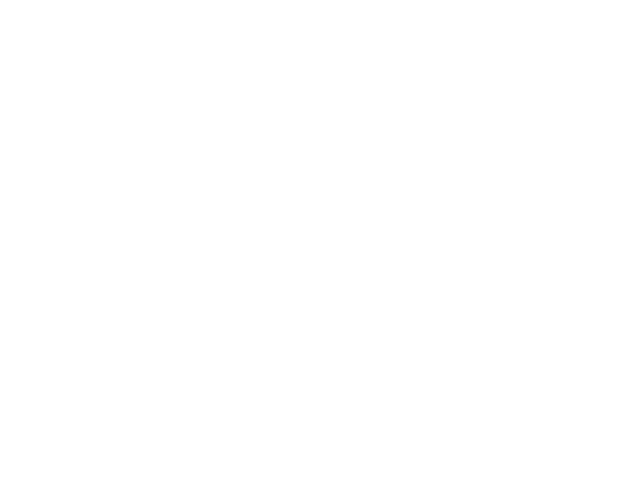

<IPython.core.display.Javascript object>


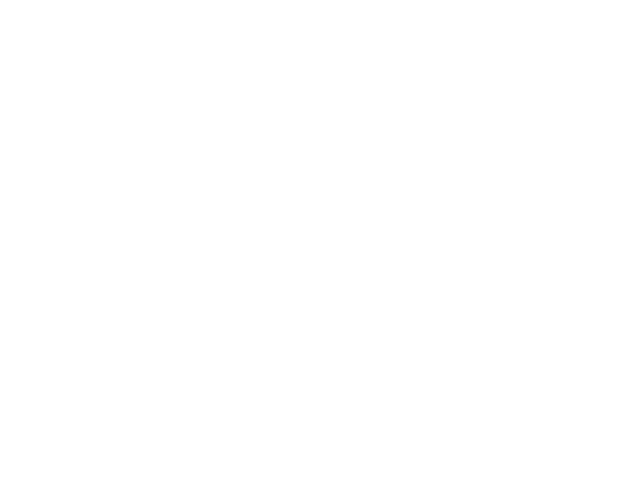

<IPython.core.display.Javascript object>


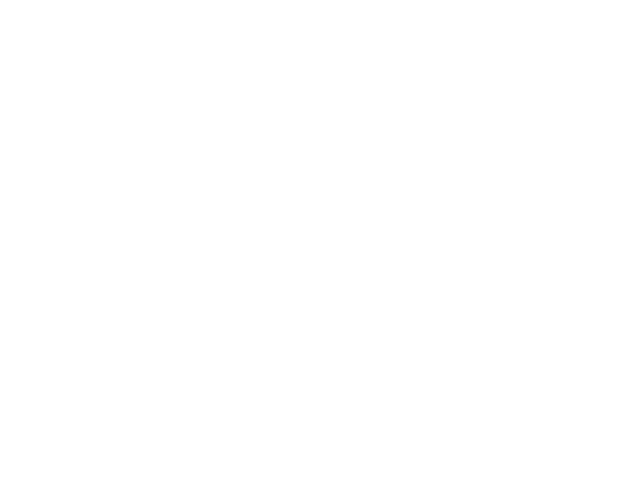

<IPython.core.display.Javascript object>


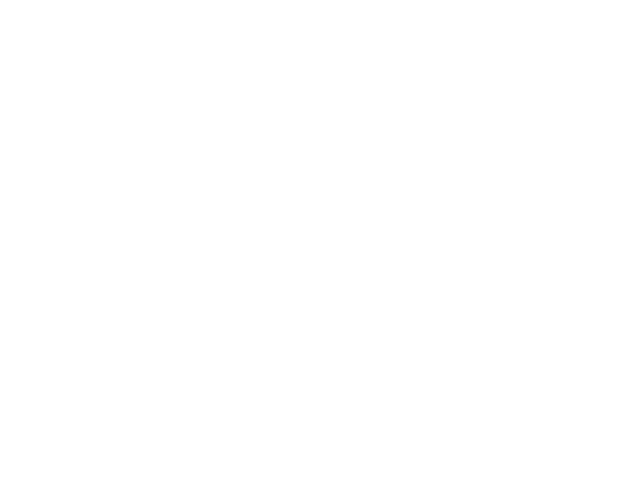

<IPython.core.display.Javascript object>


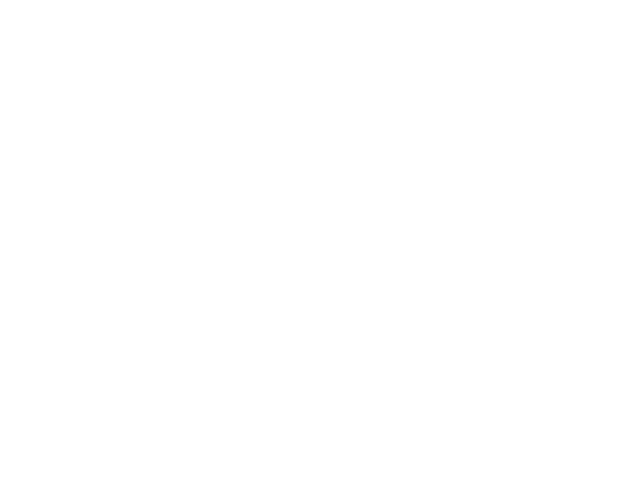

<IPython.core.display.Javascript object>


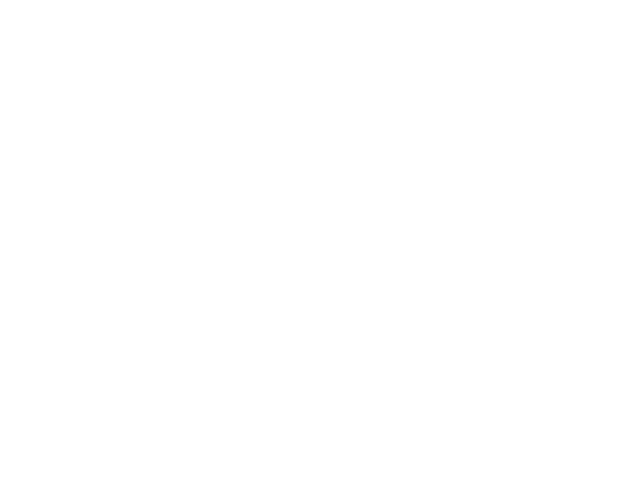

<IPython.core.display.Javascript object>


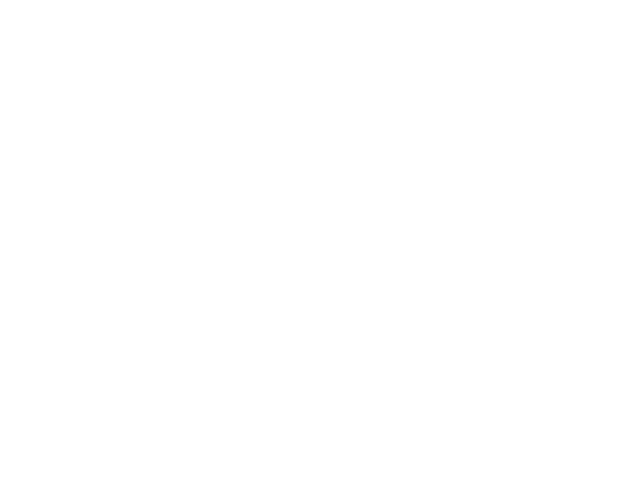

<IPython.core.display.Javascript object>


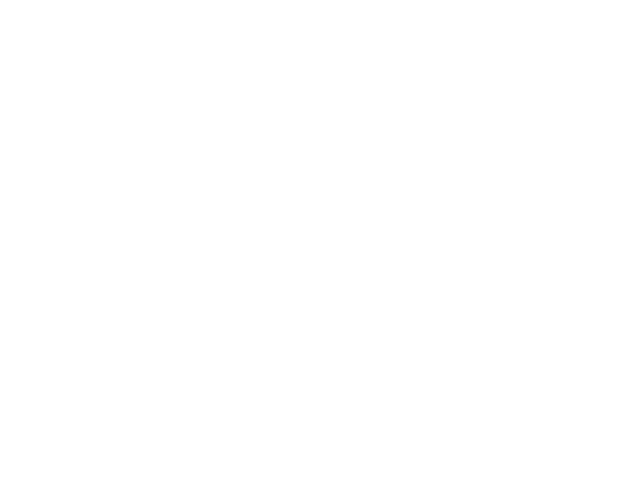

<IPython.core.display.Javascript object>


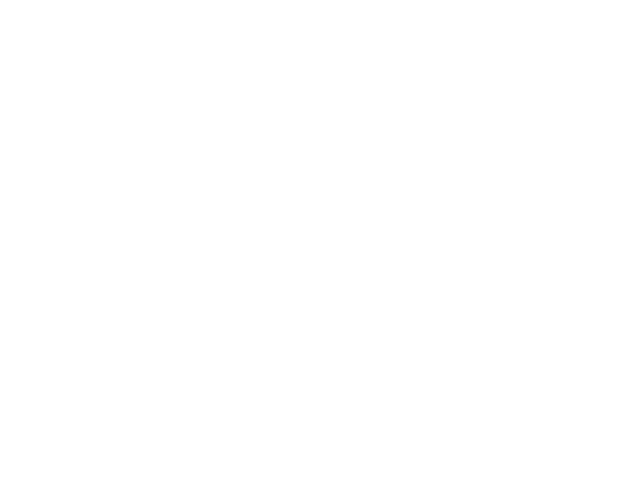

<IPython.core.display.Javascript object>


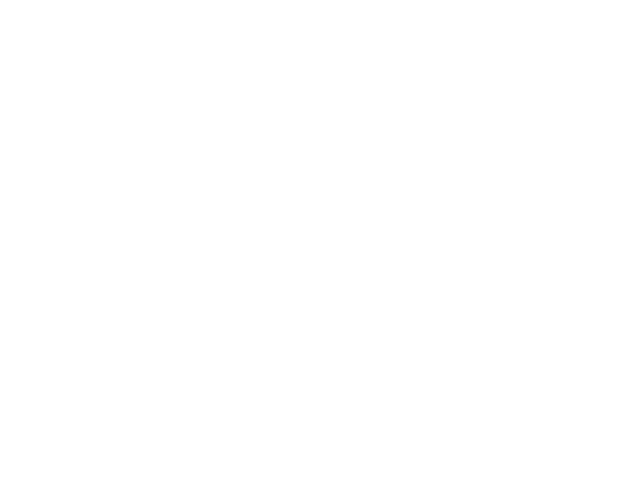

<IPython.core.display.Javascript object>


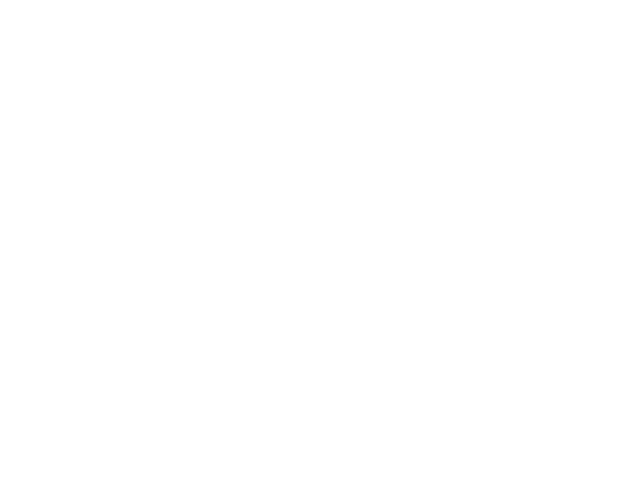

<IPython.core.display.Javascript object>


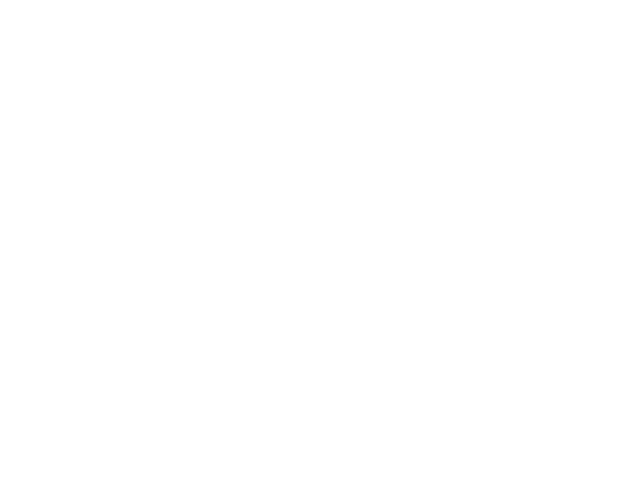

<IPython.core.display.Javascript object>


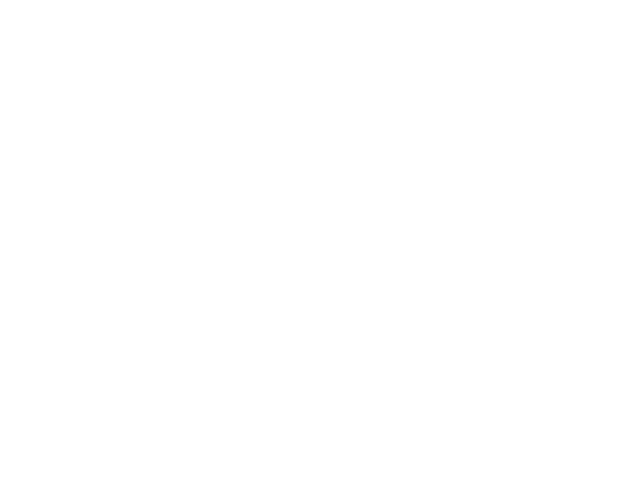

<IPython.core.display.Javascript object>


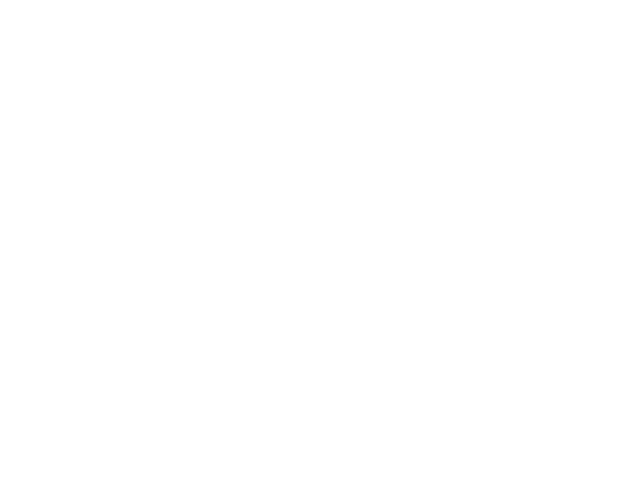

<IPython.core.display.Javascript object>


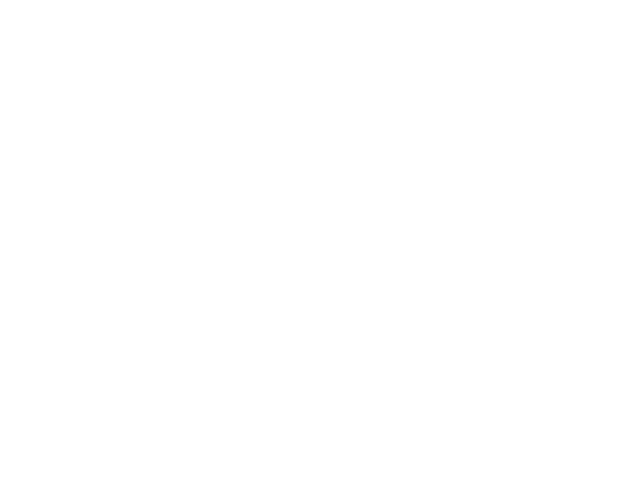

<IPython.core.display.Javascript object>


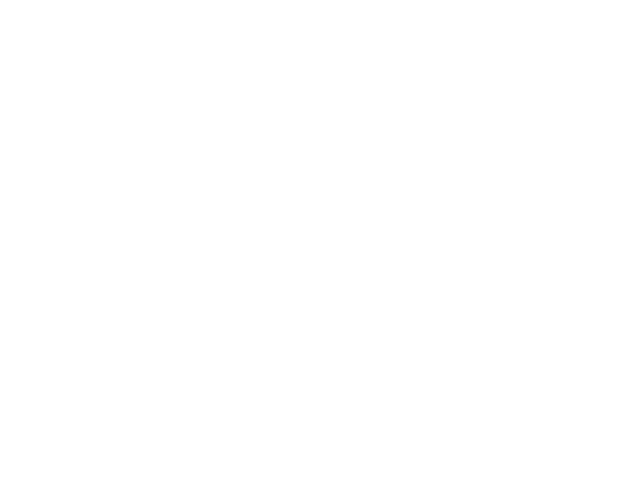

<IPython.core.display.Javascript object>


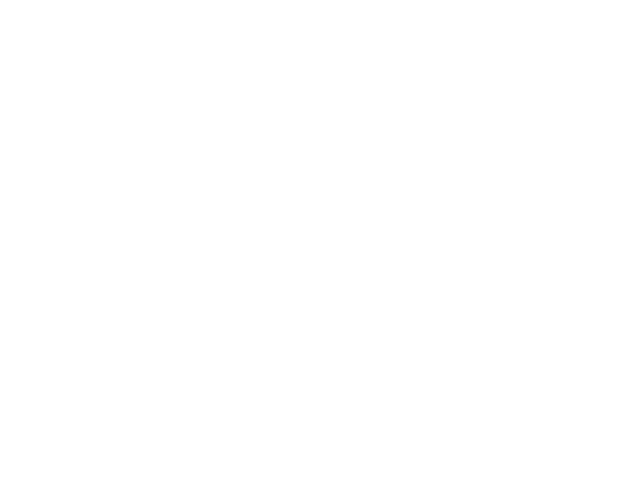

<IPython.core.display.Javascript object>


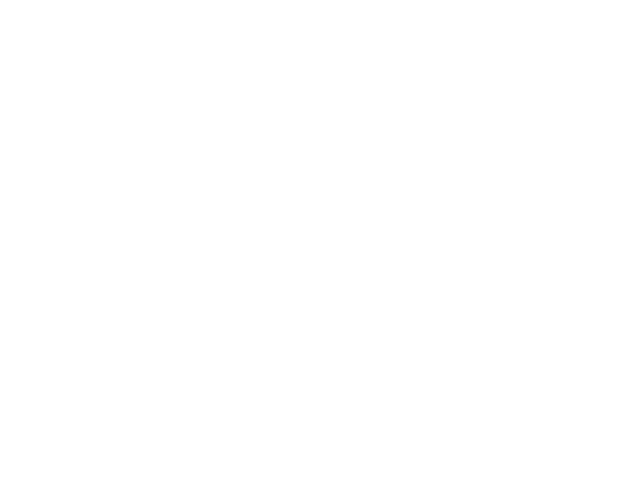

<IPython.core.display.Javascript object>


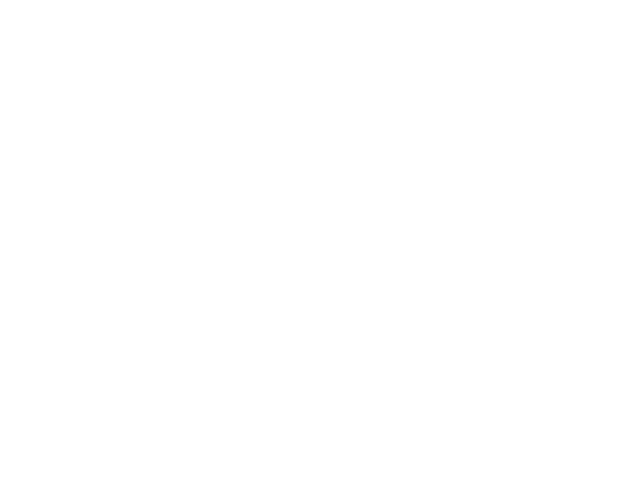

<IPython.core.display.Javascript object>


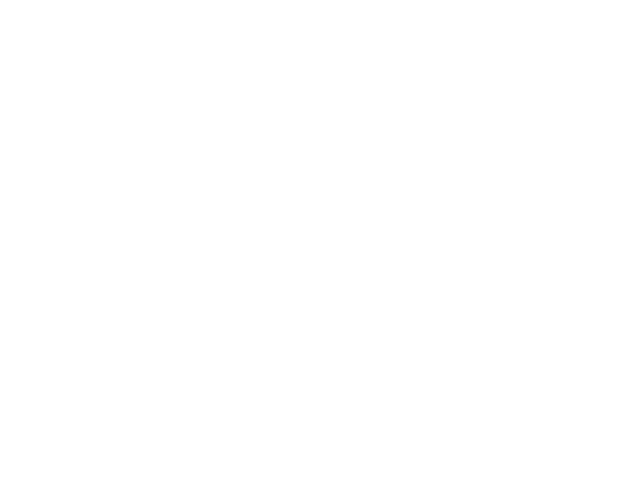

<IPython.core.display.Javascript object>


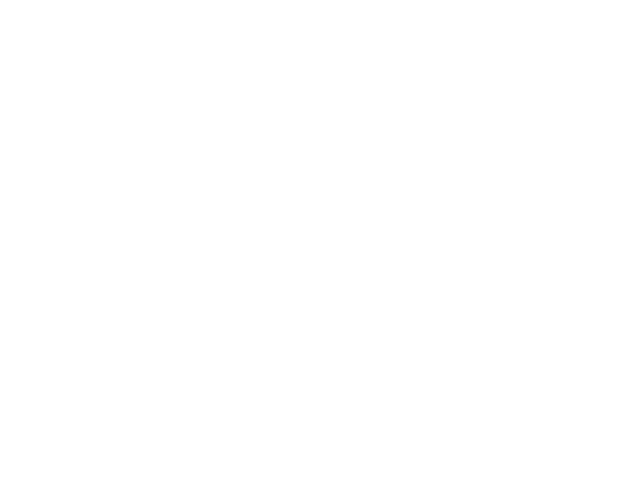

<IPython.core.display.Javascript object>


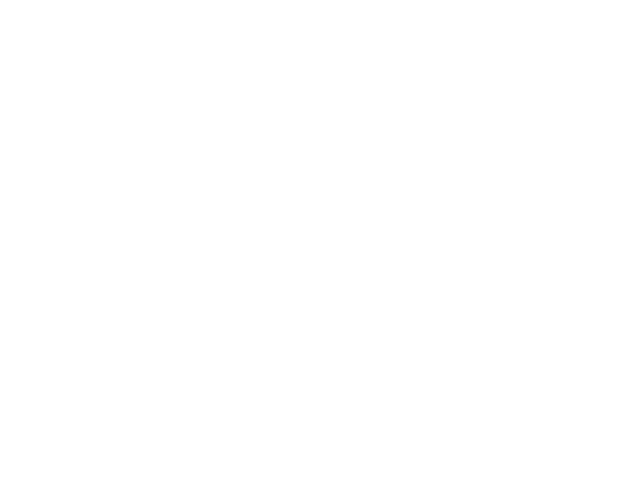

<IPython.core.display.Javascript object>


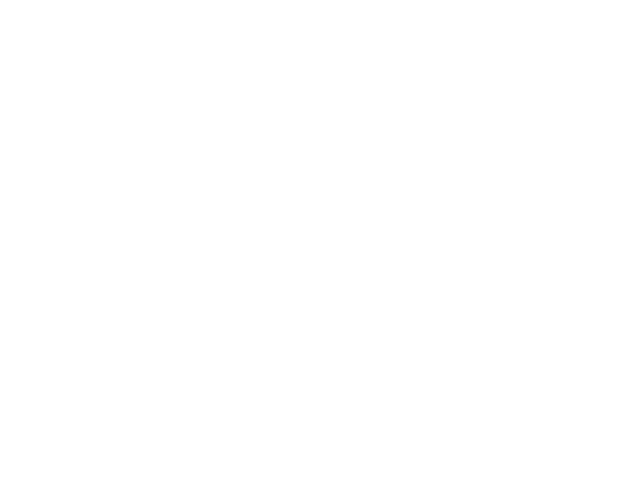

<IPython.core.display.Javascript object>


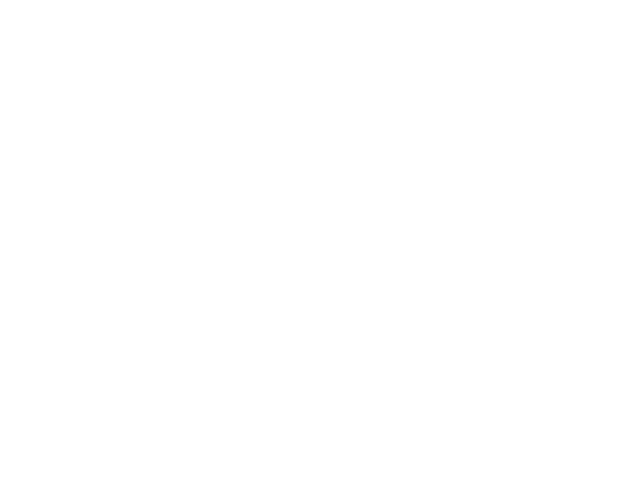

<IPython.core.display.Javascript object>


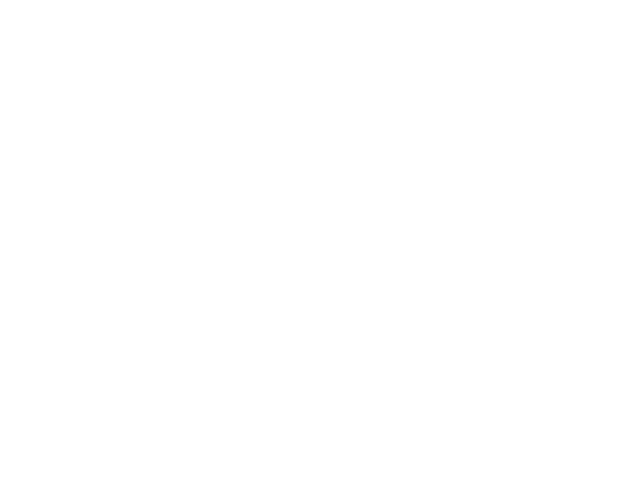

<IPython.core.display.Javascript object>


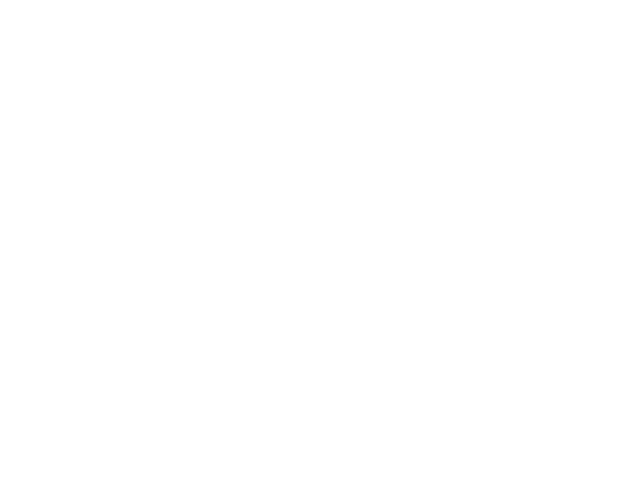

<IPython.core.display.Javascript object>


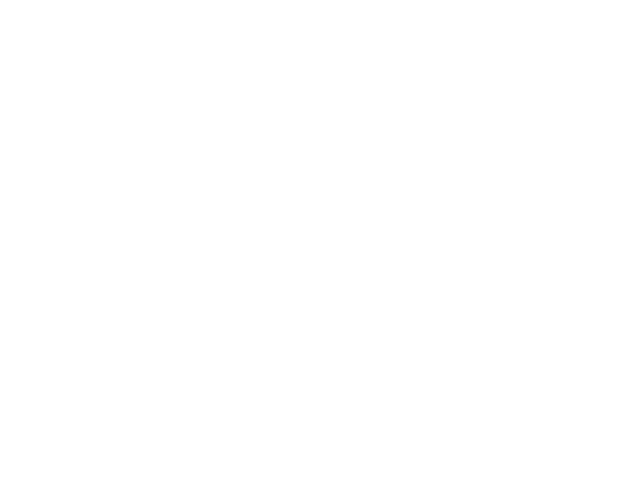

<IPython.core.display.Javascript object>


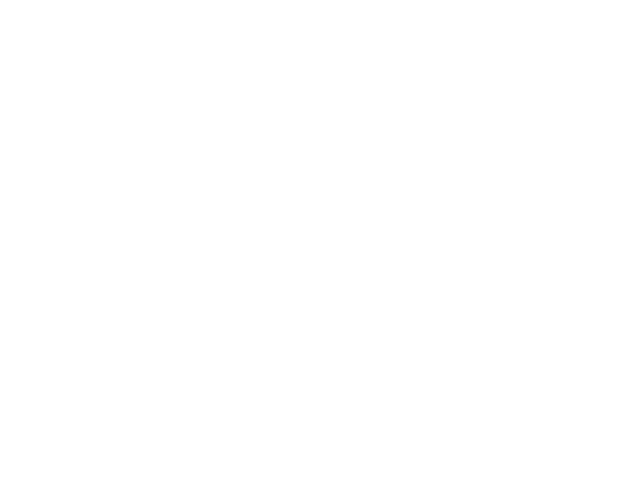

<IPython.core.display.Javascript object>


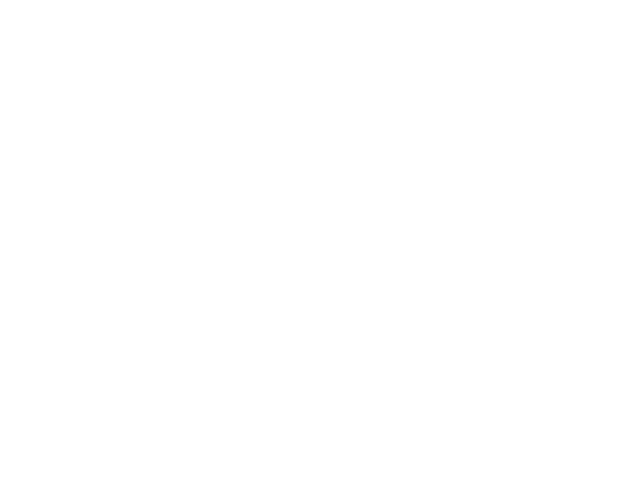

<IPython.core.display.Javascript object>


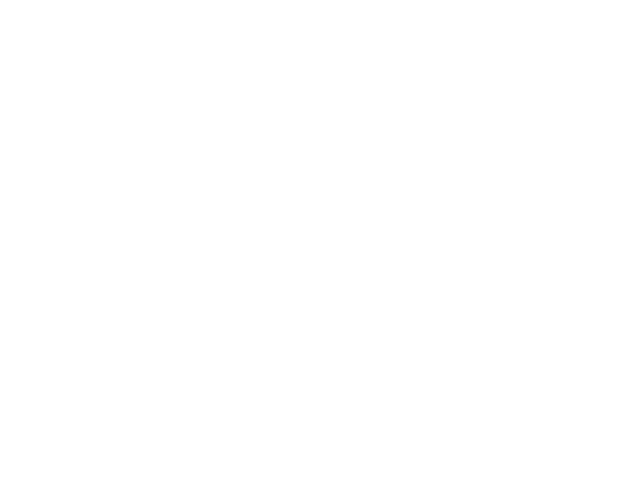

<IPython.core.display.Javascript object>


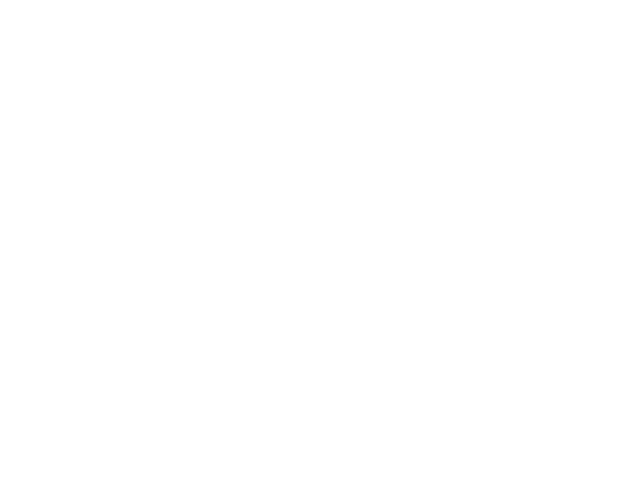

<IPython.core.display.Javascript object>


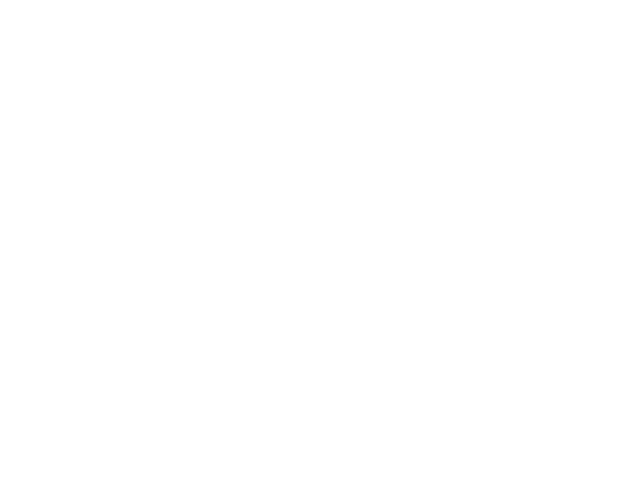

<IPython.core.display.Javascript object>


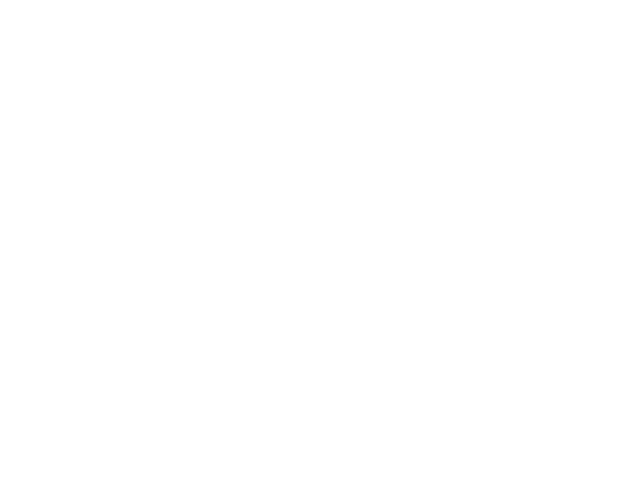

<IPython.core.display.Javascript object>


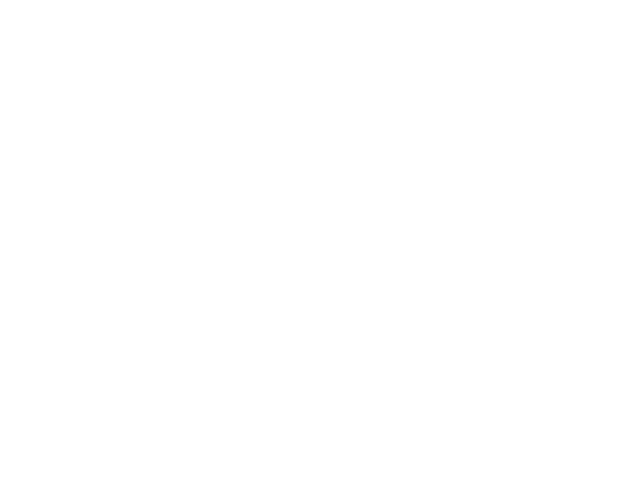

<IPython.core.display.Javascript object>


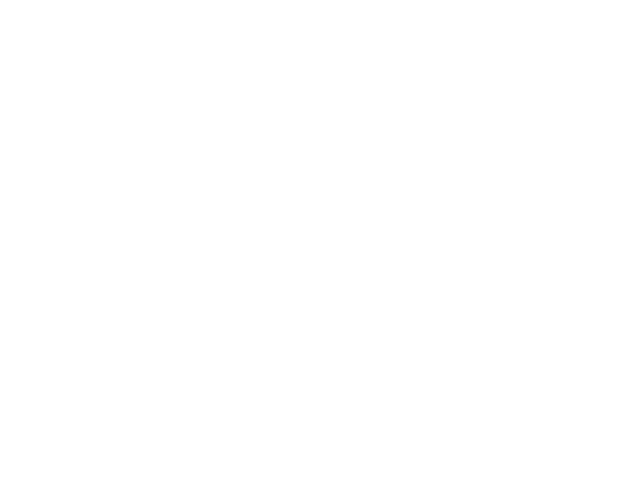

<IPython.core.display.Javascript object>


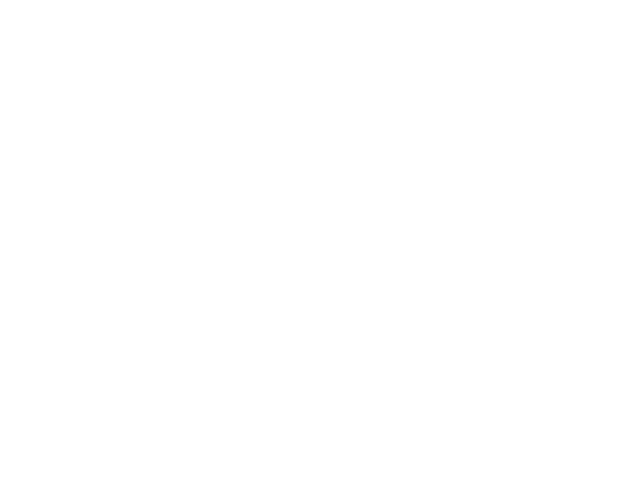

<IPython.core.display.Javascript object>


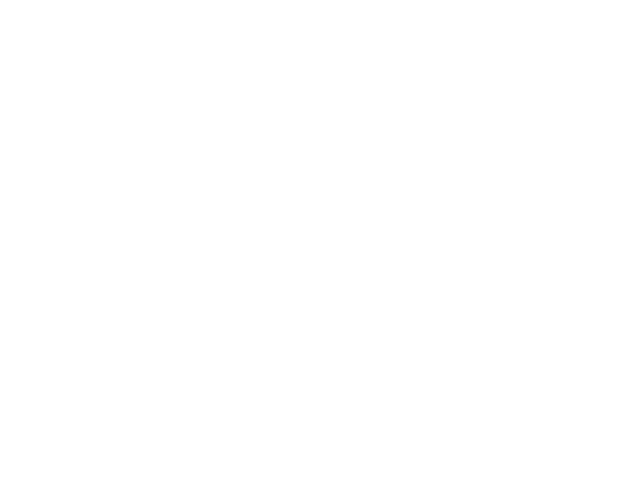

<IPython.core.display.Javascript object>


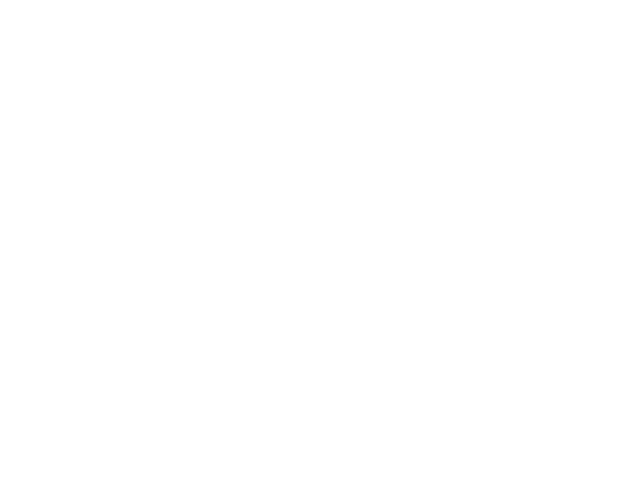

<IPython.core.display.Javascript object>


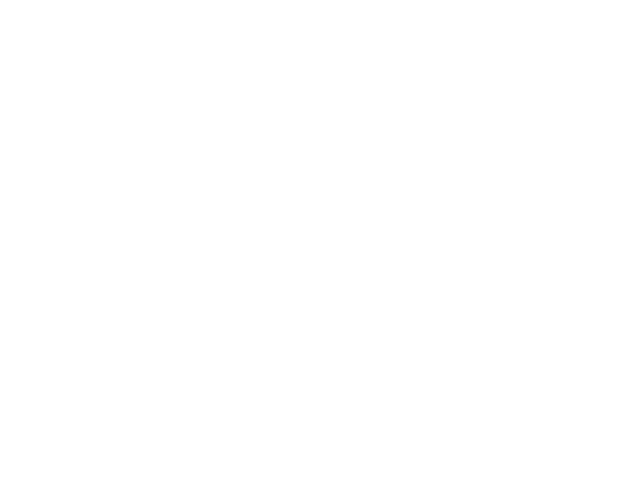

<IPython.core.display.Javascript object>


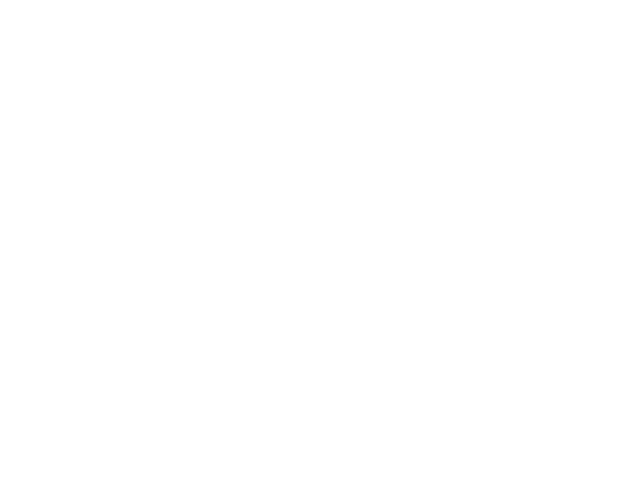

<IPython.core.display.Javascript object>


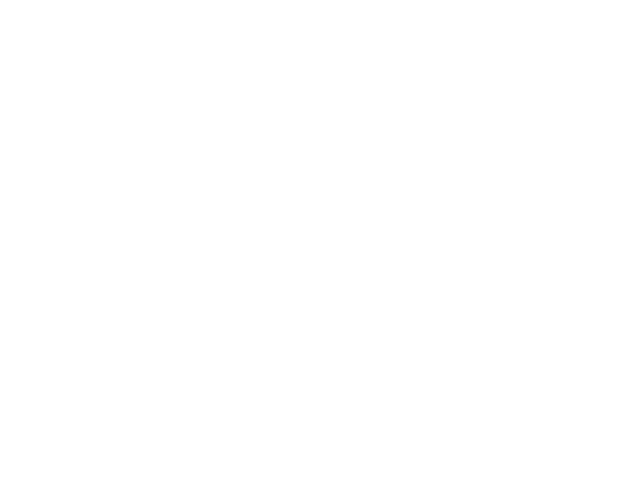

<IPython.core.display.Javascript object>


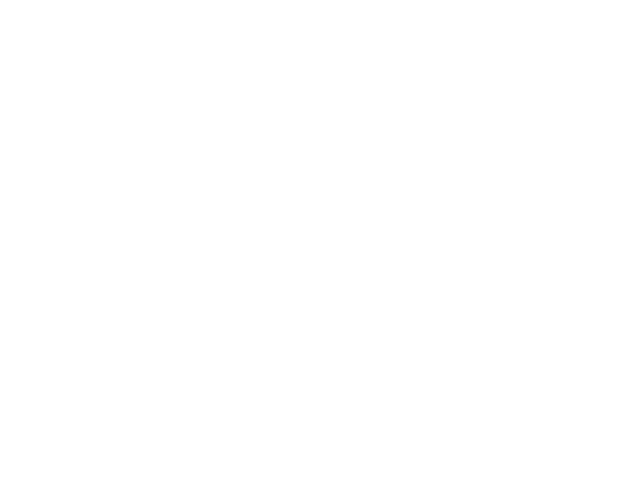

<IPython.core.display.Javascript object>


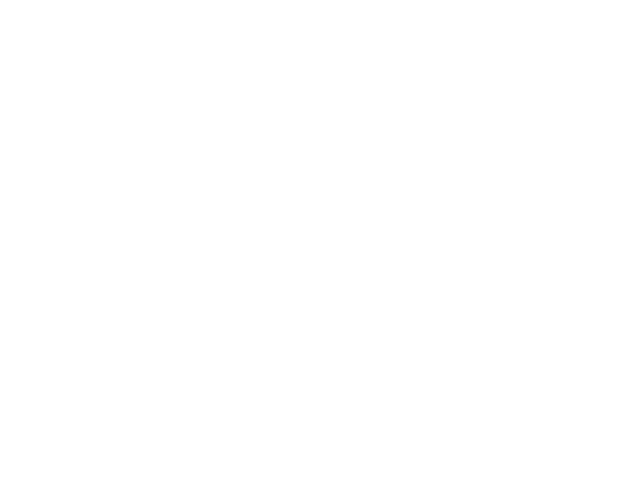

<IPython.core.display.Javascript object>


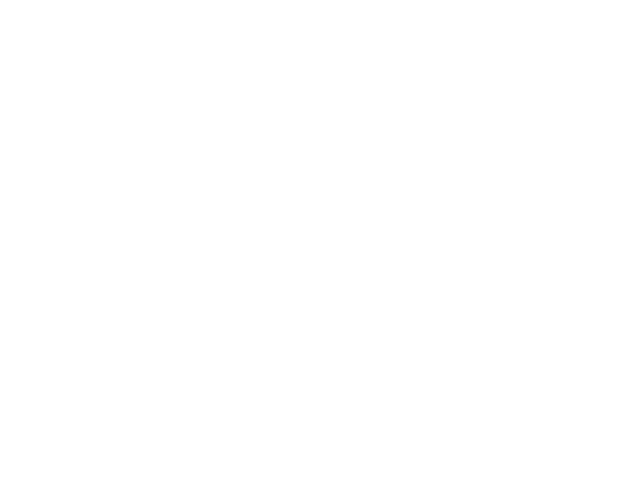

<IPython.core.display.Javascript object>


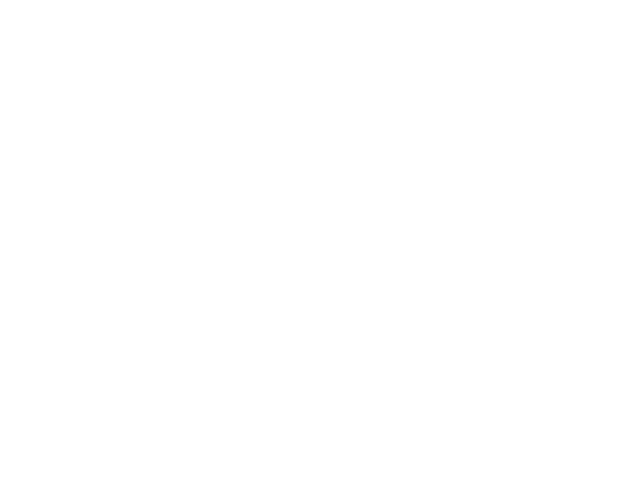

<IPython.core.display.Javascript object>


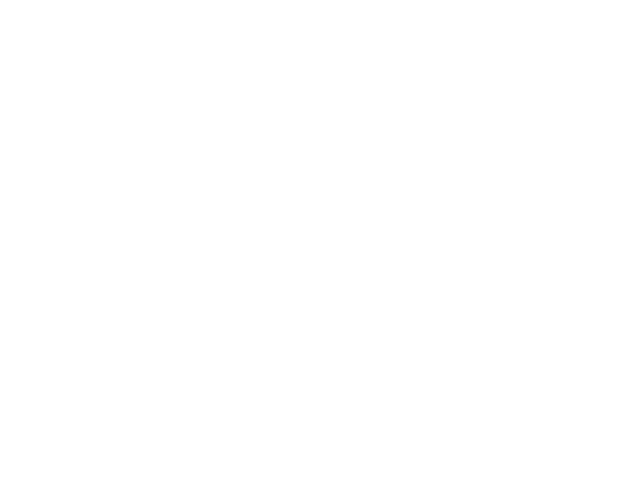

<IPython.core.display.Javascript object>


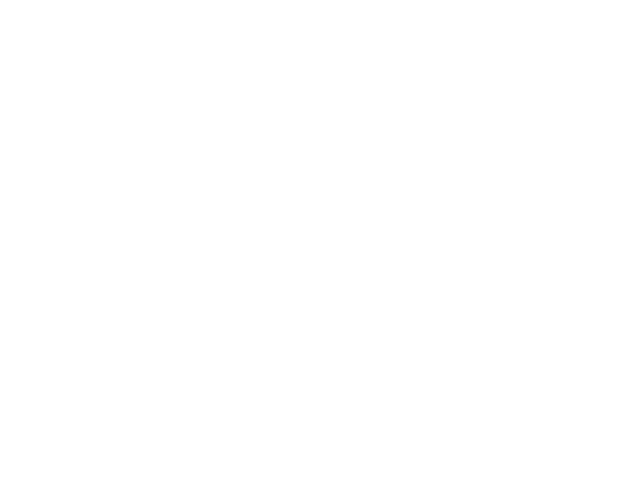

<IPython.core.display.Javascript object>


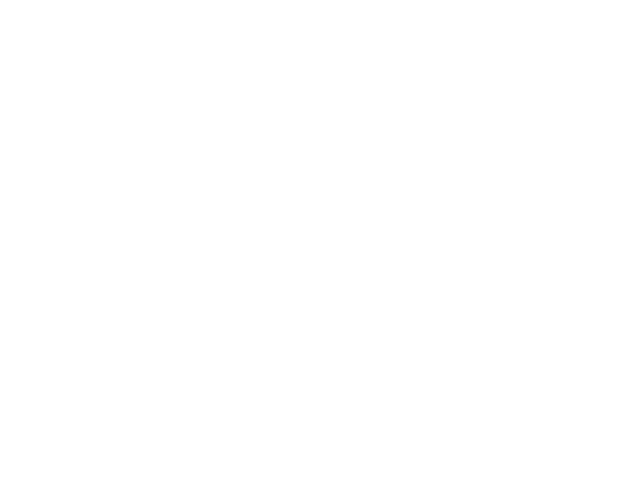

<IPython.core.display.Javascript object>


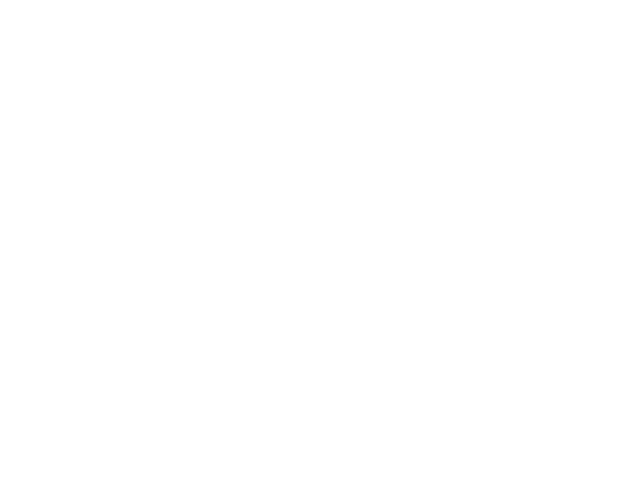

<IPython.core.display.Javascript object>


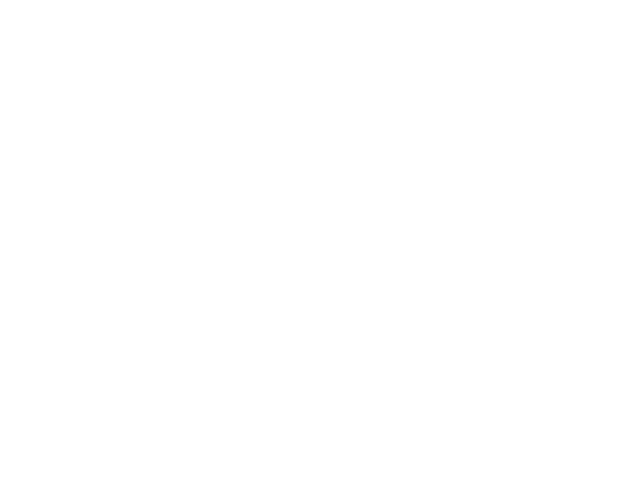

<IPython.core.display.Javascript object>


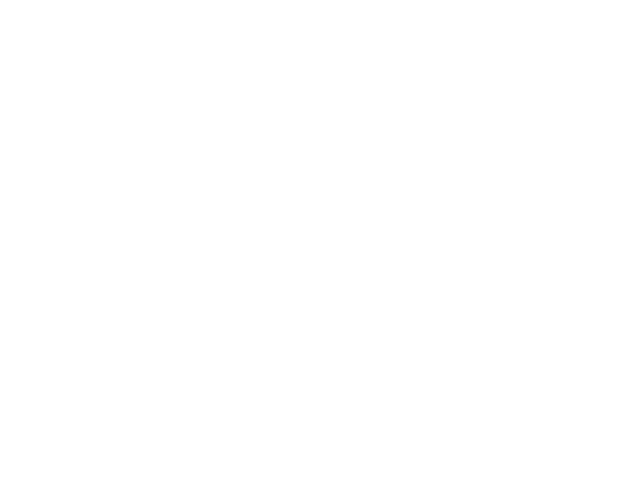

<IPython.core.display.Javascript object>


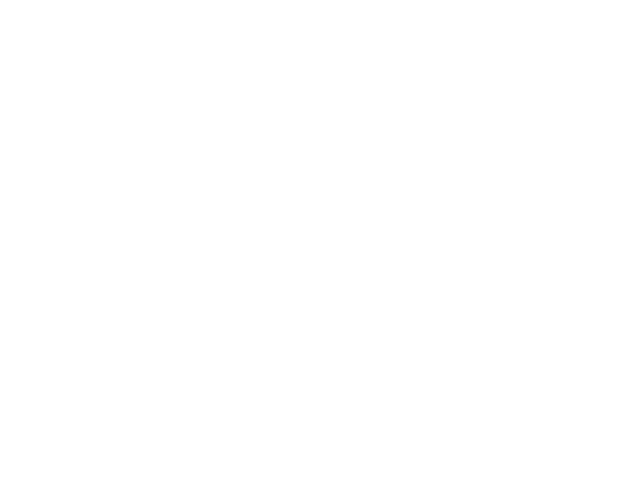

<IPython.core.display.Javascript object>


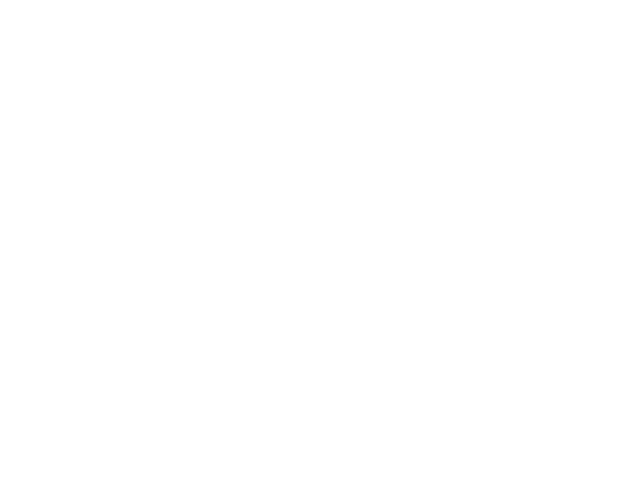

<IPython.core.display.Javascript object>


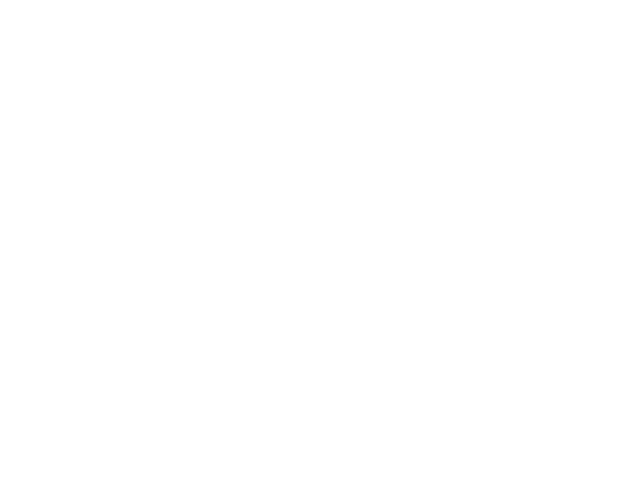

<IPython.core.display.Javascript object>


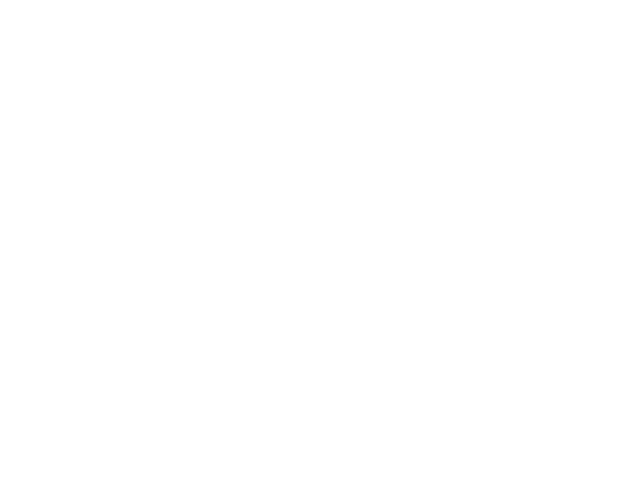

<IPython.core.display.Javascript object>


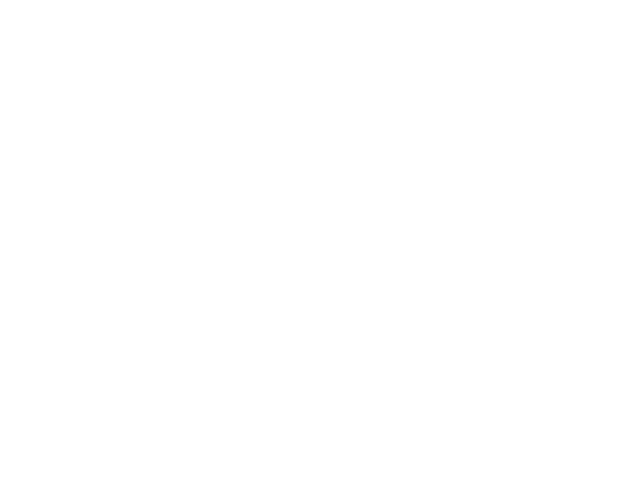

<IPython.core.display.Javascript object>


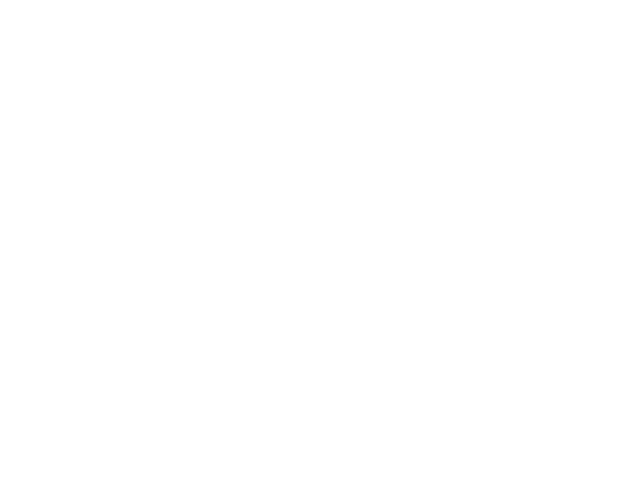

<IPython.core.display.Javascript object>


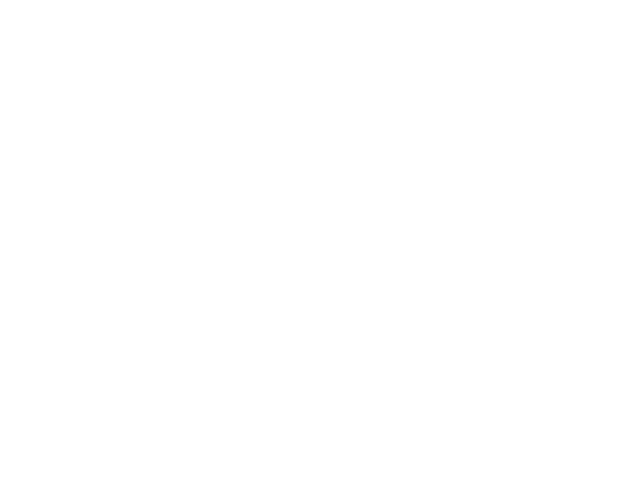

<IPython.core.display.Javascript object>


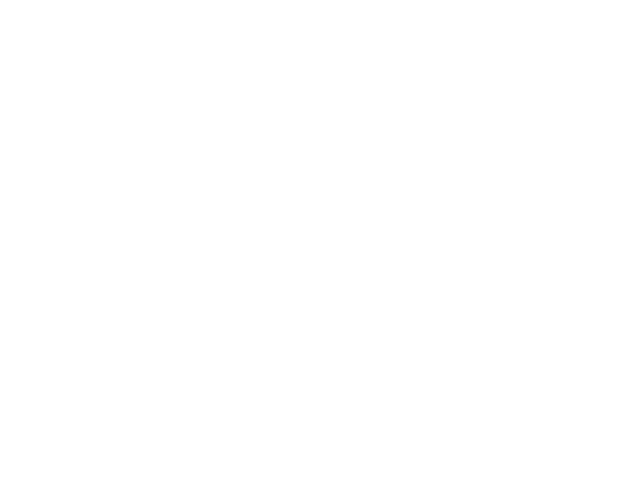

<IPython.core.display.Javascript object>


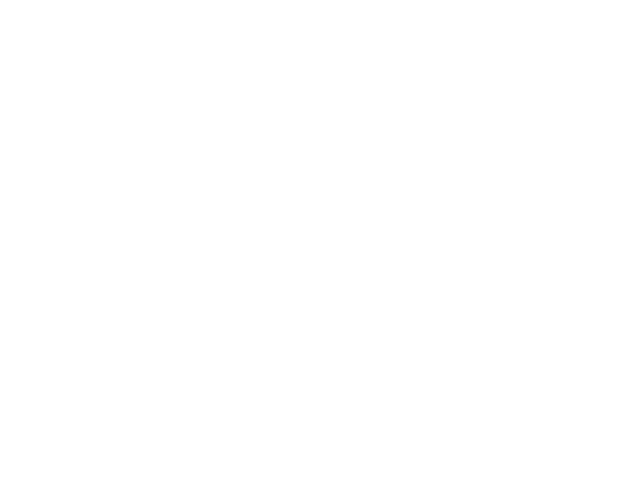

<IPython.core.display.Javascript object>


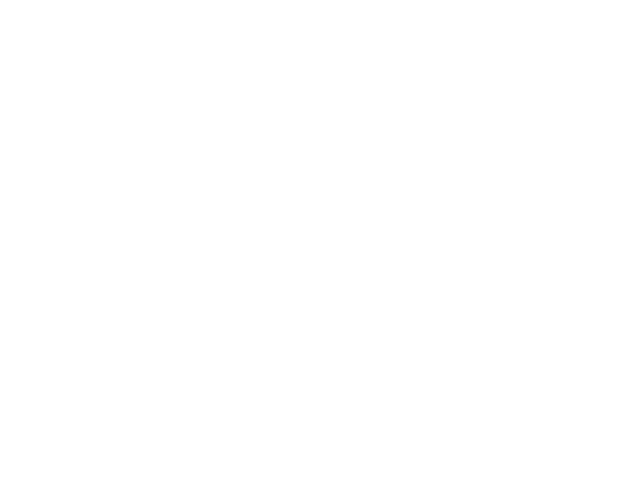

<IPython.core.display.Javascript object>


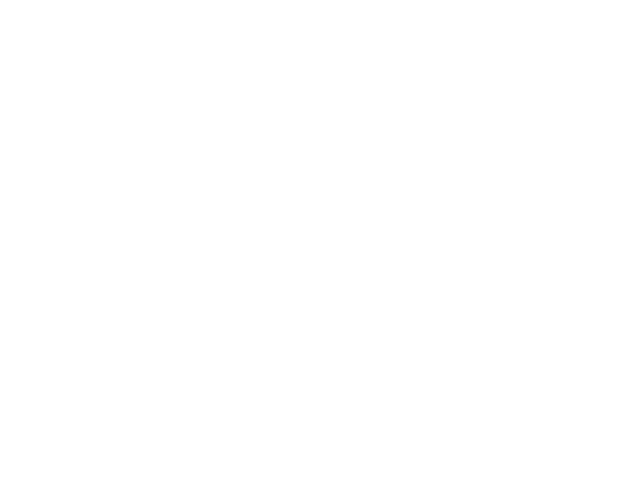

<IPython.core.display.Javascript object>


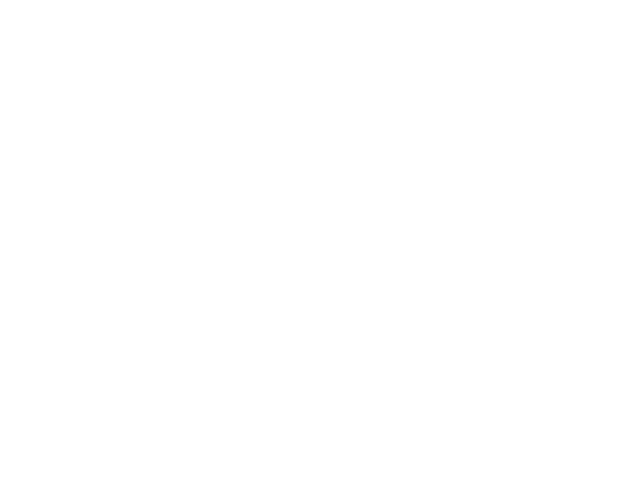

<IPython.core.display.Javascript object>


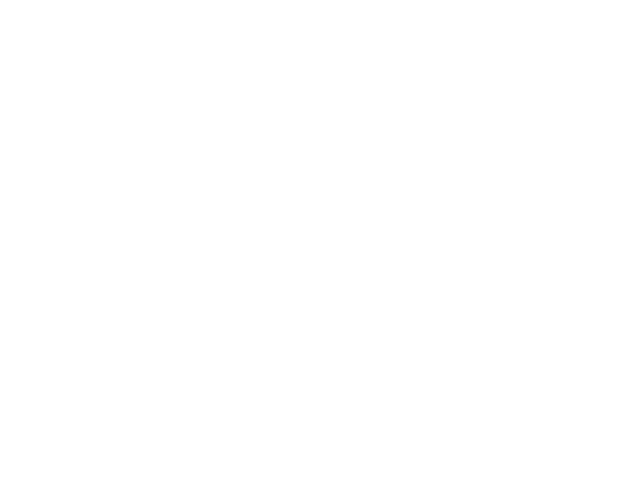

<IPython.core.display.Javascript object>


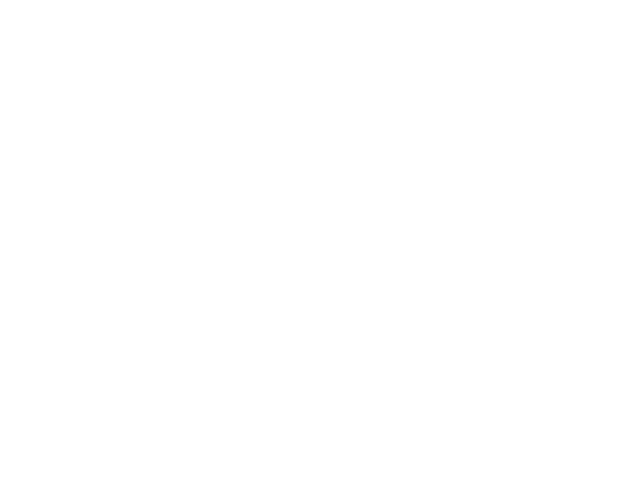

<IPython.core.display.Javascript object>


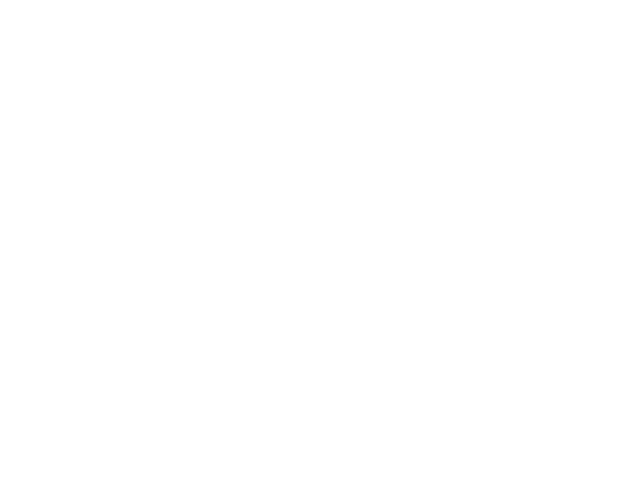

<IPython.core.display.Javascript object>


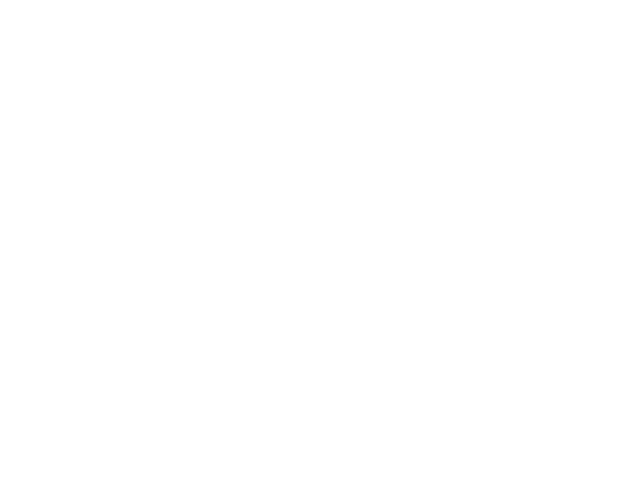

<IPython.core.display.Javascript object>


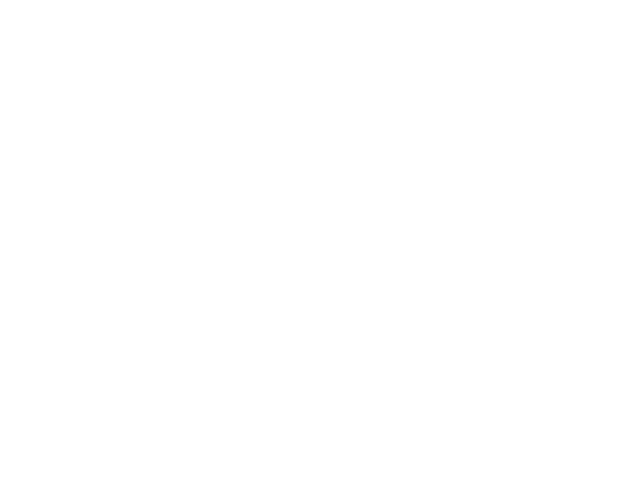

<IPython.core.display.Javascript object>


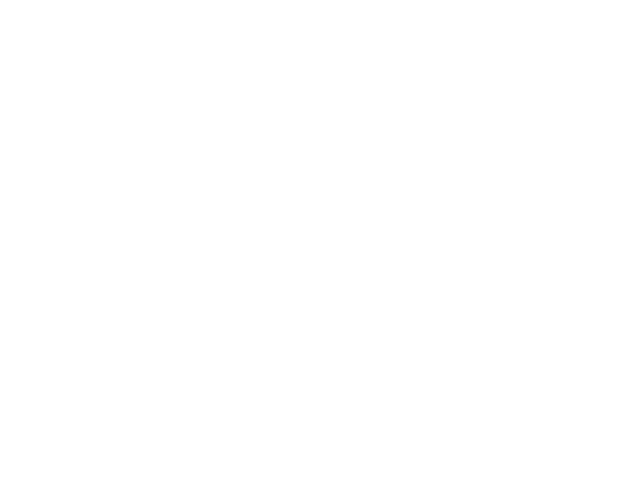

<IPython.core.display.Javascript object>


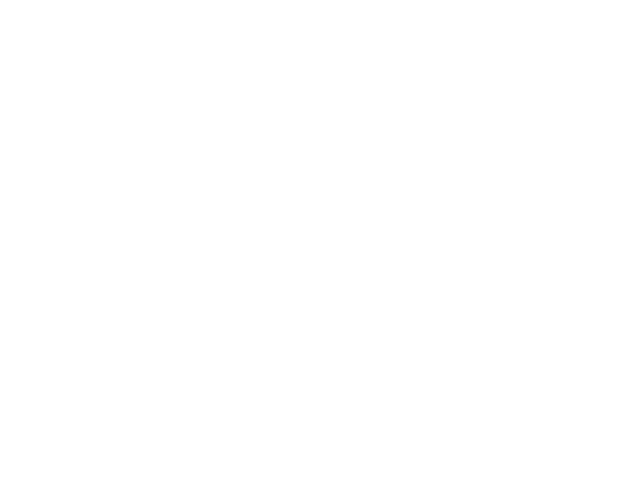

<IPython.core.display.Javascript object>


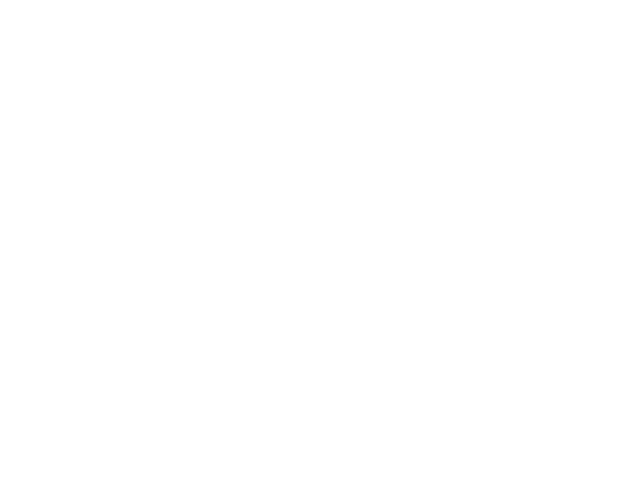

<IPython.core.display.Javascript object>


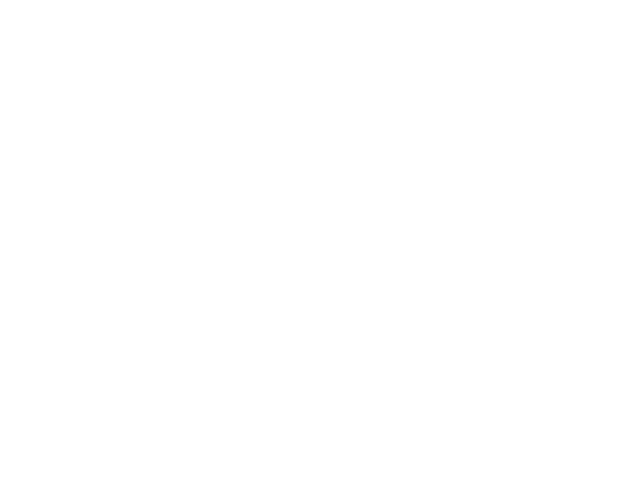

<IPython.core.display.Javascript object>


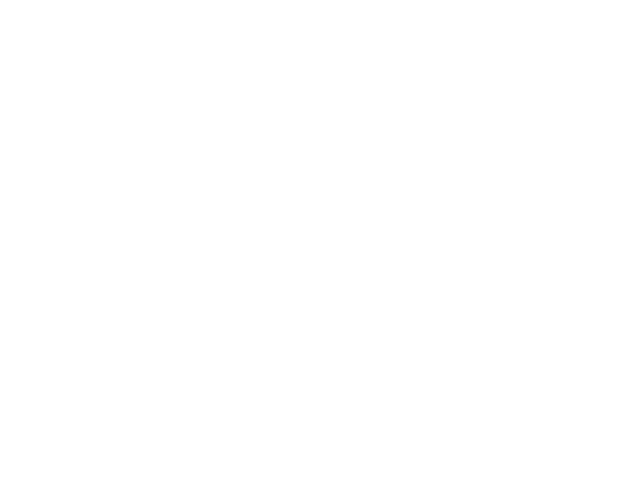

<IPython.core.display.Javascript object>


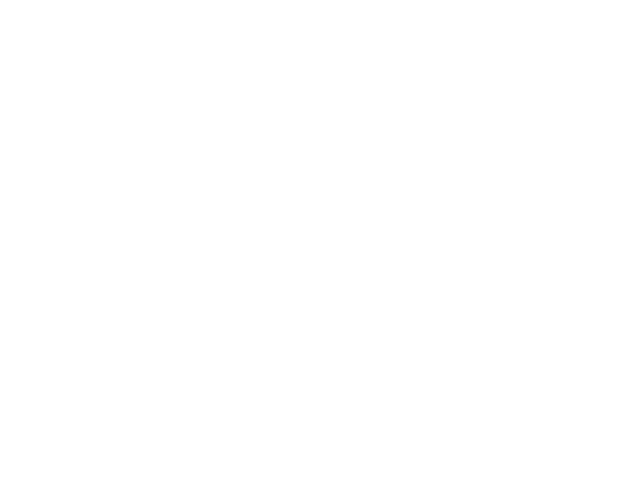

<IPython.core.display.Javascript object>


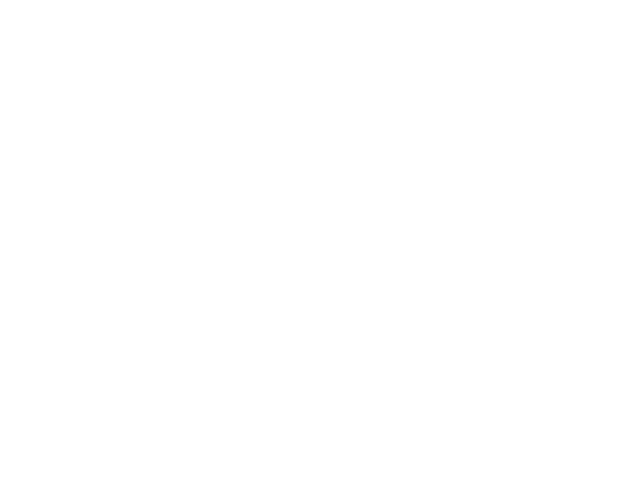

<IPython.core.display.Javascript object>


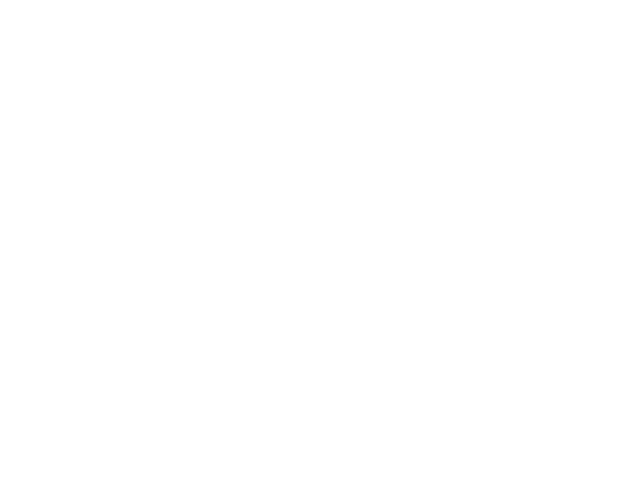

<IPython.core.display.Javascript object>


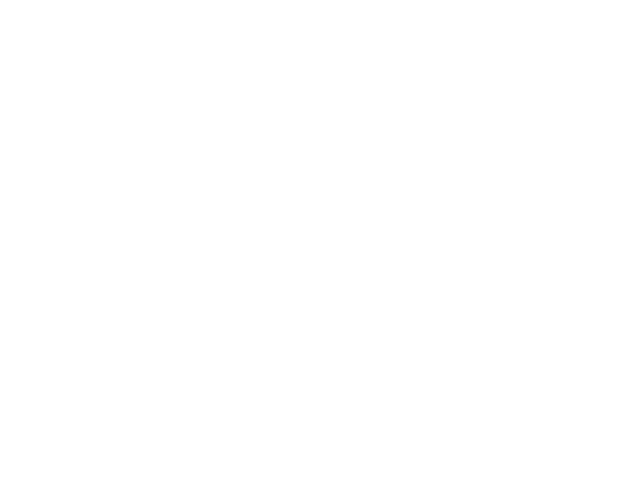

<IPython.core.display.Javascript object>


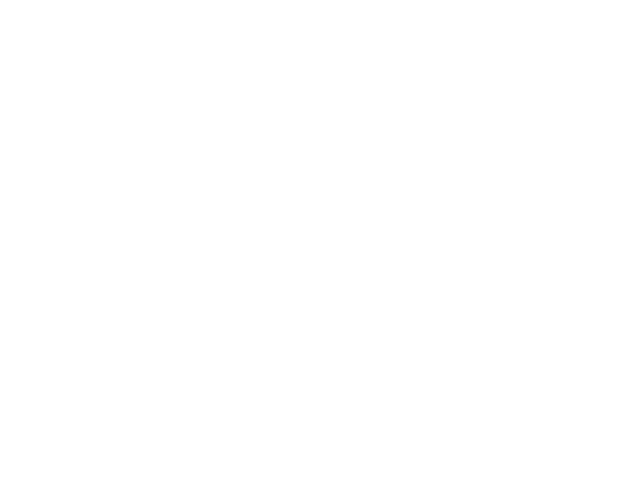

<IPython.core.display.Javascript object>


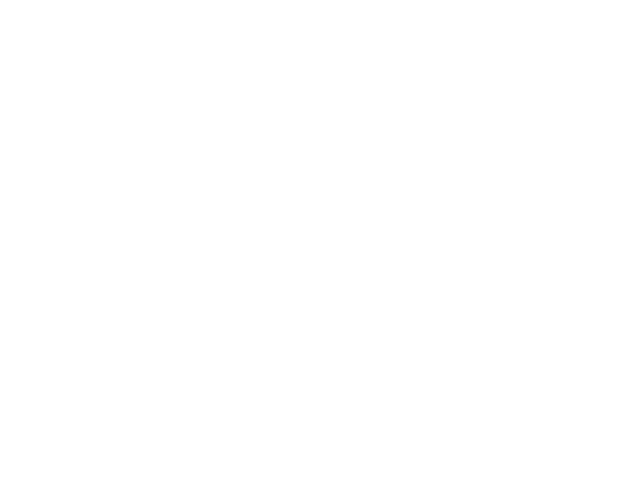

<IPython.core.display.Javascript object>


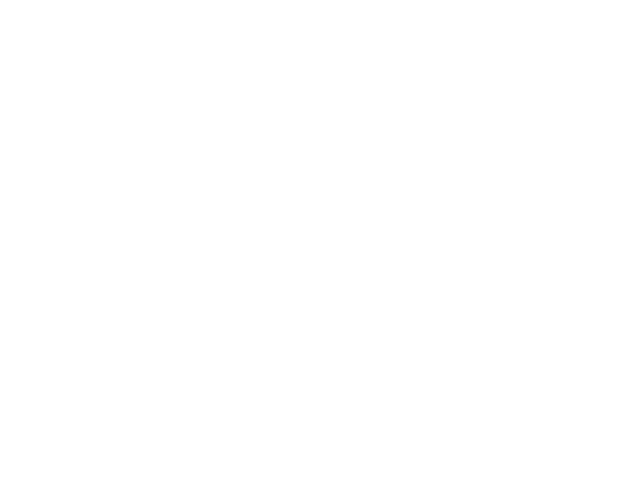

<IPython.core.display.Javascript object>


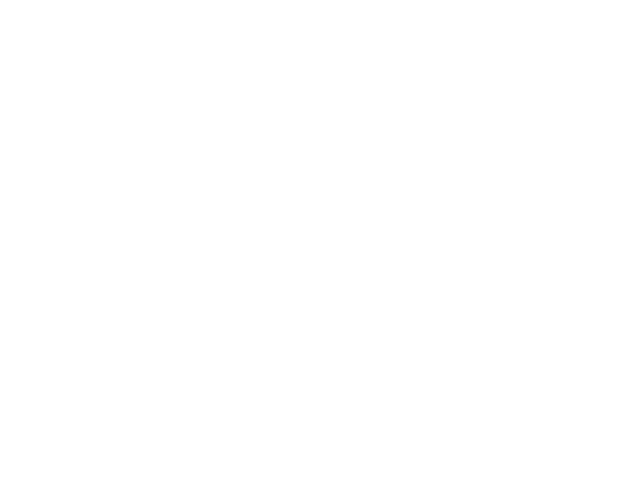

<IPython.core.display.Javascript object>


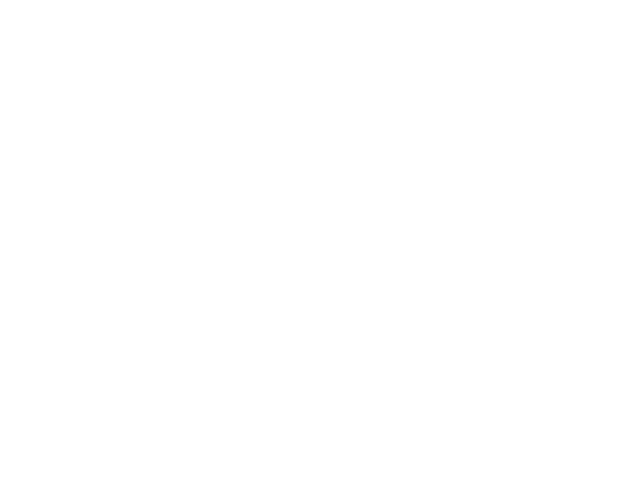

<IPython.core.display.Javascript object>


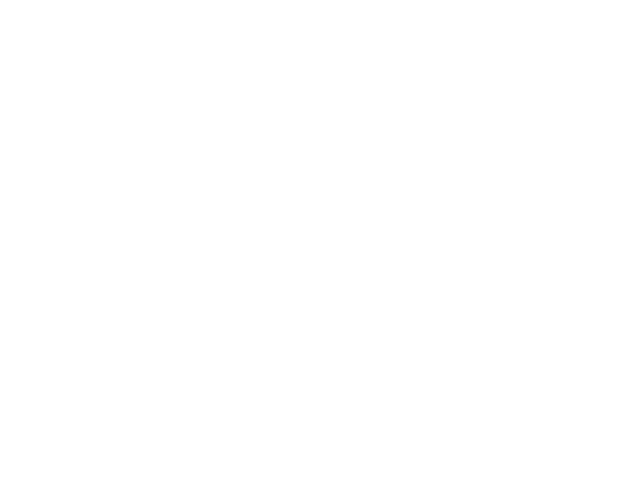

<IPython.core.display.Javascript object>


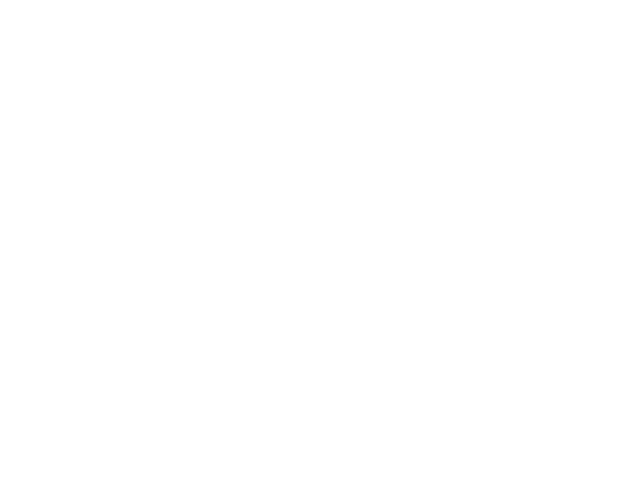

<IPython.core.display.Javascript object>


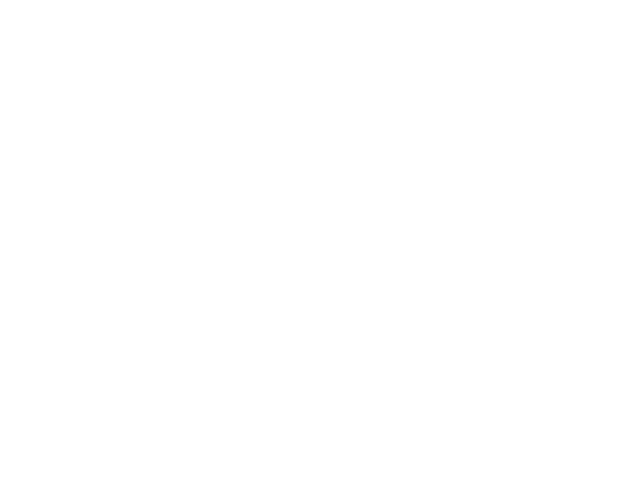

<IPython.core.display.Javascript object>


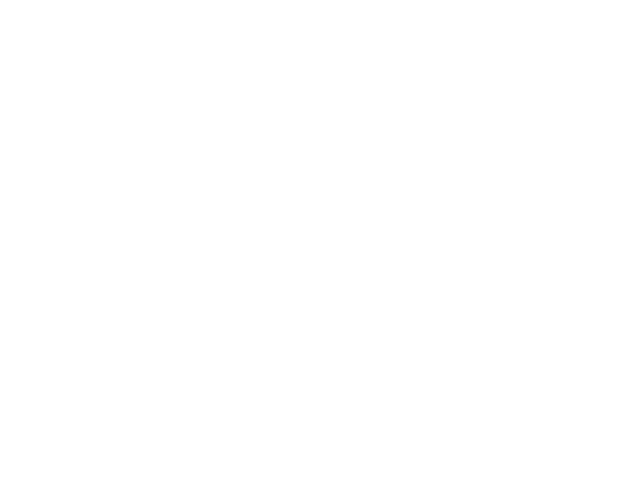

<IPython.core.display.Javascript object>


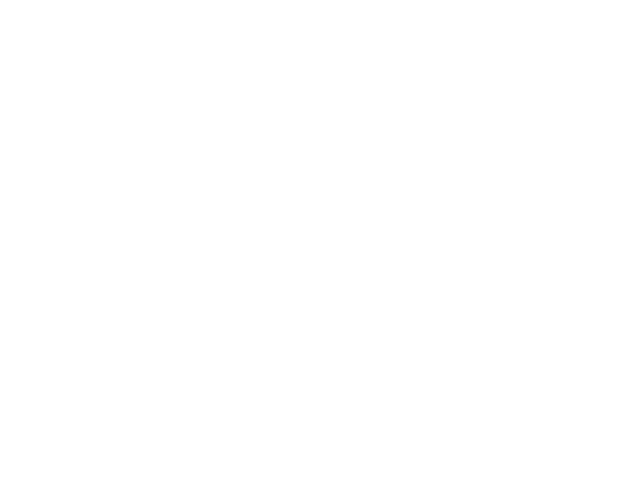

<IPython.core.display.Javascript object>


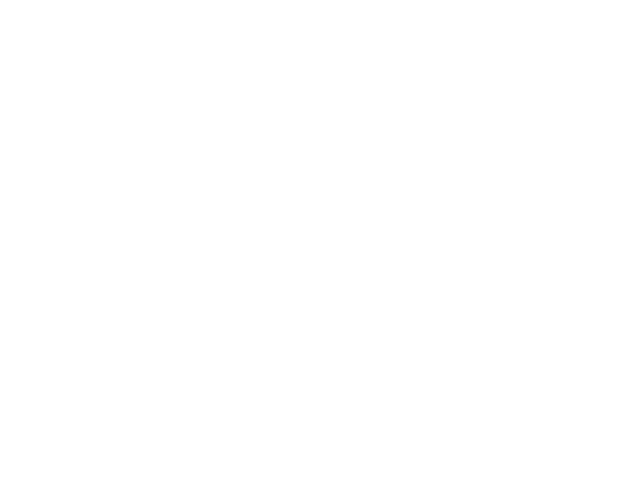

<IPython.core.display.Javascript object>


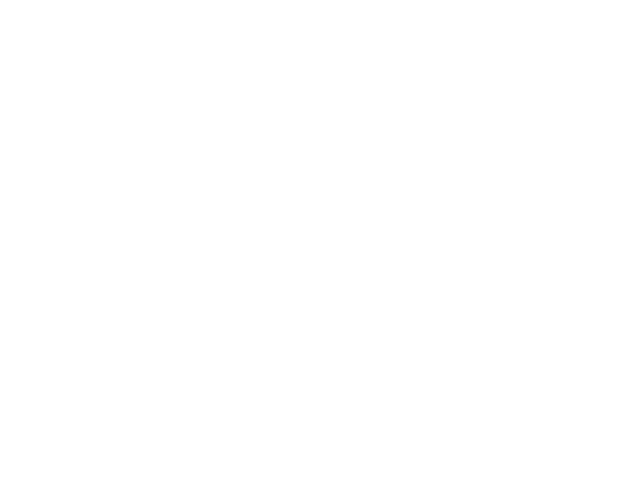

<IPython.core.display.Javascript object>


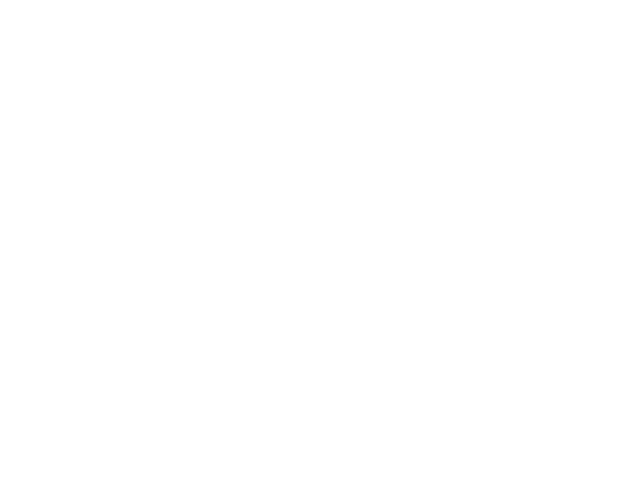

<IPython.core.display.Javascript object>


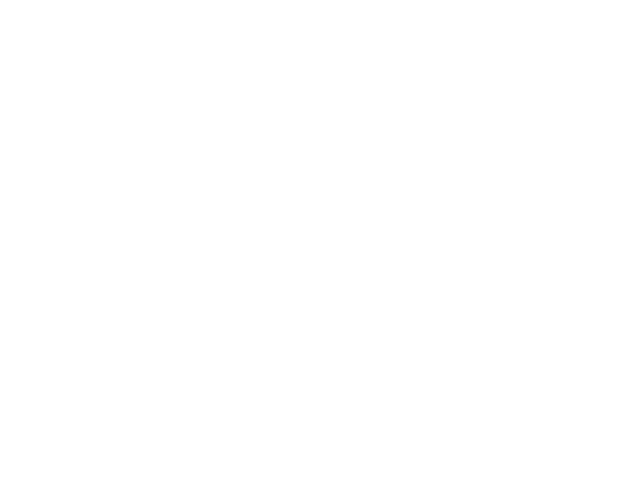

<IPython.core.display.Javascript object>


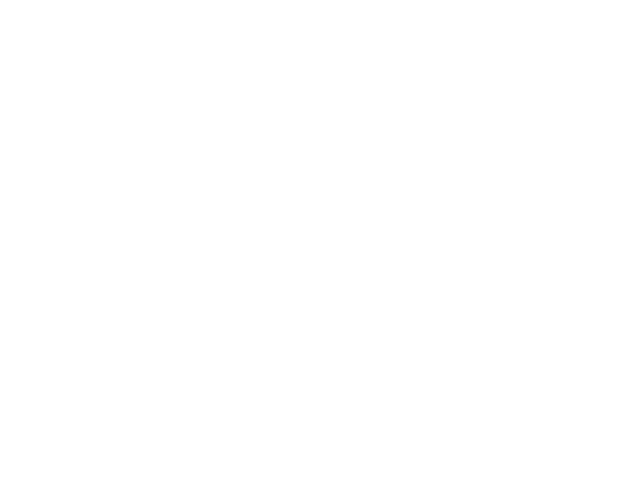

<IPython.core.display.Javascript object>


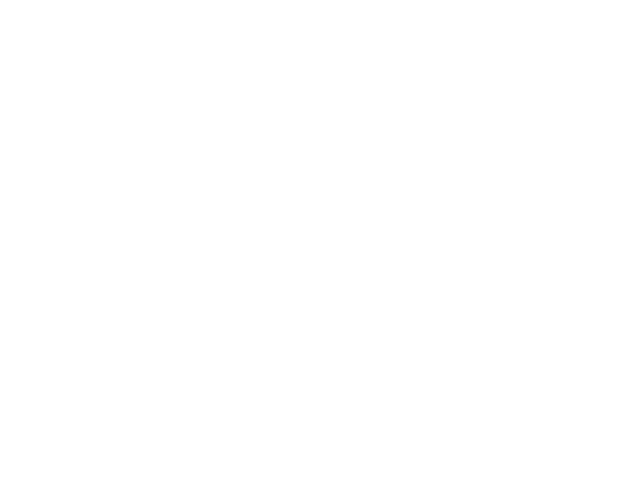

<IPython.core.display.Javascript object>


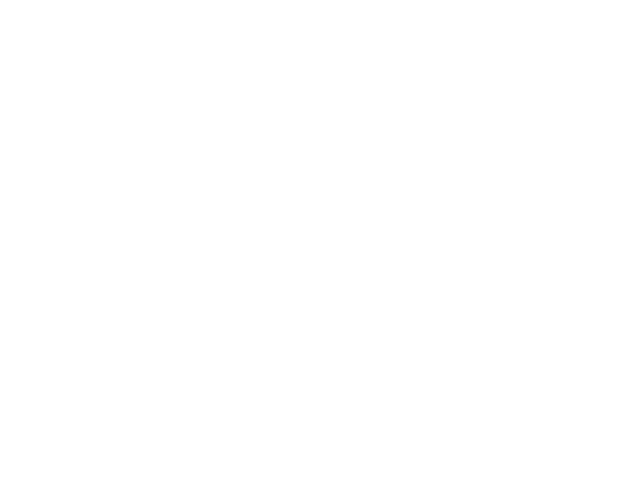

<IPython.core.display.Javascript object>


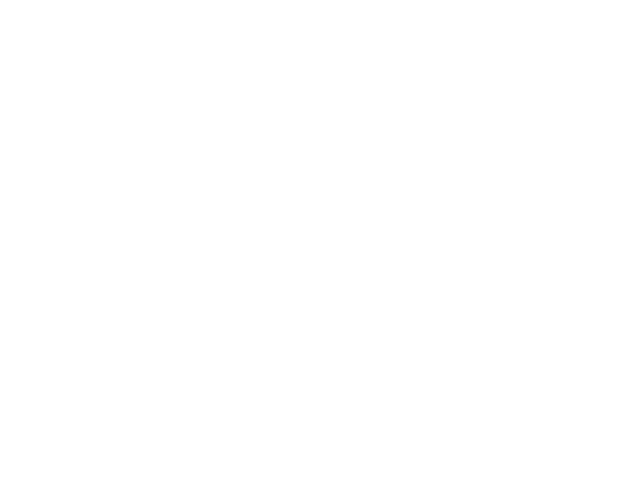

<IPython.core.display.Javascript object>


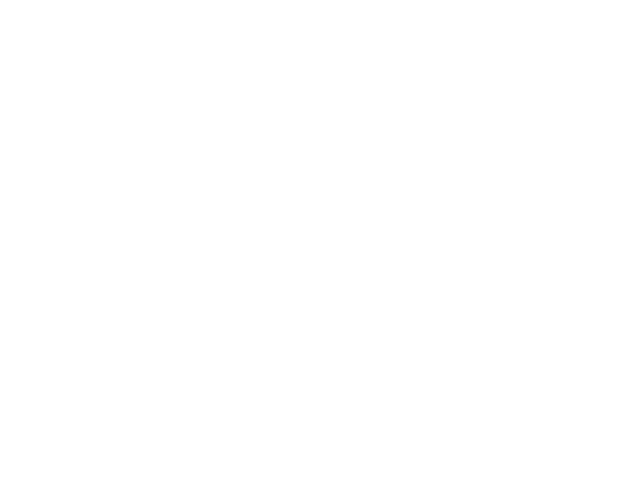

<IPython.core.display.Javascript object>


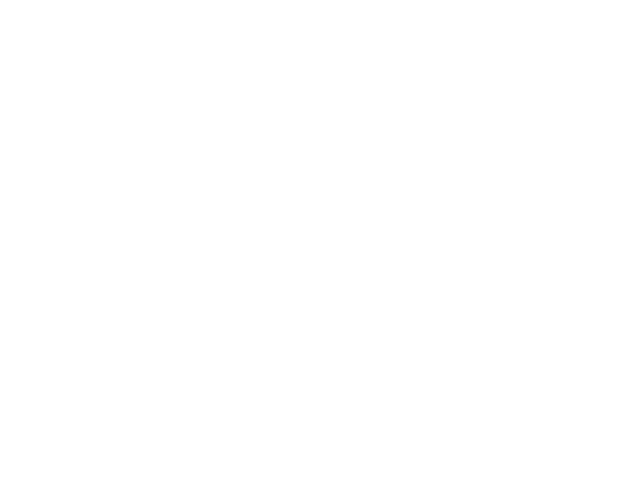

<IPython.core.display.Javascript object>


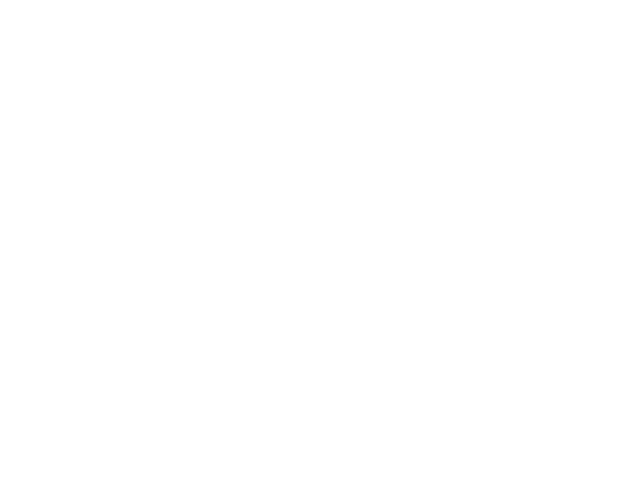

<IPython.core.display.Javascript object>


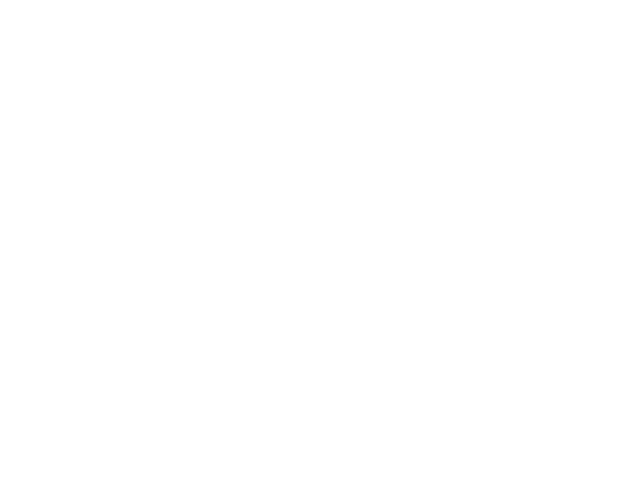

<IPython.core.display.Javascript object>


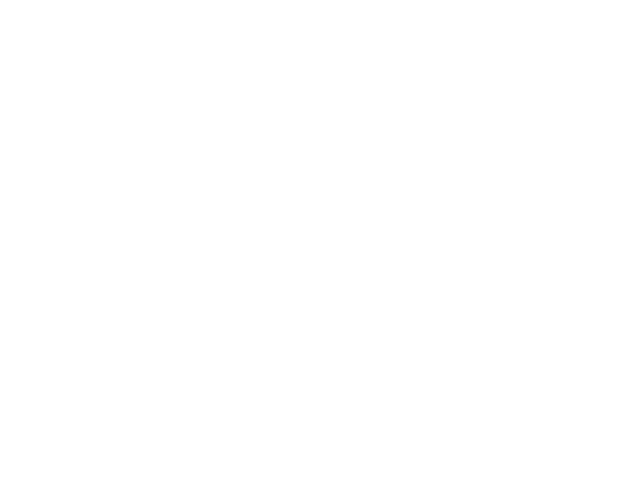

<IPython.core.display.Javascript object>


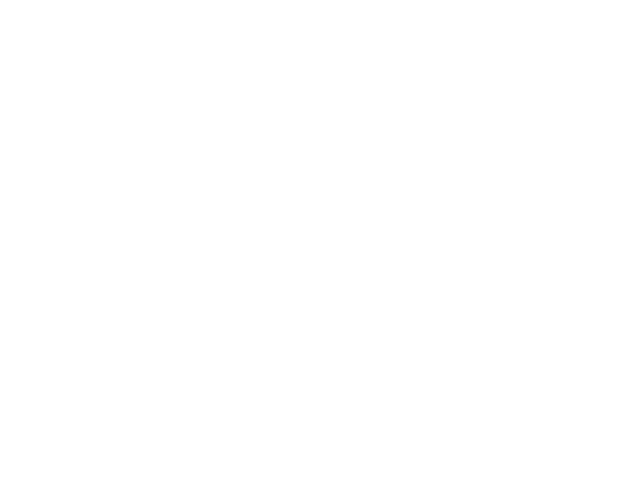

<IPython.core.display.Javascript object>


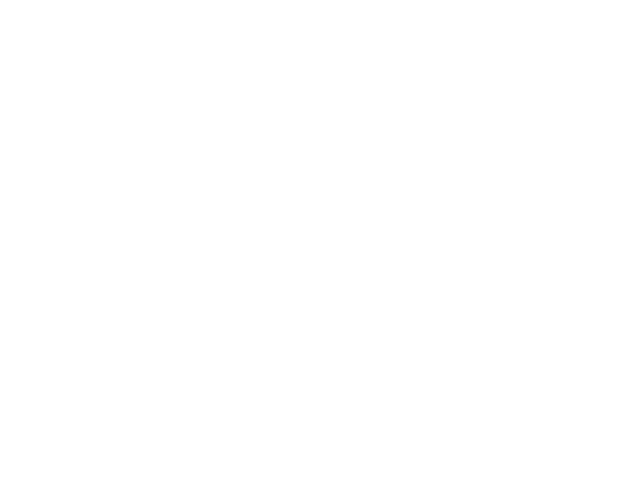

<IPython.core.display.Javascript object>


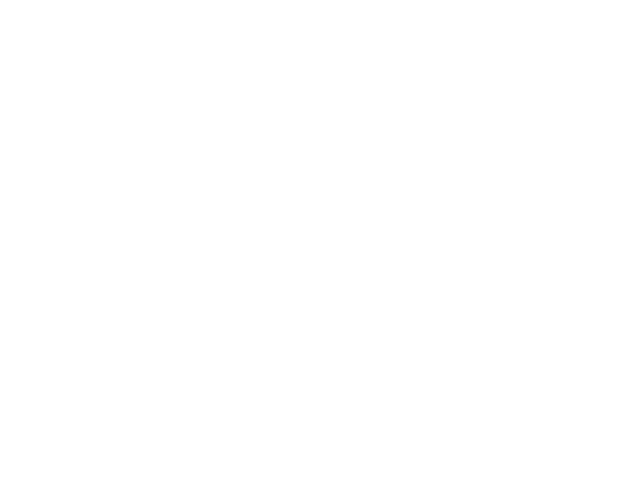

<IPython.core.display.Javascript object>


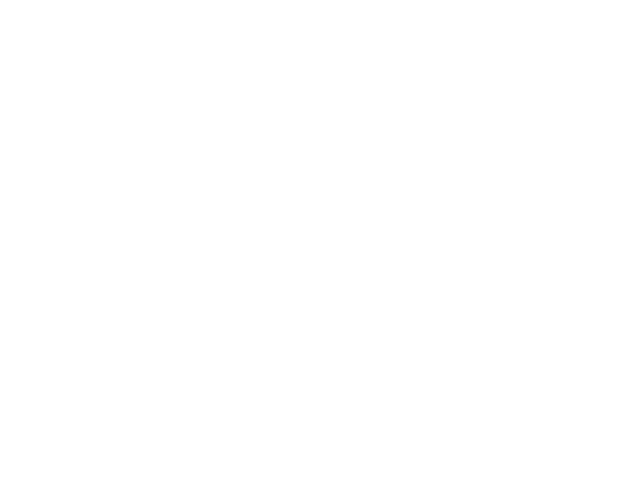

<IPython.core.display.Javascript object>


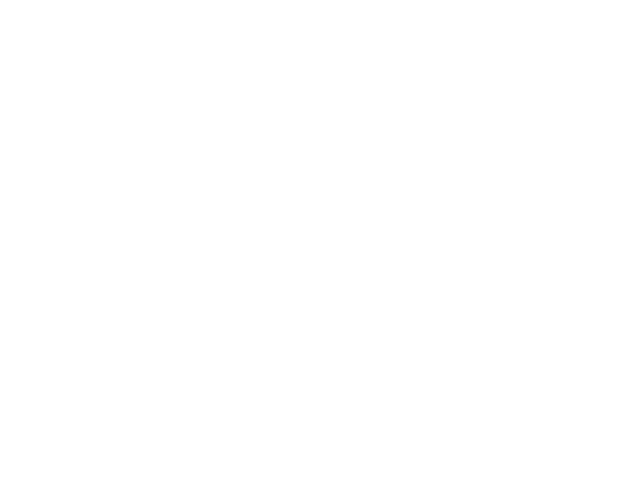

<IPython.core.display.Javascript object>


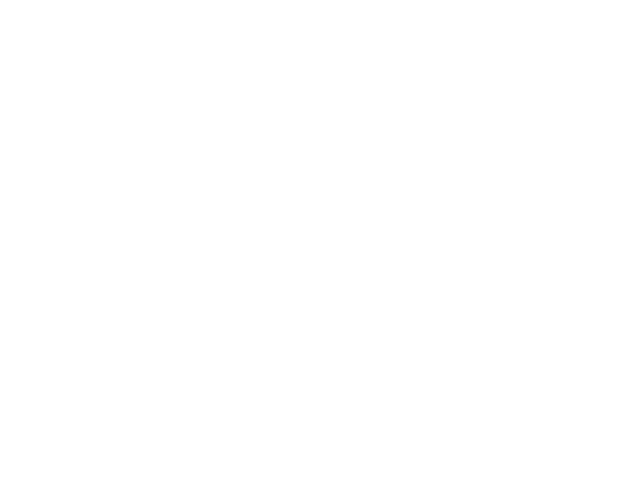

<IPython.core.display.Javascript object>


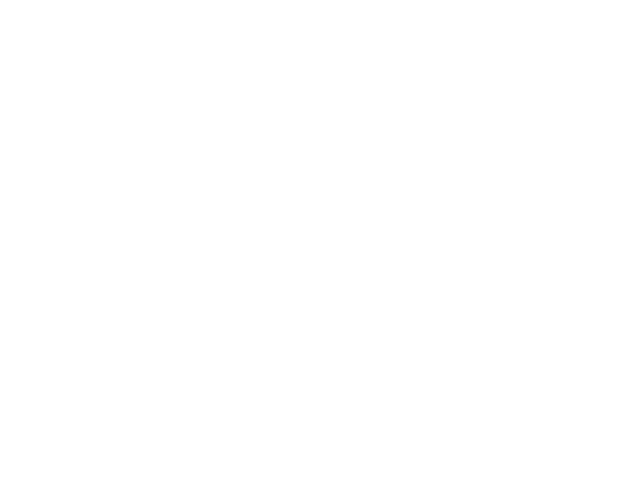

<IPython.core.display.Javascript object>


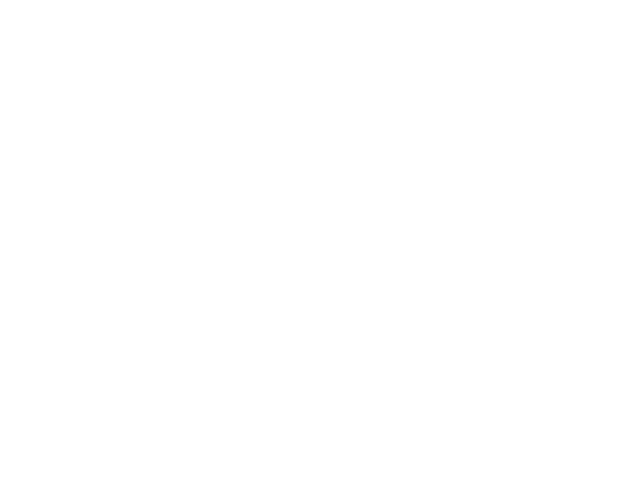

<IPython.core.display.Javascript object>


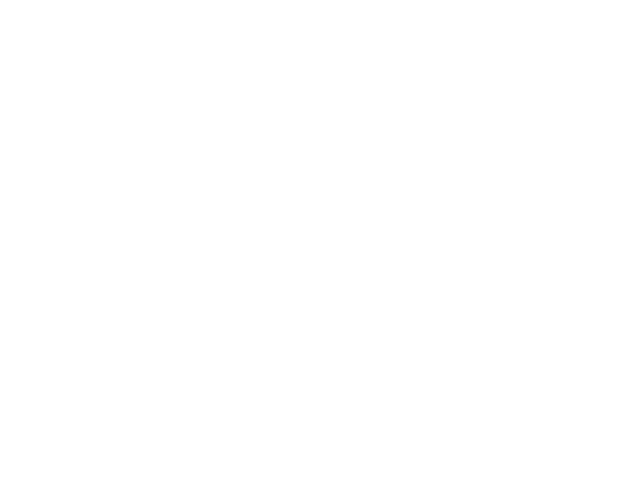

<IPython.core.display.Javascript object>


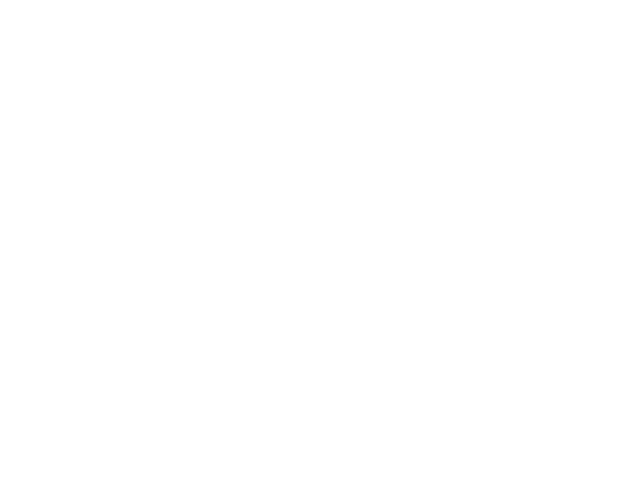

<IPython.core.display.Javascript object>


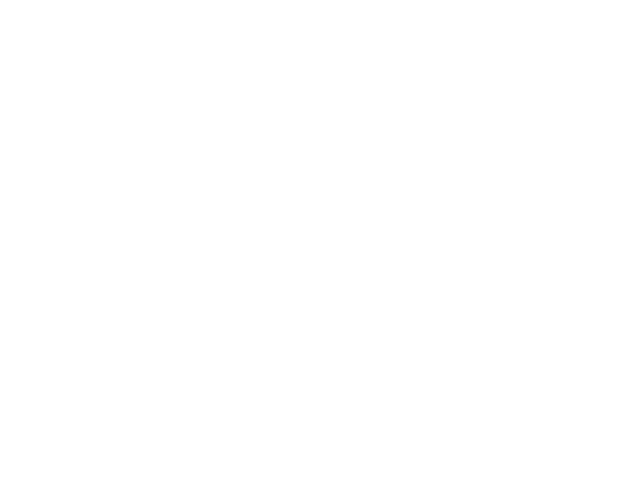

<IPython.core.display.Javascript object>


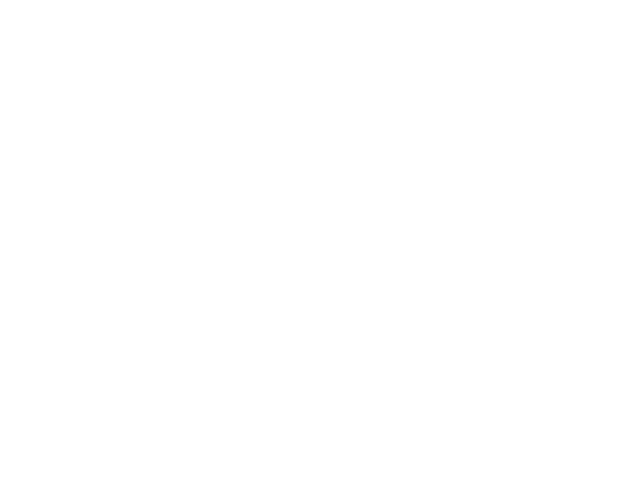

<IPython.core.display.Javascript object>


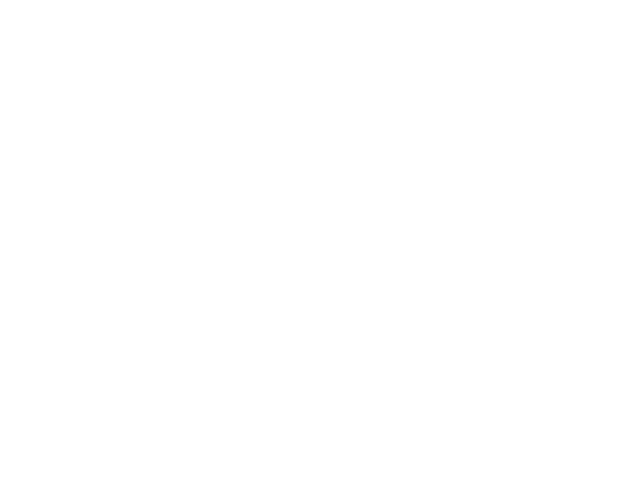

<IPython.core.display.Javascript object>


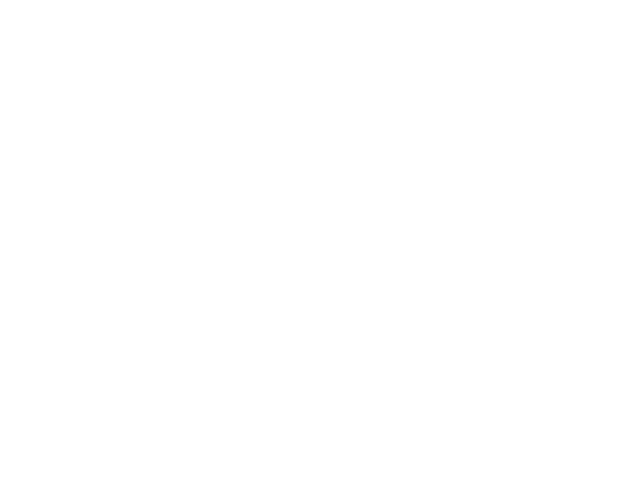

<IPython.core.display.Javascript object>


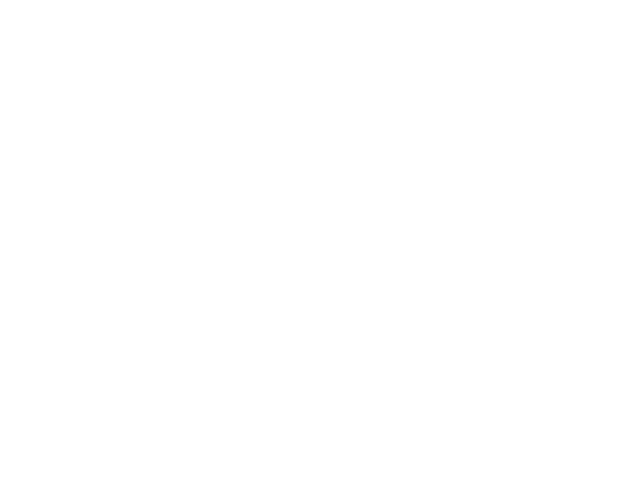

<IPython.core.display.Javascript object>


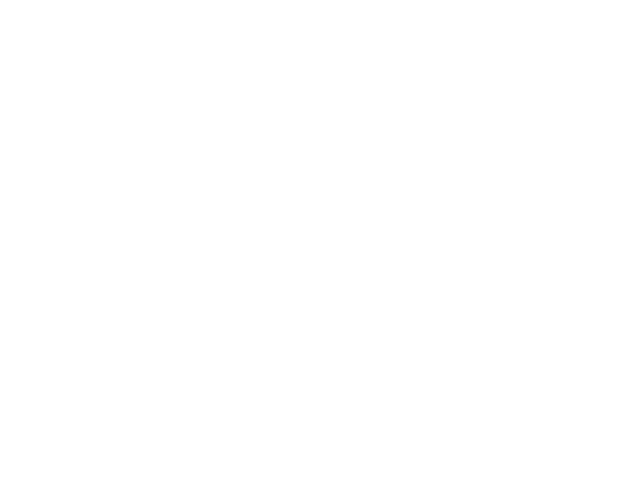

<IPython.core.display.Javascript object>


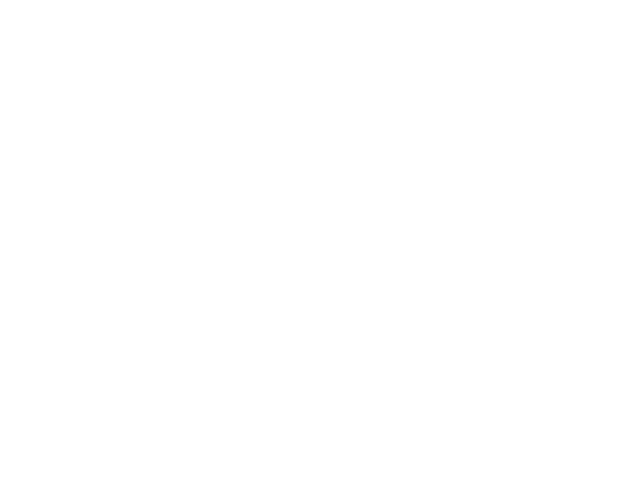

<IPython.core.display.Javascript object>


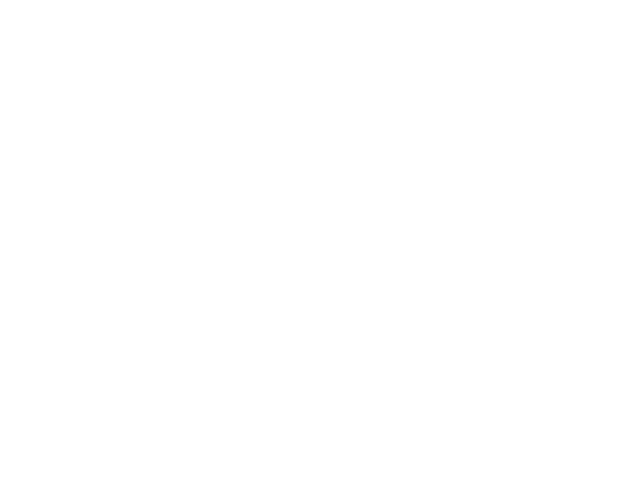

<IPython.core.display.Javascript object>


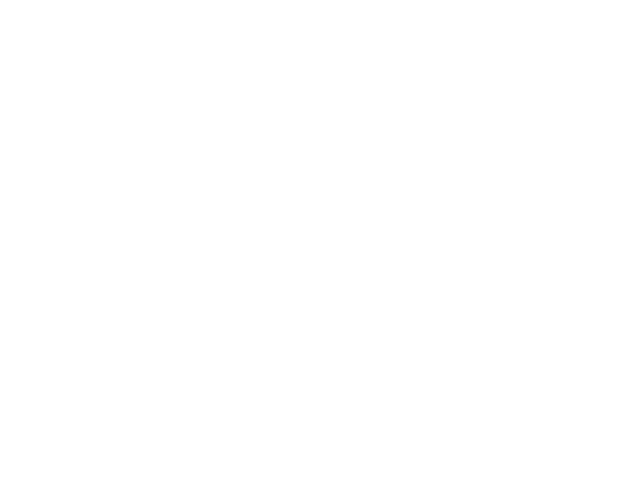

<IPython.core.display.Javascript object>


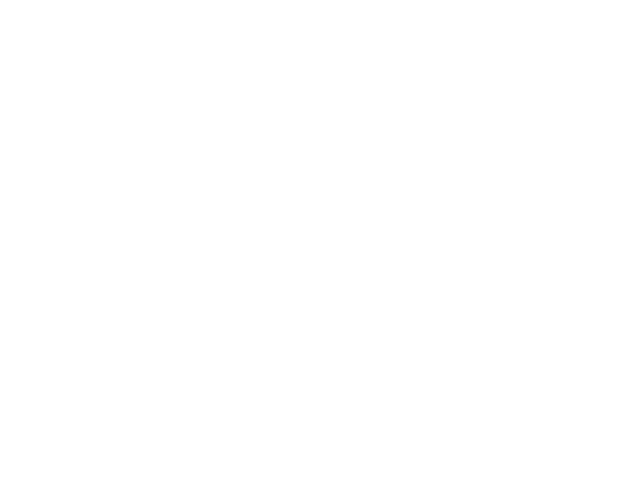

<IPython.core.display.Javascript object>


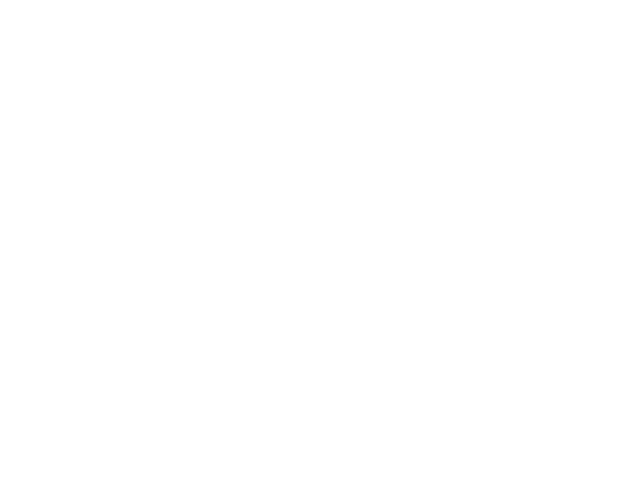

New video was added to the project! Use the function 'extract_frames' to select frames for labeling.
The outlier frames are extracted. They are stored in the subdirectory labeled-data\vIRt32_0419_5129.
Once you extracted frames for all videos, use 'refine_labels' to manually correct the labels.


In [16]:
deeplabcut.extract_outlier_frames(path_config_file,['videos\\vIRt32_0410_4910.mp4','videos\\vIRt32_0419_5129.mp4'])

## Refine Labels [optional step]
Following the extraction of outlier frames, the user can use the following function to move the predicted labels to the correct location. Thus augmenting the training dataset.

In [ ]:
%gui wx
deeplabcut.refine_labels(path_config_file)

Windows
Checking labels if they are outside the image
Windows
Checking labels if they are outside the image
Closing... The refined labels are stored in a subdirectory under labeled-data. Use the function 'merge_datasets' to augment the training dataset, and then re-train a network using create_training_dataset followed by train_network!


In [3]:
#Once all folders are relabeled, check them and advance. See how to check labels, above!
deeplabcut.merge_datasets(path_config_file)

Merged data sets and updated refinement iteration to 1.
Now you can create a new training set for the expanded annotated images (use create_training_dataset).


## Create a new iteration of training dataset [optional step]
Following the refine labels, append these frames to the original dataset to create a new iteration of training dataset.

In [4]:
deeplabcut.create_training_dataset(path_config_file)

V:\ProgramData\Anaconda3\envs\dlc-windowsGPU\lib\site-packages\deeplabcut\generate_training_dataset\trainingsetmanipulation.py:328: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  docs.append(yaml.load(raw_doc))


The training dataset is successfully created. Use the function 'train_network' to start training. Happy training!


## Create labeled video
This funtion is for visualiztion purpose and can be used to create a video in .mp4 format with labels predicted by the network. This video is saved in the same directory where the original video resides. 

In [11]:
deeplabcut.create_labeled_video(path_config_file,videofile_path)

Starting %  D:\Vincent\vIRt32\vIRt32_0419\vIRt32_0419_4964_Analysis ['D:\\Vincent\\vIRt32\\vIRt32_0419\\vIRt32_0419_4964_Analysis\\vIRt32_0419_4964.mp4']
Loading  D:\Vincent\vIRt32\vIRt32_0419\vIRt32_0419_4964_Analysis\vIRt32_0419_4964.mp4 and data.
False 0 640 0 480
308511
Duration of video [s]:  12340.44 , recorded with  25.0 fps!
Overall # of frames:  308511 with cropped frame dimensions:  640 480
Generating frames and creating video.


100%|█████████████████████████████████████████████████████████████████████████| 308511/308511 [18:15<00:00, 281.71it/s]


## Plot the trajectories of the analyzed videos
This function plots the trajectories of all the body parts across the entire video. Each body part is identified by a unique color.

videos\vIRt32_0410_4910.mp4
Starting %  videos ['videos\\vIRt32_0410_4910.mp4', 'videos\\vIRt32_0419_5129.mp4']
videos  already exists!
Loading  videos\vIRt32_0410_4910.mp4 and data.


<IPython.core.display.Javascript object>


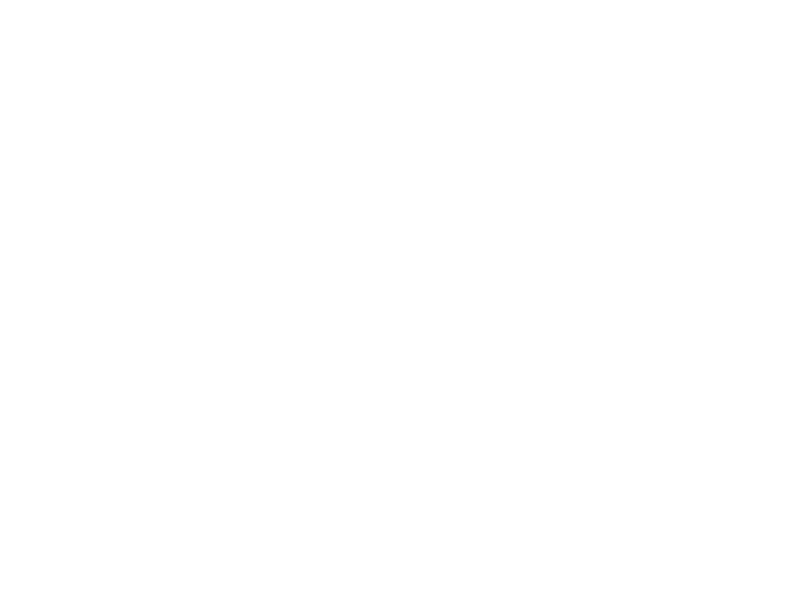

<IPython.core.display.Javascript object>


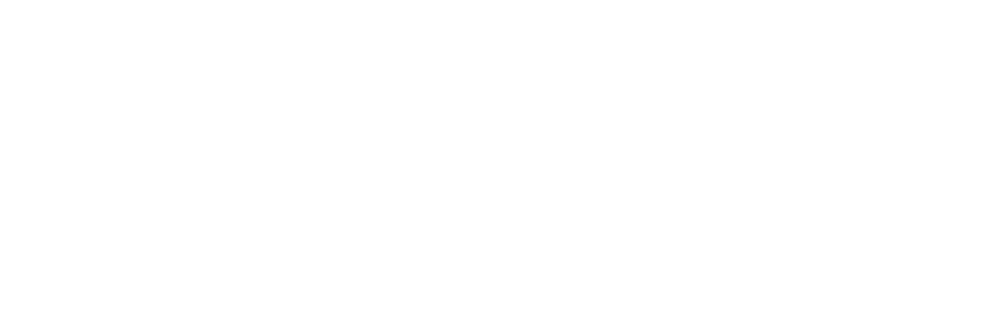

<IPython.core.display.Javascript object>


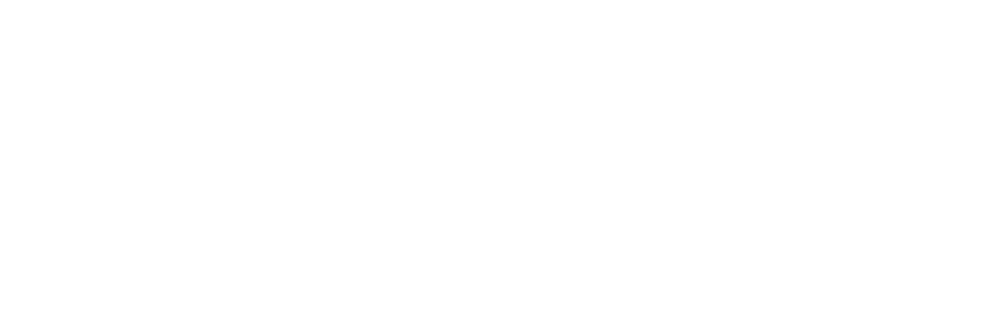

<IPython.core.display.Javascript object>


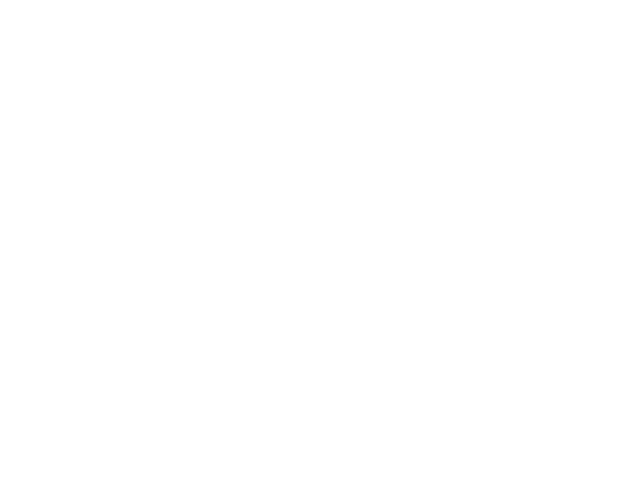

Plots created! Please check the directory "plot-poses" within the video directory
videos\vIRt32_0419_5129.mp4
Starting %  videos ['videos\\vIRt32_0410_4910.mp4', 'videos\\vIRt32_0419_5129.mp4']
videos  already exists!
videos\plot-poses  already exists!
Loading  videos\vIRt32_0419_5129.mp4 and data.


<IPython.core.display.Javascript object>


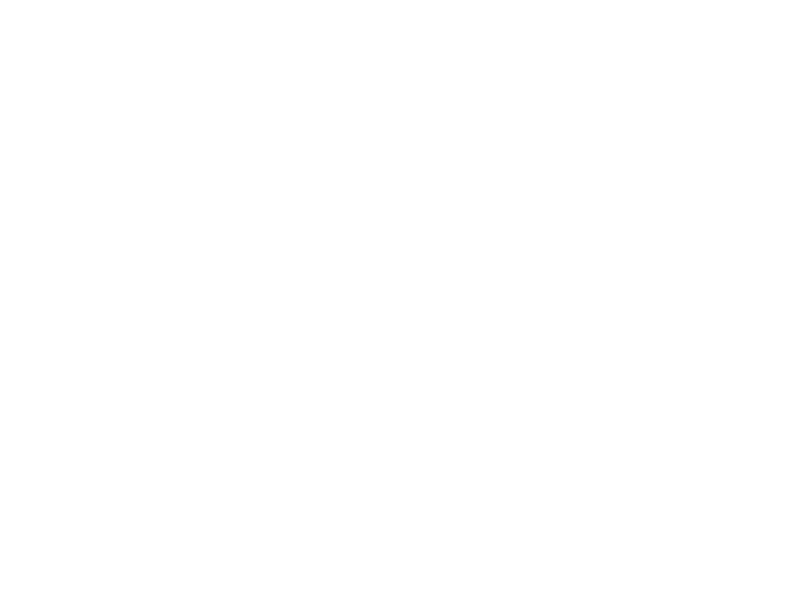

<IPython.core.display.Javascript object>


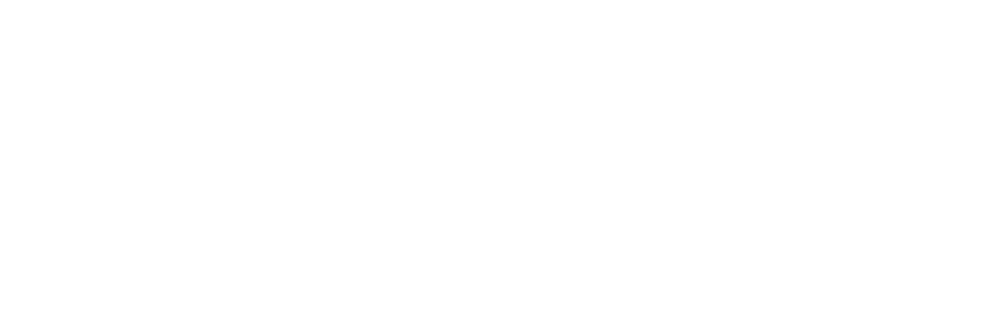

<IPython.core.display.Javascript object>


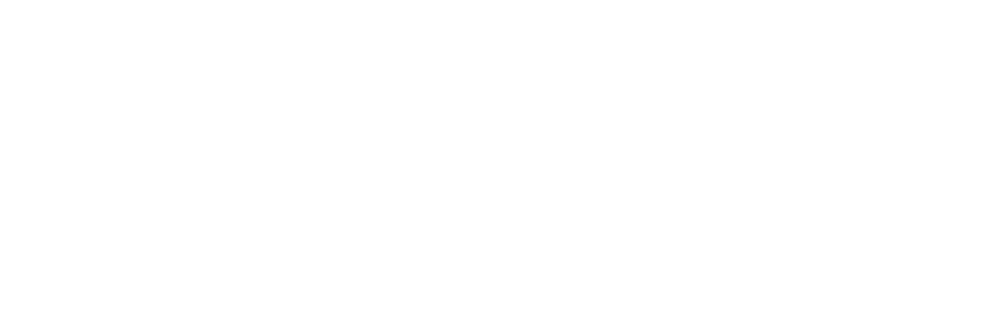

<IPython.core.display.Javascript object>


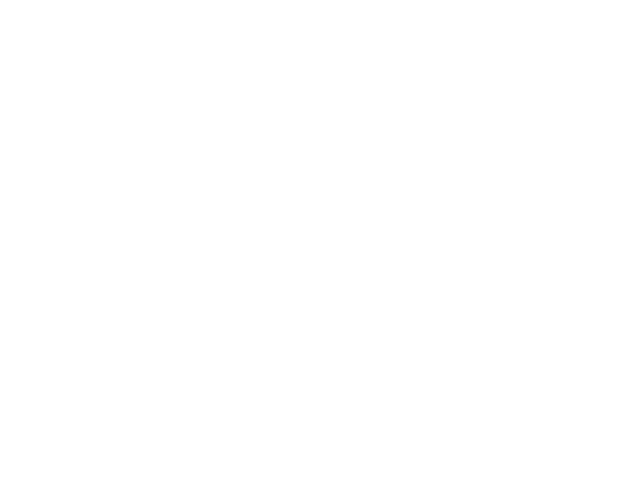

Plots created! Please check the directory "plot-poses" within the video directory


In [14]:
%matplotlib notebook
deeplabcut.plot_trajectories(path_config_file,videofile_path)